## TOC:
* [Reading CVS files](#first-bullet)
* [Luminosity section](#second-bullet)
* [Trigger rate section](#third-bullet)
* [Model inference section](#fourth-bullet)

In [1]:
import math
import numpy as np
import pandas as pd
import tensorflow as tf

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from mpl_toolkits.axes_grid1 import make_axes_locatable

from scipy import ndimage, misc
import datetime
from datetime import timedelta

import keras
from keras import backend as K
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.models import Sequential, load_model
from keras.layers import Dense, Flatten, Reshape, Conv1D, \
MaxPooling1D, AveragePooling1D, UpSampling1D, InputLayer

from scipy import ndimage, misc

from sklearn import svm
from sklearn.ensemble import IsolationForest
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc
from sklearn.model_selection import cross_val_score, train_test_split,\
StratifiedKFold, GridSearchCV
from sklearn.preprocessing import MaxAbsScaler

Using TensorFlow backend.


In [2]:
# Change presentation settings
%matplotlib inline

matplotlib.rcParams["figure.figsize"] = (15.0, 8.0)
matplotlib.rcParams["xtick.labelsize"] = 16
matplotlib.rcParams["ytick.labelsize"] = 16
matplotlib.rcParams["axes.spines.left"] = True
matplotlib.rcParams["axes.spines.bottom"] = True
matplotlib.rcParams["axes.spines.right"] = True
matplotlib.rcParams["axes.spines.top"] = True
matplotlib.rcParams["axes.titlesize"] = 16
matplotlib.rcParams["figure.titlesize"] = 16
matplotlib.rcParams["axes.labelsize"] = 14
matplotlib.rcParams["legend.fontsize"] = 14

In [3]:
runs = [302634, 302635, 306125]
lumi_directory = data_directory = "./lumi"
rates_directory = "./rates"

# Reading cvs files <a class="anchor" id="first-bullet"></a>

Reading instantaneous luminosities from the cvs file produced with brilcalc and saving into a pandas dataframe:

In [4]:
df_rates = pd.DataFrame()
int_lumi2 = pd.DataFrame()
for run in runs:
    print("Loading %s" % run)
    path = "%s/lumi_%s.csv" % (lumi_directory, run)
    int_lumi2 = int_lumi2.append(pd.read_csv(path,
        names=["runfill", "ls", "time", "beamstatus", "energy", "delivered",\
               "recorded", "avgpu", "source"]), 
        ignore_index=True);    
    path = "%s/dt_rates_%s.csv" % (rates_directory, run)
    df_rates = df_rates.append(pd.read_csv(path, 
        names=["run", "time", "board", "RPC1", "RPC2", "RPC3", "RPC4",\
               "DT1", "DT2", "DT3", "DT4", "DT5"]), 
        ignore_index=True);
print("Done.")

Loading 302634
Loading 302635
Loading 306125
Done.


# Luminosity section <a class="anchor" id="second-bullet"></a>

Dropping useless rows inherited from the lumi CVS file:

In [5]:
int_lumi2["source"] = int_lumi2["source"].astype('str')
int_lumi2 = int_lumi2[int_lumi2["source"] != "nan"]
int_lumi2 = int_lumi2[int_lumi2["source"] != "source"]

Splitting run:fill field and the start and end lumi sections:

In [6]:
int_lumi2['run'], int_lumi2['fill'] = int_lumi2['runfill'].str.split(':', 1).str
int_lumi2['ls_start'], int_lumi2['ls_end'] = int_lumi2['ls'].str.split(':', 1).str

Converting run to integer and luminosities to float:

In [7]:
int_lumi2["run"] = int_lumi2["run"].astype('int')
int_lumi2["ls_start"] = int_lumi2["ls_start"].astype('int')
int_lumi2["ls_end"] = int_lumi2["ls_end"].astype('int')
int_lumi2["delivered"] = int_lumi2["delivered"].astype('float64')
int_lumi2["recorded"] = int_lumi2["recorded"].astype('float64') 

Converting time stamp to datetime:

In [8]:
def transform_time(data):
    from datetime import datetime
    time_str = data.time
    #print time_str
    datetime_object = datetime.strptime(time_str, "%m/%d/%y %H:%M:%S")
    #print datetime_object
    return datetime_object
int_lumi2["time"] = int_lumi2.apply(transform_time, axis=1);

Creating end time column from the start time:

In [9]:
int_lumi2["time_end"] = int_lumi2["time"]

Finding the runs and their start and end times:

In [10]:
boundaries = pd.DataFrame(columns=["run", "start", "end", "ls_start", "ls_end", "nLS"])
for i in runs:
    start = int_lumi2[int_lumi2["run"] == i]["time"]
    end = int_lumi2[int_lumi2["run"] == i]["time_end"]
    start_ls = int_lumi2[int_lumi2["run"] == i]["ls_start"]
    end_ls = int_lumi2[int_lumi2["run"] == i]["ls_end"]
    start =  start.reset_index(drop=True)
    end =  end.reset_index(drop=True)
    start_ls =  start_ls.reset_index(drop=True)
    end_ls =  end_ls.reset_index(drop=True)
    nLS = int(start_ls.iloc[-1]) - int(start_ls.iloc[0]) + 1
    print i, start.iloc[0], start.iloc[-1], start_ls.iloc[0], start_ls.iloc[-1], nLS
    boundaries = boundaries.append({"run": i, "start": start.iloc[0], "end": start.iloc[-1], 
                                   "ls_start": start_ls.iloc[0], "ls_end": start_ls.iloc[-1], "nLS": nLS}, 
                                   ignore_index = True)

302634 2017-09-12 01:07:57 2017-09-12 05:17:46 1 644 644
302635 2017-09-12 05:18:01 2017-09-12 13:42:19 1 1299 1299
306125 2017-11-03 14:46:12 2017-11-04 10:14:06 1 3007 3007


Reindexing the dataframe after removing some lines:

In [11]:
int_lumi2.index = pd.RangeIndex(len(int_lumi2.index))

In [12]:
print len(int_lumi2.index)

4950


Filling end time column:

In [13]:
def addTimeOffSet(startdate):
    enddate = pd.to_datetime(startdate) + pd.DateOffset(seconds=23)
    return enddate

def shiftElement(df, boundaries):
    run0 = boundaries["run"].iloc[0]
    for index, rows in df.iterrows():
        run = rows["run"]
        nls = int(boundaries[boundaries["run"] == run]["nLS"])
        if(run > run0):
            nls = nls + index
        #print run, nls
        if((index < nls) & (index < len(int_lumi2.index)-1)):
            #print index, run, rows["time"], df["time"][index+1]
            df.loc[index, "time_end"] = df["time"][index+1]
        elif (index == len(int_lumi2.index)-1):
            #print index, run, rows["time"], addTimeOffSet(rows["time"])
            df.loc[index, "time_end"] = addTimeOffSet(rows["time"])
                    
shiftElement(int_lumi2, boundaries)

In [14]:
#print int_lumi2["beamstatus"]
int_lumi2 = int_lumi2[int_lumi2["beamstatus"] == "STABLE BEAMS"]

Plotting the instantaneous luminosities:

In [15]:
def plot_inst_lumi(x_val, y_val, z_val, title):
    fig, ax = plt.subplots()
    plt.xlabel("Time")
    plt.ylabel(r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]")
    xfmt = mdates.DateFormatter('%y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)
    ax.grid()
    fig.autofmt_xdate()
    plt.plot(x_val, y_val, 'ro-')
    plt.plot(x_val, z_val, 'bo-')
    plt.title(title)
    plt.legend(loc="best")
    plt.show();

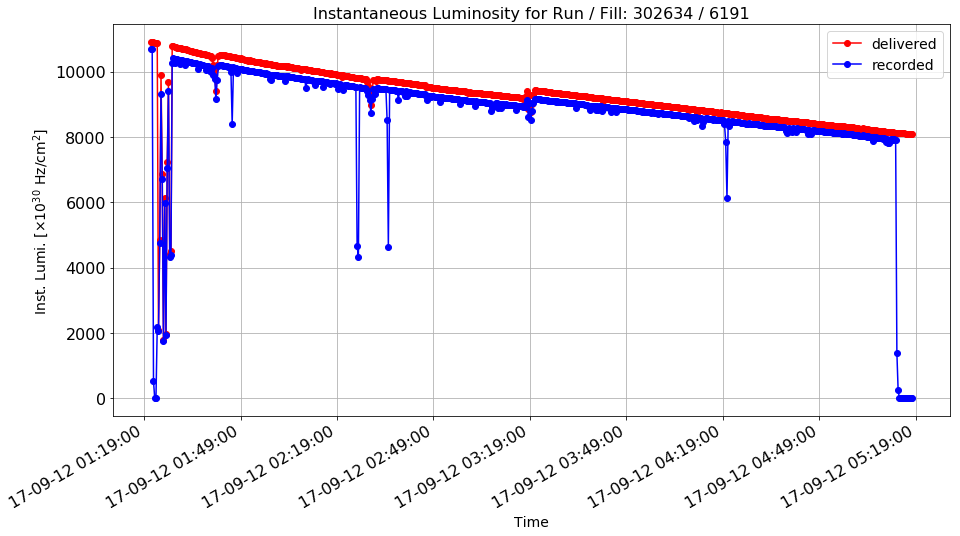

In [16]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 302634]["time"], 
               int_lumi2[int_lumi2["run"] == 302634]["delivered"], 
               int_lumi2[int_lumi2["run"] == 302634]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               (boundaries["run"].iloc[0], int_lumi2["fill"].iloc[0])))

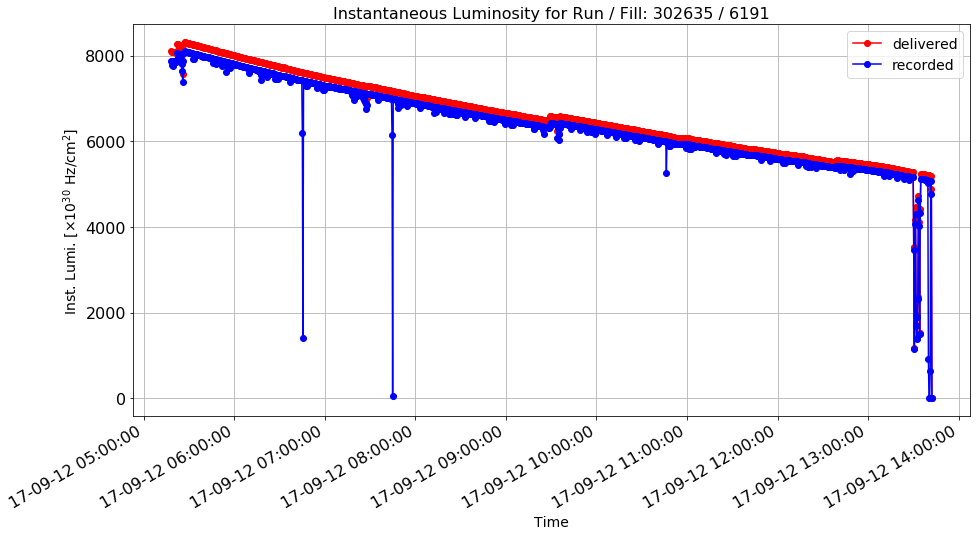

In [17]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 302635]["time"], 
               int_lumi2[int_lumi2["run"] == 302635]["delivered"], 
               int_lumi2[int_lumi2["run"] == 302635]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               (boundaries["run"].iloc[1], int_lumi2["fill"].iloc[0])))

In [18]:
int_lumi2.to_csv("int_lumi_issues.csv", sep='\t')

# Trigger rate section <a class="anchor" id="third-bullet"></a>

Converting columns to proper data types:

In [19]:
df_rates["time"] = pd.to_datetime(df_rates["time"])
df_rates["run"] = df_rates["run"].astype('int')
#print df_rates["time"]

Splitting, converting and adding new columns:

In [20]:
df_rates['wheel'], df_rates['sector'] = df_rates['board'].str.split('_', 1).str
df_rates["wheel"] = df_rates["wheel"].astype(str)
df_rates["sector"] = df_rates["sector"].astype(str)

In [21]:
df_rates["wheel"].replace(regex=True,inplace=True,to_replace=r'YB',value=r'')
df_rates["sector"].replace(regex=True,inplace=True,to_replace=r'S',value=r'')
df_rates["wheel"] = df_rates["wheel"].astype('int')
df_rates["sector"] = df_rates["sector"].astype('int')
df_rates["ls"] = -1
df_rates["lumi"] = -1.0
df_rates["score"] = -1
df_rates.to_csv("df_rates.csv", sep='\t')

Plotting the rate coming from one of the stations:

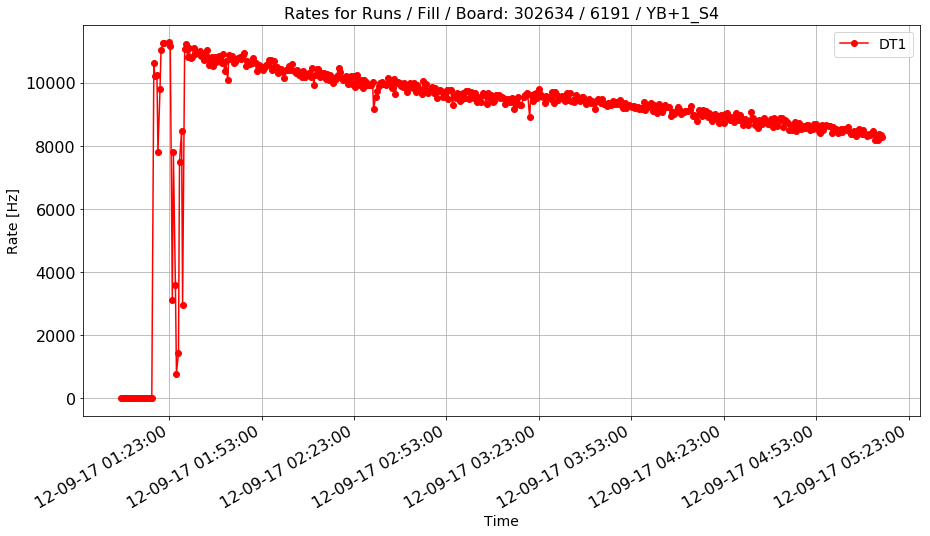

In [22]:
def plot_rate_vs_time(df, x_val, y_val, z_val, title):
    df_temp = df.copy()
    crit = df_temp["board"] == z_val
    df_temp = df_temp[crit]
    fig, ax = plt.subplots()
    plt.xlabel("Time")
    plt.ylabel("Rate [Hz]")
    ax.xaxis_date()
    xfmt = mdates.DateFormatter('%d-%m-%y %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)
    ax.grid()
    fig.autofmt_xdate()
    plt.plot(df_temp[x_val], df_temp[y_val], 'ro-')
    plt.title(title)
    plt.legend(loc="best")
    plt.show();

plot_rate_vs_time(df_rates[df_rates.run == 302634], "time", "DT1",\
                  "YB+1_S4", "Rates for Runs / Fill / Board: %s / %s / %s" % \
                  ("302634", int_lumi2["fill"].iloc[2], "YB+1_S4"))

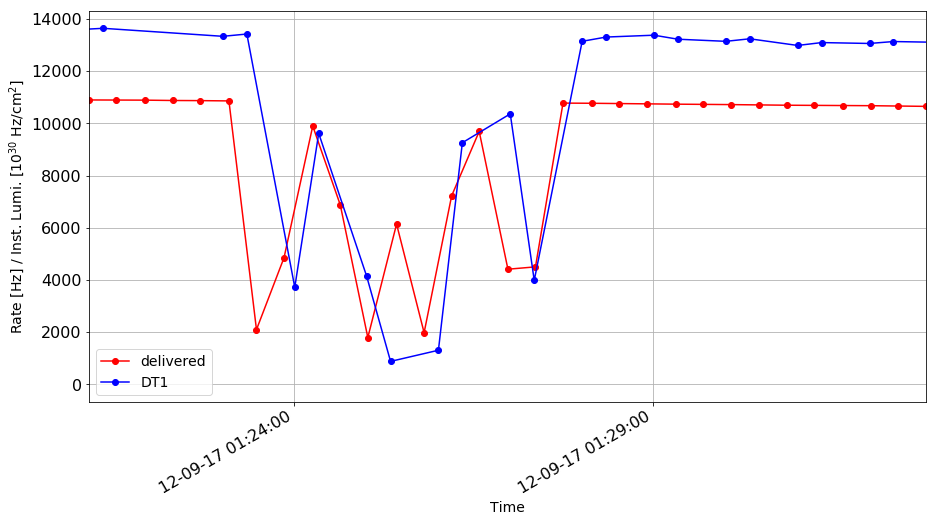

In [23]:
fig, ax = plt.subplots()
#ax.set_yscale('log')
plt.xlabel("Time")
plt.ylabel("Rate [Hz] / Inst. Lumi. [10$^{30}$ Hz/cm$^2$]")
plt.xlim(int_lumi2[int_lumi2["run"] == 302634]["time"].iloc[0],\
         int_lumi2[int_lumi2["run"] == 302634]["time"].iloc[30])
ax.xaxis_date()
xfmt = mdates.DateFormatter('%d-%m-%y %H:%M:%S')
ax.xaxis.set_major_formatter(xfmt)
ax.grid()
fig.autofmt_xdate()
plt.plot(int_lumi2[int_lumi2["run"] == 302634]["time"],\
         int_lumi2[int_lumi2["run"] == 302634]["delivered"], 'ro-')
rule = (df_rates.run == 302634) & (df_rates.board == "YB+1_S3")
plt.plot(df_rates[rule]["time"], df_rates[rule]["DT1"], 'bo-')
plt.title("")
plt.legend(loc='best')
plt.show()

Associating a LS and an instantaneous luminosity to each rate:

In [24]:
#Just a backup copy
df_rates_backup = df_rates.copy()

In [25]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

Removing the measurements taken before and after the start and end time reported by the brilcalc output. All the 60 boards are measured at the same time. In order to speed-up the association, we take just one board, the first one. This reduces the dataframe and the time needed to go though it by a factor of 60.

In [26]:
time0 = boundaries["start"].iloc[0]
timeF = boundaries["end"].iloc[-1]
print time0, timeF
#print df_rates[(df_rates.time >= time0) & (df_rates.time <= timeF)]
df_rates = df_rates[(df_rates.time >= time0) & (df_rates.time <= timeF)]
rule = df_rates.duplicated(subset=["time"])
count = (rule == False).sum()
print "Duplicates:", rule.sum()
df_rates_noduplicates = df_rates[rule == False]
#print df_rates_noduplicates

2017-09-12 01:07:57 2017-11-04 10:14:06
Duplicates: 1369390


In [27]:
print len(df_rates_noduplicates)

23210


Assigning the LS and the inst. lumi. to the measurements for the selected board:

In [28]:
def assignLS(df1, df2, boundaries):
    temp = df1.copy()
    j = 1
    for index1, row1 in df1.iterrows():
        run1 = row1["run"]
        time1 = row1["time"]
        #print index1, run1, time1
        ti = time1 - 2*pd.DateOffset(seconds=23)
        tf = time1 + 2*pd.DateOffset(seconds=23)
        indexes2 = df2[(df2.run == run1) & (df2.time > ti) & (df2.time < tf)].index
        #print indexes2
        for i in indexes2:
            if((time1 >= df2["time"].loc[i]) & (time1 < df2["time_end"].loc[i])):
                #print time1, df2["time"].loc[i], df2["time_end"].loc[i]
                if(j%1000 == 0): 
                    print j
                j = j + 1
                ls = df2["ls_start"].loc[i]
                lumi = df2["delivered"].loc[i]
                #print index1, run1, time1, ls, lumi
                temp.loc[index1, "ls"] = ls
                temp.loc[index1, "lumi"] = lumi
                break
    return temp

temp = assignLS(df_rates_noduplicates, int_lumi2, boundaries)
df_rates_noduplicates = temp

1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000


Removing the few cases not assigned and that are still at -1:

In [29]:
df_rates_noduplicates = df_rates_noduplicates[df_rates_noduplicates["ls"] > 0]
print len(df_rates_noduplicates)

23176


Save in a csv file:

In [30]:
df_rates.to_csv("df_rates_issues.csv", sep='\t')
df_rates_noduplicates.to_csv("df_rates_nodup_issues.csv", sep='\t')

In [31]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

Assign the LS and the inst. lumi. to all the 60 boards for each time:

In [32]:
def assignLS_ext(df1, df2):
    temp = df1.copy()
    indexes = []
    for index in df2.index:
        if index%10000 == 0:
            print index
        time = df2["time"].loc[index]
        ls = df2["ls"].loc[index]
        lumi = df2["lumi"].loc[index]
        des = (temp["time"] == time)
        indexes = temp[des].index
        #print time, ls, indexes
        temp.loc[des, "ls"] = ls
        temp.loc[des, "lumi"] = lumi
    return temp
    
temp = assignLS_ext(df_rates, df_rates_noduplicates)

30000
60000
90000
120000
150000
180000
210000
240000
270000
300000
330000
360000
390000
420000
450000
480000
510000
540000
570000
600000
630000
660000
690000
720000
750000
780000
810000
840000
870000
900000
930000
960000
990000
1020000
1050000
1080000
1110000
1140000
1170000
1200000
1230000
1260000
1290000
1320000
1350000
1380000


Save another backup copy:

In [33]:
df_rates = temp.copy()
#print df_rates[df_rates.ls <= 0]

Removing measurements without LS assignment:

In [34]:
df_rates_backup = df_rates.copy()
df_rates = df_rates[df_rates.ls > 0]
#print df_rates["ls"]

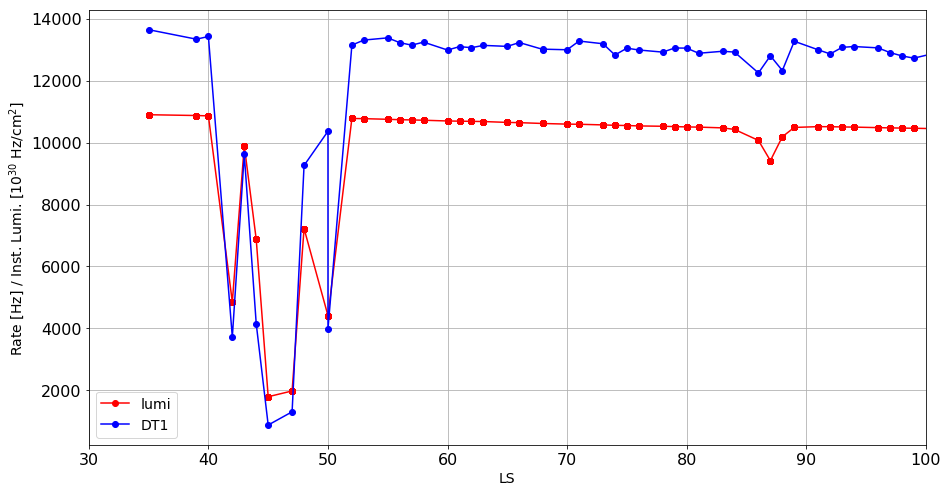

In [35]:
fig, ax = plt.subplots()
#ax.set_yscale('log')
plt.xlabel("LS")
plt.ylabel("Rate [Hz] / Inst. Lumi. [10$^{30}$ Hz/cm$^2$]")
plt.xlim(30, 100)
ax.grid()
plt.plot(df_rates[df_rates["run"] == 302634]["ls"],\
         df_rates[df_rates["run"] == 302634]["lumi"], 'ro-')
rule = (df_rates.run == 302634) & (df_rates.board == "YB+1_S3")
plt.plot(df_rates[rule]["ls"], df_rates[rule]["DT1"], 'bo-')
plt.title("")
plt.legend(loc='best')
plt.show()

In [36]:
#print df_rates[df_rates.ls <= 0]
df_rates.to_csv("df_rates_issues.csv", sep='\t')

Averaging the rates associated to the same LS:

In [37]:
df_boards = df_rates.copy()
df_boards = df_boards.groupby(['board']).size().reset_index(name='counts')
print len(df_boards)
#print df_boards

60


Too slow to use all the measurements. Averaging over 10 LS:

In [38]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

In [39]:
bunch = 10
def assignGroup(data, div = bunch):
    res = int(data/div)
    #print data, res
    return res

df_rates["group"] = df_rates["ls"]
df_rates["group"] = df_rates["group"].apply(assignGroup)

In [40]:
temp1 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["ls", "lumi", "RPC1", "RPC2", "RPC3", "RPC4", "DT1", "DT2", "DT3", "DT4", "DT5"]].mean().reset_index()

temp2 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["lumi", "RPC1", "RPC2", "RPC3", "RPC4", "DT1", "DT2", "DT3", "DT4", "DT5"]].std().reset_index()

temp3 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["lumi", "RPC1", "RPC2", "RPC3", "RPC4", "DT1", "DT2", "DT3", "DT4", "DT5"]]\
.size().reset_index(name='counts')

temp2 = temp2.rename(index=str, columns={"lumi": "errLumi", "RPC1": "errRPC1", "RPC2": "errRPC2",\
                                         "RPC3": "errRPC3", "RPC4": "errRPC4", "DT1": "errDT1",\
                                         "DT2": "errDT2", "DT3": "errDT3",\
                                         "DT4": "errDT4", "DT5": "errDT5"})

cols_to_use2 = temp2.columns.difference(temp1.columns)
cols_to_use3 = temp3.columns.difference(temp1.columns)

temp2 = temp2[cols_to_use2]
temp3 = temp3[cols_to_use3]

#print temp1.iloc[100]
#print temp2.iloc[100]
#print temp3.iloc[100]

temp1.reset_index(drop=True, inplace=True)
temp2.reset_index(drop=True, inplace=True)
temp3.reset_index(drop=True, inplace=True)

df_rates = pd.concat([temp1, temp2, temp3], axis = 1)

Calculating the errors on the mean values calculated in the previous step:

In [41]:
import math
def applySqrt(data):
    return math.sqrt(data)

df_rates["counts"] = df_rates["counts"].apply(applySqrt)

for i in list(df_rates):
    if "err" in i:
        #print i
        df_rates[i] = df_rates[i]/df_rates["counts"]

Check for null or NaN values:

In [42]:
print df_rates.isnull().values.any()
null_columns=df_rates.columns[df_rates.isnull().any()]
print(df_rates[df_rates.isnull().any(axis=1)][null_columns].head())
df_rates = df_rates.fillna(0)
print(df_rates[df_rates.isnull().any(axis=1)][null_columns].head())

False
Empty DataFrame
Columns: []
Index: []
Empty DataFrame
Columns: []
Index: []


In [43]:
#Another backup
#df_rates_backup = df_rates.copy()
#df_rates.to_csv("df_rates_issues.csv", sep='\t')

In [44]:
#Restore backup
#df_rates = df_rates_backup.copy()

In [45]:
print len(df_rates)

29520


Uncomment to check just one case:

In [46]:
#for index, row in df_rates.iterrows():
    #if row["board"] == "YB0_S1":
        #print "Index:", index,", Run:", row["run"],", Board: ",row["board"],",\
        #LS: ",row["ls"],", Rate: ",row["DT1"],", Error: ",row["errDT1"]

Plotting the result:

In [47]:
def calcErr(a, b, err_a, err_b):
    R = 0
    err = 0
    if b:
        R = a/b
        err = (1/b)*math.sqrt(err_a**2 + R**2*err_b**2)
    return err

def plot_ratio_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    fig.autofmt_xdate()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    inter = []
    errors = []
    df_temp["ratio"] = df_temp[x_val]/df_temp[y_val]
    df_temp["errRatio"] = (1/df_temp[y_val])*\
    np.sqrt(df_temp["errLumi"]**2 + df_temp[y_err]**2*df_temp["ratio"]**2)
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        val1 = df_temp[rule][x_val]
        val2 = df_temp[rule]["ratio"]
        inter.append(np.polyfit(val1, val2, 0)) #append anomalous fit,\
                                                #then normal fit, and ratio of the two
        errors.append(df_temp[rule]["errRatio"])
        #plt.plot(df_temp[rule][x_val], df_temp[rule]["ratio"], opt[i], label=str(run[i]))
        newstr = opt[i].replace("o", "")
        plt.errorbar(df_temp[rule][x_val], df_temp[rule]["ratio"], xerr=x_err,\
        yerr=df_temp[rule]["errRatio"], fmt=opt[i], ecolor=newstr, label=str(run[i]))
    a, b, c = inter[0], inter[1], inter[0]/inter[1]-1
    plt.legend(loc="best")
    plt.title(title)
    plt.show()
    return float(a), float(b), float(c)

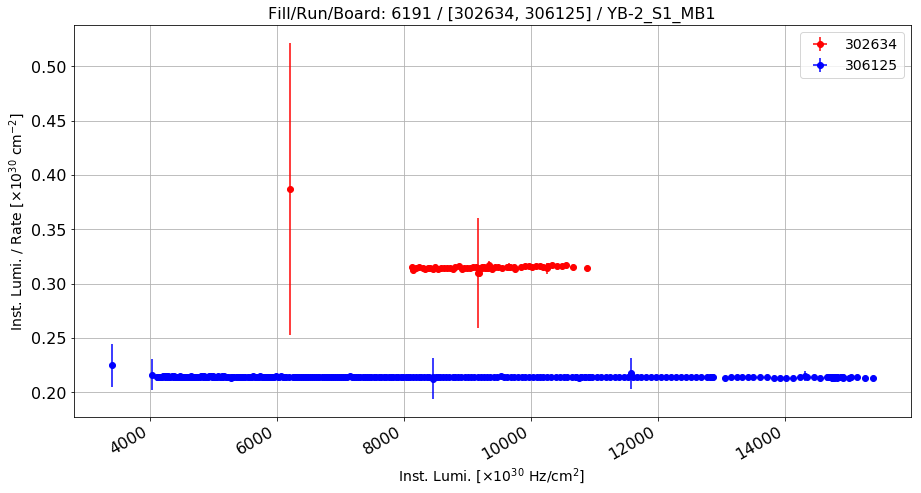

Anomalous Lumi/Rate: 0.315970195572 Normal Lumi/Rate: 0.214140527405 Ratio: 0.475527306301


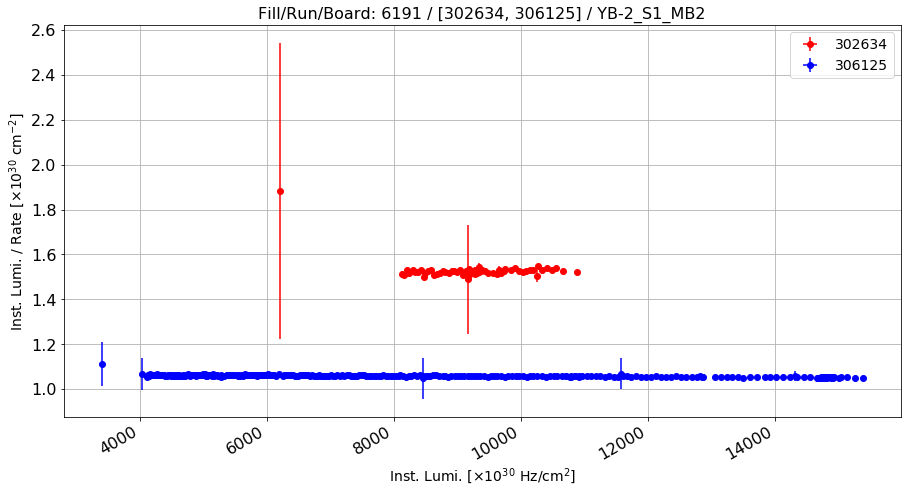

Anomalous Lumi/Rate: 1.52972825451 Normal Lumi/Rate: 1.05871299826 Ratio: 0.444894184754


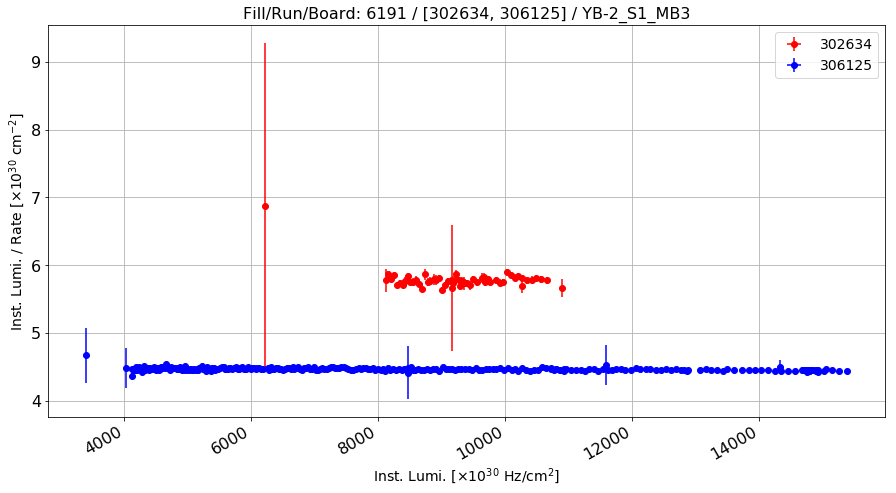

Anomalous Lumi/Rate: 5.7867788446 Normal Lumi/Rate: 4.46578424124 Ratio: 0.295803498783


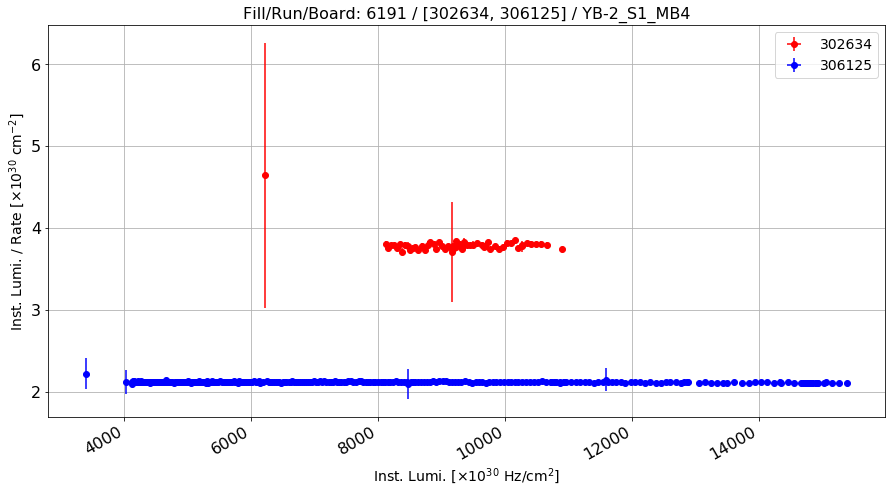

Anomalous Lumi/Rate: 3.79631582836 Normal Lumi/Rate: 2.11756882012 Ratio: 0.792770932541


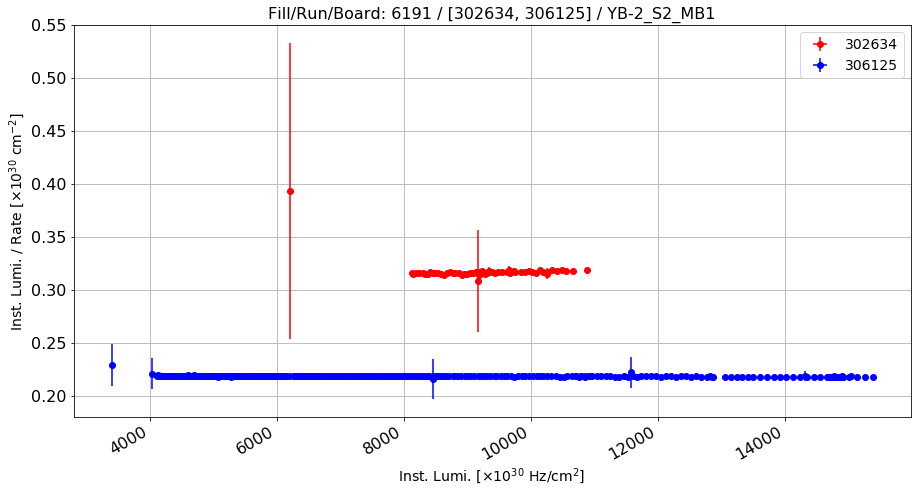

Anomalous Lumi/Rate: 0.317597529334 Normal Lumi/Rate: 0.218460761197 Ratio: 0.45379667998


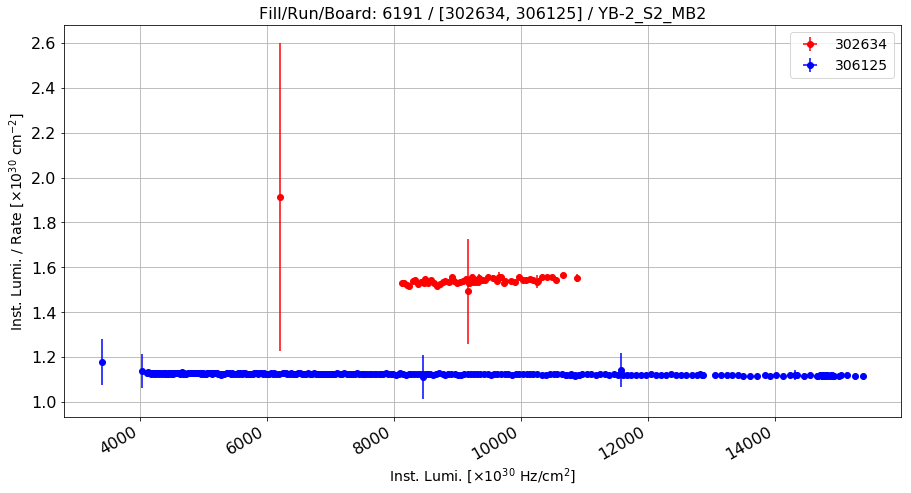

Anomalous Lumi/Rate: 1.54583776519 Normal Lumi/Rate: 1.12430842803 Ratio: 0.374923220939


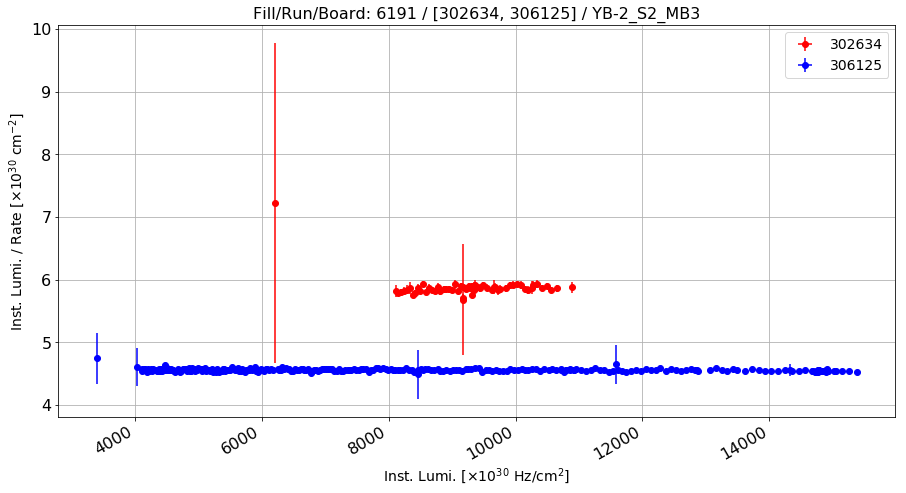

Anomalous Lumi/Rate: 5.87762397546 Normal Lumi/Rate: 4.56131119146 Ratio: 0.28858210474


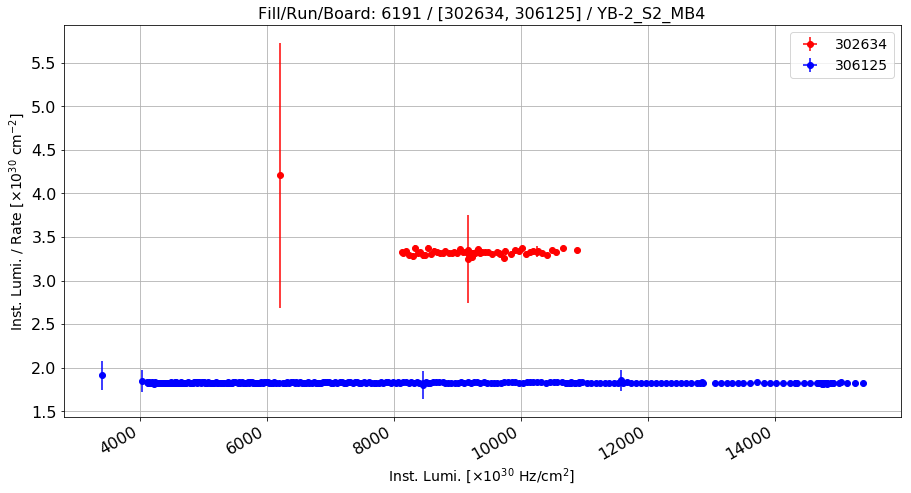

Anomalous Lumi/Rate: 3.33732761067 Normal Lumi/Rate: 1.82742789821 Ratio: 0.826243111393


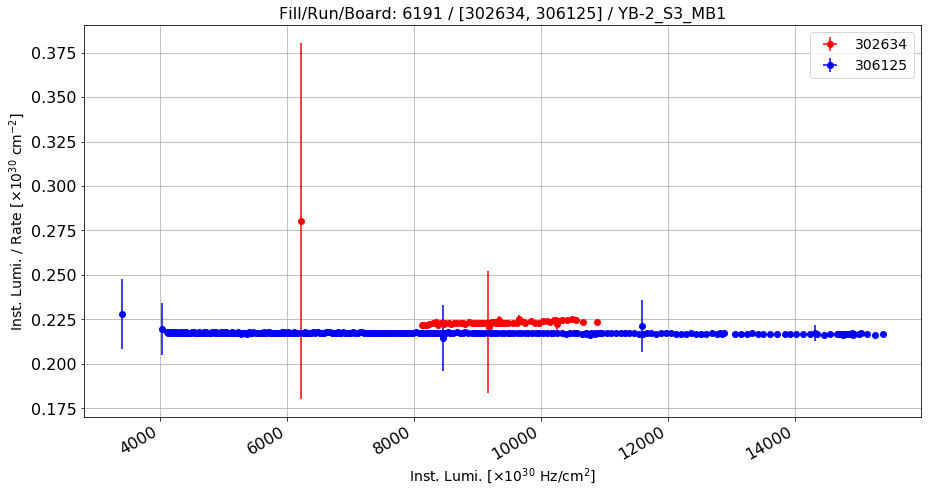

Anomalous Lumi/Rate: 0.224074911269 Normal Lumi/Rate: 0.217376849071 Ratio: 0.0308131350102


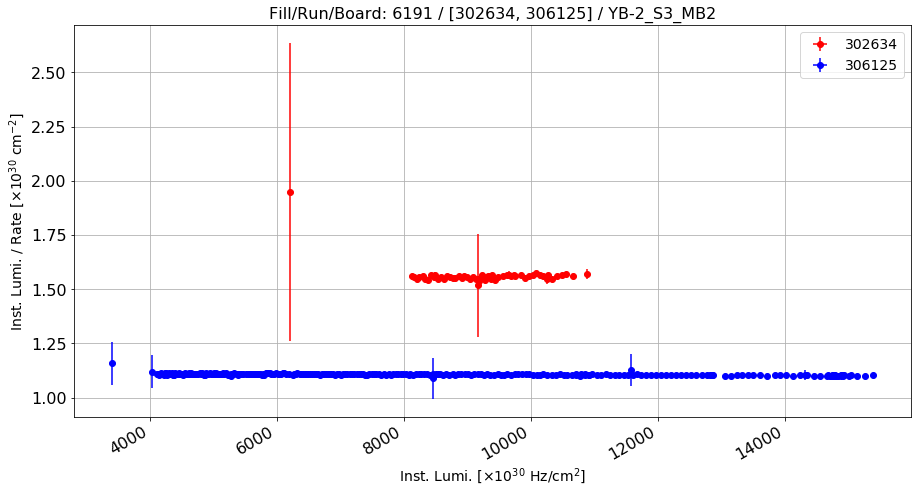

Anomalous Lumi/Rate: 1.56283389154 Normal Lumi/Rate: 1.10697937454 Ratio: 0.411800370886


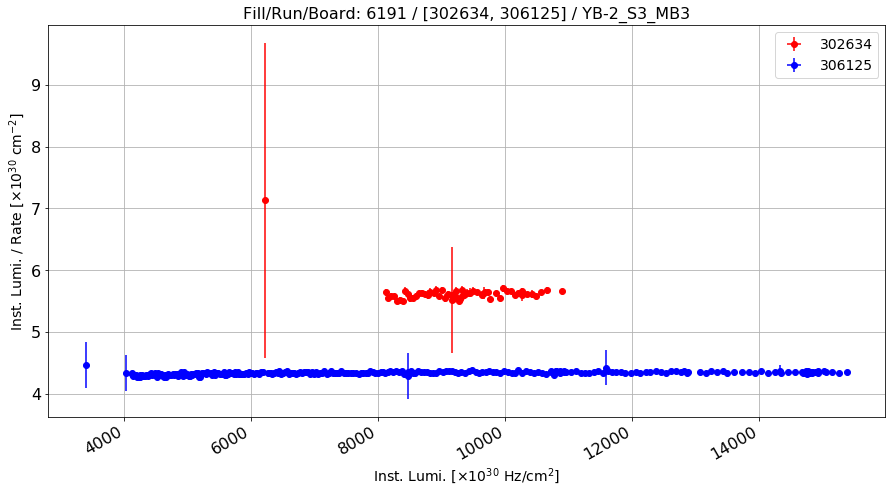

Anomalous Lumi/Rate: 5.63462976322 Normal Lumi/Rate: 4.33911547005 Ratio: 0.298566447957


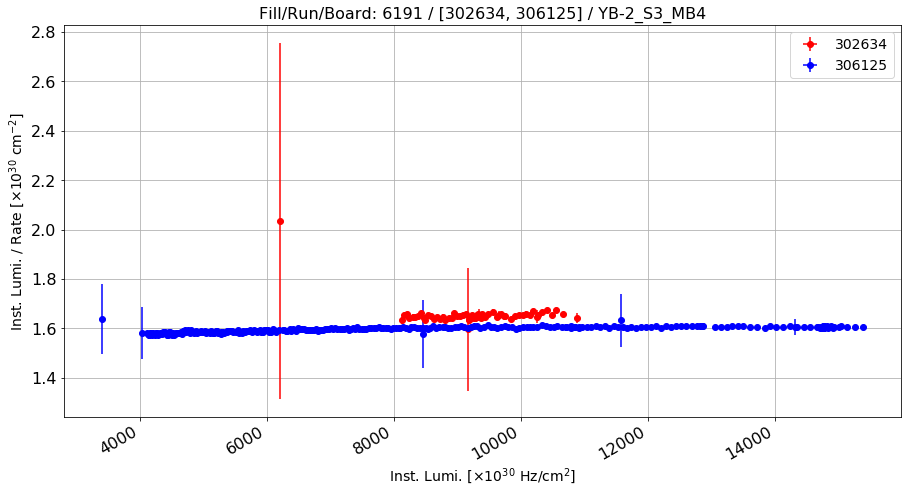

Anomalous Lumi/Rate: 1.65636258622 Normal Lumi/Rate: 1.59702287401 Ratio: 0.0371564572913


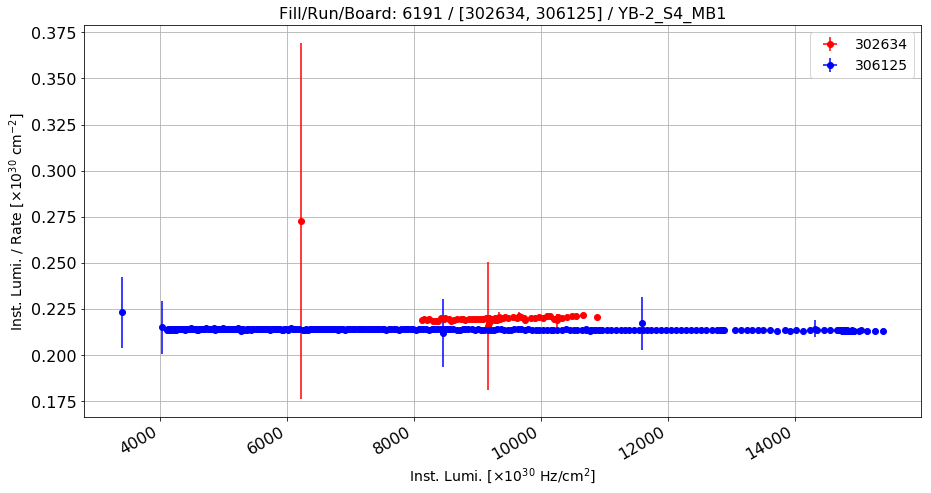

Anomalous Lumi/Rate: 0.220729267837 Normal Lumi/Rate: 0.214008046831 Ratio: 0.0314063938526


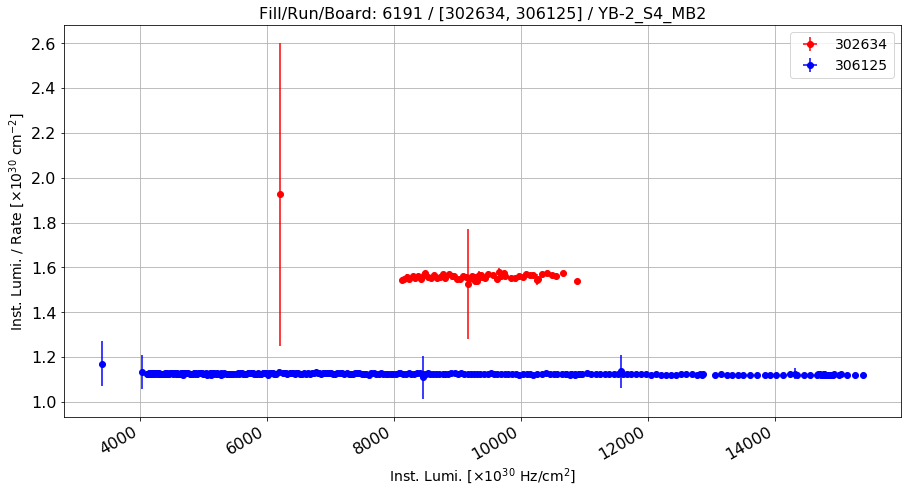

Anomalous Lumi/Rate: 1.56383531125 Normal Lumi/Rate: 1.1250916677 Ratio: 0.389962574736


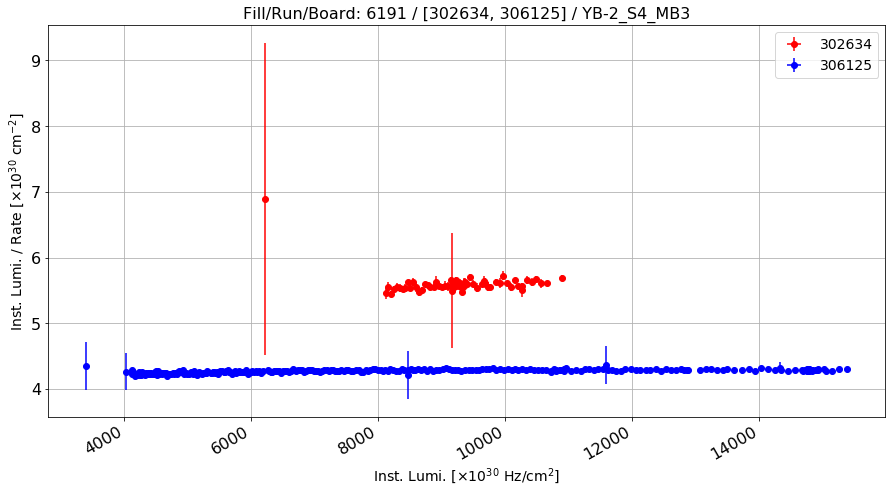

Anomalous Lumi/Rate: 5.60432568871 Normal Lumi/Rate: 4.27474902779 Ratio: 0.311030344068


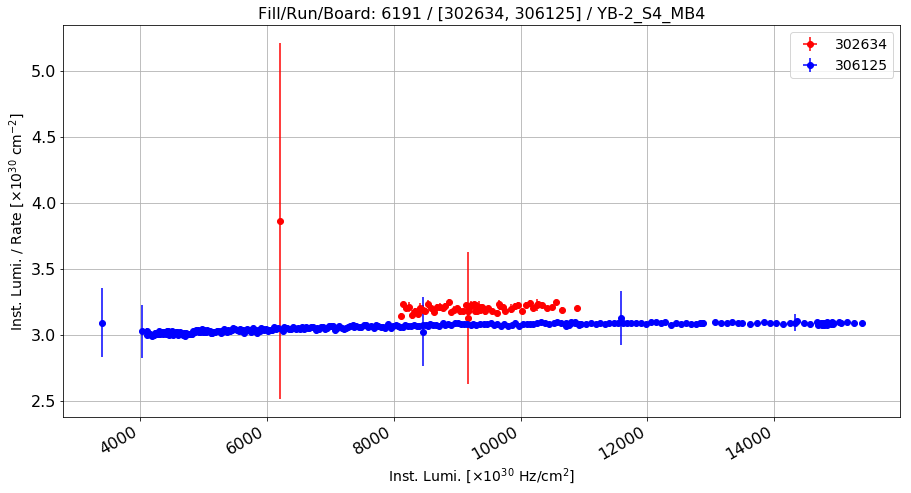

Anomalous Lumi/Rate: 3.21375115845 Normal Lumi/Rate: 3.05853064443 Ratio: 0.0507500274041


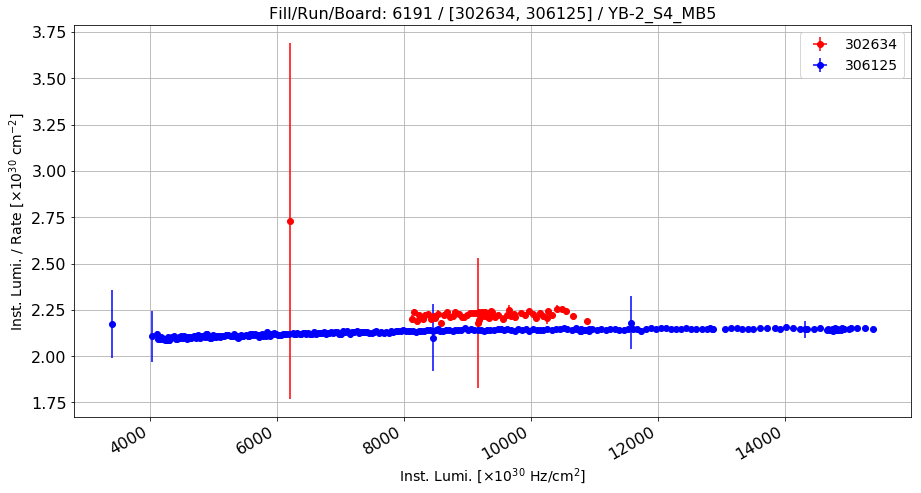

Anomalous Lumi/Rate: 2.22931286536 Normal Lumi/Rate: 2.12804505046 Ratio: 0.0475872514442


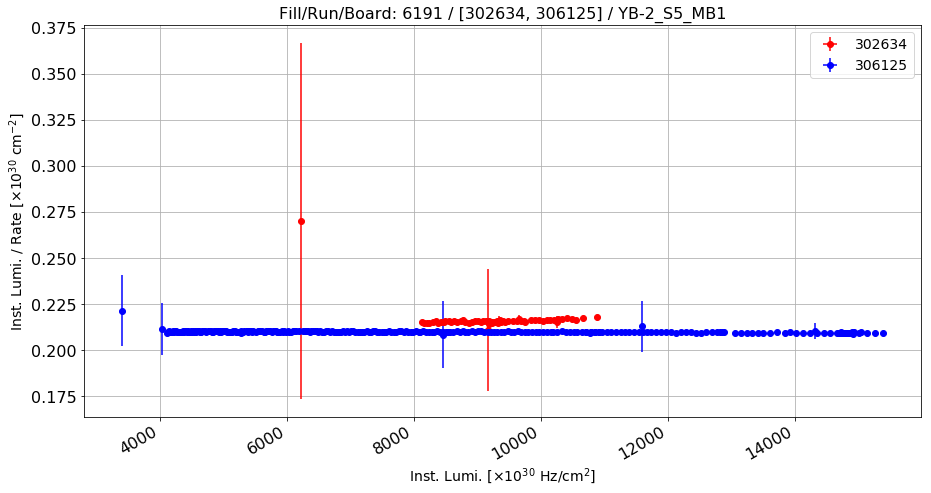

Anomalous Lumi/Rate: 0.216647750632 Normal Lumi/Rate: 0.210083987303 Ratio: 0.0312435203306


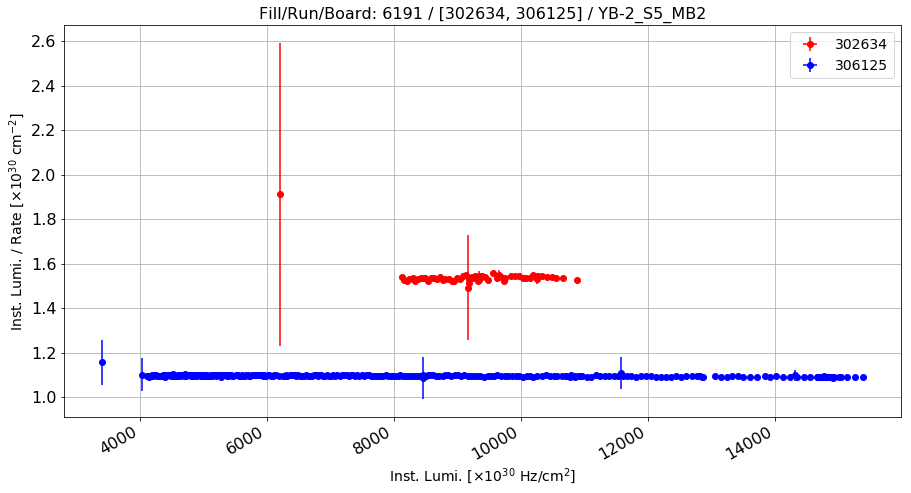

Anomalous Lumi/Rate: 1.5403985641 Normal Lumi/Rate: 1.09572050723 Ratio: 0.405831645878


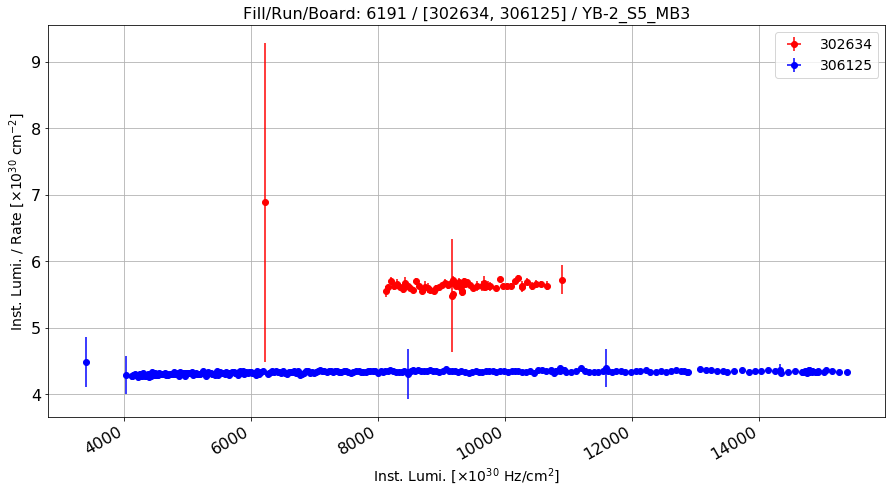

Anomalous Lumi/Rate: 5.65304471072 Normal Lumi/Rate: 4.33139091032 Ratio: 0.305133807536


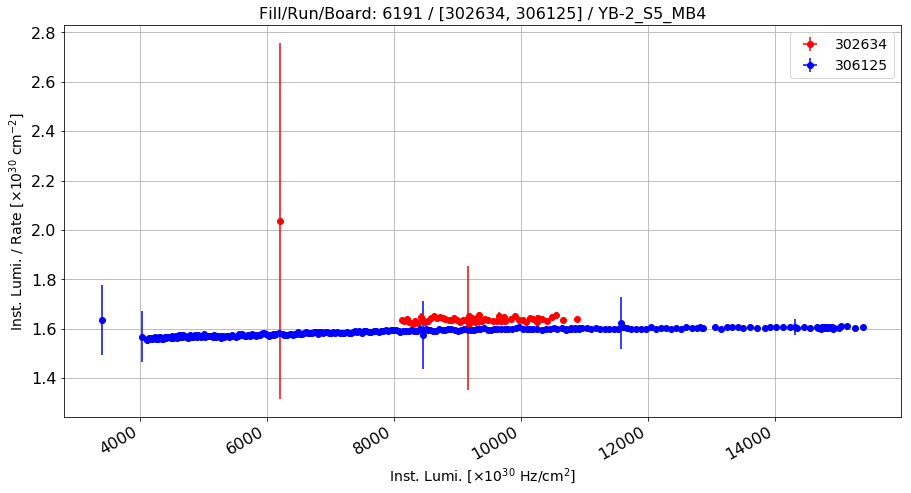

Anomalous Lumi/Rate: 1.64296751392 Normal Lumi/Rate: 1.58589345252 Ratio: 0.0359885850487


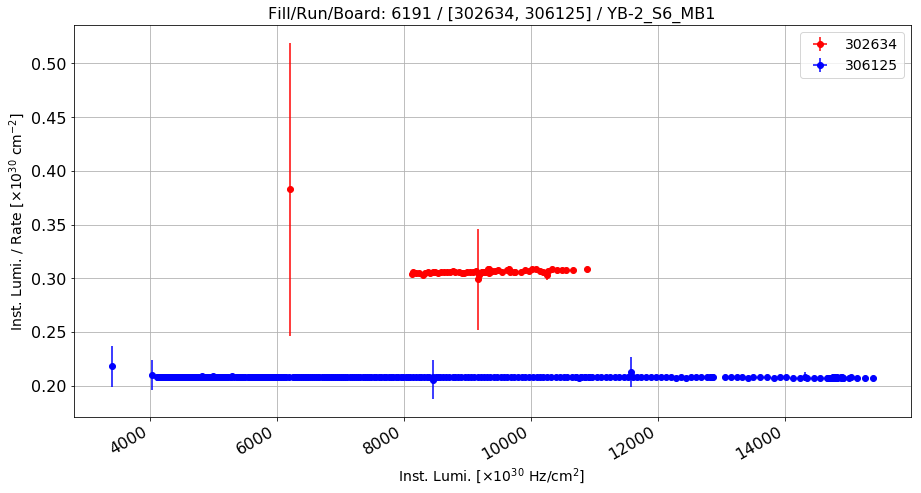

Anomalous Lumi/Rate: 0.30738088704 Normal Lumi/Rate: 0.208170571021 Ratio: 0.476581850801


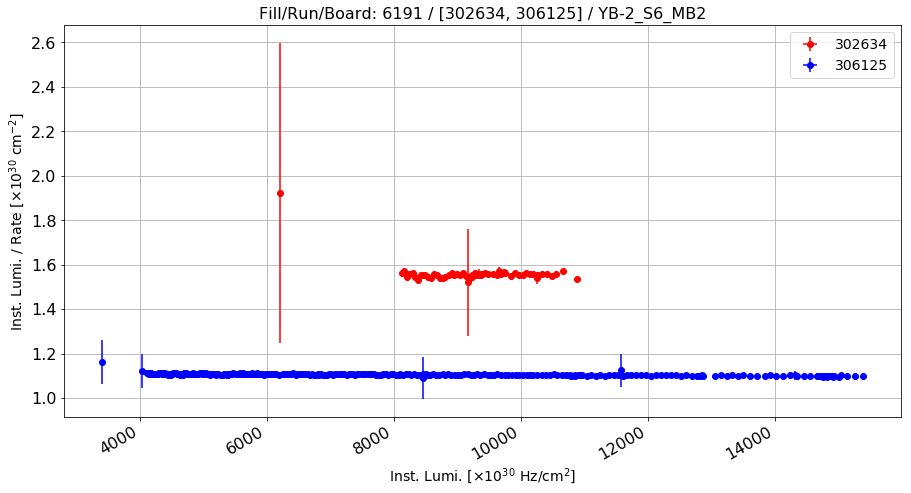

Anomalous Lumi/Rate: 1.55946994176 Normal Lumi/Rate: 1.10593331331 Ratio: 0.41009401108


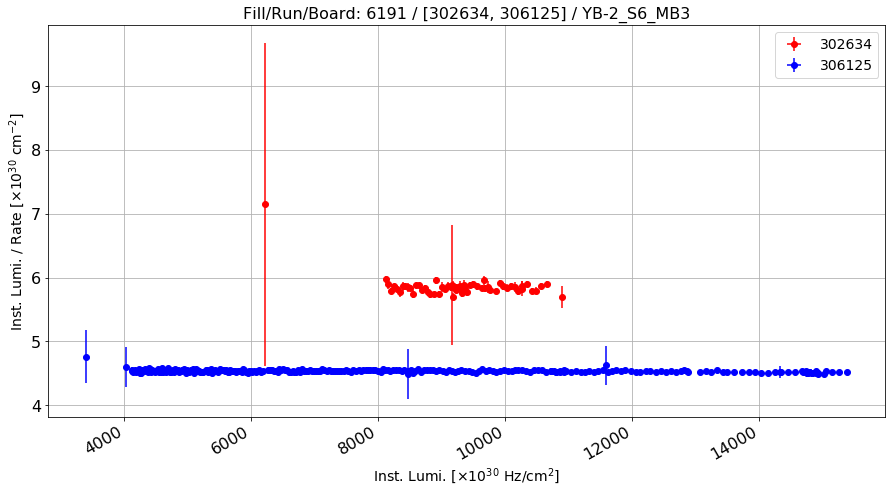

Anomalous Lumi/Rate: 5.86024689426 Normal Lumi/Rate: 4.53757832346 Ratio: 0.291492174131


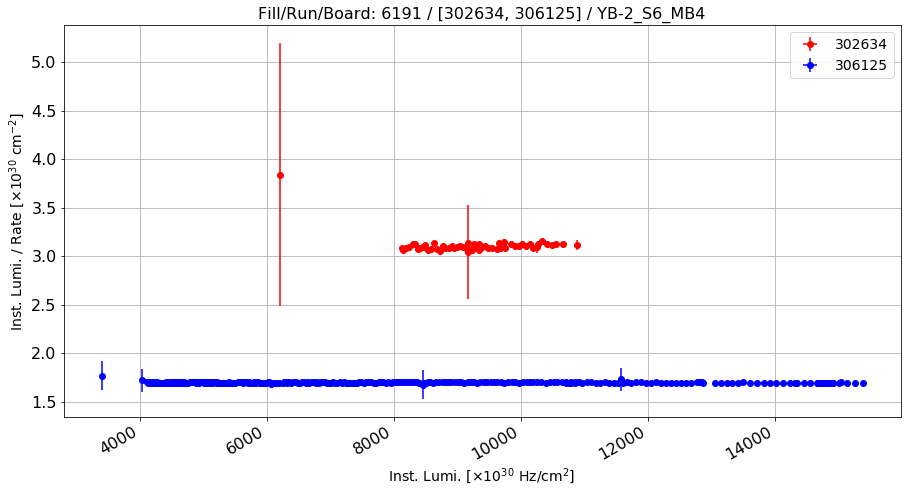

Anomalous Lumi/Rate: 3.1095256863 Normal Lumi/Rate: 1.69669263648 Ratio: 0.83269828574


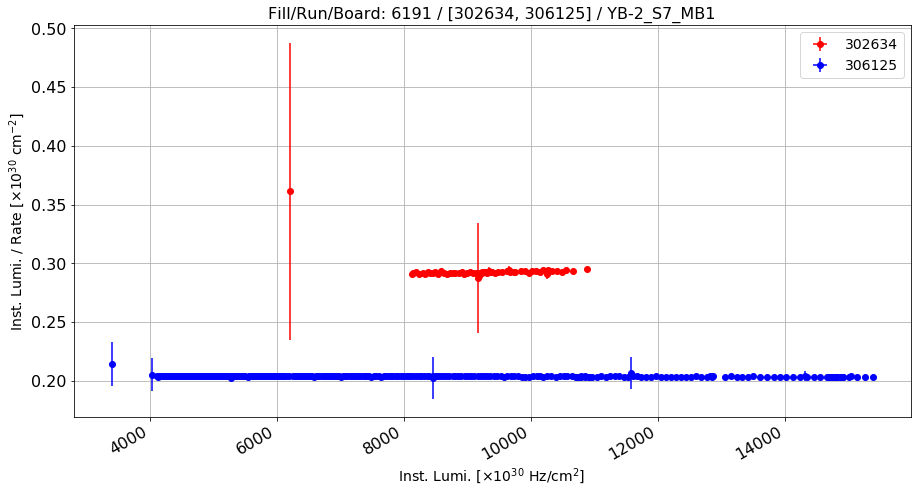

Anomalous Lumi/Rate: 0.293407859306 Normal Lumi/Rate: 0.203634680349 Ratio: 0.440854076545


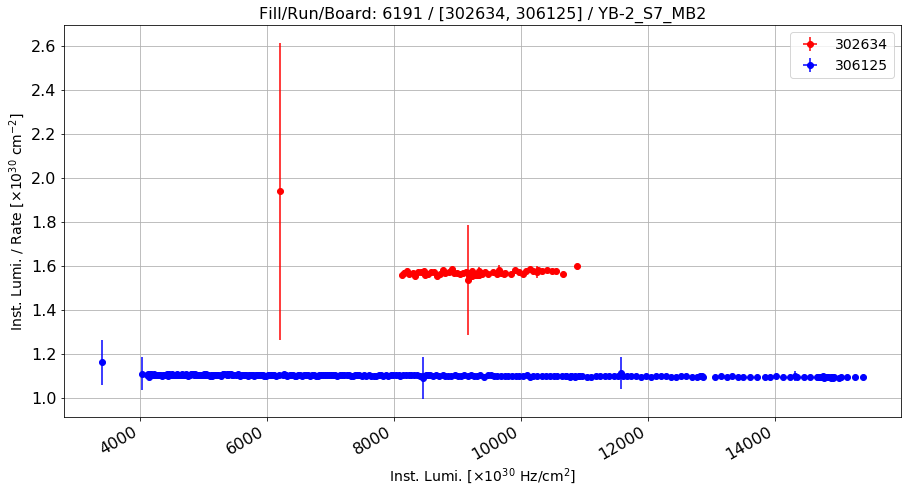

Anomalous Lumi/Rate: 1.5748240662 Normal Lumi/Rate: 1.10194579442 Ratio: 0.429130247757


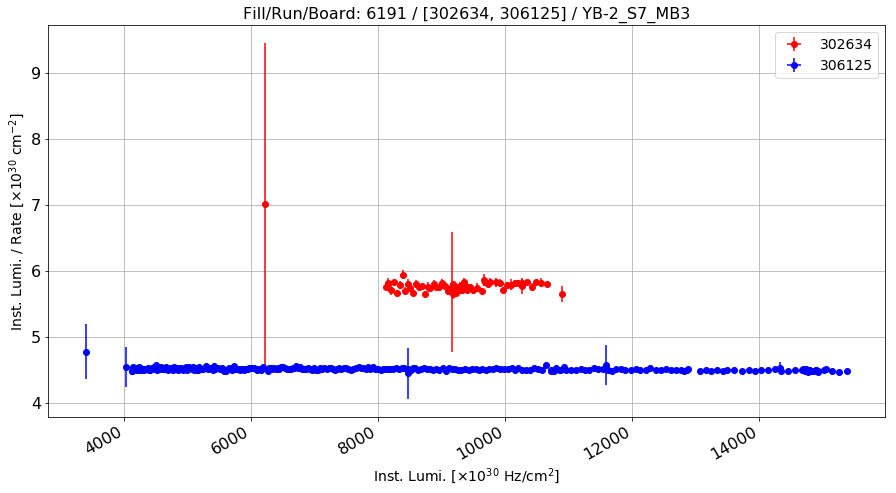

Anomalous Lumi/Rate: 5.78108211541 Normal Lumi/Rate: 4.50982414688 Ratio: 0.281886372313


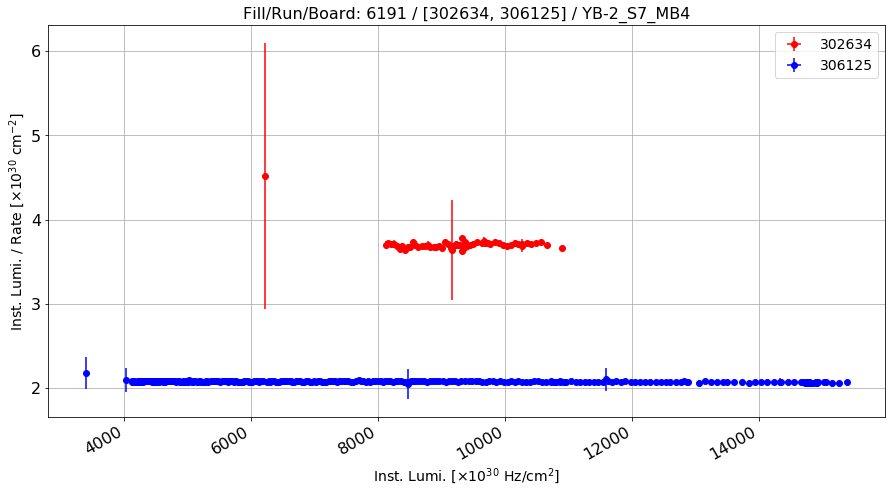

Anomalous Lumi/Rate: 3.71096231545 Normal Lumi/Rate: 2.07790936189 Ratio: 0.785911543355


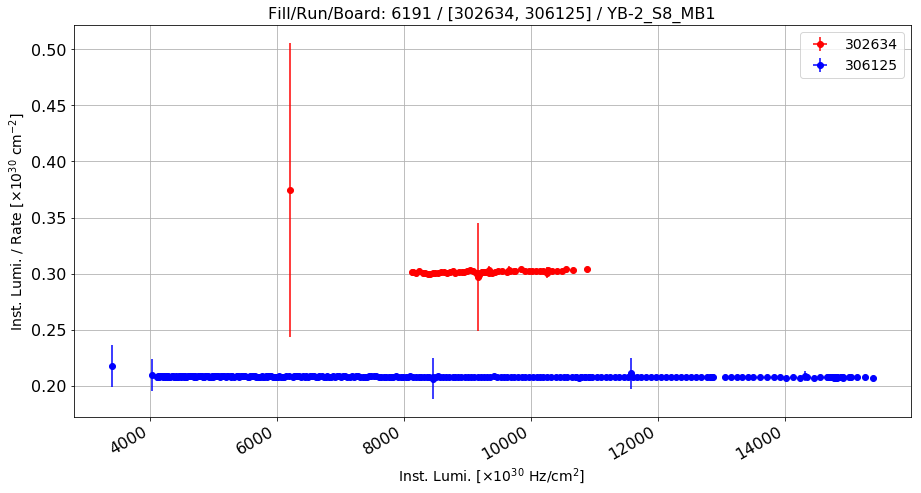

Anomalous Lumi/Rate: 0.302849181533 Normal Lumi/Rate: 0.208147742138 Ratio: 0.45497221552


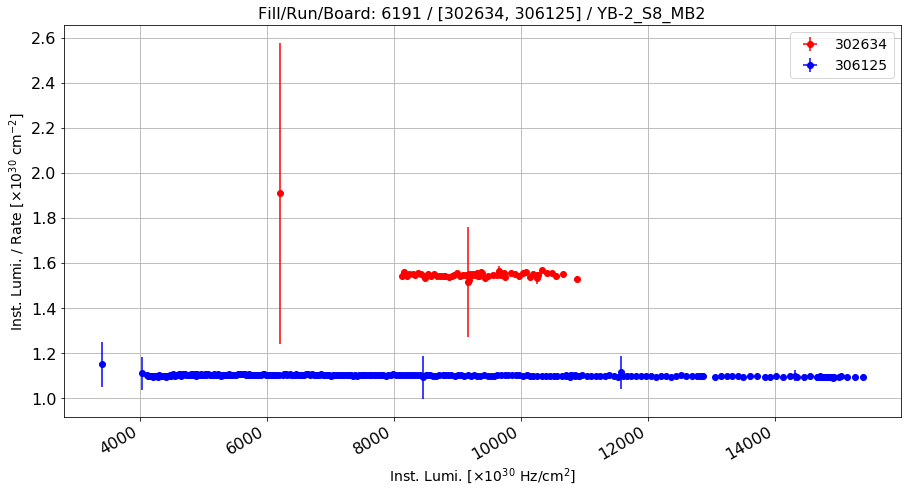

Anomalous Lumi/Rate: 1.55356457252 Normal Lumi/Rate: 1.10134784589 Ratio: 0.41060299733


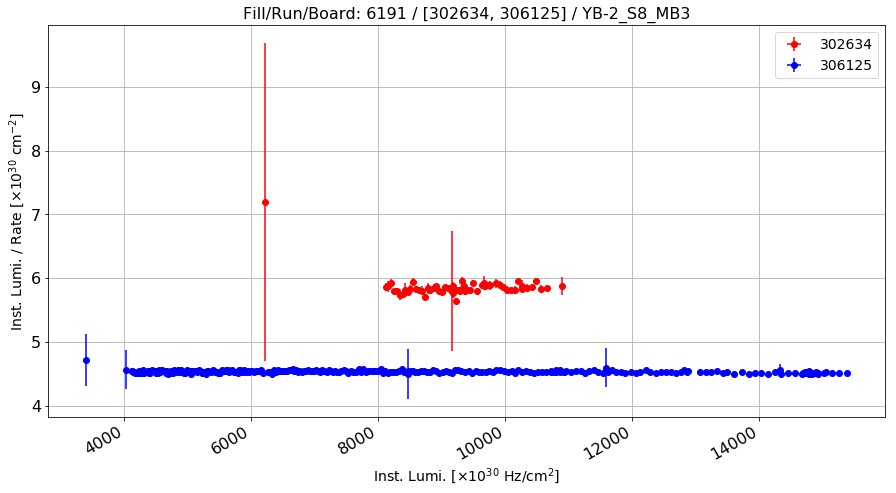

Anomalous Lumi/Rate: 5.86162977008 Normal Lumi/Rate: 4.53482149871 Ratio: 0.29258224866


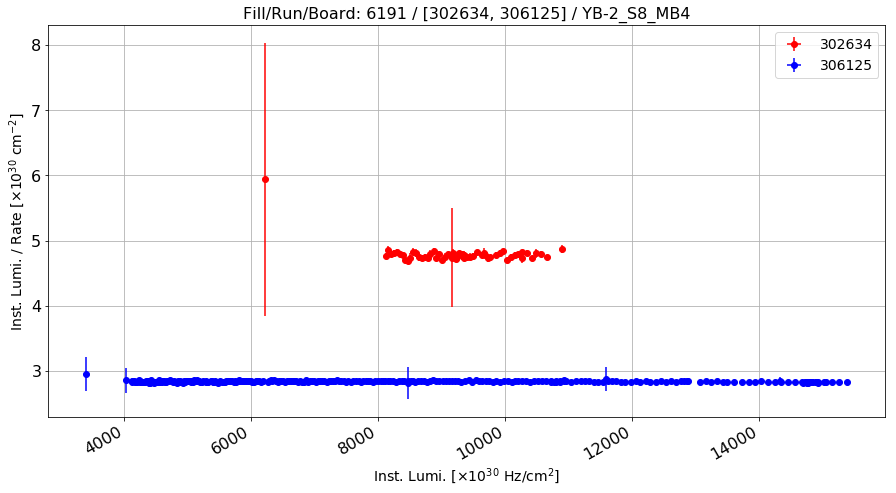

Anomalous Lumi/Rate: 4.79433505041 Normal Lumi/Rate: 2.84259077921 Ratio: 0.686607543188


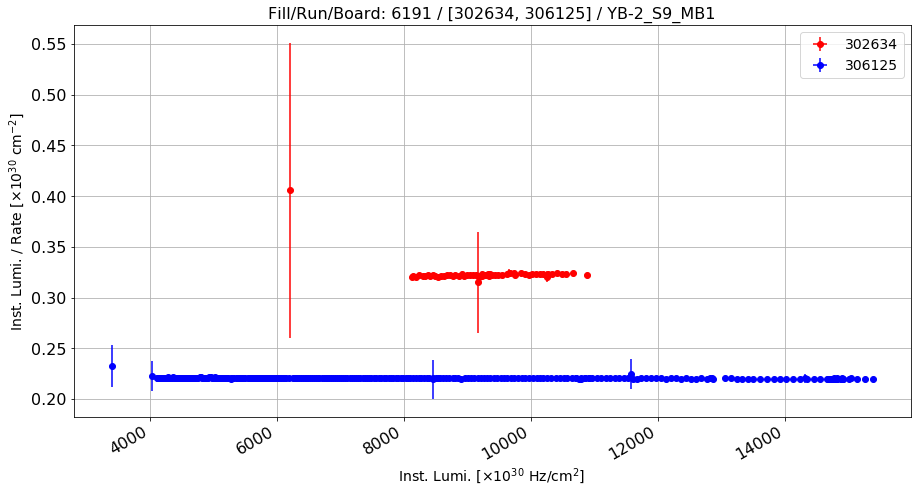

Anomalous Lumi/Rate: 0.323643804752 Normal Lumi/Rate: 0.220762809895 Ratio: 0.466025028878


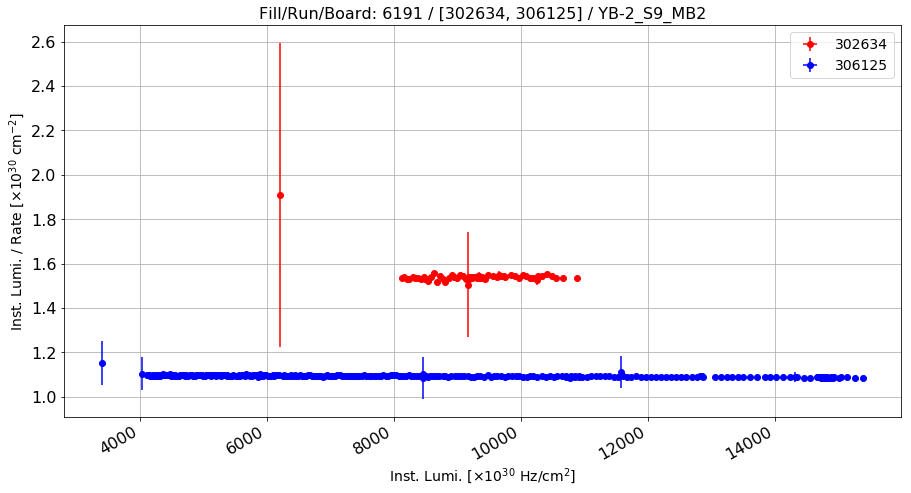

Anomalous Lumi/Rate: 1.54379549697 Normal Lumi/Rate: 1.09327931422 Ratio: 0.412077844059


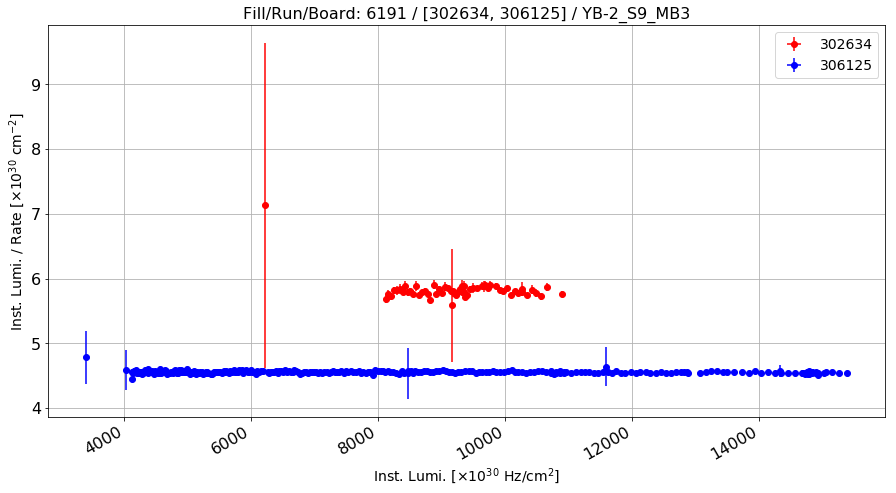

Anomalous Lumi/Rate: 5.82661879733 Normal Lumi/Rate: 4.55692173093 Ratio: 0.278630431105


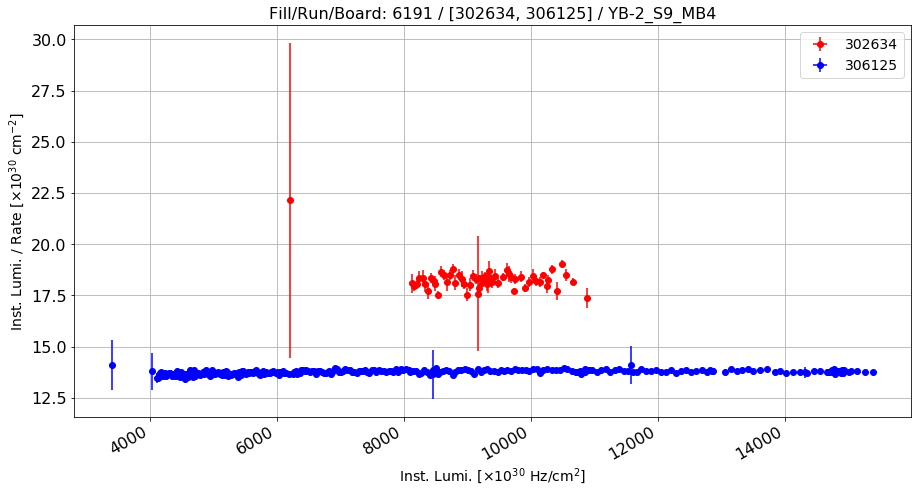

Anomalous Lumi/Rate: 18.2914095204 Normal Lumi/Rate: 13.7700124132 Ratio: 0.328350982663


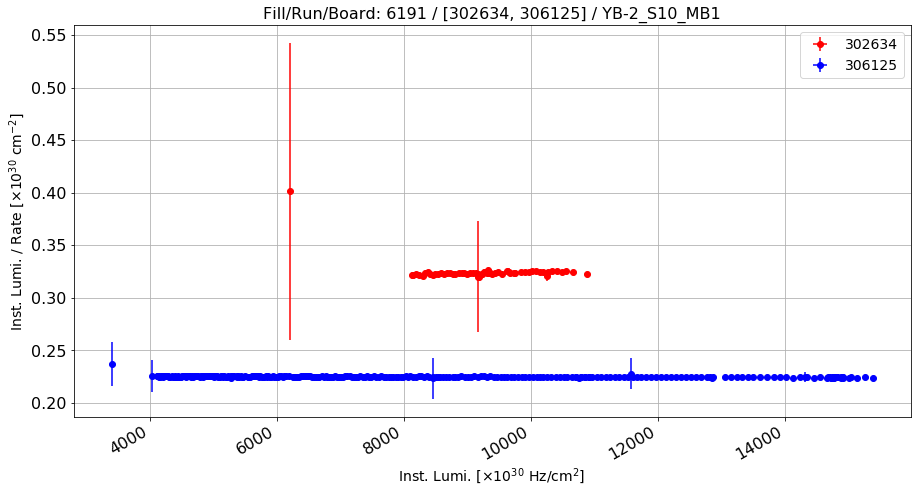

Anomalous Lumi/Rate: 0.324654817438 Normal Lumi/Rate: 0.224838331937 Ratio: 0.443947811929


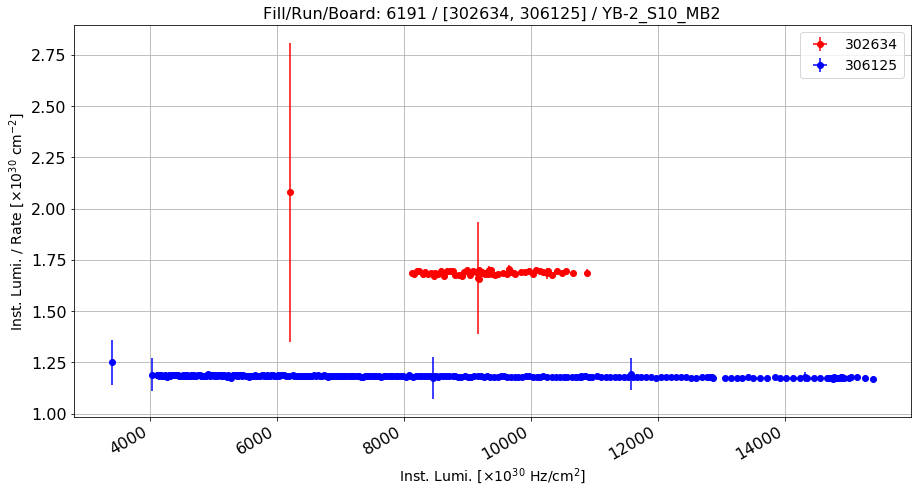

Anomalous Lumi/Rate: 1.69363957284 Normal Lumi/Rate: 1.18236184523 Ratio: 0.432420692249


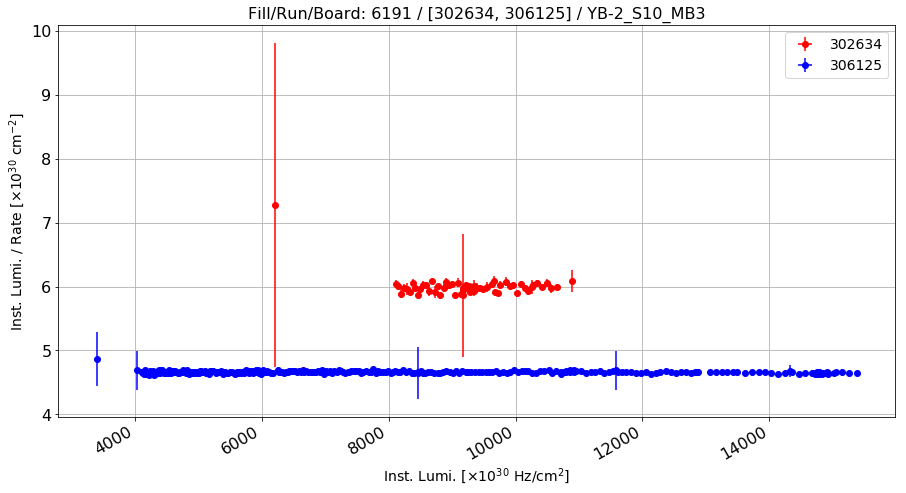

Anomalous Lumi/Rate: 6.00394363343 Normal Lumi/Rate: 4.66250742671 Ratio: 0.287707039144


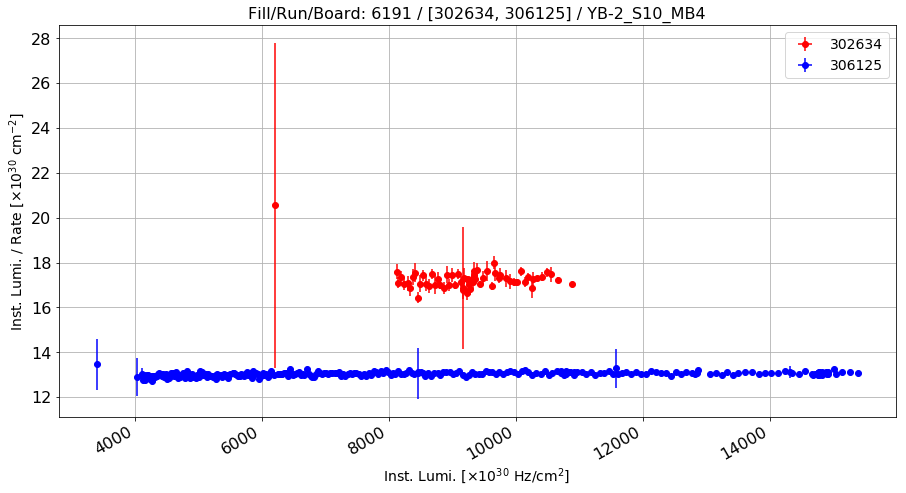

Anomalous Lumi/Rate: 17.2736324904 Normal Lumi/Rate: 13.0367286921 Ratio: 0.324997466646


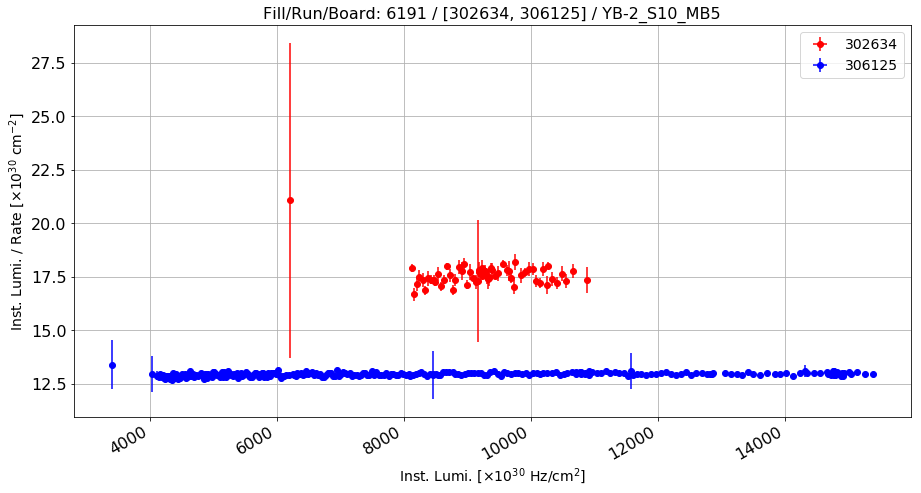

Anomalous Lumi/Rate: 17.6015684617 Normal Lumi/Rate: 12.9567019432 Ratio: 0.358491423117


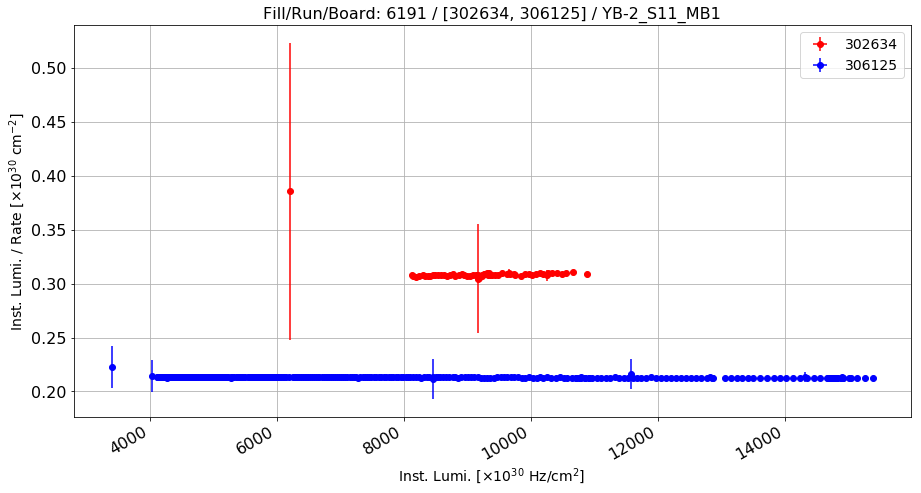

Anomalous Lumi/Rate: 0.309540542908 Normal Lumi/Rate: 0.213056853931 Ratio: 0.452854189844


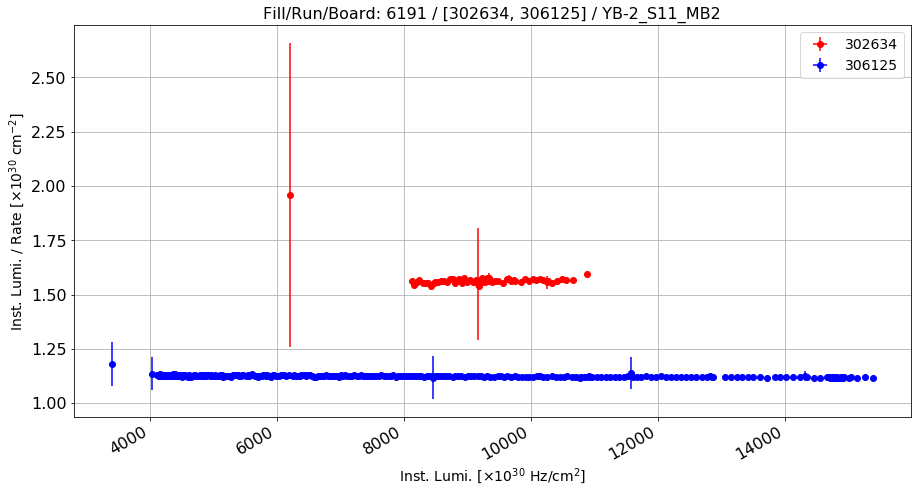

Anomalous Lumi/Rate: 1.56862627829 Normal Lumi/Rate: 1.12427098021 Ratio: 0.395238608758


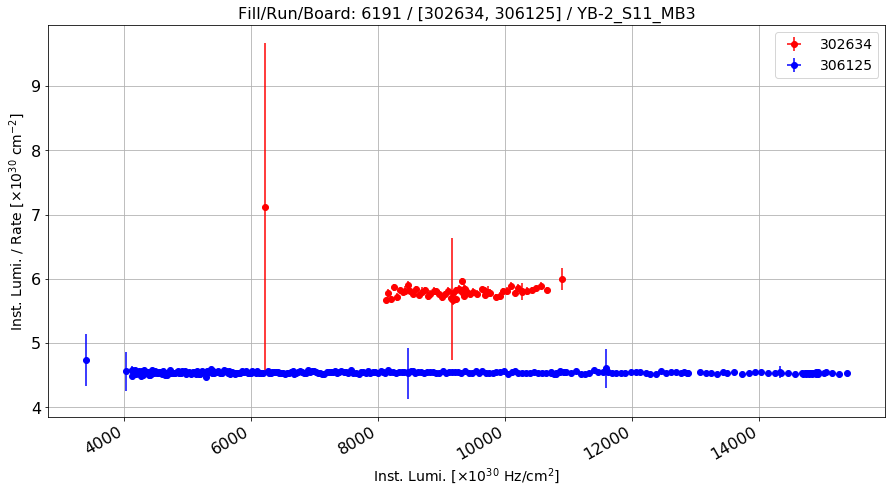

Anomalous Lumi/Rate: 5.81807038914 Normal Lumi/Rate: 4.5441261789 Ratio: 0.280349655816


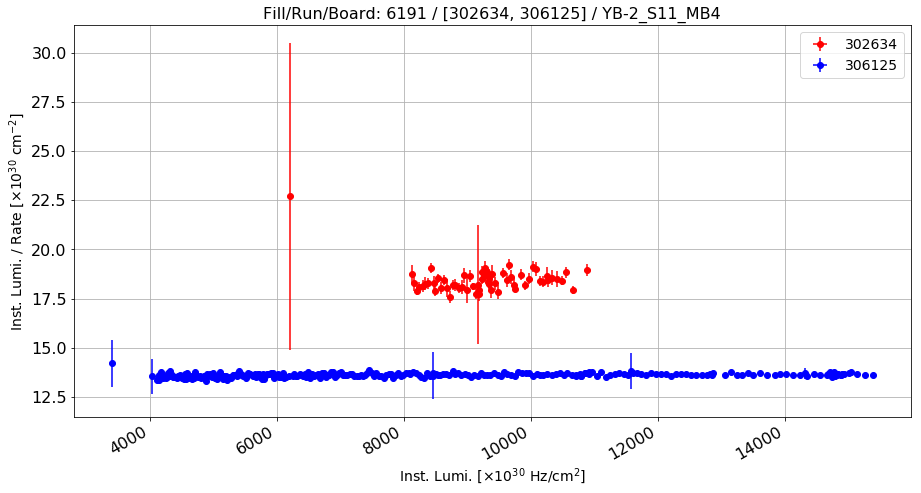

Anomalous Lumi/Rate: 18.4452210856 Normal Lumi/Rate: 13.6163832956 Ratio: 0.354634390441


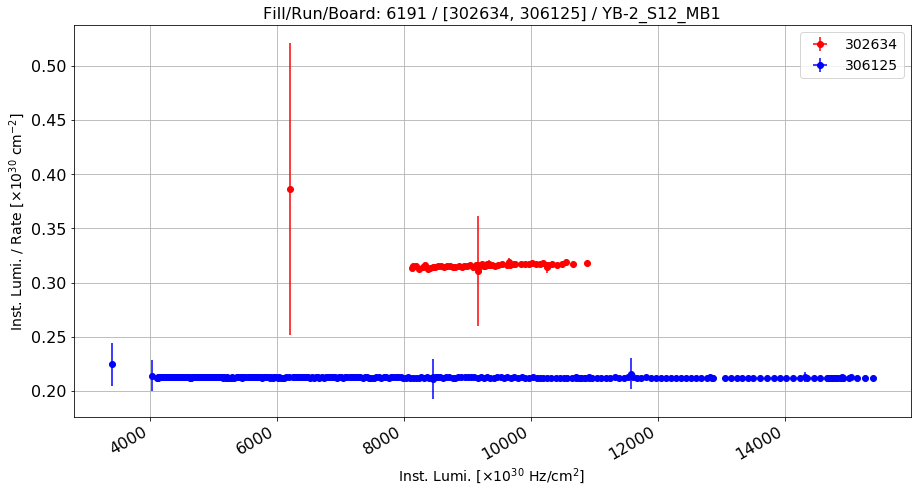

Anomalous Lumi/Rate: 0.31701153689 Normal Lumi/Rate: 0.212497307519 Ratio: 0.491837899458


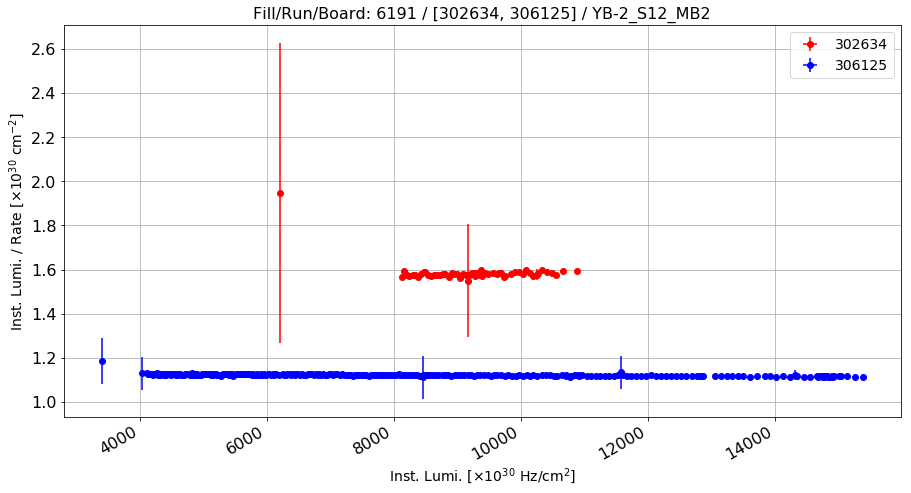

Anomalous Lumi/Rate: 1.58583368009 Normal Lumi/Rate: 1.12159992883 Ratio: 0.413903156842


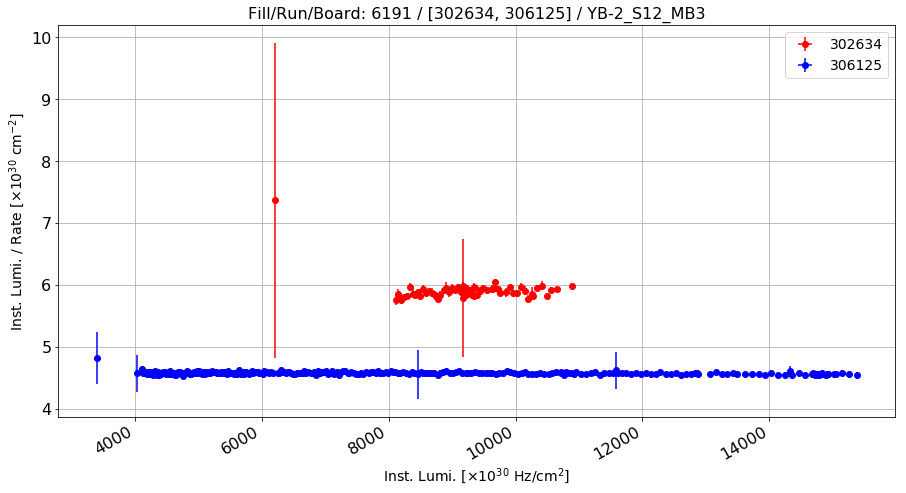

Anomalous Lumi/Rate: 5.91525396937 Normal Lumi/Rate: 4.57866647495 Ratio: 0.291916325798


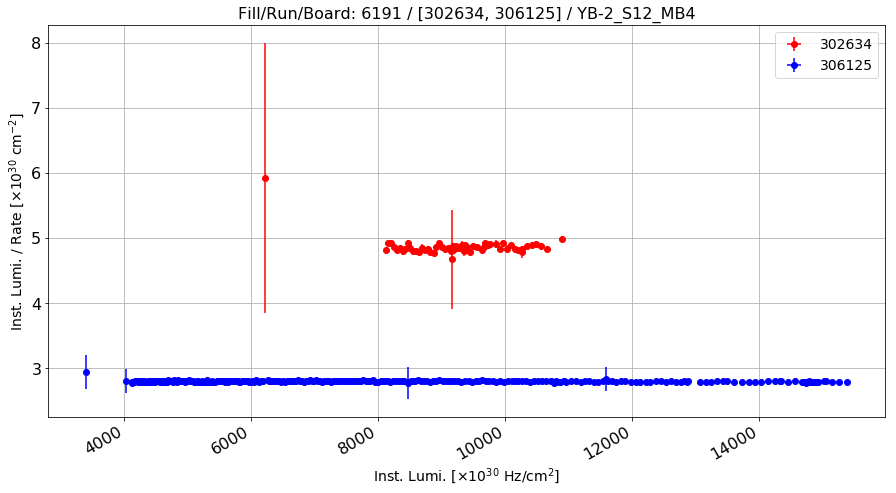

Anomalous Lumi/Rate: 4.86847649893 Normal Lumi/Rate: 2.80165171718 Ratio: 0.737716529532


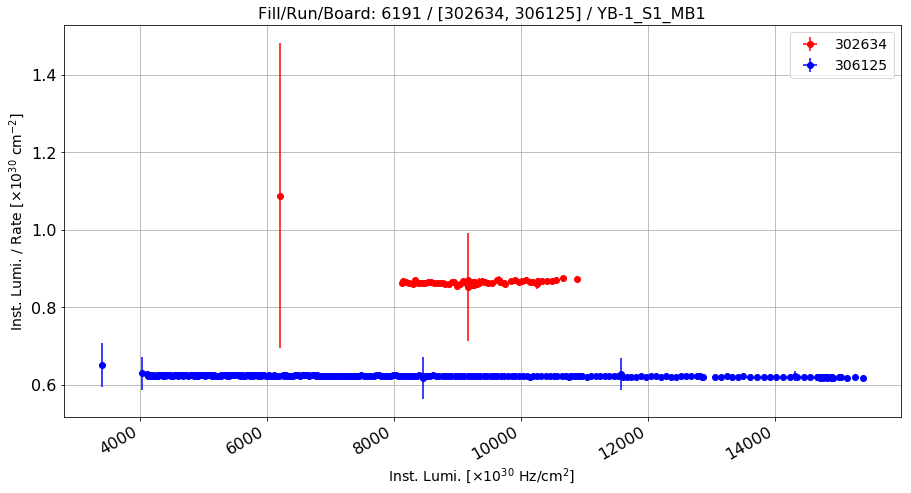

Anomalous Lumi/Rate: 0.868069496434 Normal Lumi/Rate: 0.622924693472 Ratio: 0.393538425319


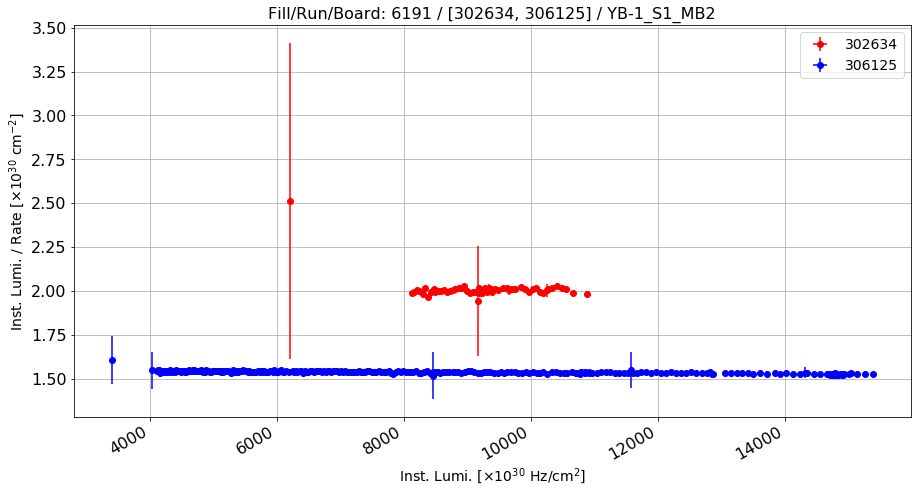

Anomalous Lumi/Rate: 2.01048650196 Normal Lumi/Rate: 1.53680014963 Ratio: 0.308228986341


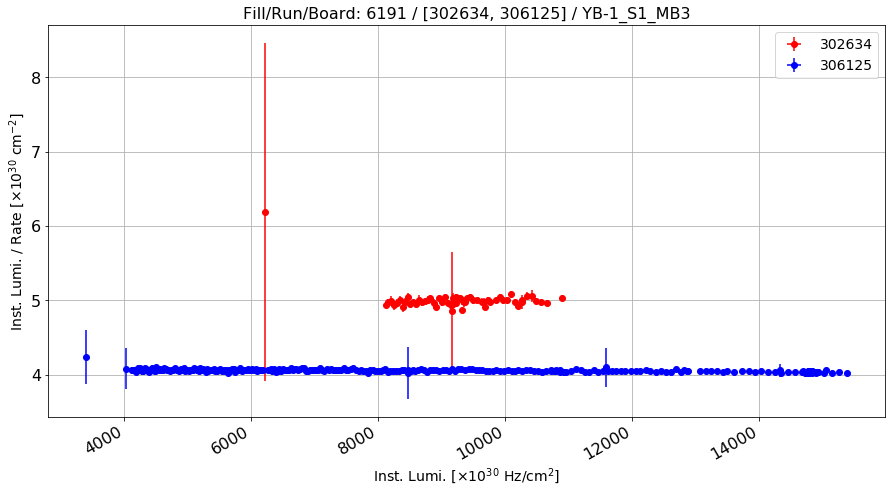

Anomalous Lumi/Rate: 5.00694116973 Normal Lumi/Rate: 4.05896952336 Ratio: 0.233549831038


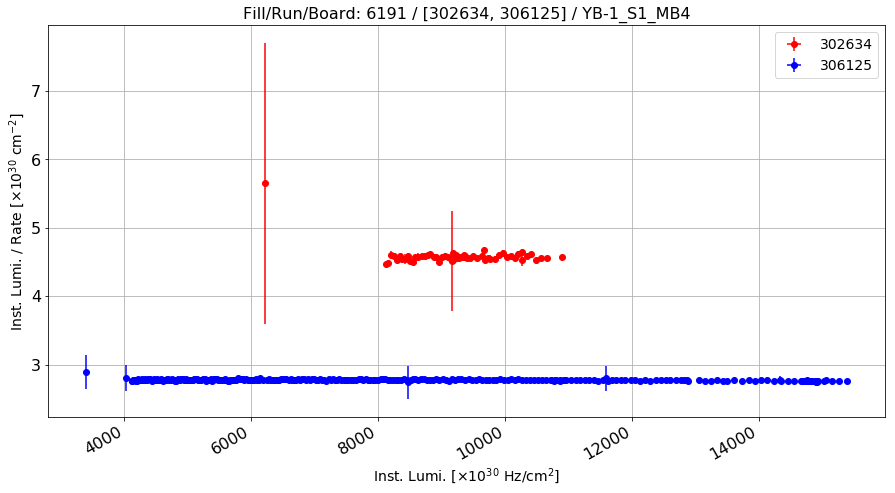

Anomalous Lumi/Rate: 4.58626912353 Normal Lumi/Rate: 2.77529689152 Ratio: 0.652532792995


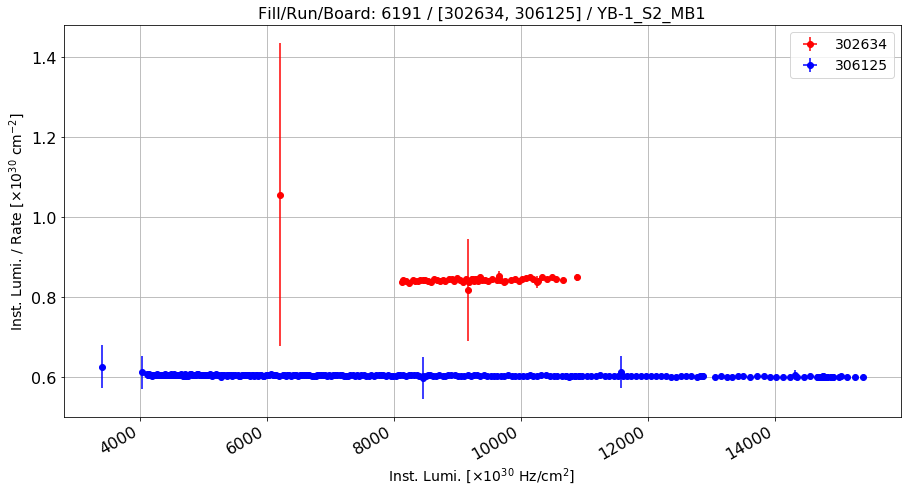

Anomalous Lumi/Rate: 0.846972289503 Normal Lumi/Rate: 0.60477766755 Ratio: 0.400468858141


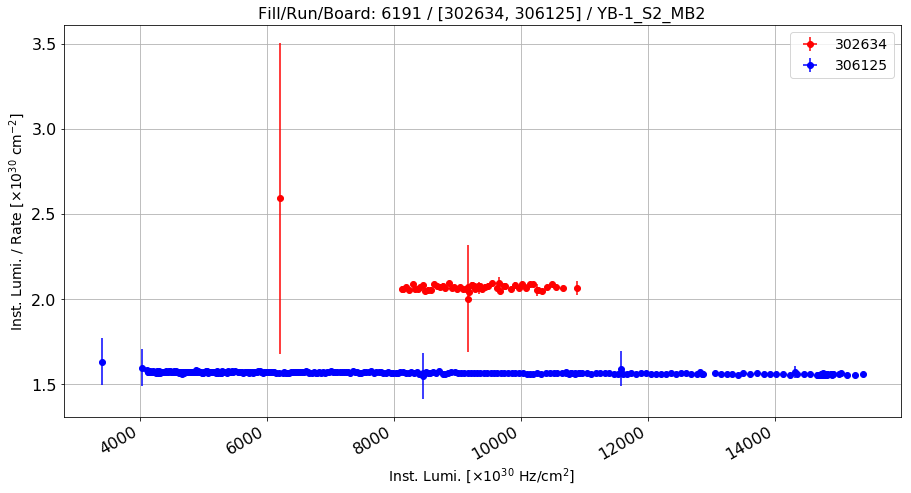

Anomalous Lumi/Rate: 2.07774373476 Normal Lumi/Rate: 1.56875988376 Ratio: 0.324449813051


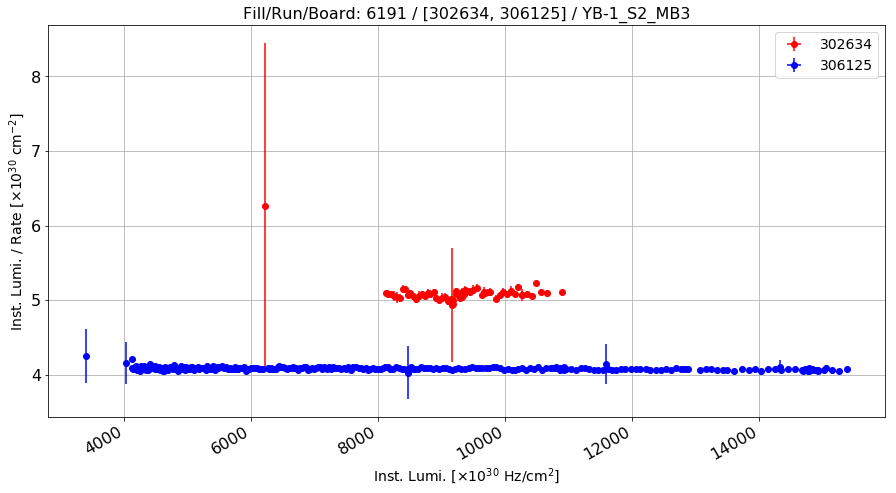

Anomalous Lumi/Rate: 5.09633504676 Normal Lumi/Rate: 4.08321277226 Ratio: 0.248118903178


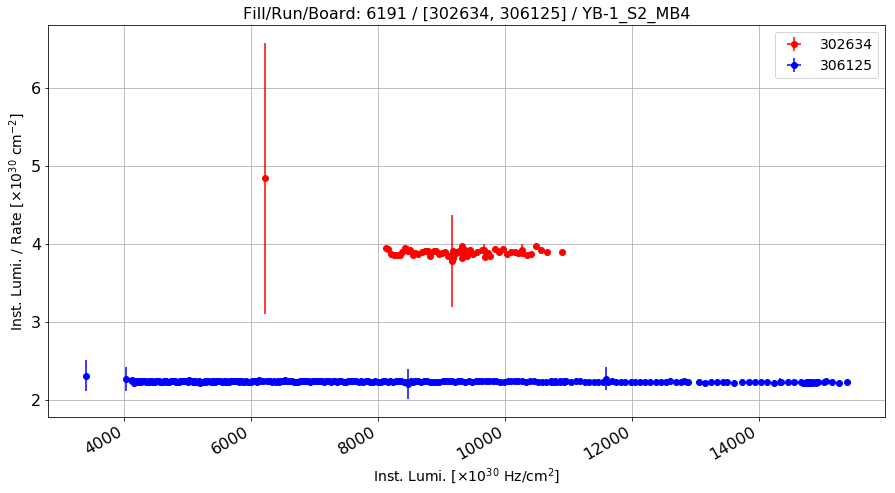

Anomalous Lumi/Rate: 3.9055059793 Normal Lumi/Rate: 2.23735805991 Ratio: 0.745588267375


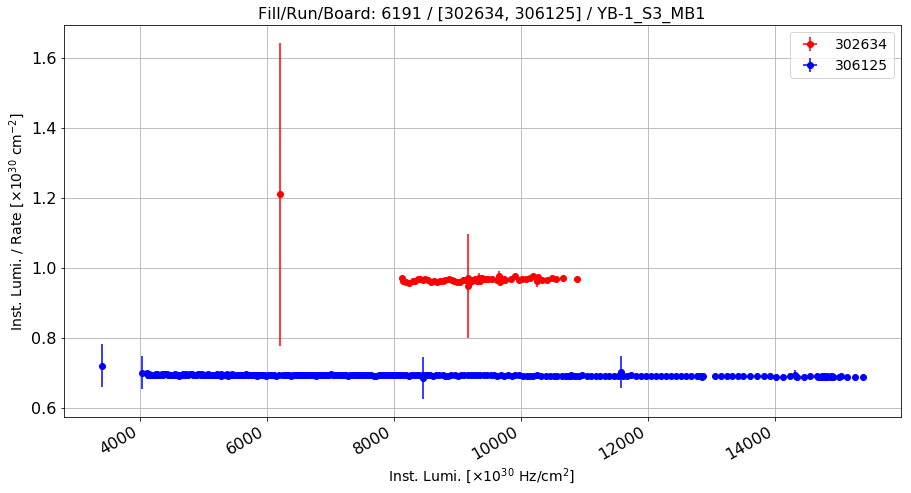

Anomalous Lumi/Rate: 0.969356866041 Normal Lumi/Rate: 0.692542238121 Ratio: 0.39970793503


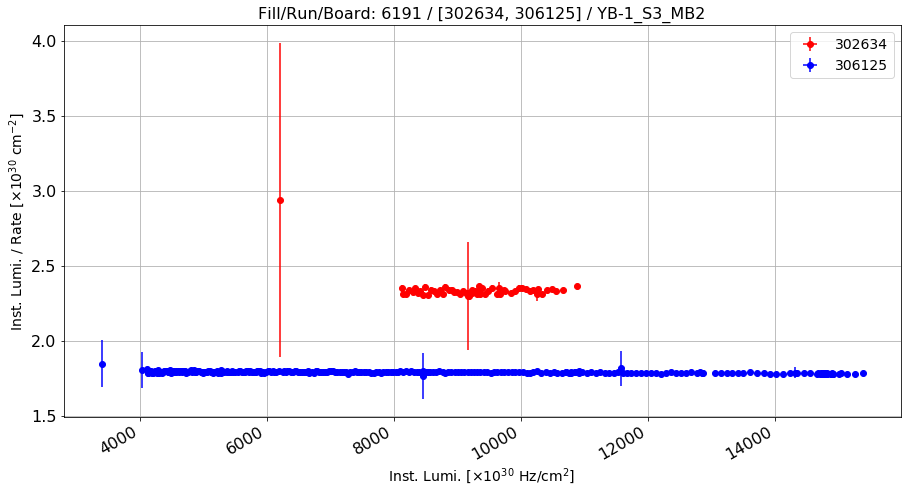

Anomalous Lumi/Rate: 2.34081505238 Normal Lumi/Rate: 1.79200606038 Ratio: 0.306253982139


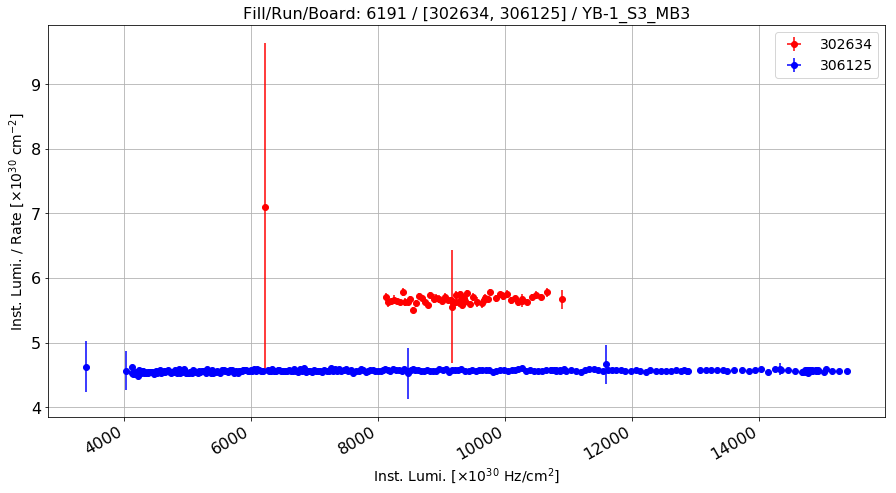

Anomalous Lumi/Rate: 5.69435606395 Normal Lumi/Rate: 4.56428523583 Ratio: 0.247589878749


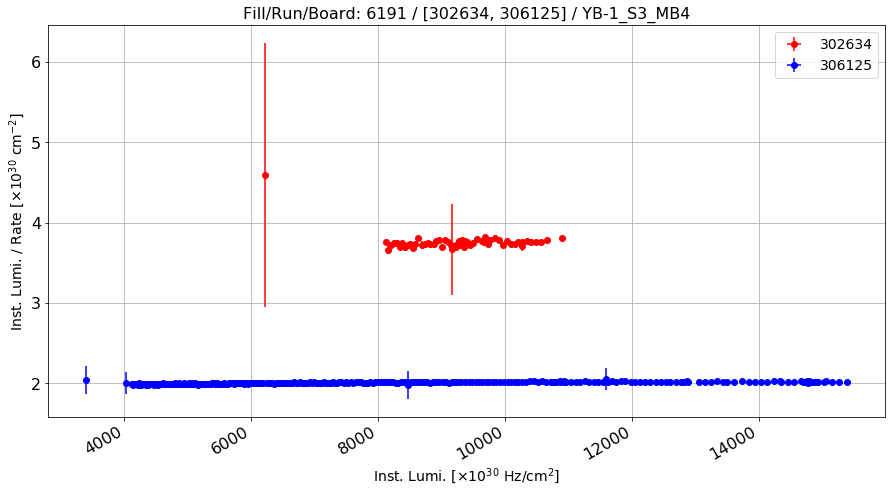

Anomalous Lumi/Rate: 3.7600745058 Normal Lumi/Rate: 2.00886585674 Ratio: 0.87173996371


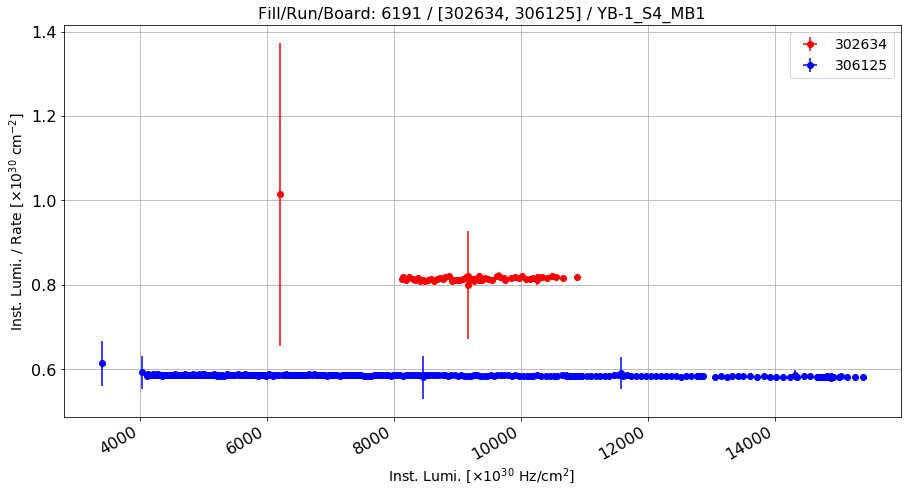

Anomalous Lumi/Rate: 0.818092810435 Normal Lumi/Rate: 0.585654395221 Ratio: 0.396886657235


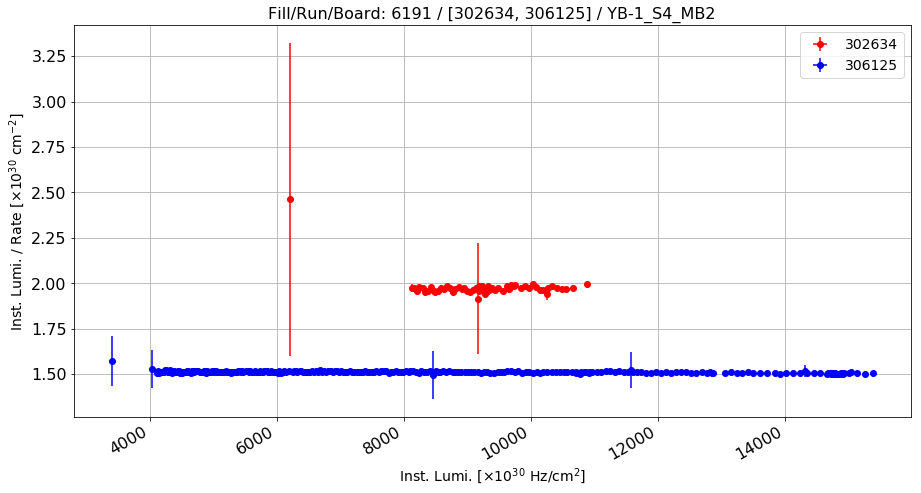

Anomalous Lumi/Rate: 1.97723331391 Normal Lumi/Rate: 1.51162838996 Ratio: 0.308015466659


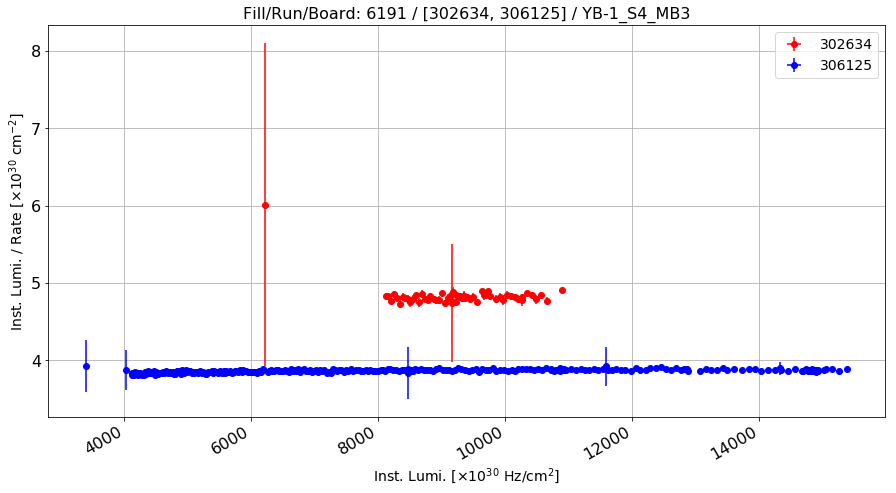

Anomalous Lumi/Rate: 4.83393221965 Normal Lumi/Rate: 3.86384254658 Ratio: 0.251068634753


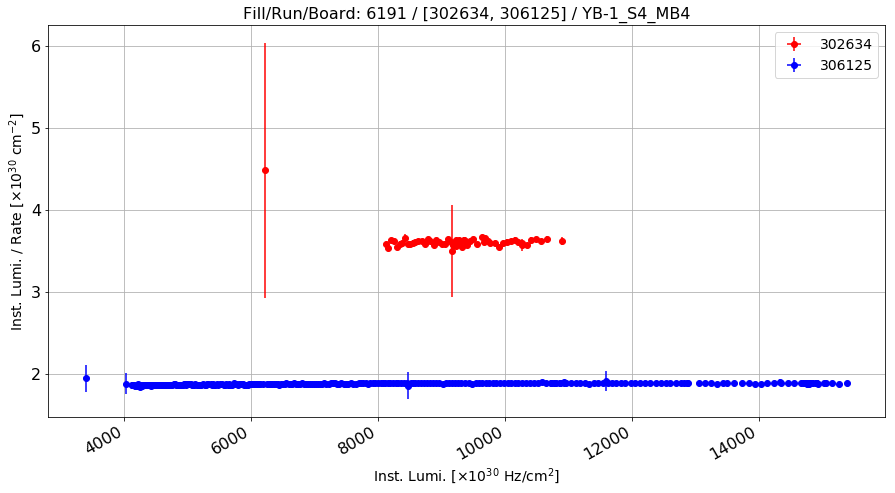

Anomalous Lumi/Rate: 3.61626762784 Normal Lumi/Rate: 1.87549952026 Ratio: 0.92816238489


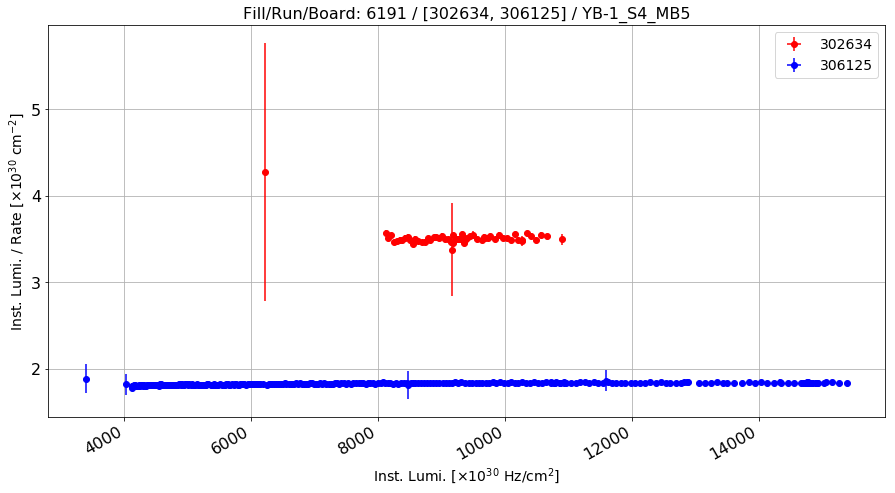

Anomalous Lumi/Rate: 3.51742181598 Normal Lumi/Rate: 1.82920999247 Ratio: 0.922918544318


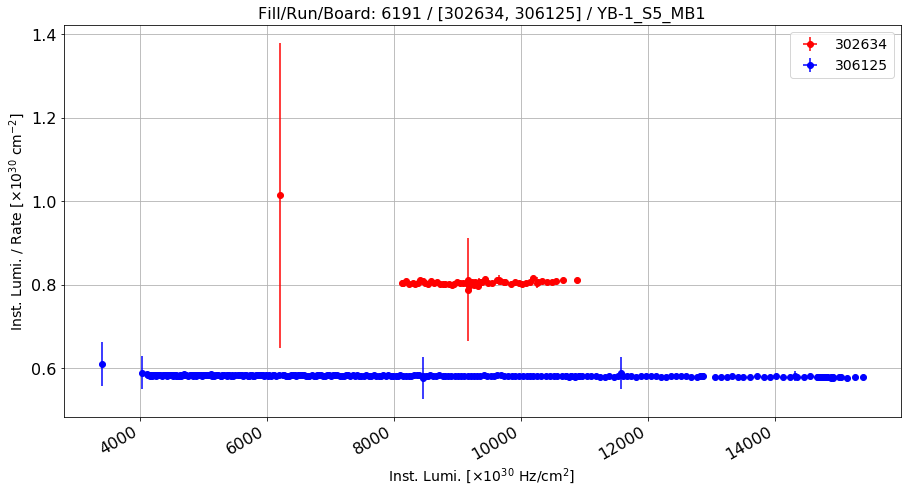

Anomalous Lumi/Rate: 0.809042389258 Normal Lumi/Rate: 0.582431724833 Ratio: 0.38907678748


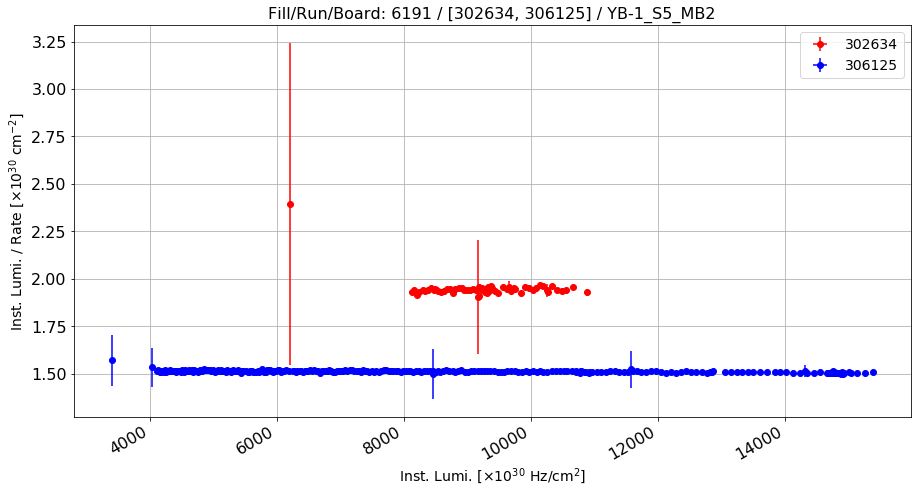

Anomalous Lumi/Rate: 1.94918792533 Normal Lumi/Rate: 1.51251825195 Ratio: 0.288703738163


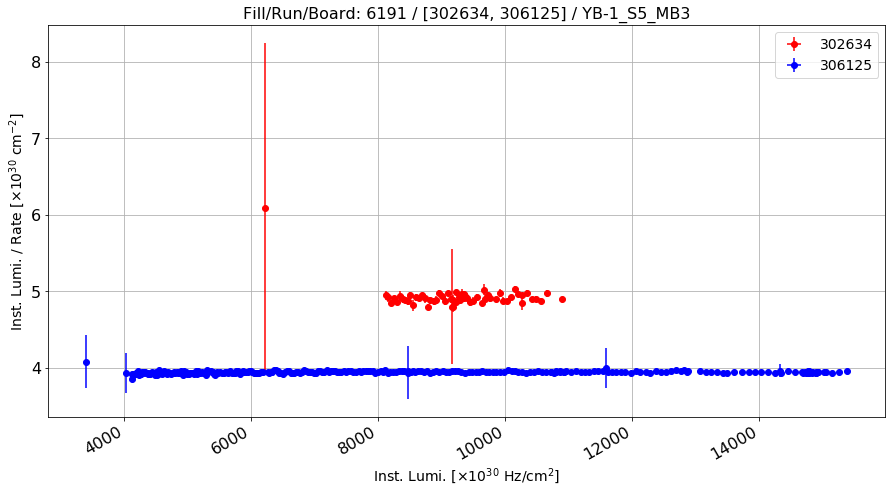

Anomalous Lumi/Rate: 4.92764165361 Normal Lumi/Rate: 3.94094994138 Ratio: 0.250369004152


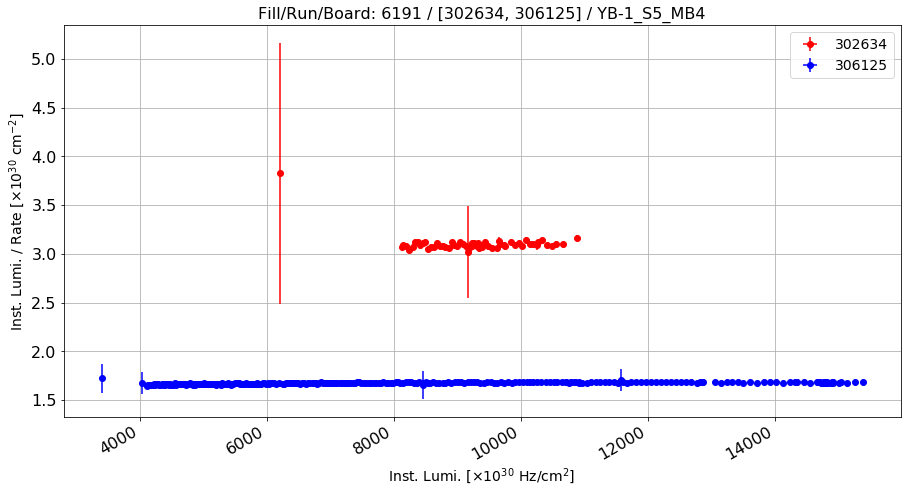

Anomalous Lumi/Rate: 3.10382921198 Normal Lumi/Rate: 1.67335177522 Ratio: 0.854857572654


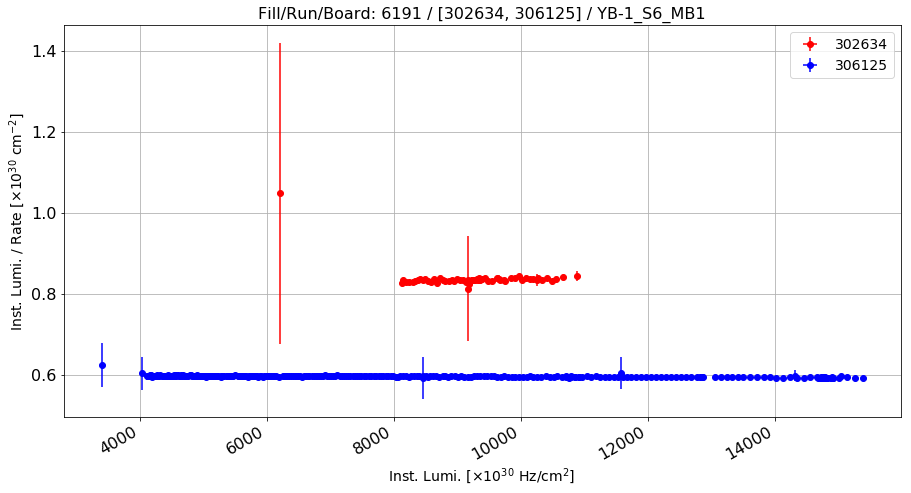

Anomalous Lumi/Rate: 0.837616336699 Normal Lumi/Rate: 0.596444241797 Ratio: 0.404349774885


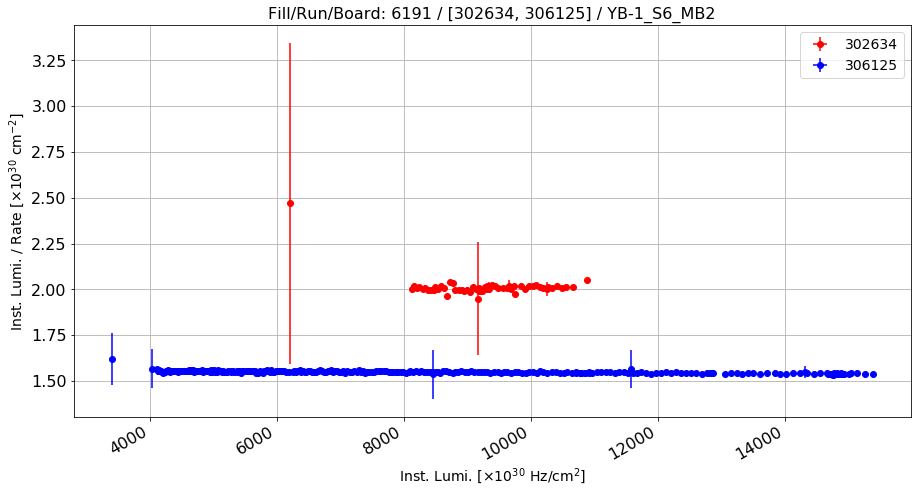

Anomalous Lumi/Rate: 2.0144101827 Normal Lumi/Rate: 1.54945939374 Ratio: 0.300072909836


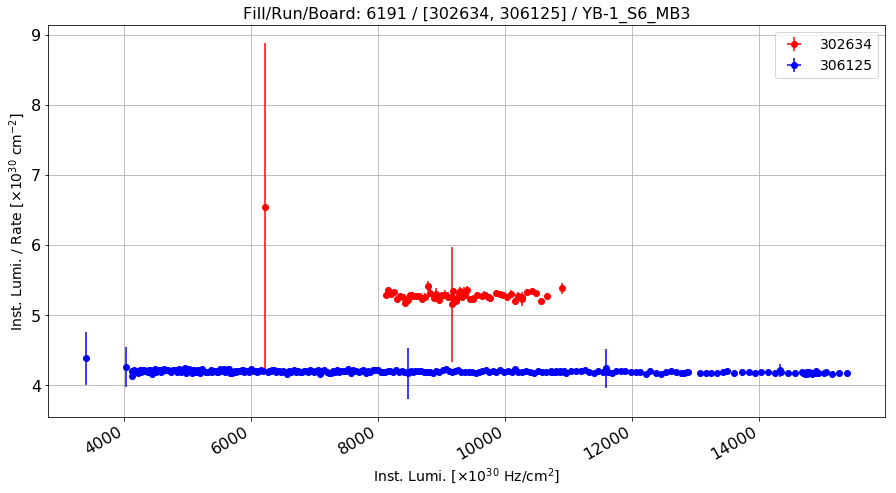

Anomalous Lumi/Rate: 5.30049448818 Normal Lumi/Rate: 4.20036054858 Ratio: 0.26191416829


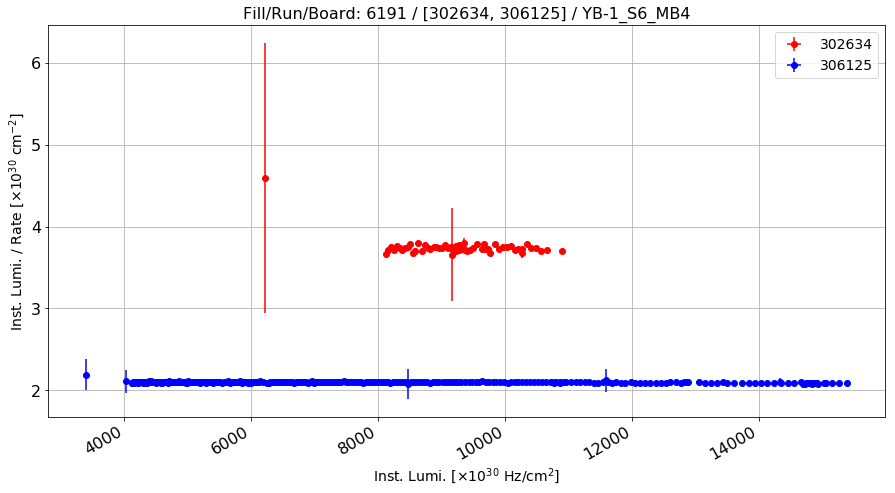

Anomalous Lumi/Rate: 3.7489754971 Normal Lumi/Rate: 2.0971445555 Ratio: 0.787657168061


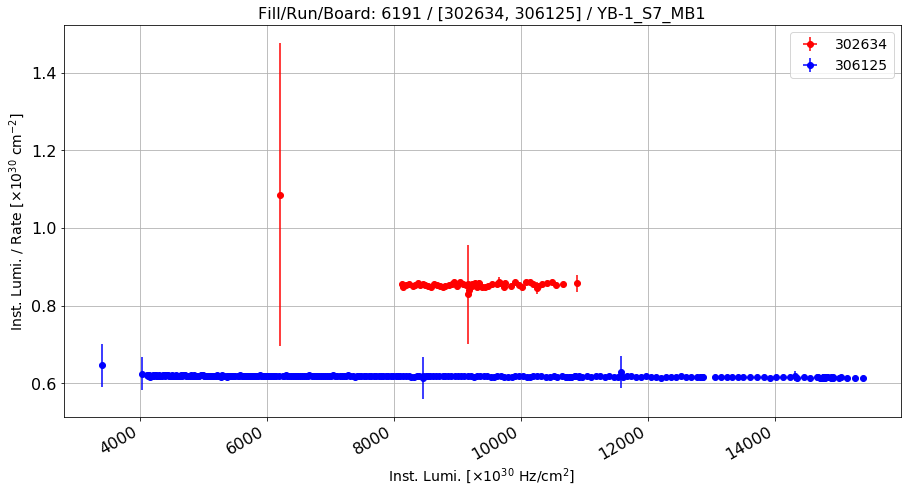

Anomalous Lumi/Rate: 0.857177605685 Normal Lumi/Rate: 0.618096453526 Ratio: 0.386802336101


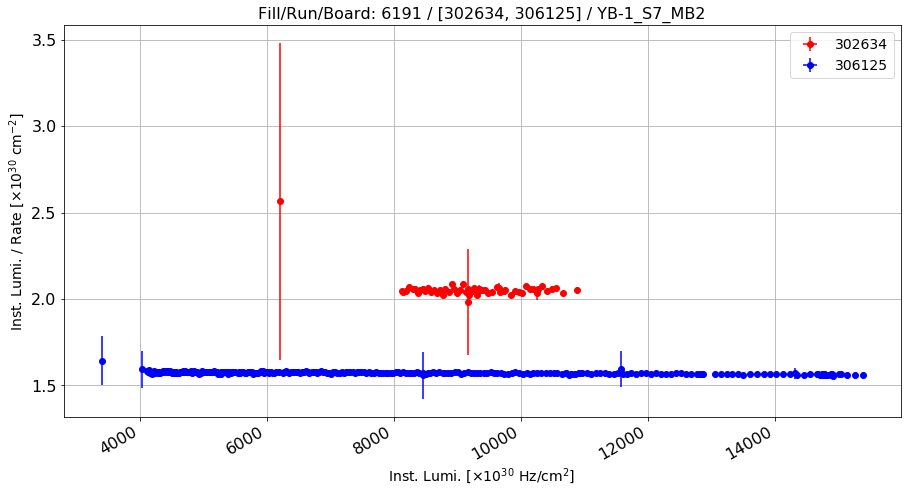

Anomalous Lumi/Rate: 2.05736262512 Normal Lumi/Rate: 1.57239665137 Ratio: 0.30842470526


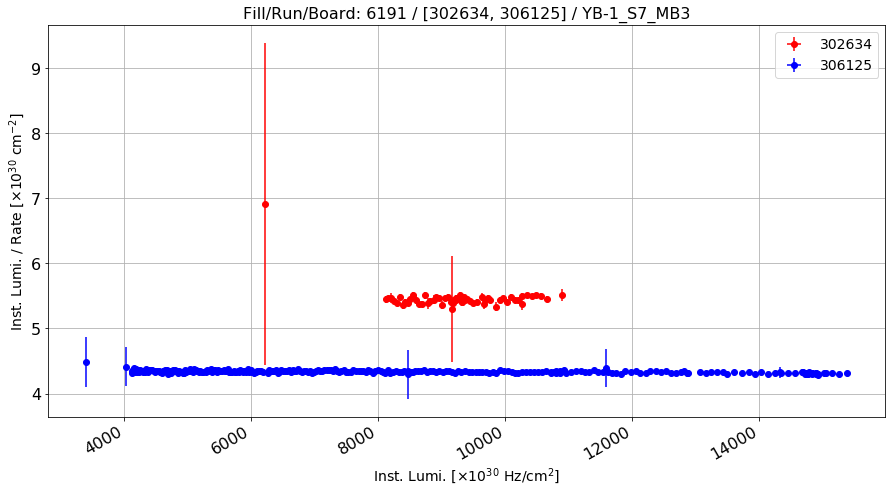

Anomalous Lumi/Rate: 5.46351255783 Normal Lumi/Rate: 4.33737295718 Ratio: 0.259636330968


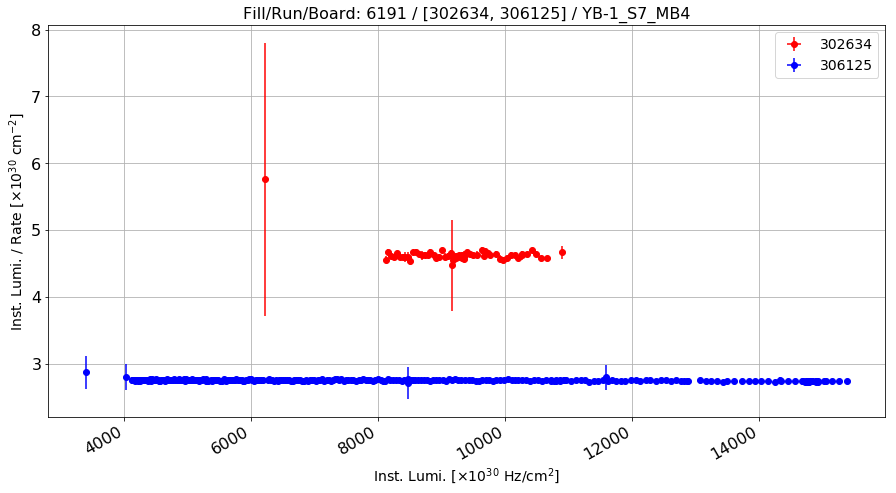

Anomalous Lumi/Rate: 4.63699360531 Normal Lumi/Rate: 2.75298004314 Ratio: 0.684354238918


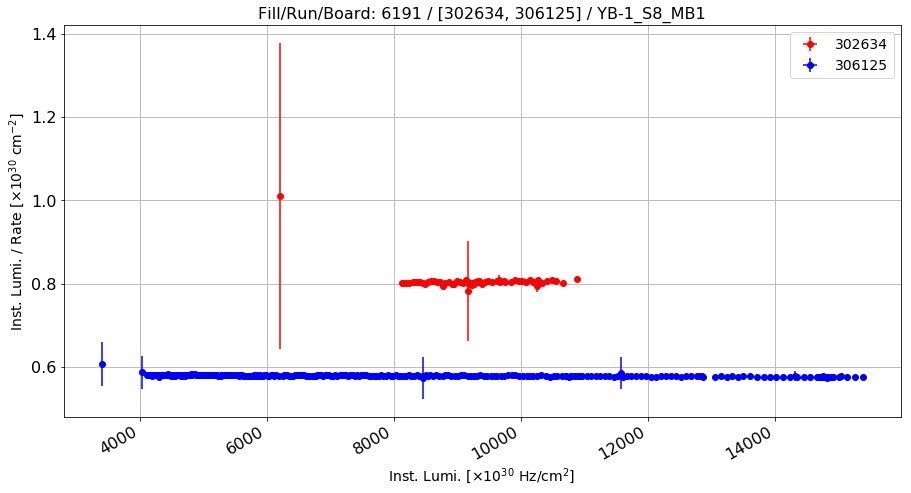

Anomalous Lumi/Rate: 0.806458641835 Normal Lumi/Rate: 0.578845510872 Ratio: 0.393219134792


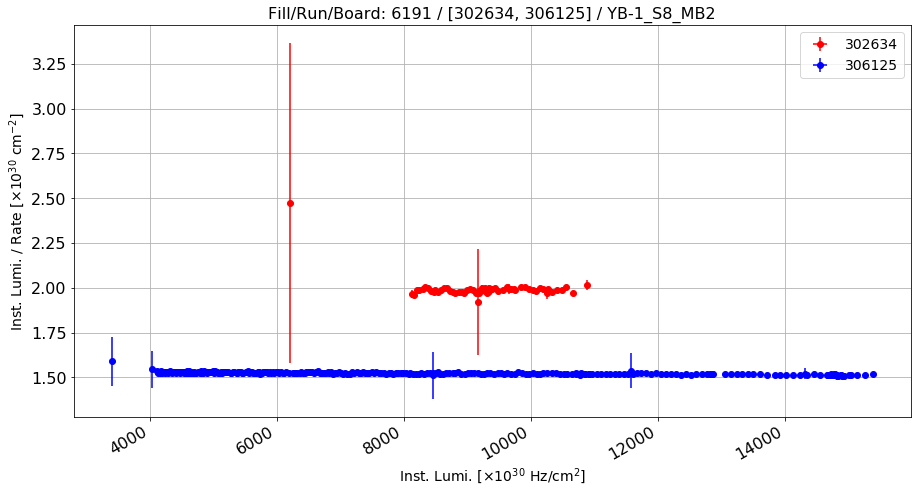

Anomalous Lumi/Rate: 1.99391697485 Normal Lumi/Rate: 1.52336320515 Ratio: 0.30889138461


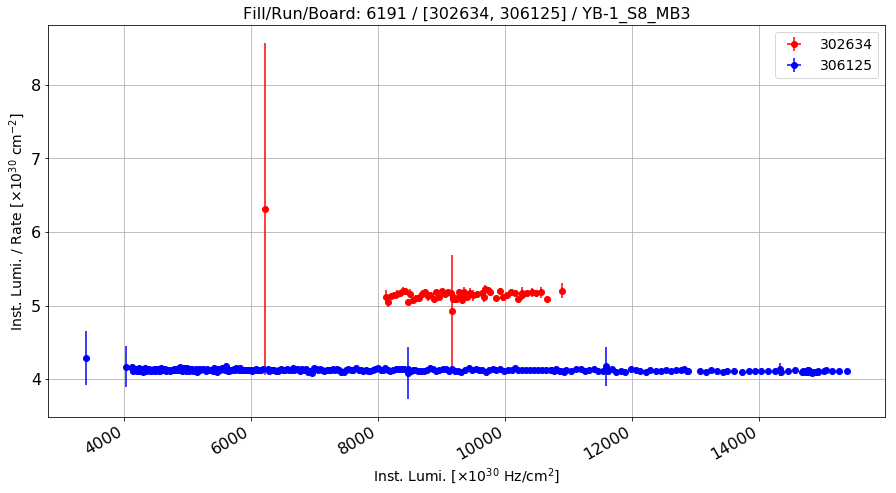

Anomalous Lumi/Rate: 5.15905389895 Normal Lumi/Rate: 4.12227283034 Ratio: 0.25150714455


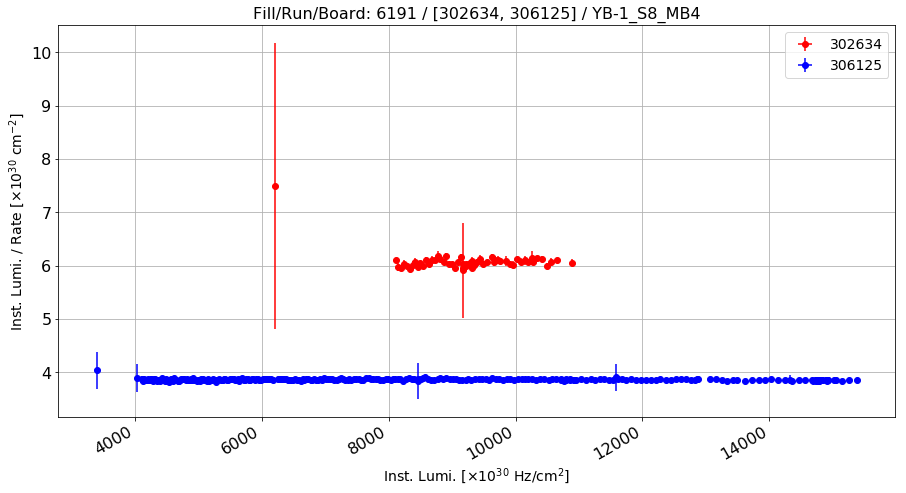

Anomalous Lumi/Rate: 6.07930614996 Normal Lumi/Rate: 3.86377596174 Ratio: 0.573410624778


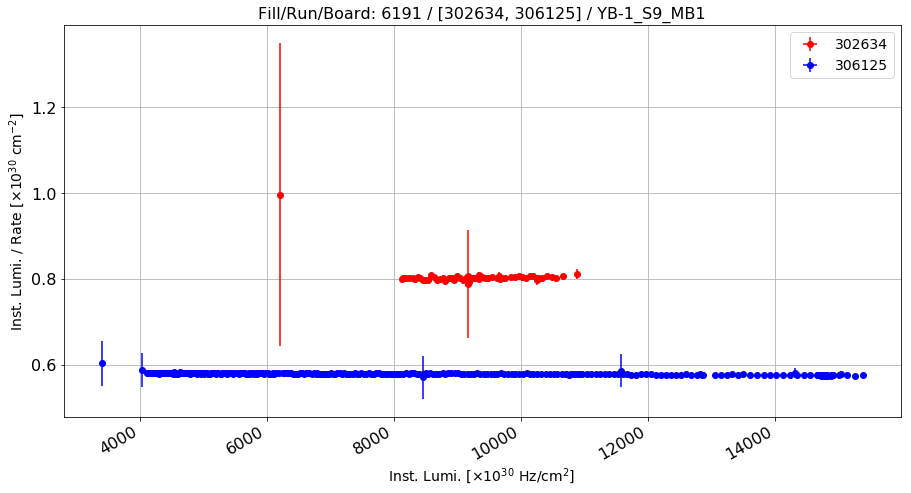

Anomalous Lumi/Rate: 0.805966597748 Normal Lumi/Rate: 0.579455629137 Ratio: 0.390903042823


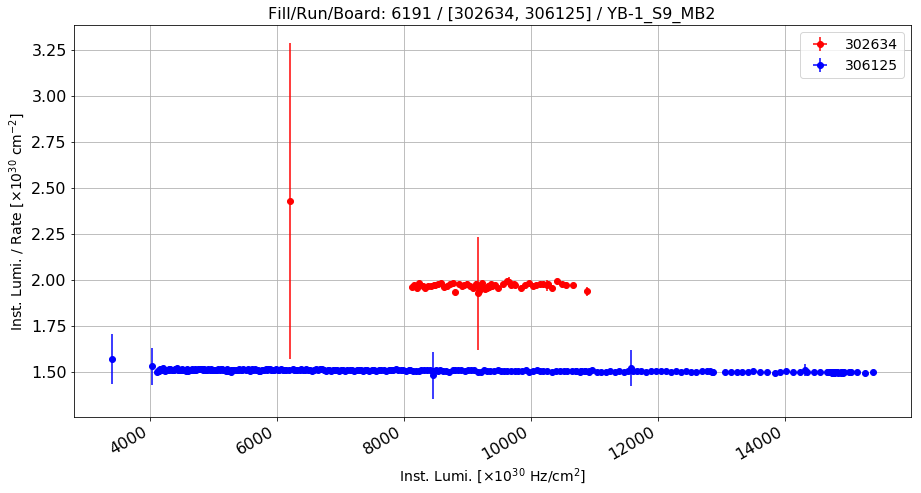

Anomalous Lumi/Rate: 1.97460953227 Normal Lumi/Rate: 1.50605798138 Ratio: 0.311111229901


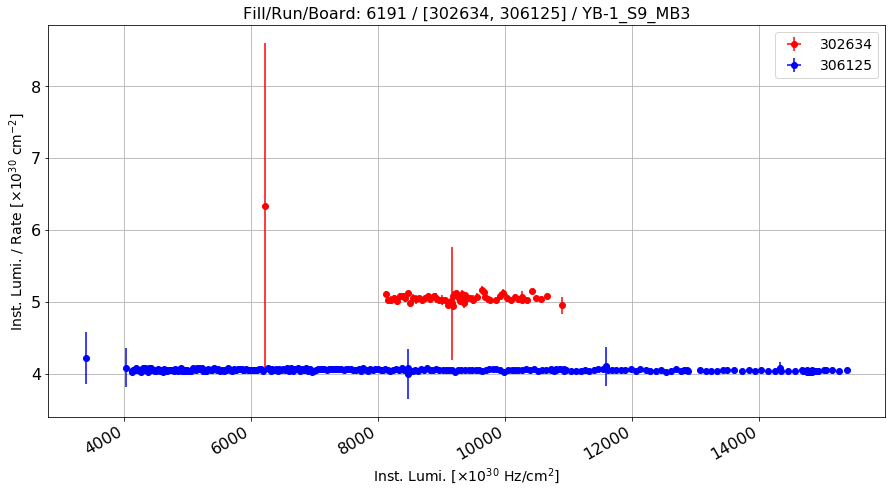

Anomalous Lumi/Rate: 5.07404424494 Normal Lumi/Rate: 4.05451454899 Ratio: 0.251455429158


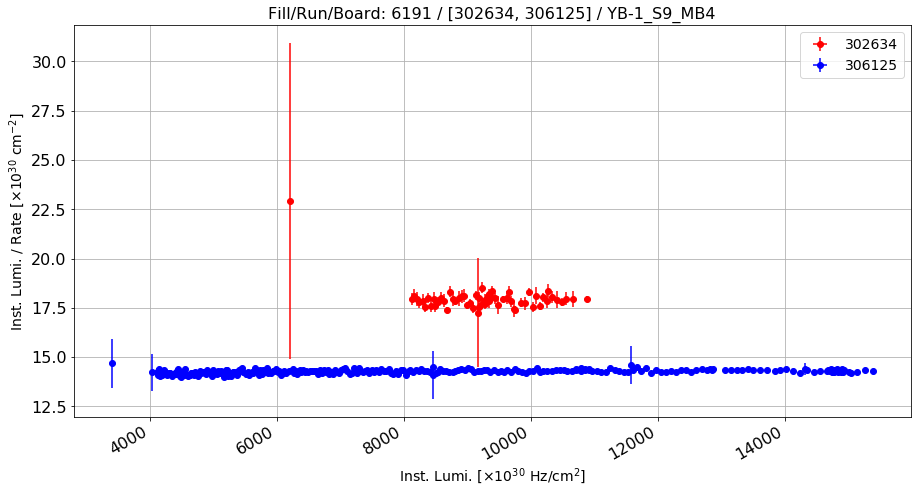

Anomalous Lumi/Rate: 17.9679002473 Normal Lumi/Rate: 14.271205557 Ratio: 0.259031703771


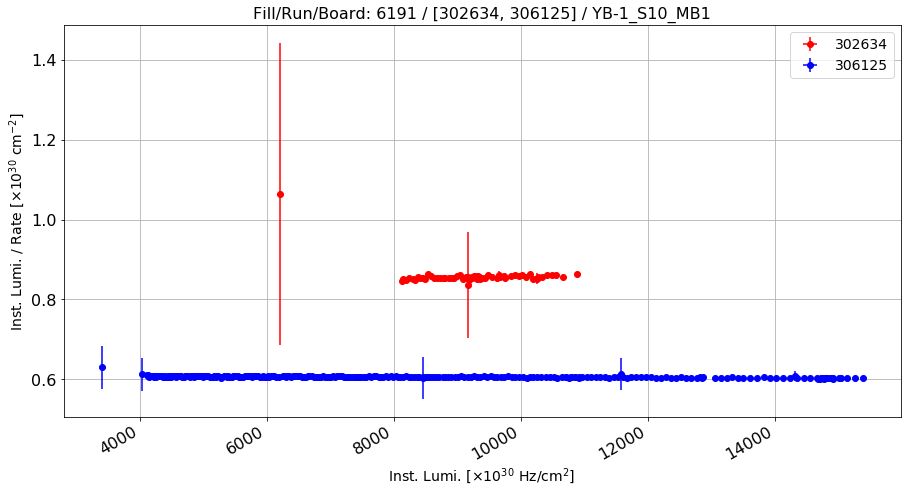

Anomalous Lumi/Rate: 0.858538867879 Normal Lumi/Rate: 0.605917222816 Ratio: 0.416924351299


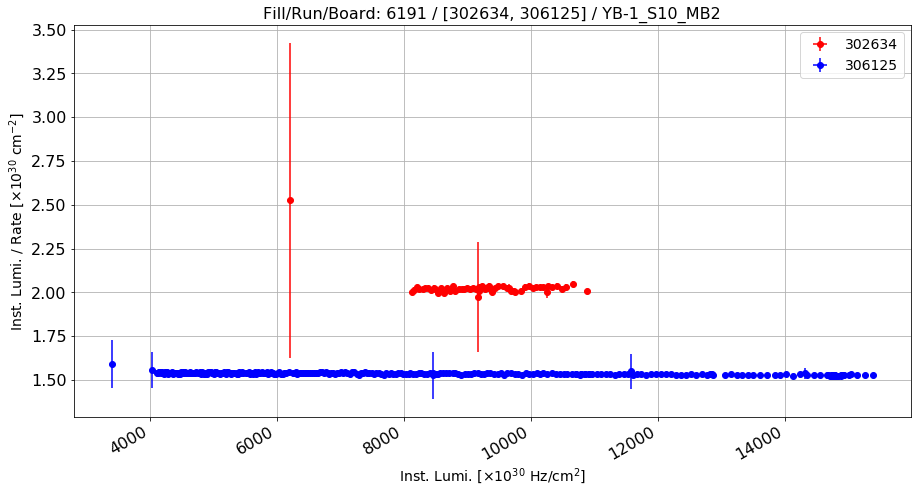

Anomalous Lumi/Rate: 2.02888402001 Normal Lumi/Rate: 1.53631978072 Ratio: 0.320613094663


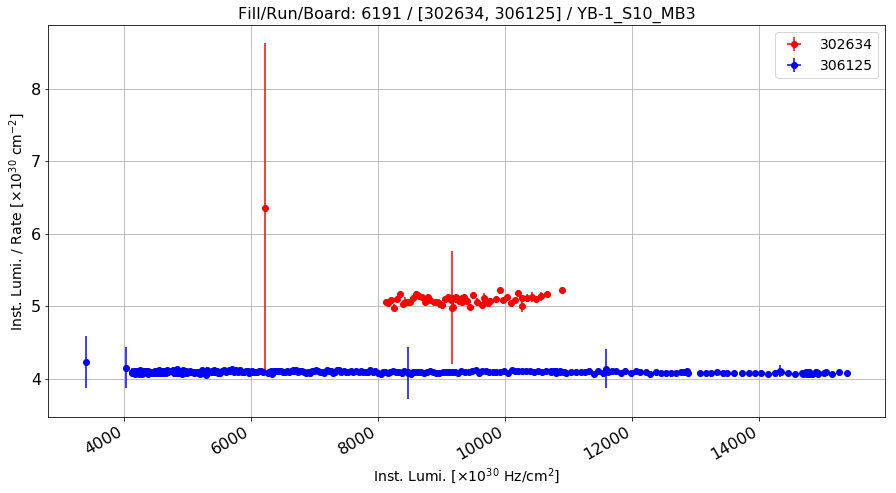

Anomalous Lumi/Rate: 5.10910948165 Normal Lumi/Rate: 4.09349555432 Ratio: 0.248104319121


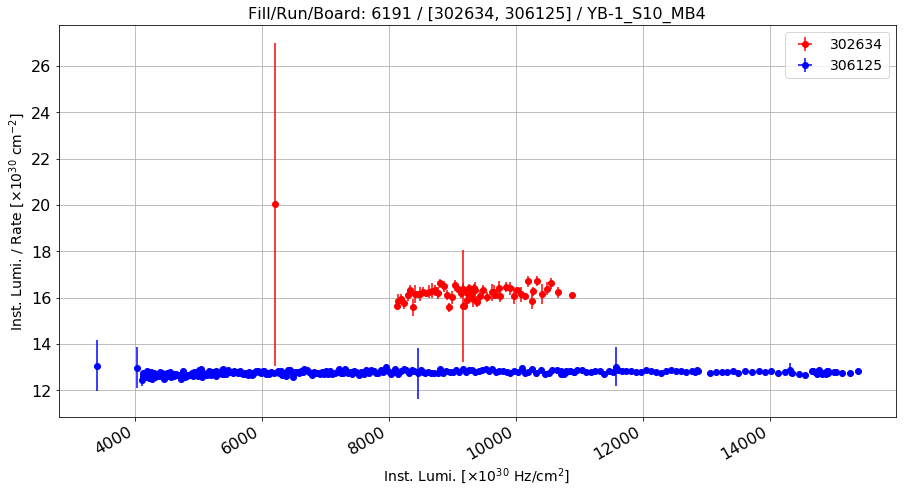

Anomalous Lumi/Rate: 16.2335353816 Normal Lumi/Rate: 12.7628628052 Ratio: 0.271935272624


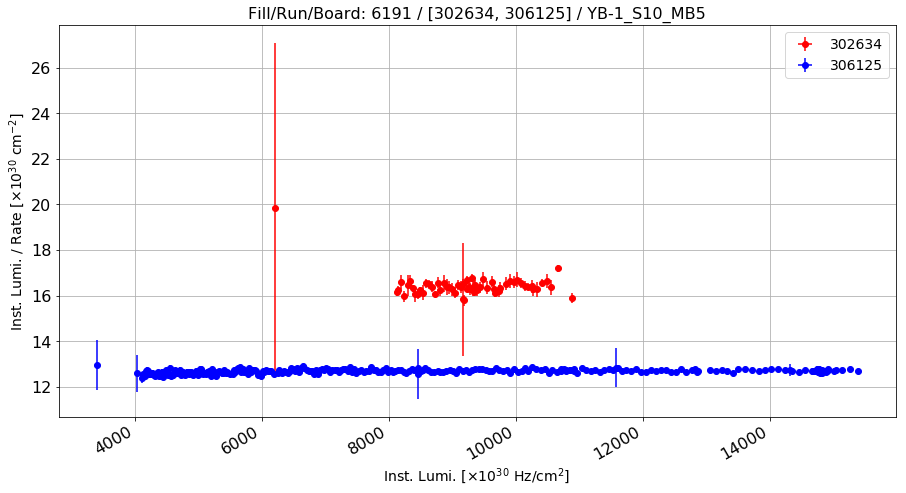

Anomalous Lumi/Rate: 16.4291055609 Normal Lumi/Rate: 12.6850336547 Ratio: 0.295156639561


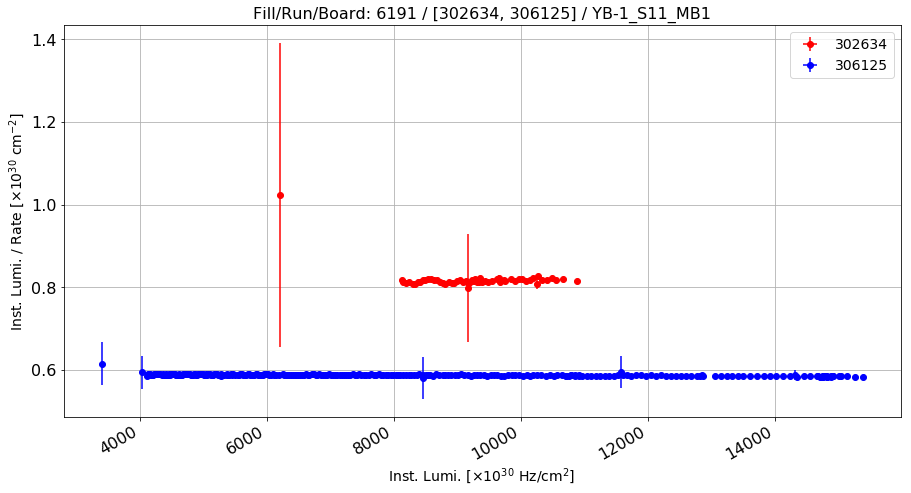

Anomalous Lumi/Rate: 0.818726345668 Normal Lumi/Rate: 0.587423205541 Ratio: 0.393758942353


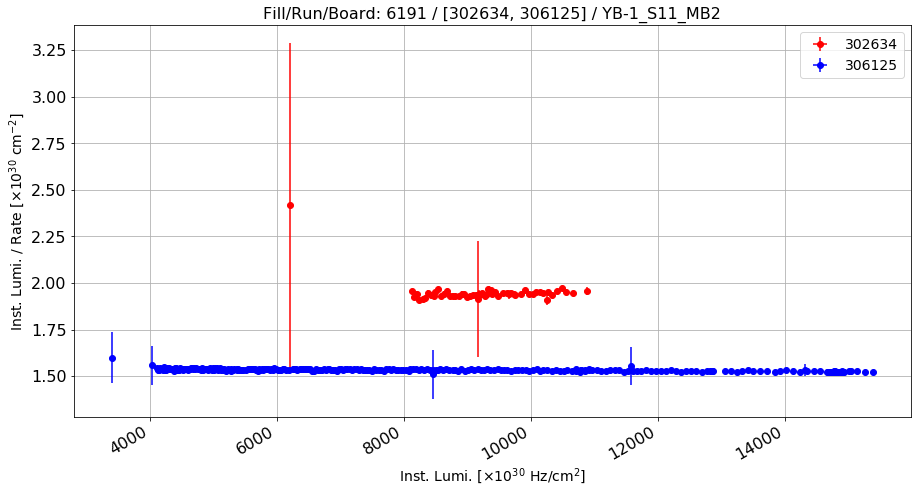

Anomalous Lumi/Rate: 1.94890828639 Normal Lumi/Rate: 1.53348741357 Ratio: 0.270899434284


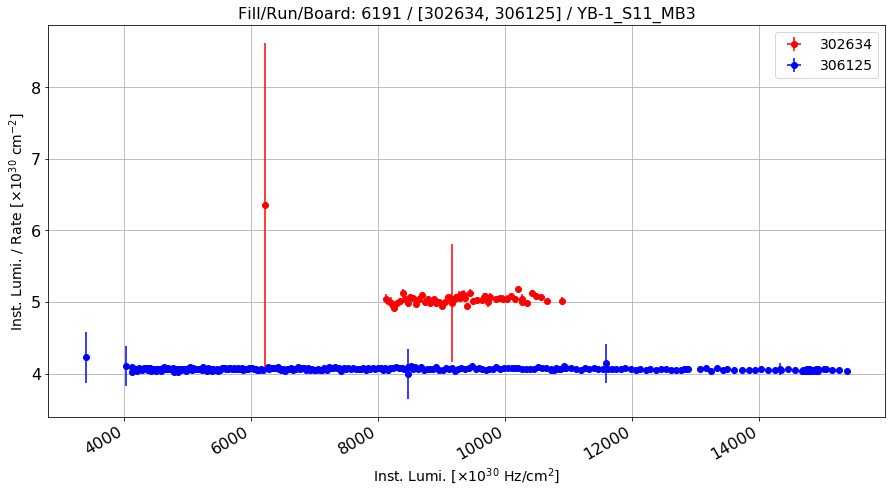

Anomalous Lumi/Rate: 5.06270162565 Normal Lumi/Rate: 4.06542162121 Ratio: 0.245307891127


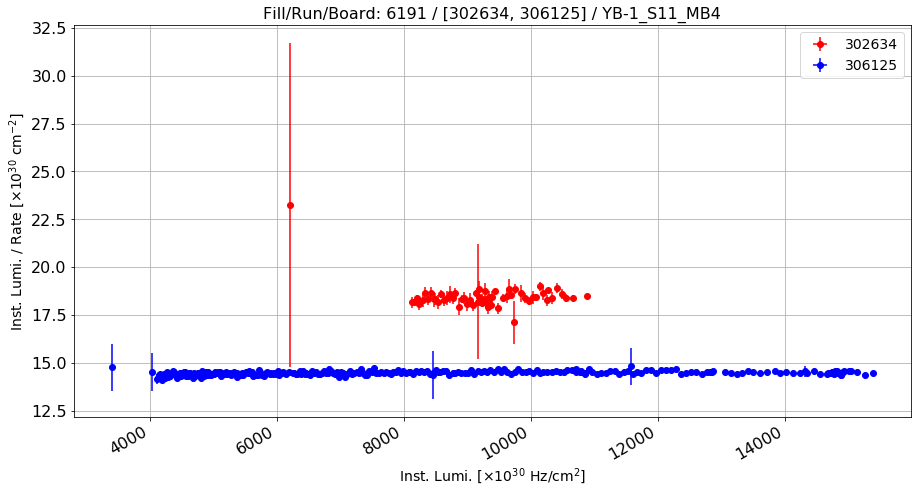

Anomalous Lumi/Rate: 18.4585472577 Normal Lumi/Rate: 14.4721901192 Ratio: 0.275449472797


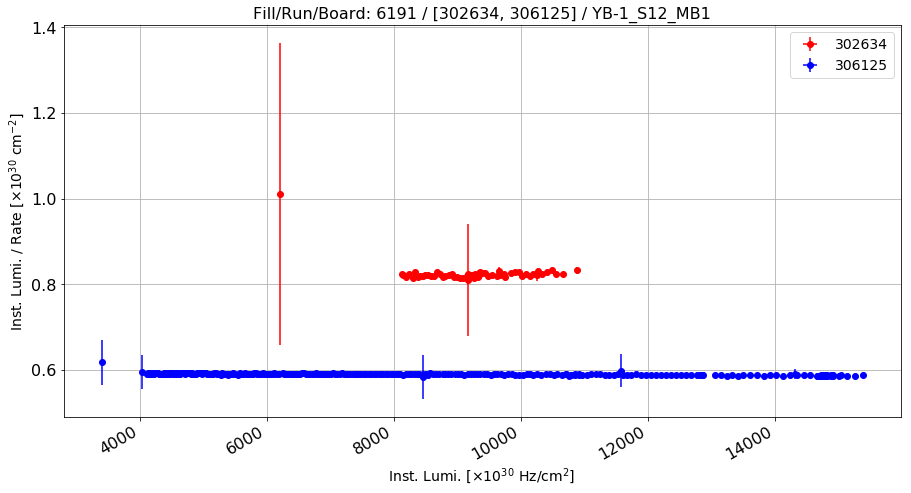

Anomalous Lumi/Rate: 0.825031957093 Normal Lumi/Rate: 0.589755900483 Ratio: 0.398938029136


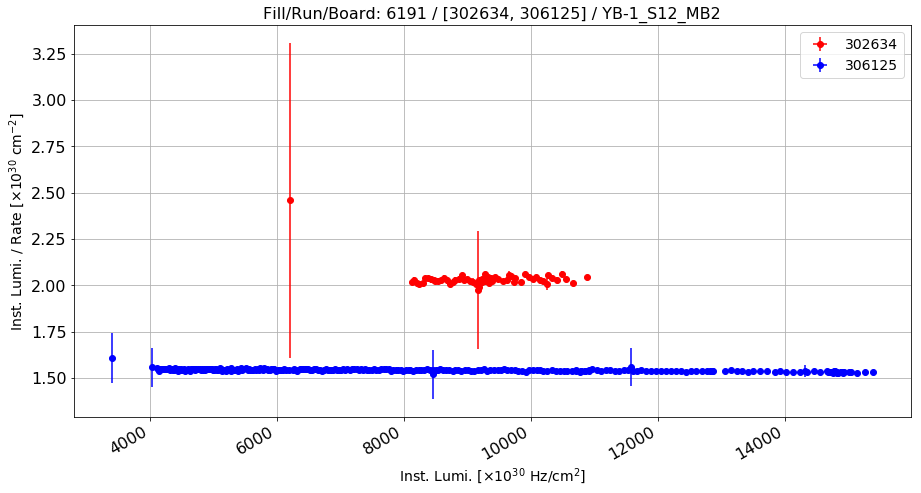

Anomalous Lumi/Rate: 2.03623002987 Normal Lumi/Rate: 1.54235554053 Ratio: 0.320207939327


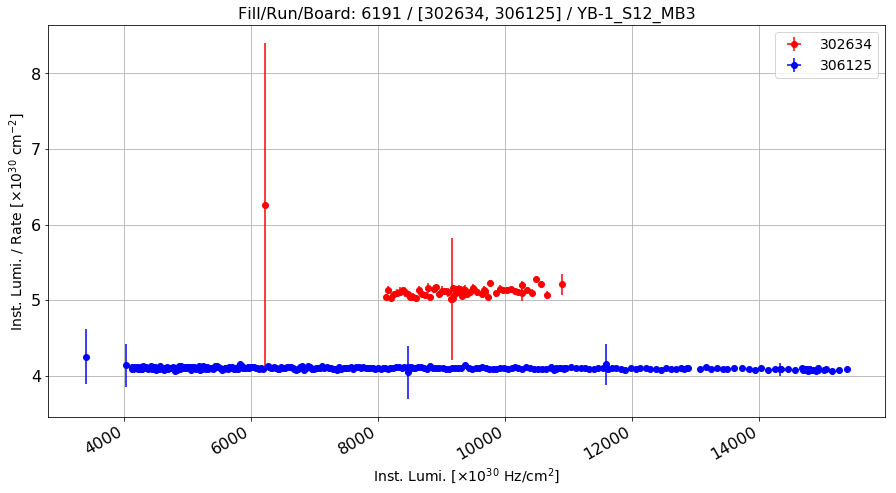

Anomalous Lumi/Rate: 5.12868185716 Normal Lumi/Rate: 4.09998858326 Ratio: 0.250901497165


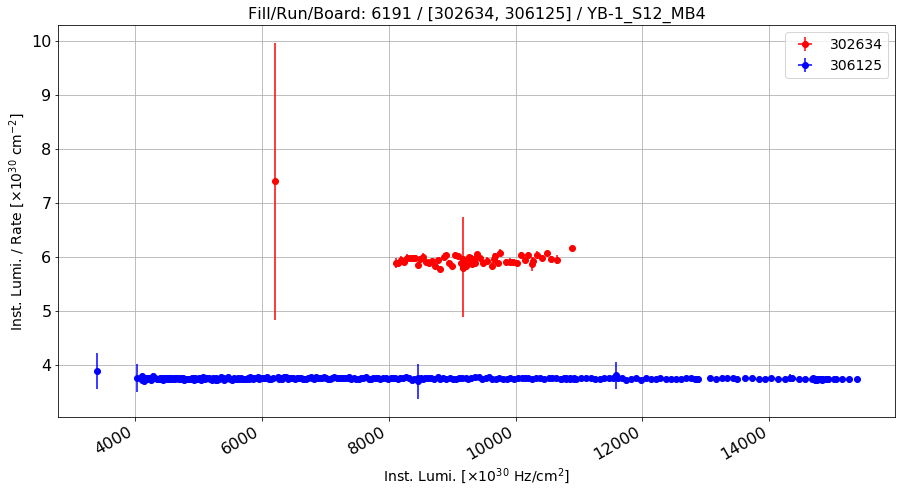

Anomalous Lumi/Rate: 5.9671175471 Normal Lumi/Rate: 3.75345432384 Ratio: 0.589766927279


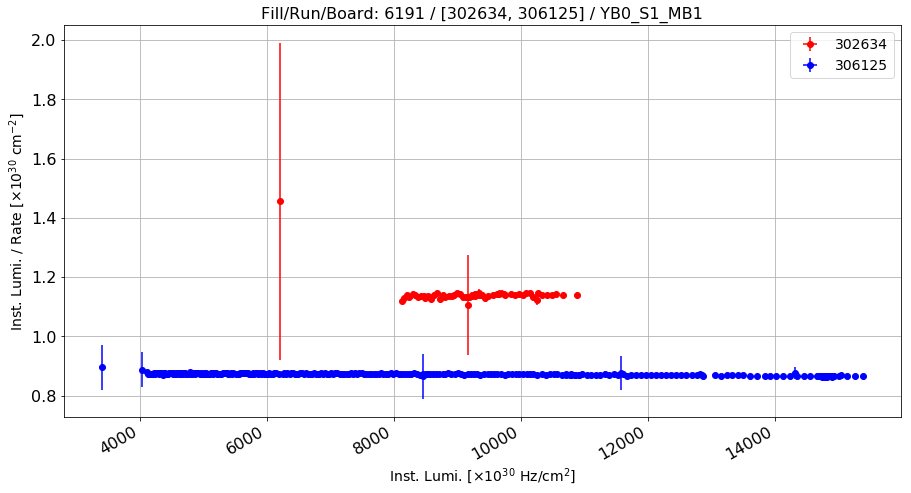

Anomalous Lumi/Rate: 1.14294154261 Normal Lumi/Rate: 0.873024040039 Ratio: 0.309175337895


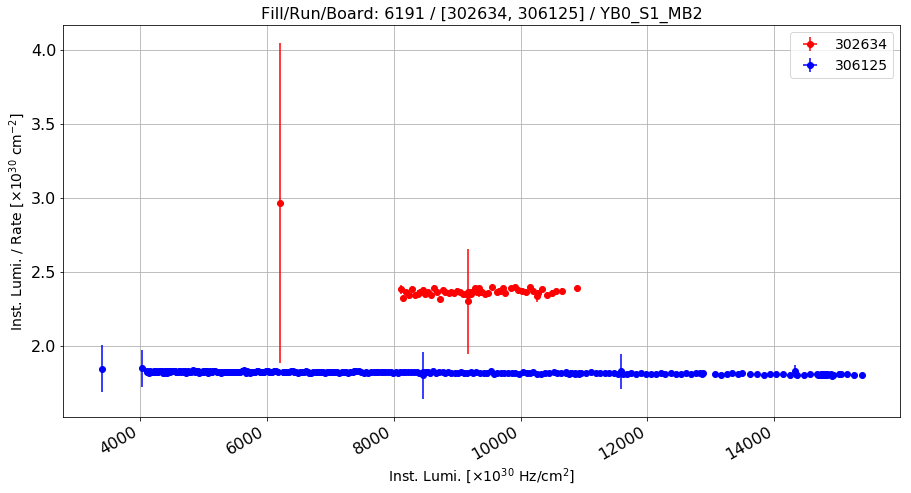

Anomalous Lumi/Rate: 2.37374624197 Normal Lumi/Rate: 1.8193782508 Ratio: 0.304701889737


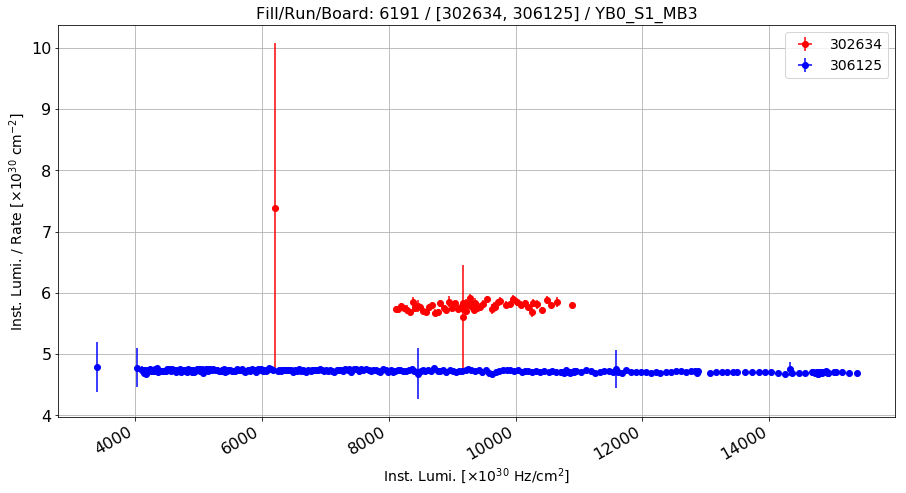

Anomalous Lumi/Rate: 5.81027419009 Normal Lumi/Rate: 4.72693072872 Ratio: 0.229185389746


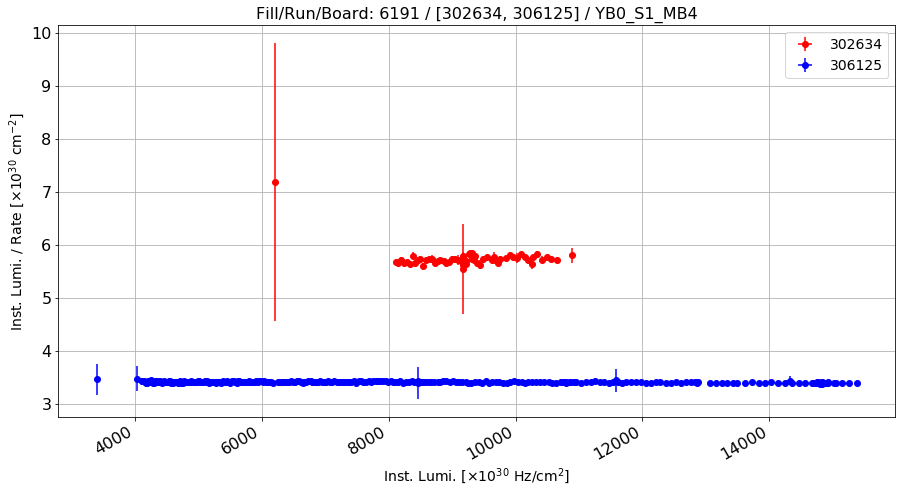

Anomalous Lumi/Rate: 5.74567042487 Normal Lumi/Rate: 3.41010733957 Ratio: 0.684894301773


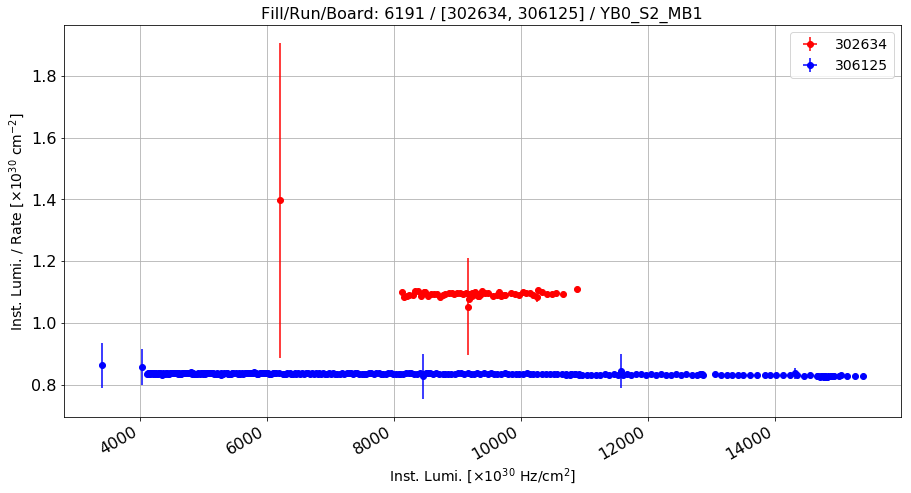

Anomalous Lumi/Rate: 1.0978477981 Normal Lumi/Rate: 0.834516317324 Ratio: 0.315549828456


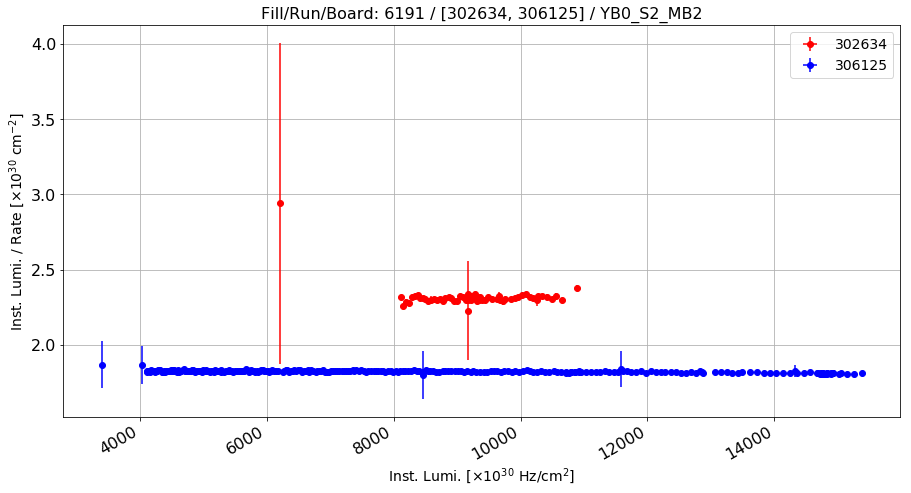

Anomalous Lumi/Rate: 2.31897991718 Normal Lumi/Rate: 1.82309375757 Ratio: 0.272002554751


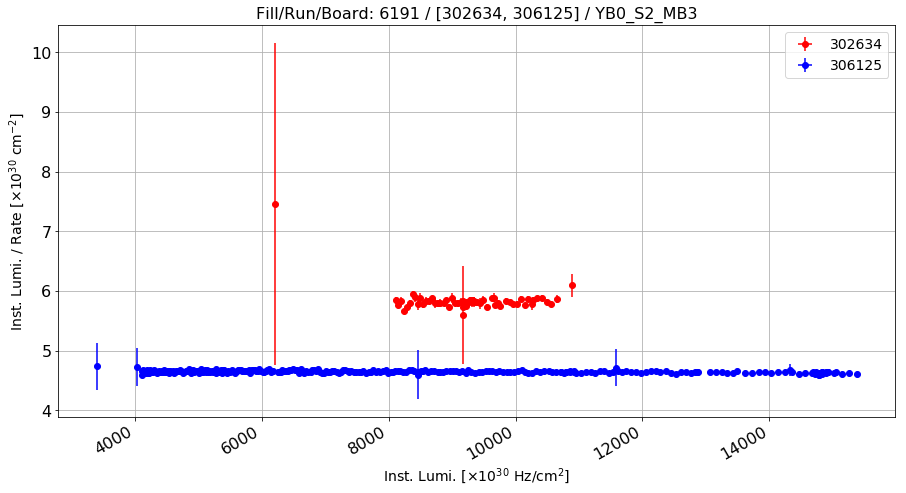

Anomalous Lumi/Rate: 5.84189601288 Normal Lumi/Rate: 4.64692654916 Ratio: 0.257152647257


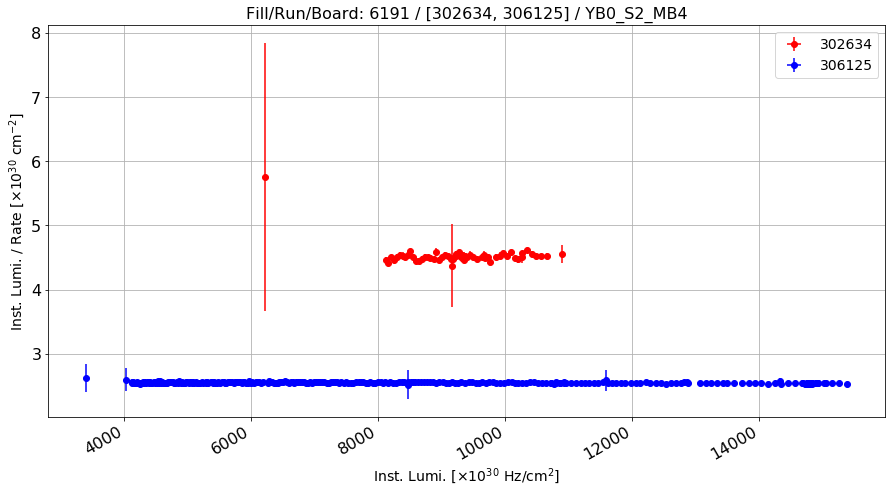

Anomalous Lumi/Rate: 4.53303752111 Normal Lumi/Rate: 2.55132584865 Ratio: 0.776737974689


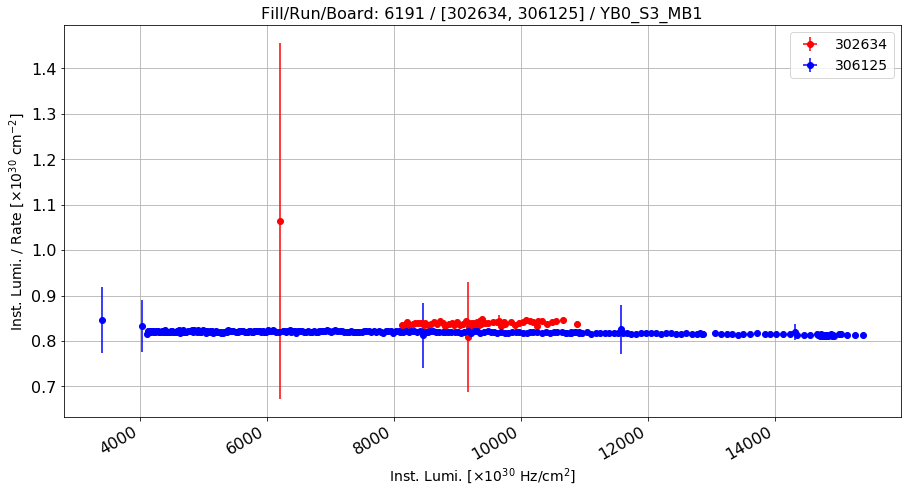

Anomalous Lumi/Rate: 0.84231345788 Normal Lumi/Rate: 0.819399718661 Ratio: 0.027964055512


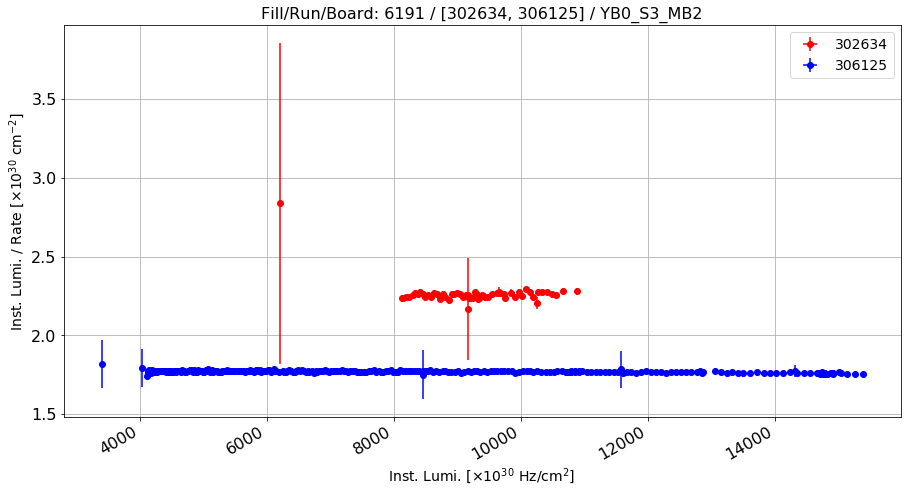

Anomalous Lumi/Rate: 2.26292853033 Normal Lumi/Rate: 1.77014481485 Ratio: 0.278386102283


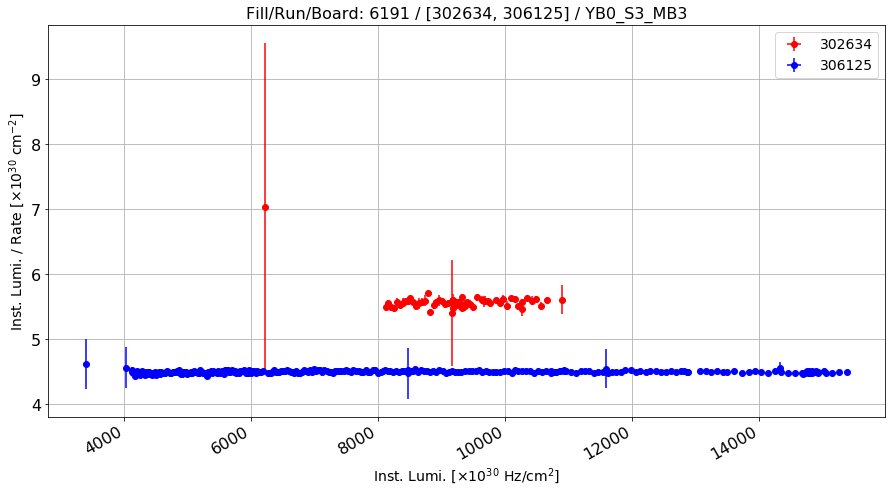

Anomalous Lumi/Rate: 5.58560685436 Normal Lumi/Rate: 4.50085894643 Ratio: 0.241009087565


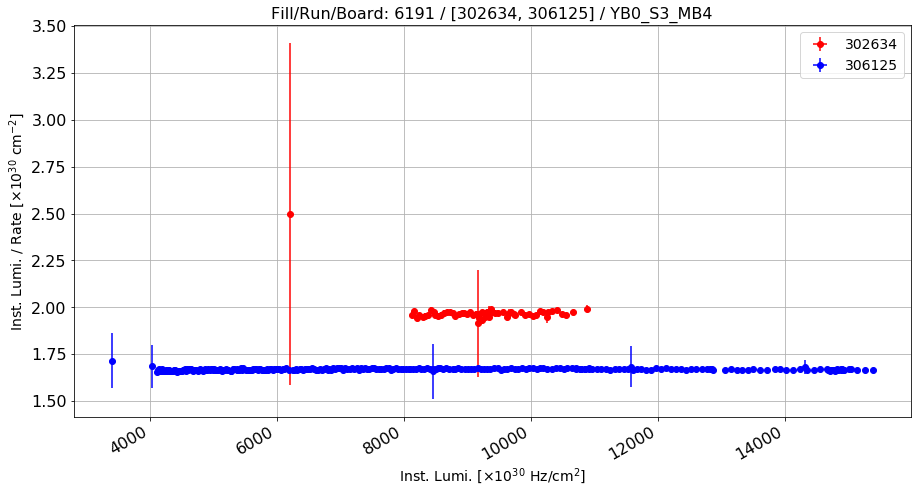

Anomalous Lumi/Rate: 1.97360821595 Normal Lumi/Rate: 1.66904601114 Ratio: 0.182476817763


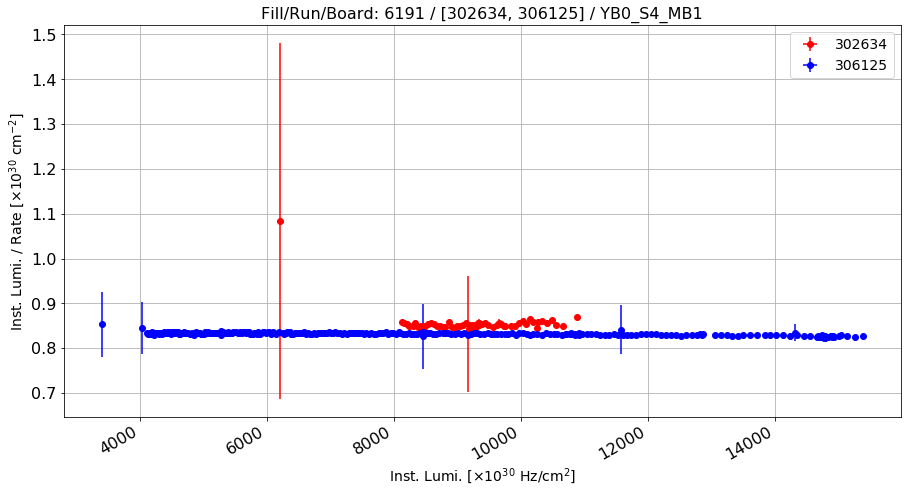

Anomalous Lumi/Rate: 0.856139890371 Normal Lumi/Rate: 0.832176790555 Ratio: 0.0287956839073


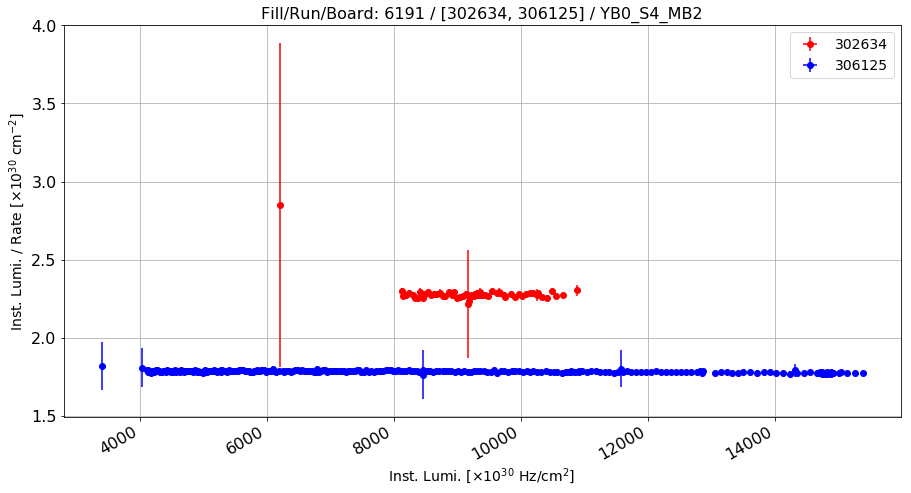

Anomalous Lumi/Rate: 2.28407613939 Normal Lumi/Rate: 1.78313579169 Ratio: 0.280932248701


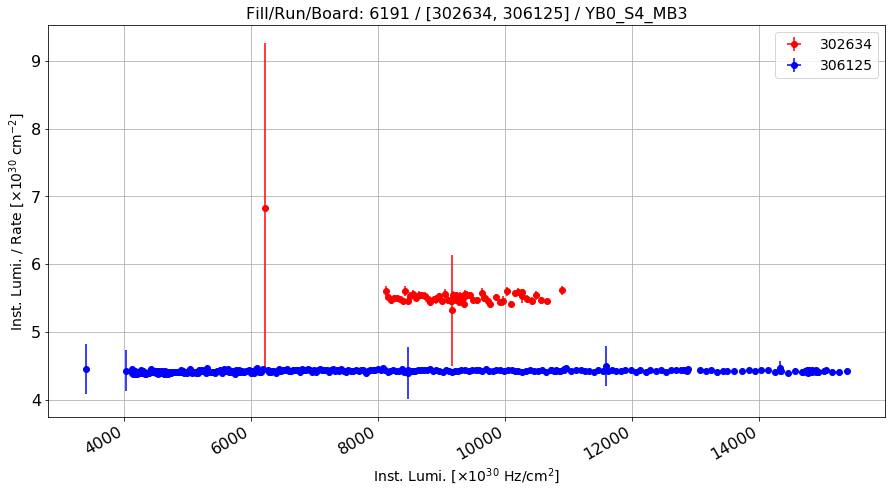

Anomalous Lumi/Rate: 5.52366699513 Normal Lumi/Rate: 4.42204459665 Ratio: 0.249120598944


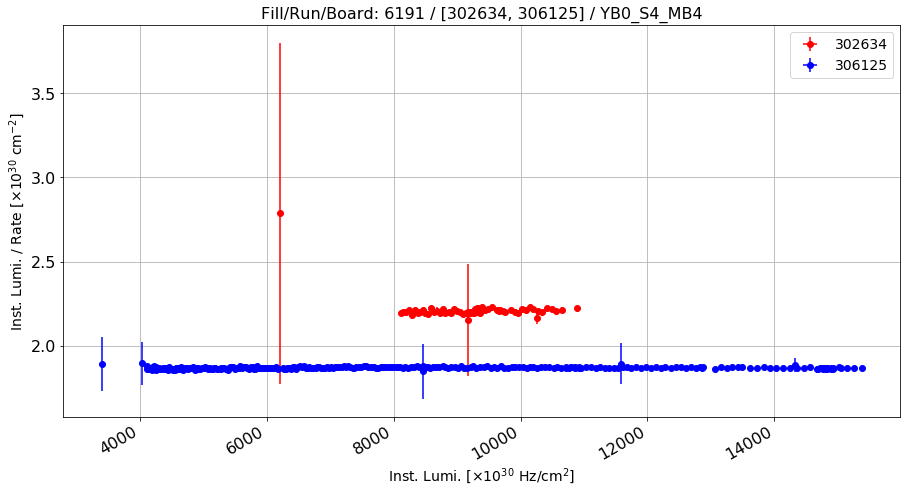

Anomalous Lumi/Rate: 2.2137513163 Normal Lumi/Rate: 1.86824627099 Ratio: 0.184935493074


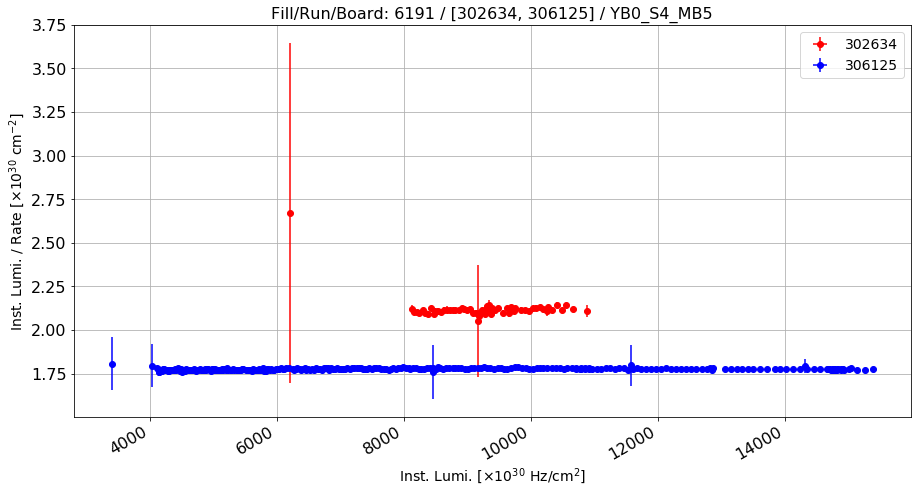

Anomalous Lumi/Rate: 2.12220972362 Normal Lumi/Rate: 1.77644322313 Ratio: 0.19463977007


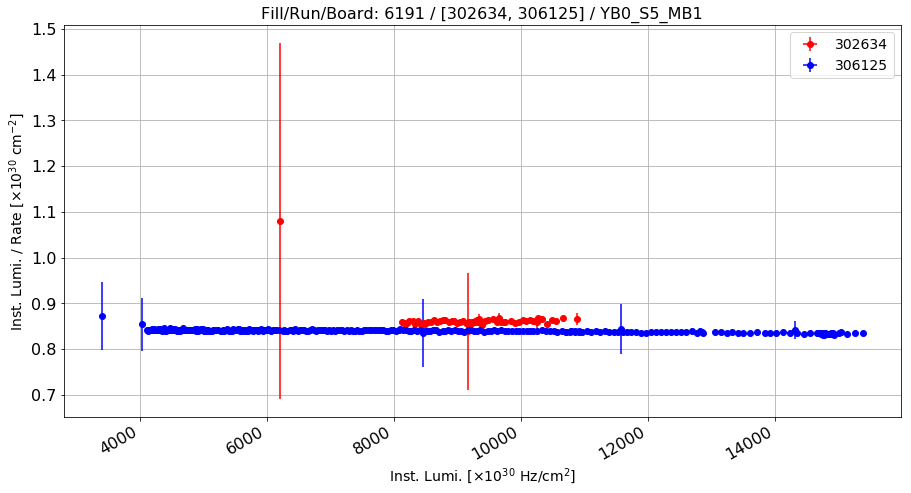

Anomalous Lumi/Rate: 0.863385674228 Normal Lumi/Rate: 0.839651335619 Ratio: 0.0282668979401


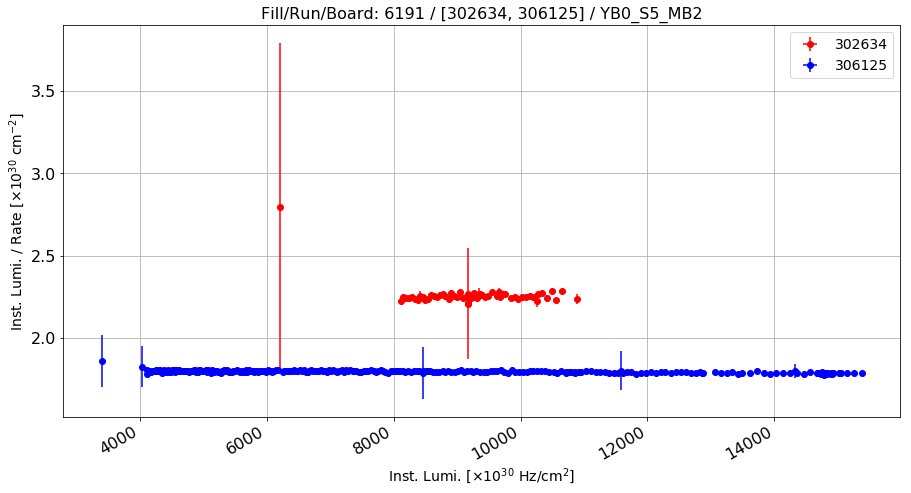

Anomalous Lumi/Rate: 2.2602344306 Normal Lumi/Rate: 1.79448247054 Ratio: 0.259546675826


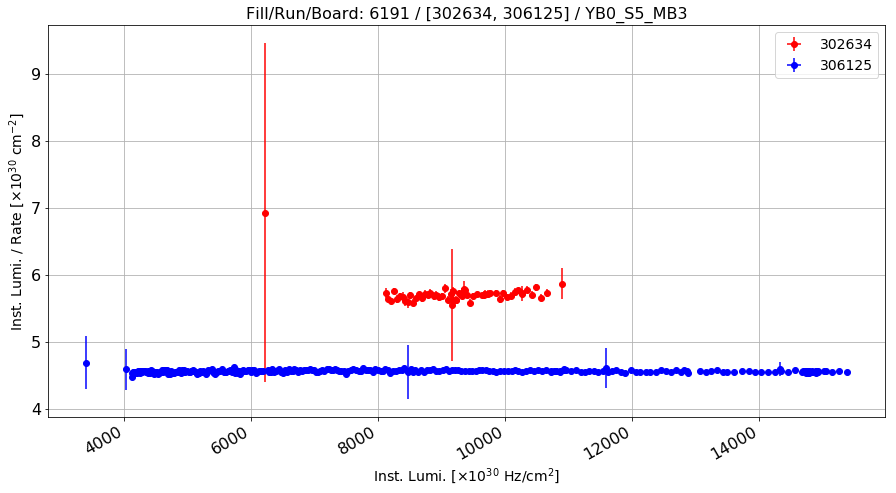

Anomalous Lumi/Rate: 5.71383529438 Normal Lumi/Rate: 4.55944124666 Ratio: 0.253187613408


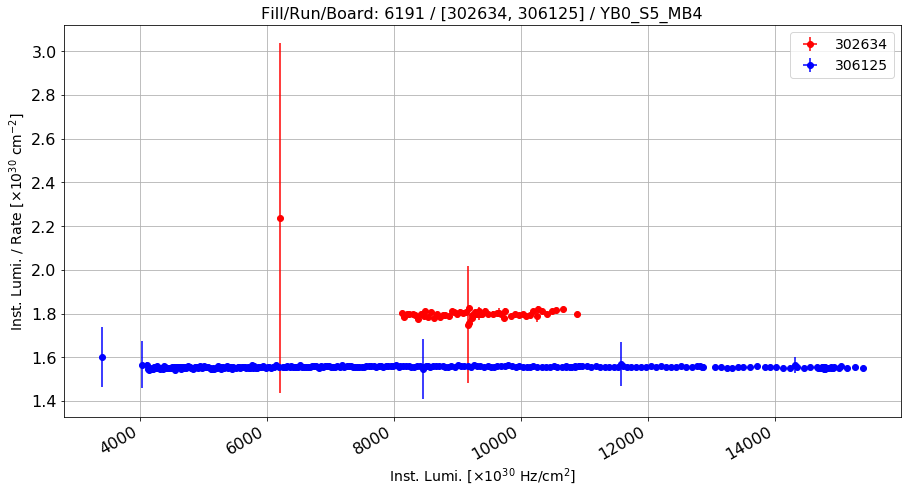

Anomalous Lumi/Rate: 1.80526301935 Normal Lumi/Rate: 1.5560745464 Ratio: 0.160139161409


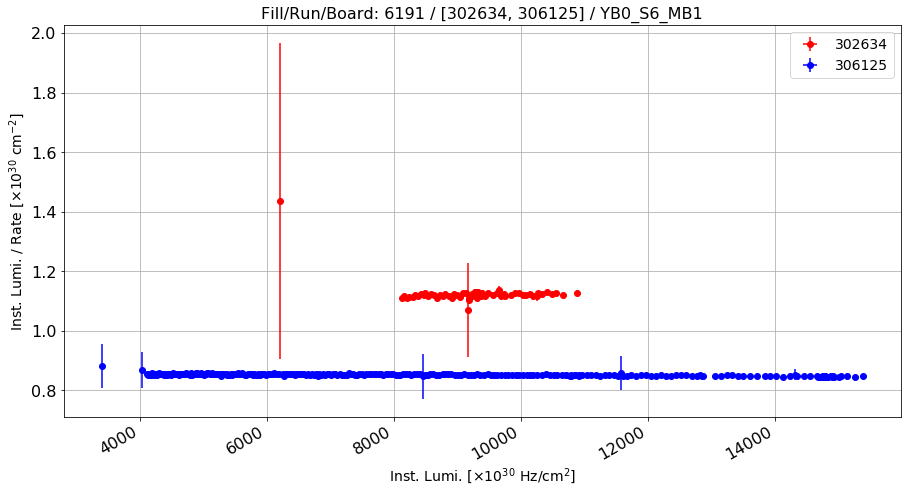

Anomalous Lumi/Rate: 1.12551926782 Normal Lumi/Rate: 0.852637829923 Ratio: 0.320043784503


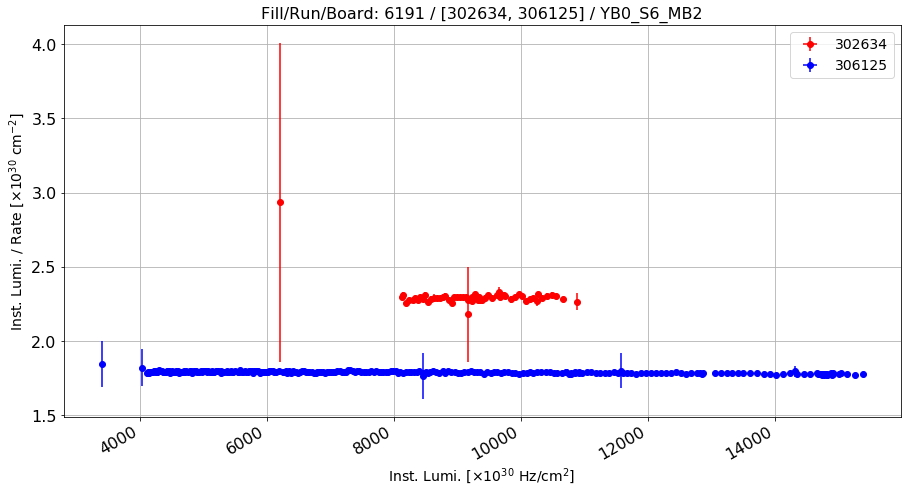

Anomalous Lumi/Rate: 2.30086525622 Normal Lumi/Rate: 1.79117419057 Ratio: 0.284556950598


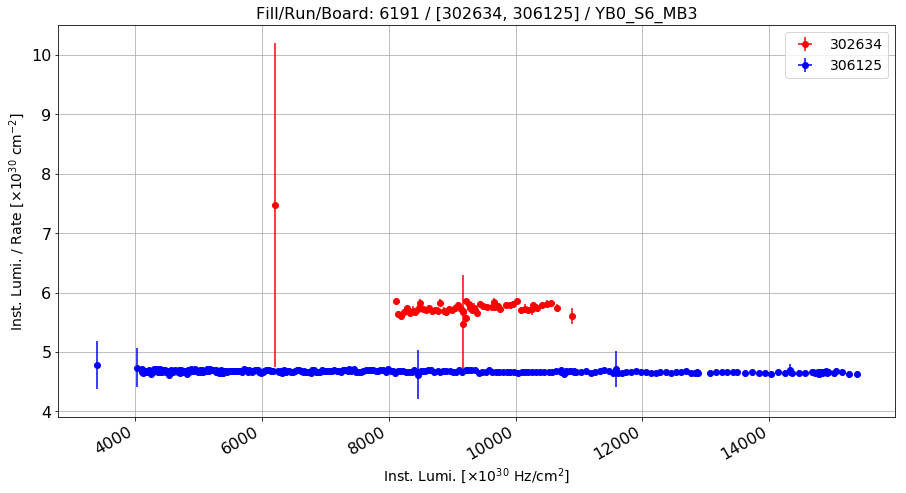

Anomalous Lumi/Rate: 5.76005406135 Normal Lumi/Rate: 4.67201067949 Ratio: 0.232885465488


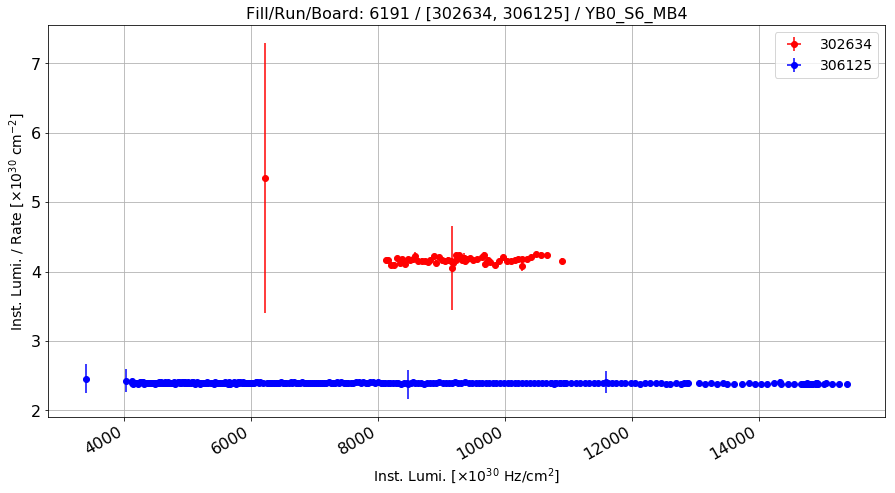

Anomalous Lumi/Rate: 4.18768269765 Normal Lumi/Rate: 2.39333452949 Ratio: 0.749727272157


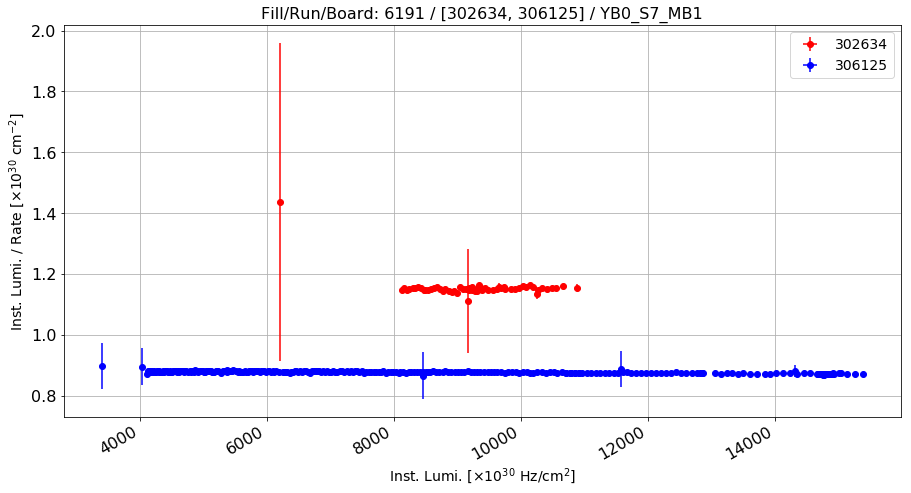

Anomalous Lumi/Rate: 1.15550176969 Normal Lumi/Rate: 0.878095428713 Ratio: 0.315918215617


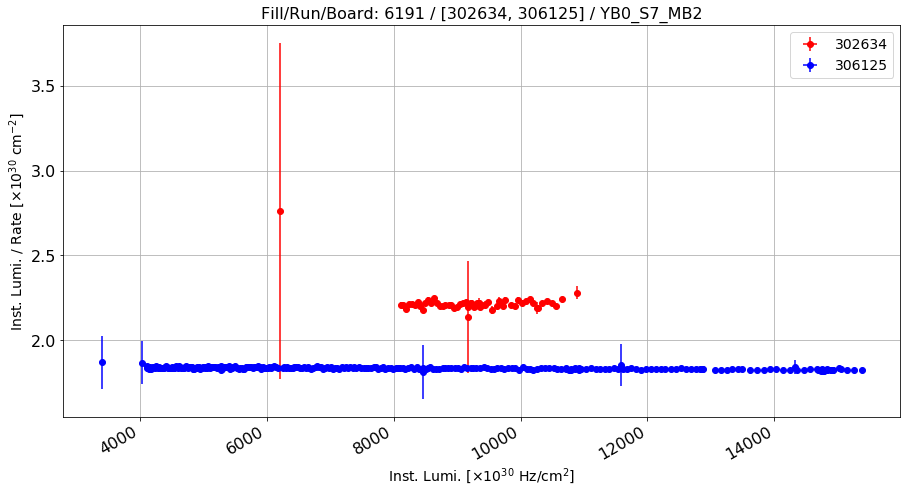

Anomalous Lumi/Rate: 2.22171465347 Normal Lumi/Rate: 1.83602163794 Ratio: 0.210069972792


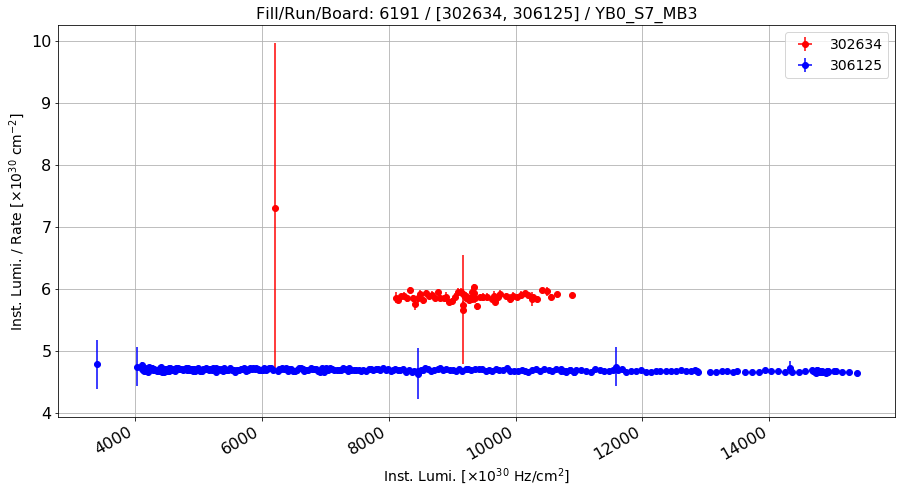

Anomalous Lumi/Rate: 5.89337256808 Normal Lumi/Rate: 4.6901231344 Ratio: 0.256549646819


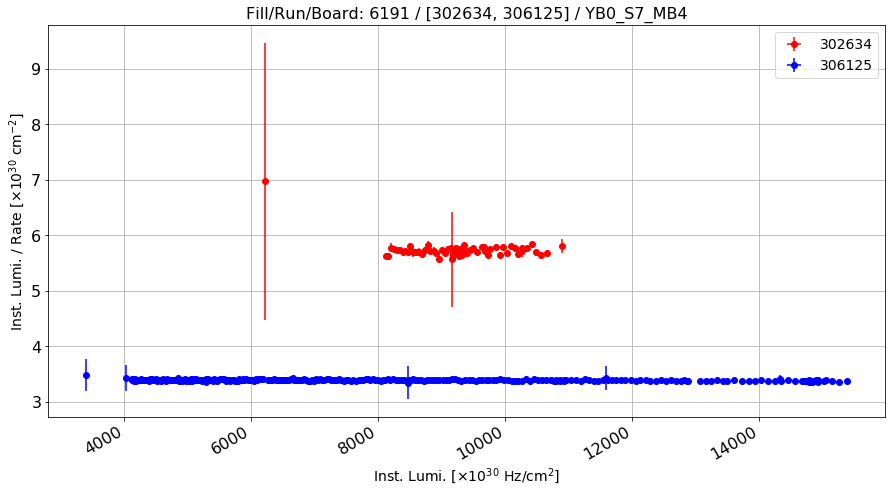

Anomalous Lumi/Rate: 5.73976127968 Normal Lumi/Rate: 3.38911650456 Ratio: 0.693586299541


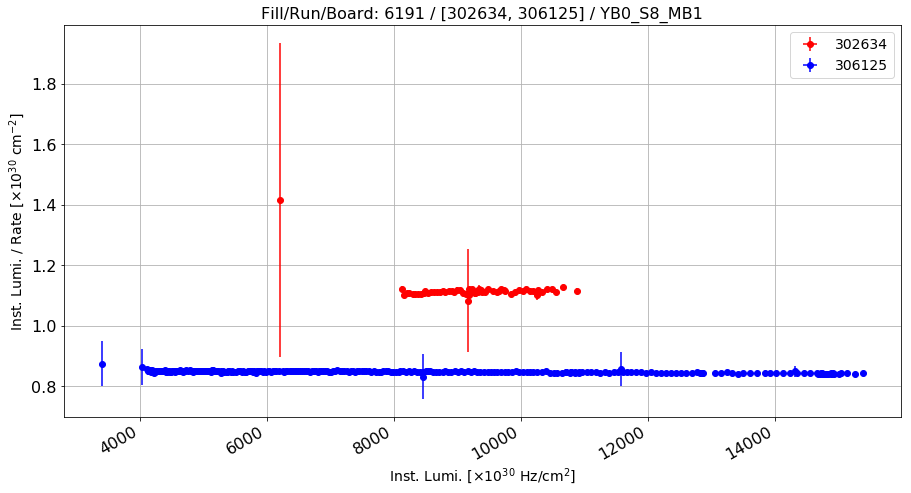

Anomalous Lumi/Rate: 1.11783339366 Normal Lumi/Rate: 0.848125725195 Ratio: 0.318004348242


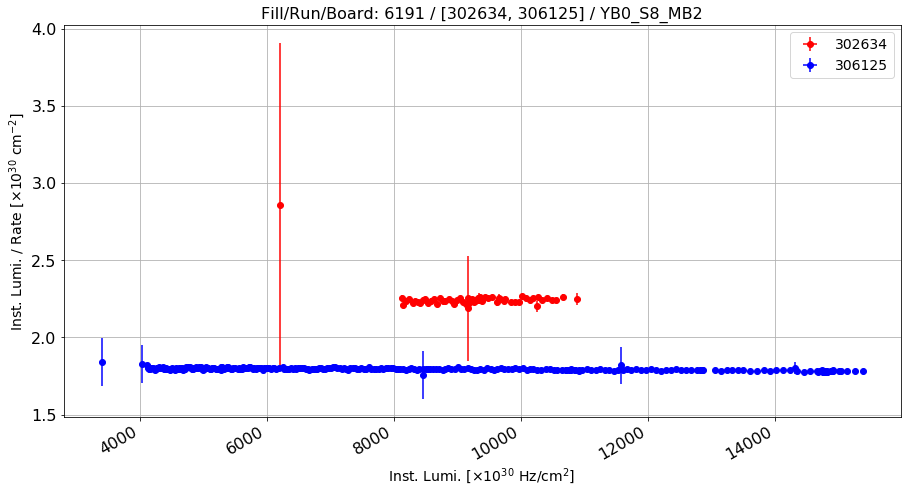

Anomalous Lumi/Rate: 2.25069033691 Normal Lumi/Rate: 1.79506421848 Ratio: 0.253821625843


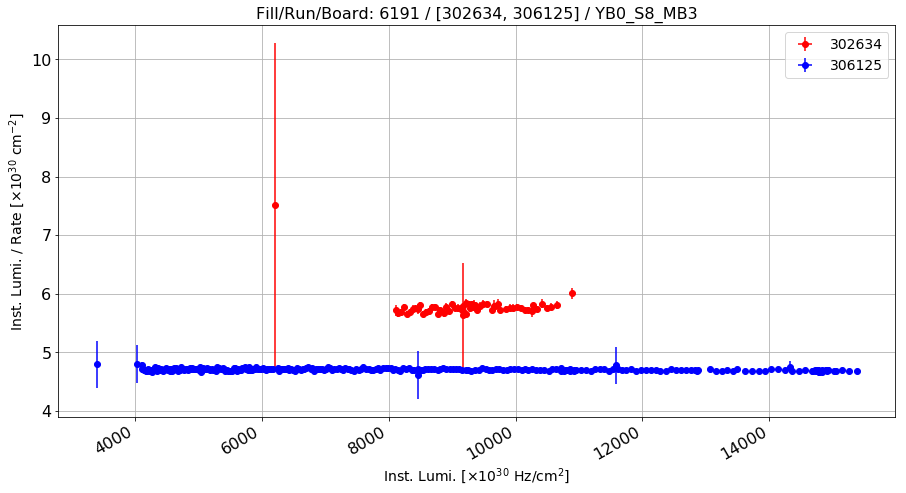

Anomalous Lumi/Rate: 5.78584107669 Normal Lumi/Rate: 4.70769979237 Ratio: 0.229016575369


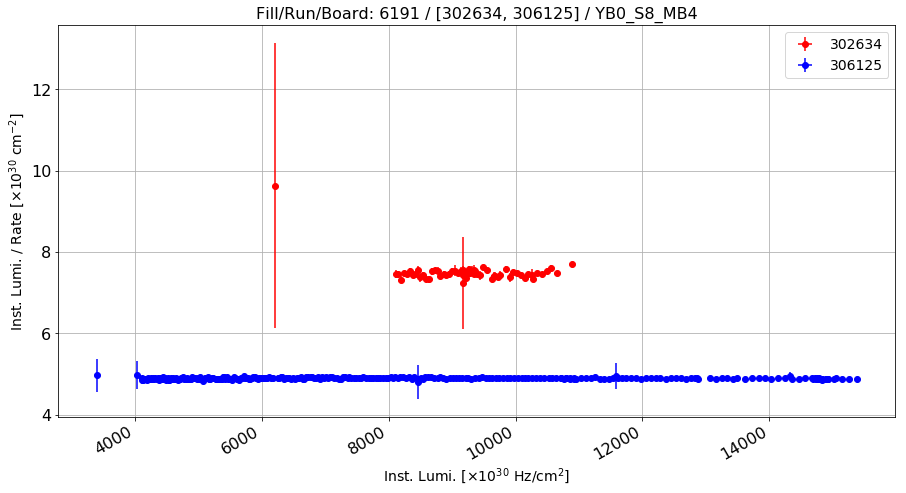

Anomalous Lumi/Rate: 7.5039763642 Normal Lumi/Rate: 4.89400167483 Ratio: 0.533300734815


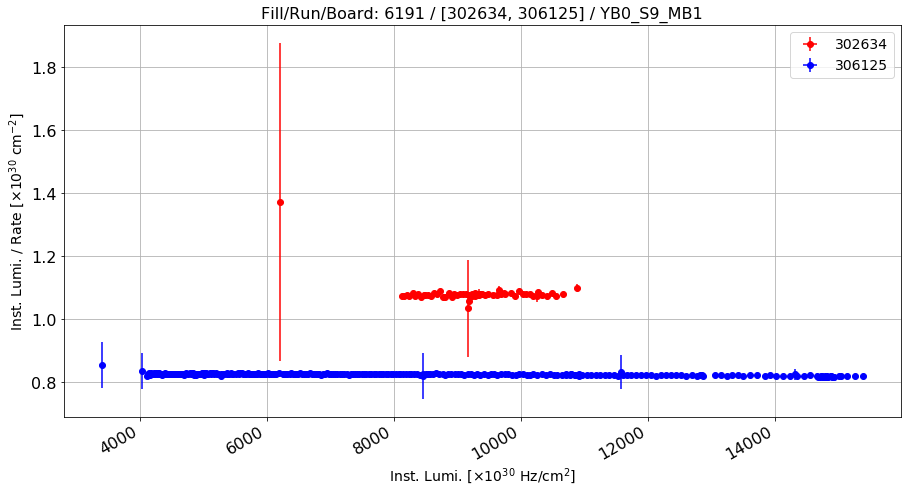

Anomalous Lumi/Rate: 1.08261248797 Normal Lumi/Rate: 0.824769690312 Ratio: 0.312623997569


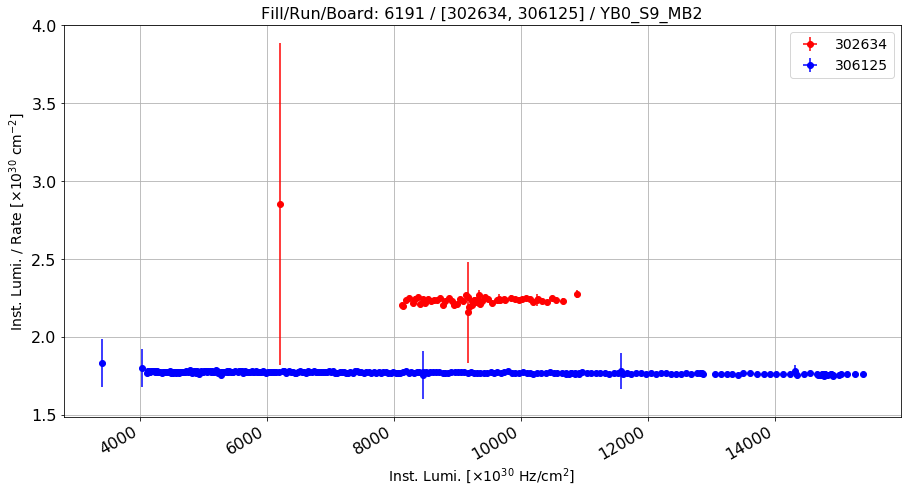

Anomalous Lumi/Rate: 2.24467190947 Normal Lumi/Rate: 1.77255372682 Ratio: 0.266349152355


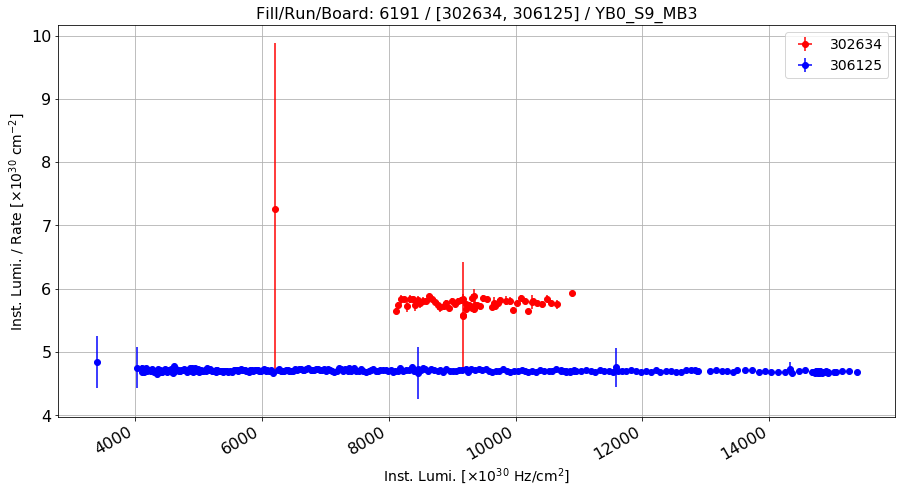

Anomalous Lumi/Rate: 5.79716938029 Normal Lumi/Rate: 4.707543873 Ratio: 0.231463696714


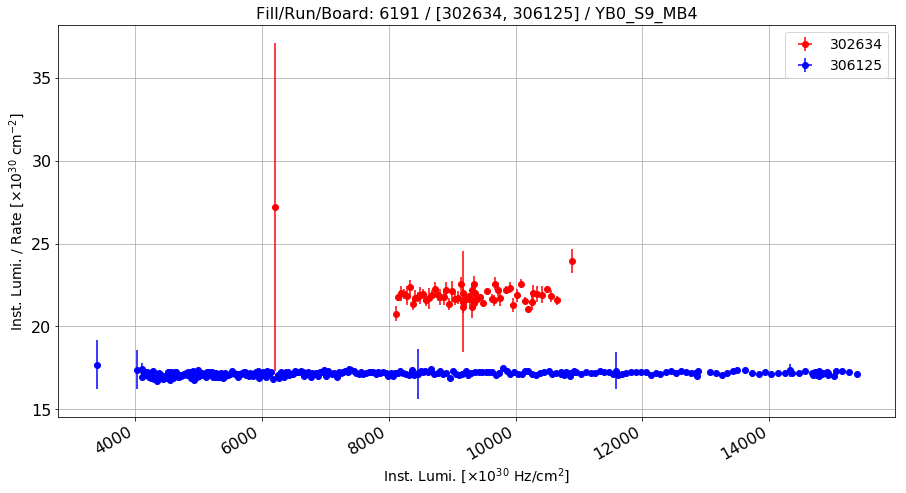

Anomalous Lumi/Rate: 21.9475186478 Normal Lumi/Rate: 17.1609083015 Ratio: 0.278925232993


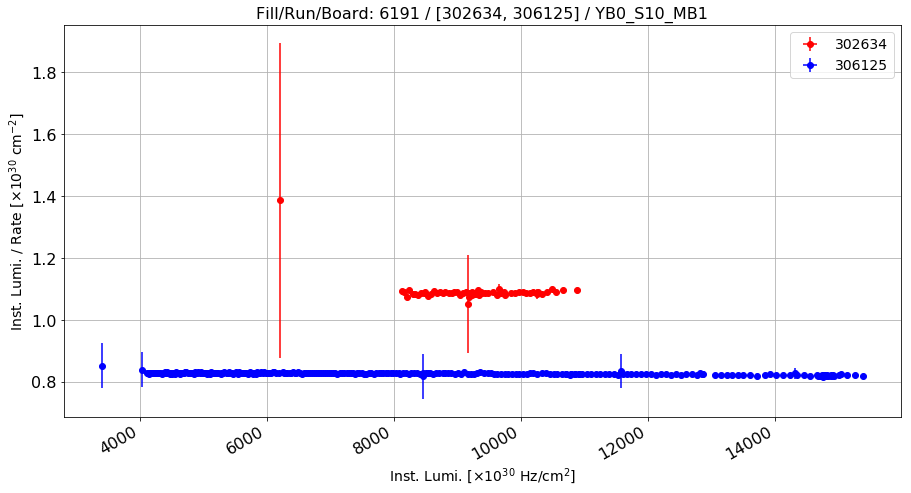

Anomalous Lumi/Rate: 1.09251199857 Normal Lumi/Rate: 0.827790879712 Ratio: 0.319792263175


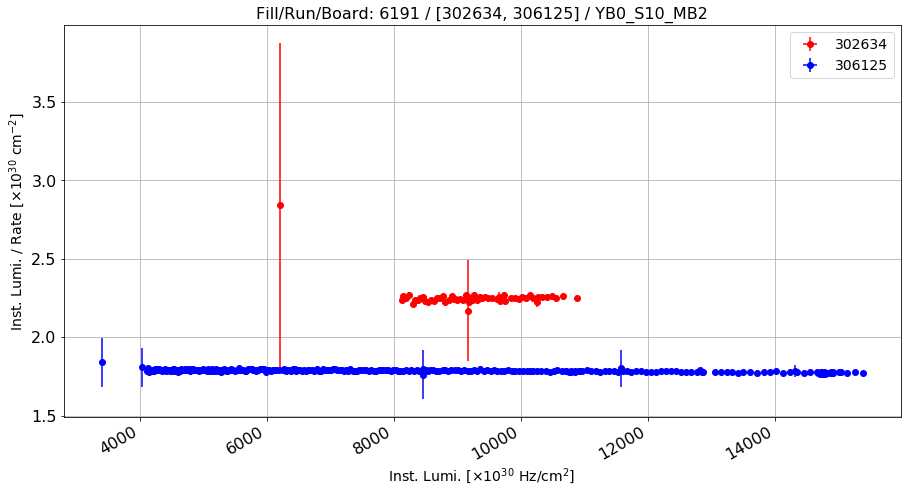

Anomalous Lumi/Rate: 2.25545032365 Normal Lumi/Rate: 1.78620791144 Ratio: 0.262703131705


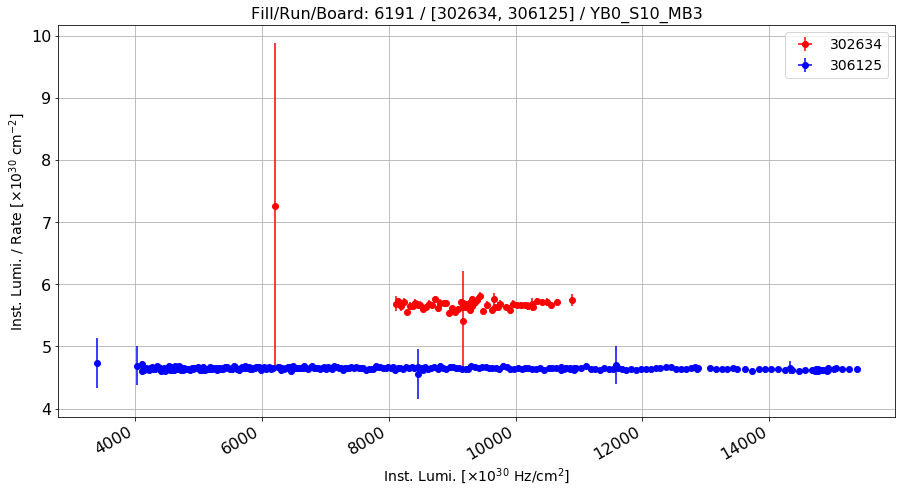

Anomalous Lumi/Rate: 5.69341354354 Normal Lumi/Rate: 4.64660823814 Ratio: 0.225283744993


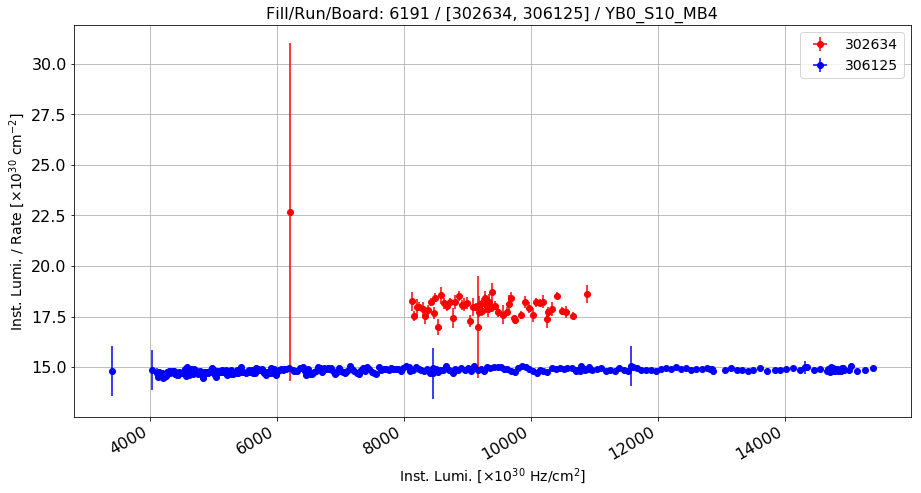

Anomalous Lumi/Rate: 18.0189309478 Normal Lumi/Rate: 14.8382764465 Ratio: 0.214354713825


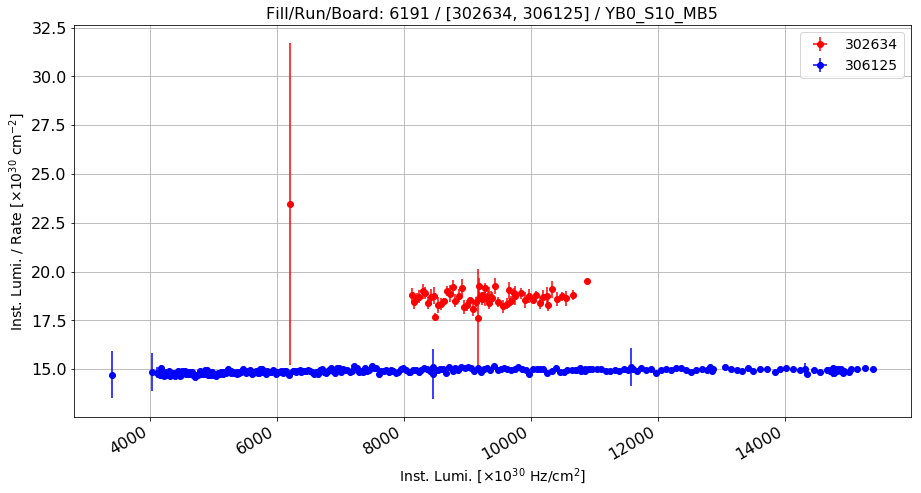

Anomalous Lumi/Rate: 18.7281799783 Normal Lumi/Rate: 14.9017710762 Ratio: 0.256775445186


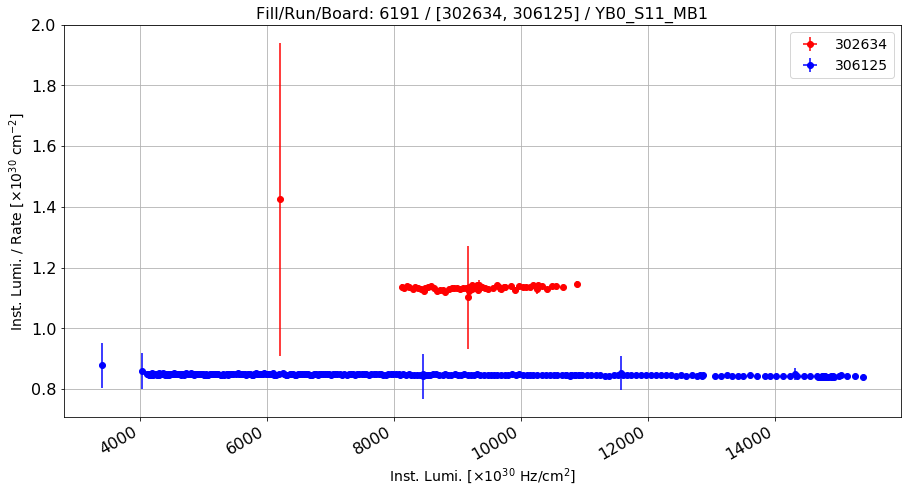

Anomalous Lumi/Rate: 1.1380849419 Normal Lumi/Rate: 0.847362501192 Ratio: 0.343090991511


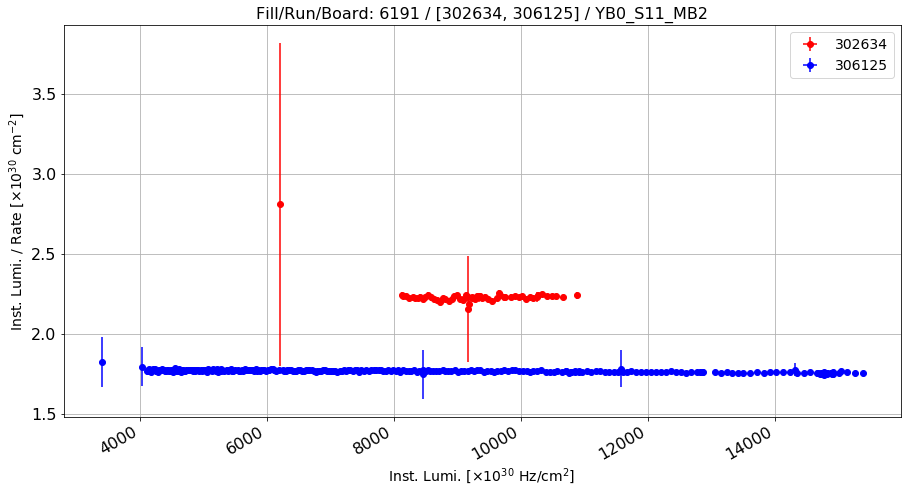

Anomalous Lumi/Rate: 2.23668312367 Normal Lumi/Rate: 1.76769466687 Ratio: 0.265310783351


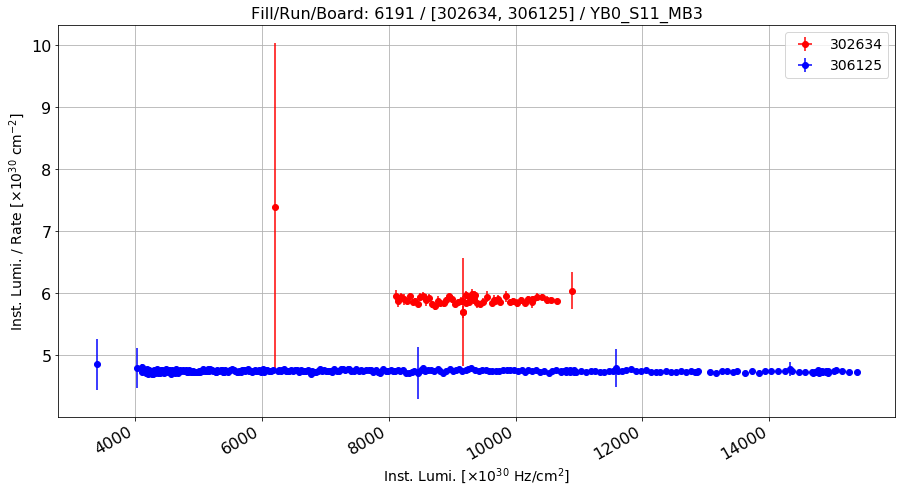

Anomalous Lumi/Rate: 5.9149947689 Normal Lumi/Rate: 4.75004143988 Ratio: 0.245251192808


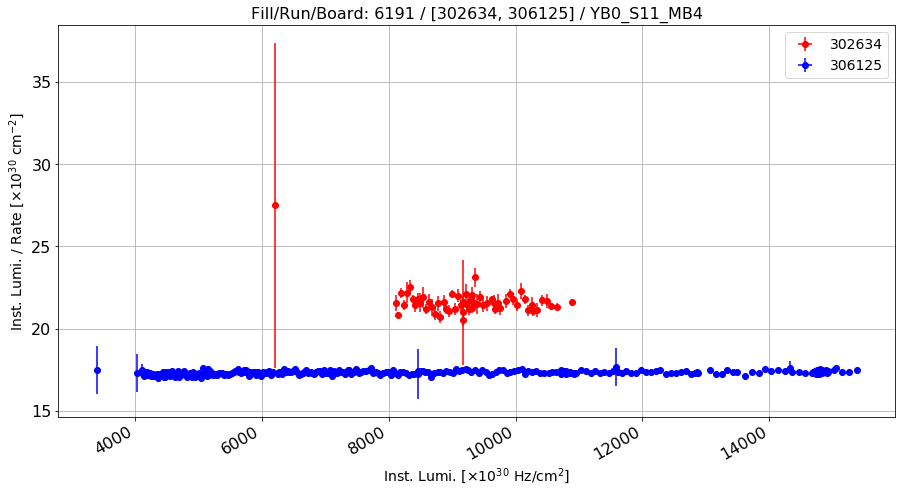

Anomalous Lumi/Rate: 21.6609743977 Normal Lumi/Rate: 17.3348142903 Ratio: 0.249564837266


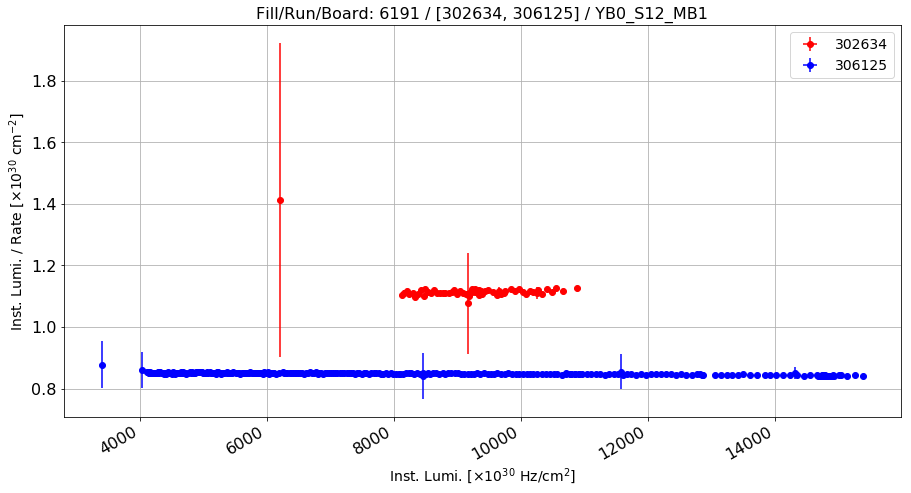

Anomalous Lumi/Rate: 1.11840307397 Normal Lumi/Rate: 0.849285323442 Ratio: 0.316875545947


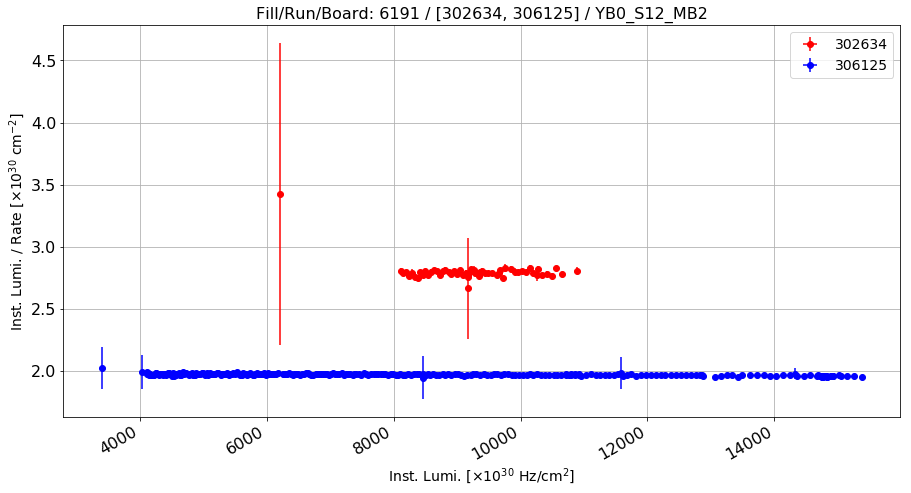

Anomalous Lumi/Rate: 2.80028161147 Normal Lumi/Rate: 1.97134311782 Ratio: 0.420494274259


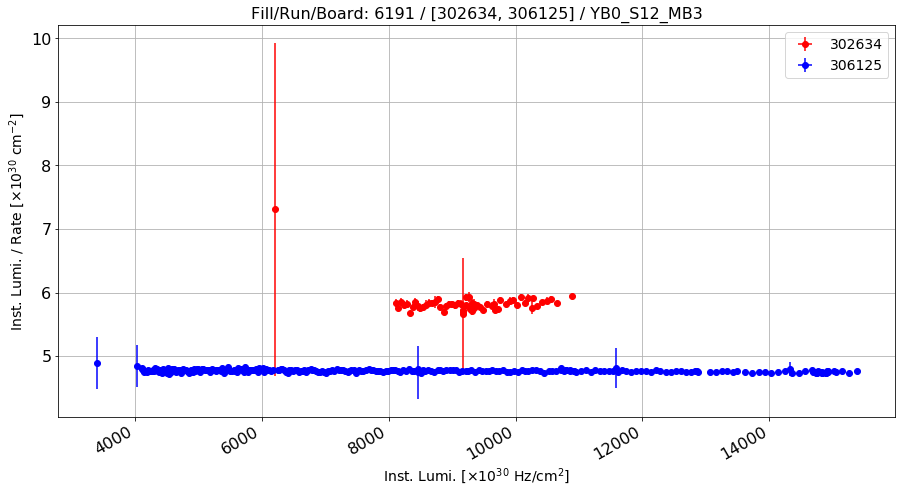

Anomalous Lumi/Rate: 5.83451762042 Normal Lumi/Rate: 4.76952289891 Ratio: 0.22329166755


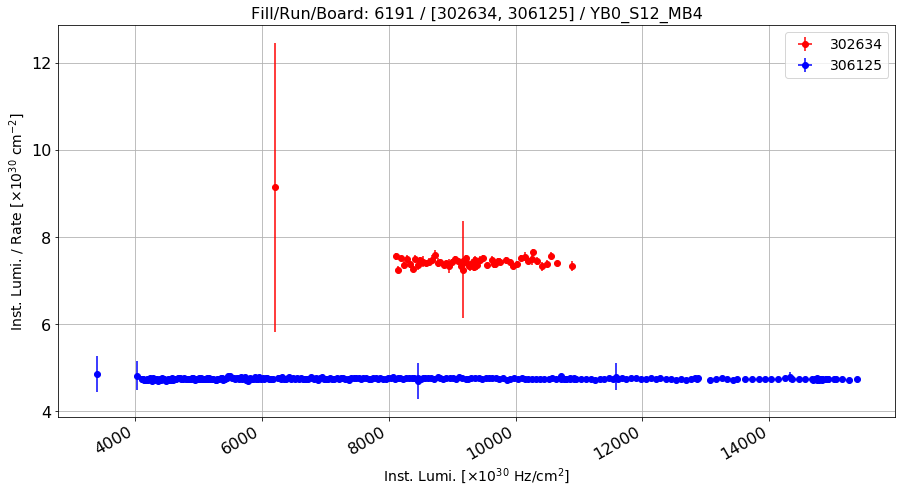

Anomalous Lumi/Rate: 7.45320726596 Normal Lumi/Rate: 4.74809145037 Ratio: 0.569726982697


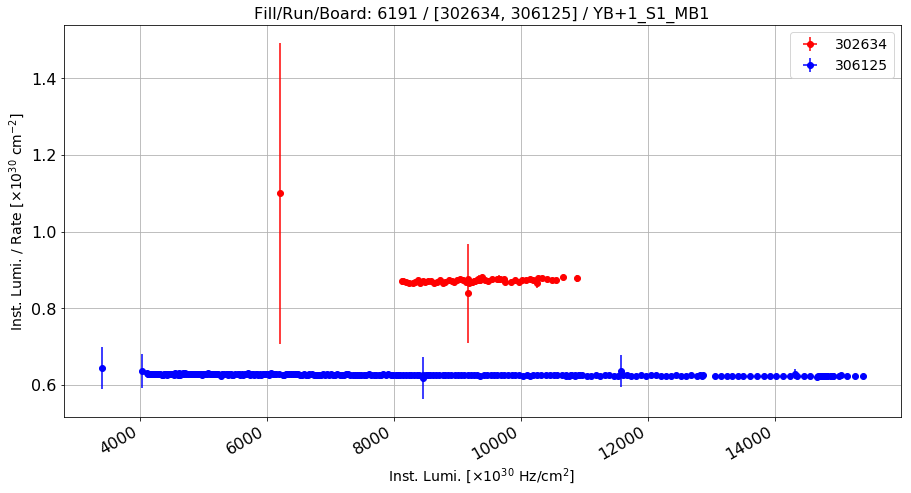

Anomalous Lumi/Rate: 0.875674268892 Normal Lumi/Rate: 0.626640581215 Ratio: 0.397410724969


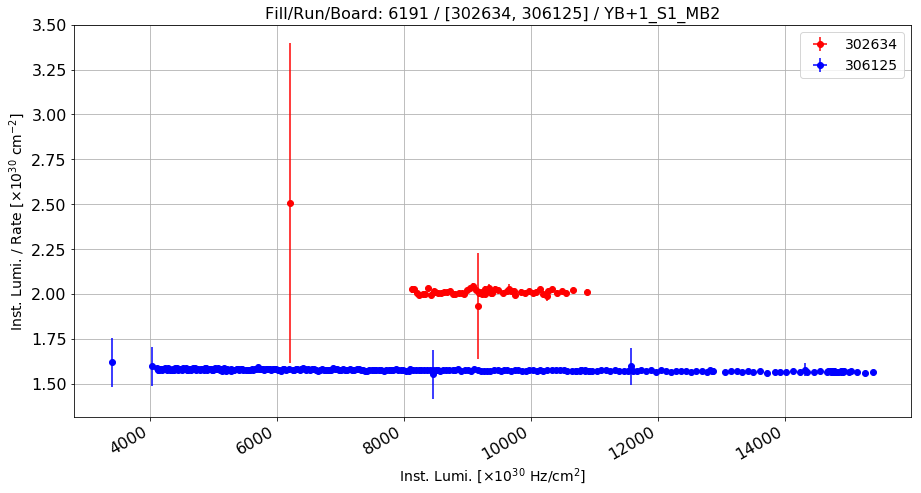

Anomalous Lumi/Rate: 2.02054032362 Normal Lumi/Rate: 1.57775940336 Ratio: 0.280639062784


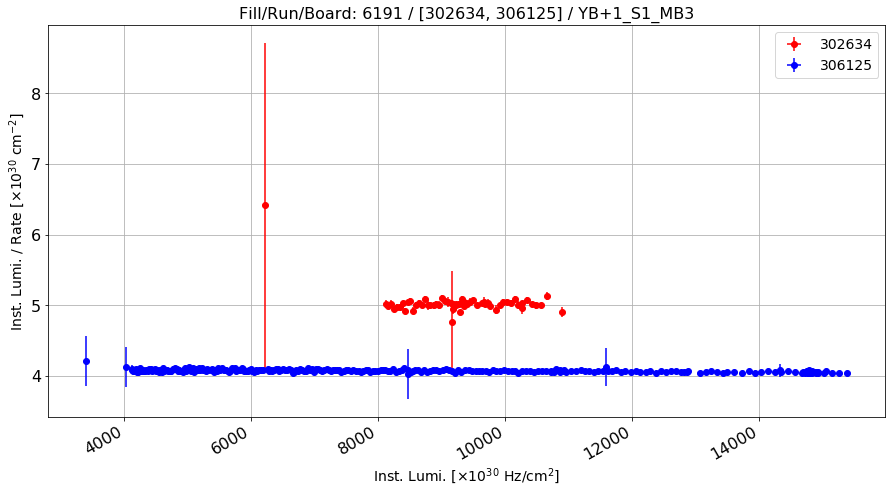

Anomalous Lumi/Rate: 5.03515138566 Normal Lumi/Rate: 4.07401731154 Ratio: 0.235918014238


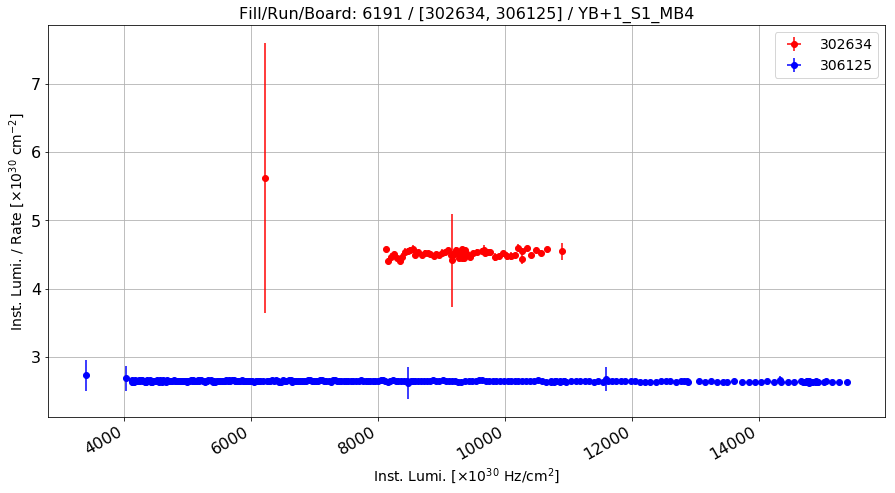

Anomalous Lumi/Rate: 4.53074628299 Normal Lumi/Rate: 2.64948687126 Ratio: 0.710046700792


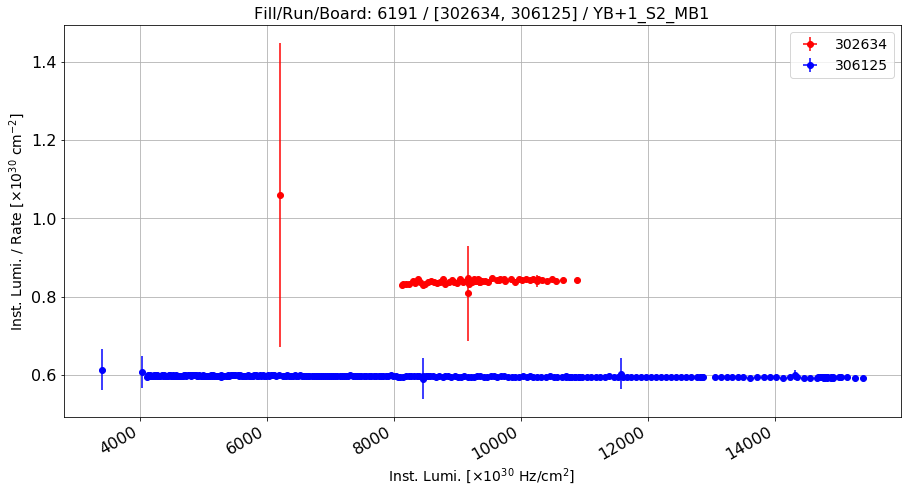

Anomalous Lumi/Rate: 0.842928093929 Normal Lumi/Rate: 0.596311297825 Ratio: 0.413570557867


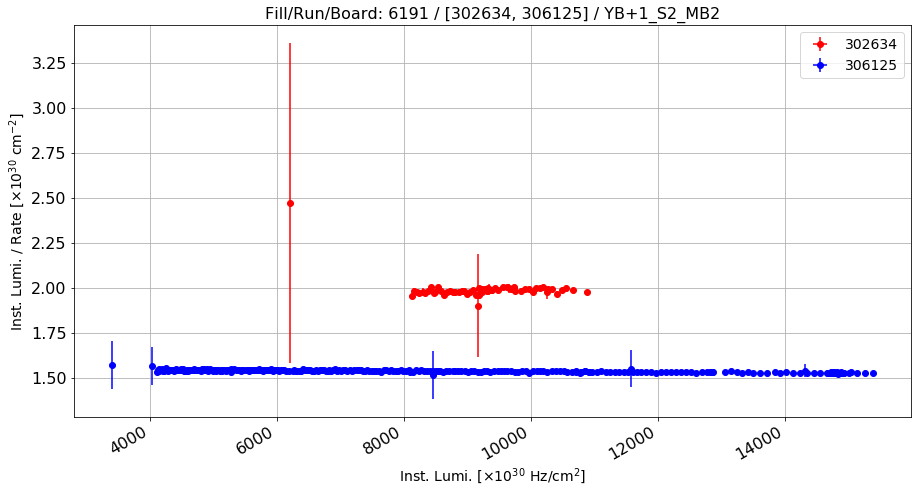

Anomalous Lumi/Rate: 1.99218863335 Normal Lumi/Rate: 1.53951479999 Ratio: 0.294036688292


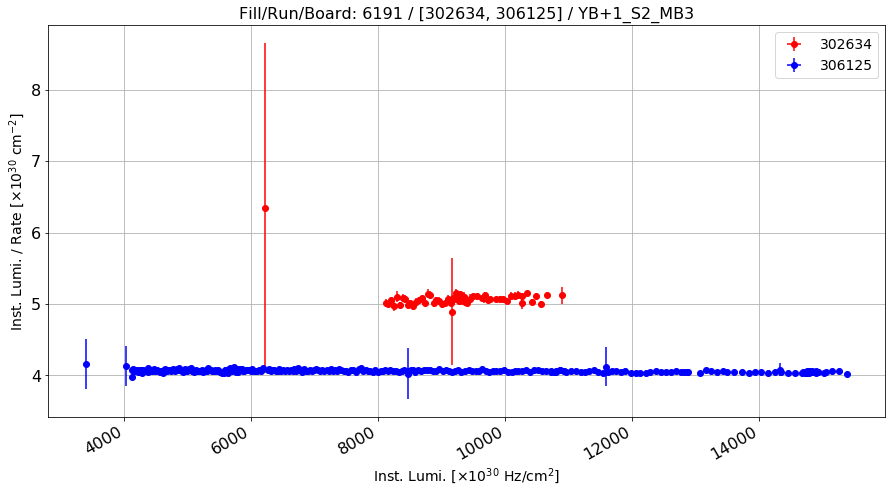

Anomalous Lumi/Rate: 5.08211574201 Normal Lumi/Rate: 4.06231893338 Ratio: 0.251038095567


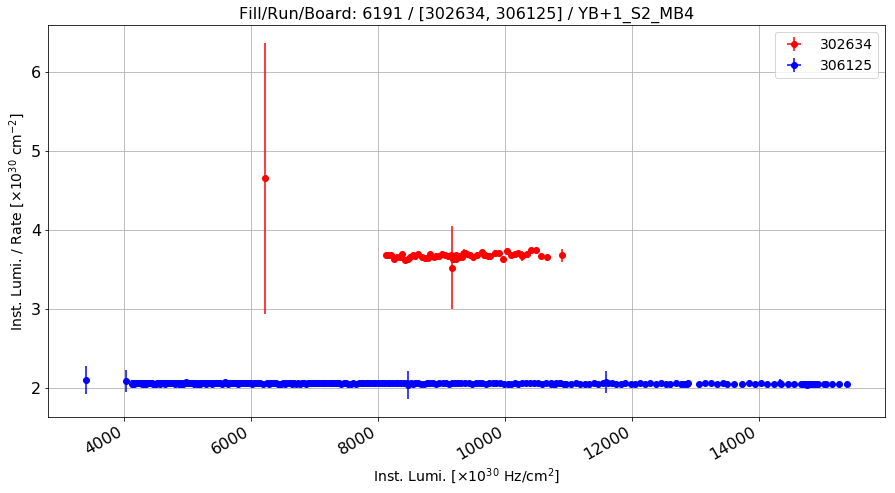

Anomalous Lumi/Rate: 3.68797069809 Normal Lumi/Rate: 2.05406629662 Ratio: 0.795448717578


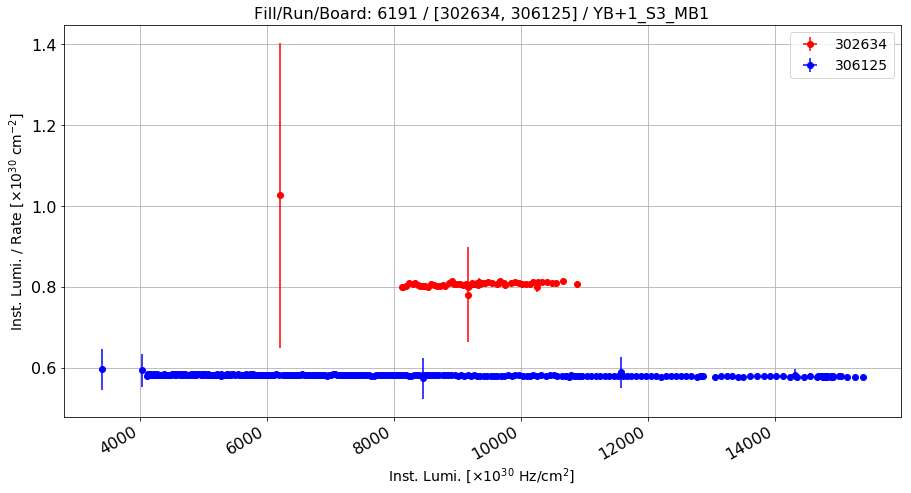

Anomalous Lumi/Rate: 0.810928143182 Normal Lumi/Rate: 0.582426504747 Ratio: 0.392326991599


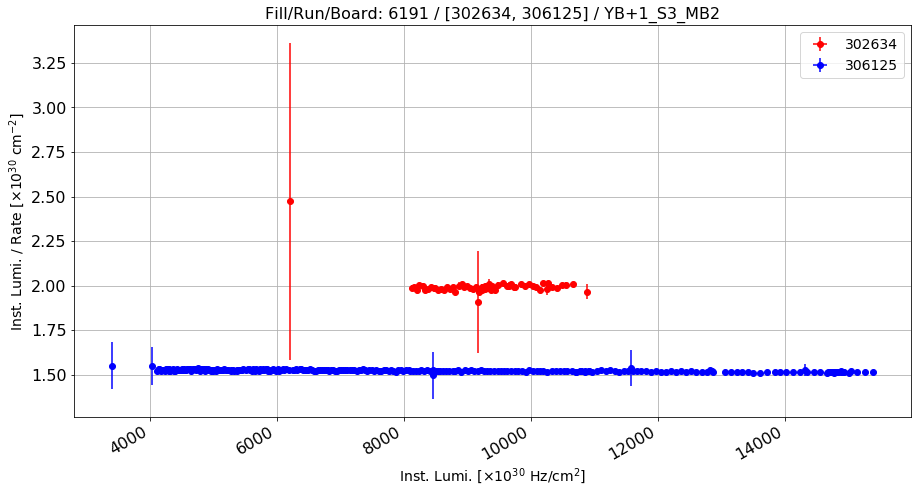

Anomalous Lumi/Rate: 1.99728992358 Normal Lumi/Rate: 1.52246862905 Ratio: 0.311875913551


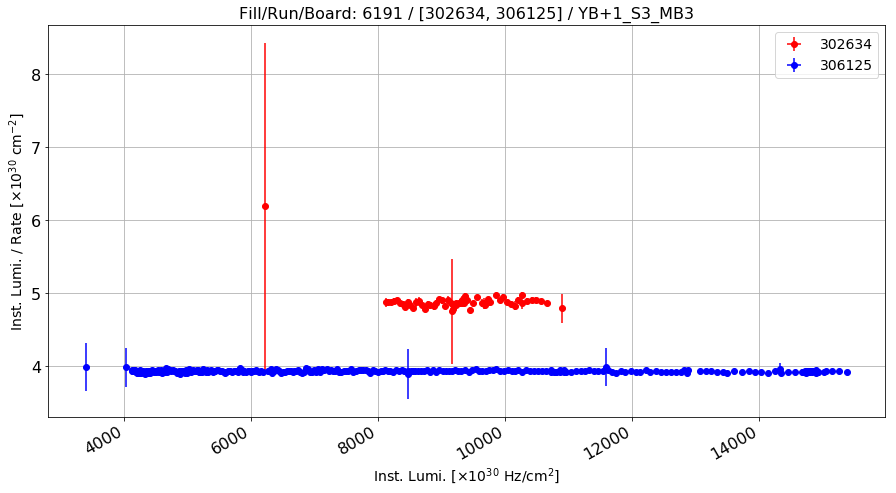

Anomalous Lumi/Rate: 4.89581091744 Normal Lumi/Rate: 3.93681858574 Ratio: 0.243595764146


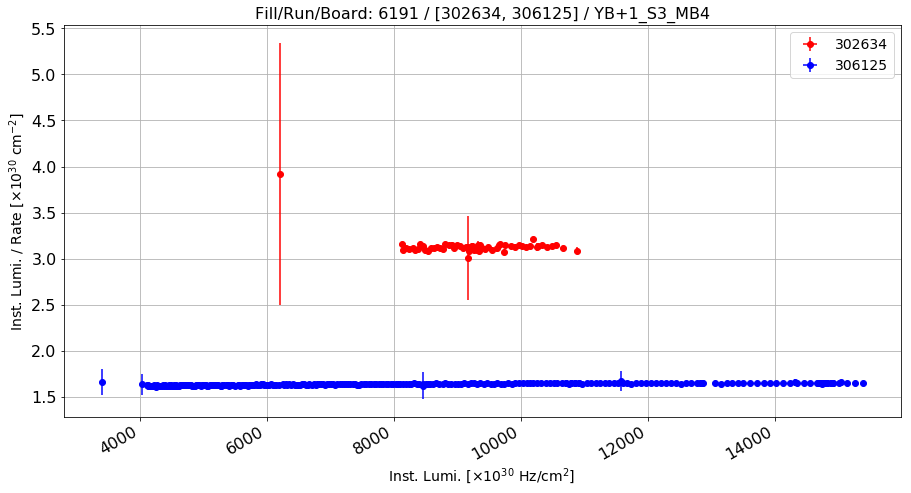

Anomalous Lumi/Rate: 3.13557294134 Normal Lumi/Rate: 1.63867783386 Ratio: 0.91347736361


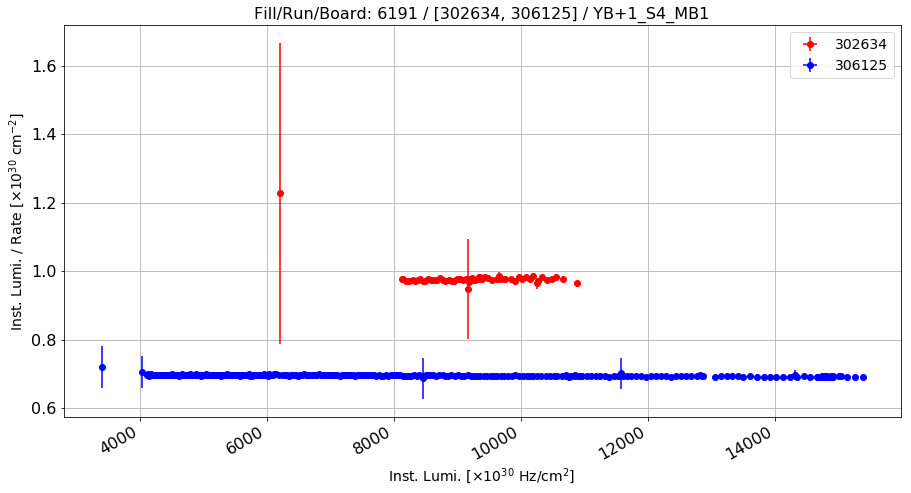

Anomalous Lumi/Rate: 0.979515389513 Normal Lumi/Rate: 0.695184077433 Ratio: 0.40900147358


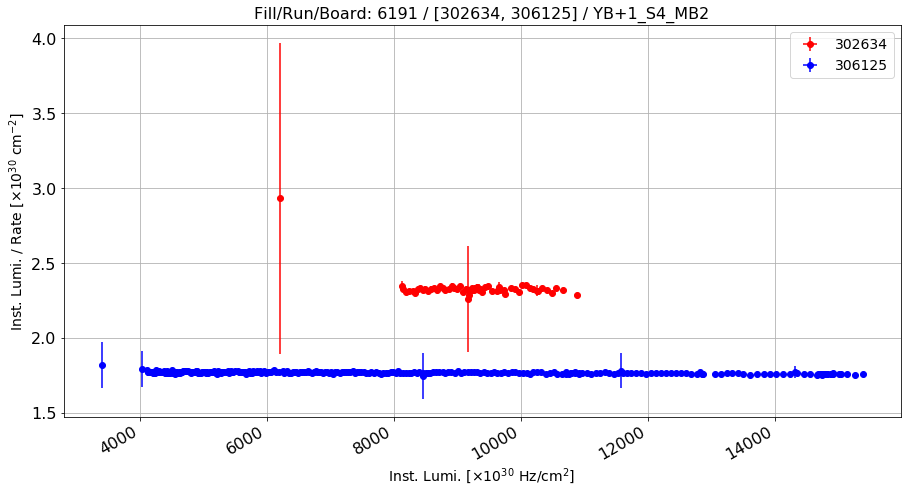

Anomalous Lumi/Rate: 2.33462387815 Normal Lumi/Rate: 1.77059681639 Ratio: 0.31855194618


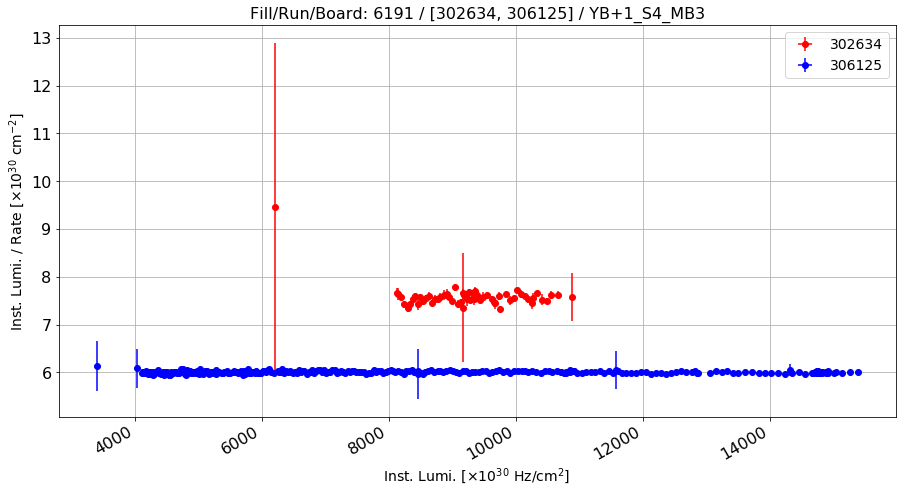

Anomalous Lumi/Rate: 7.58566234428 Normal Lumi/Rate: 6.00634596659 Ratio: 0.262941293504


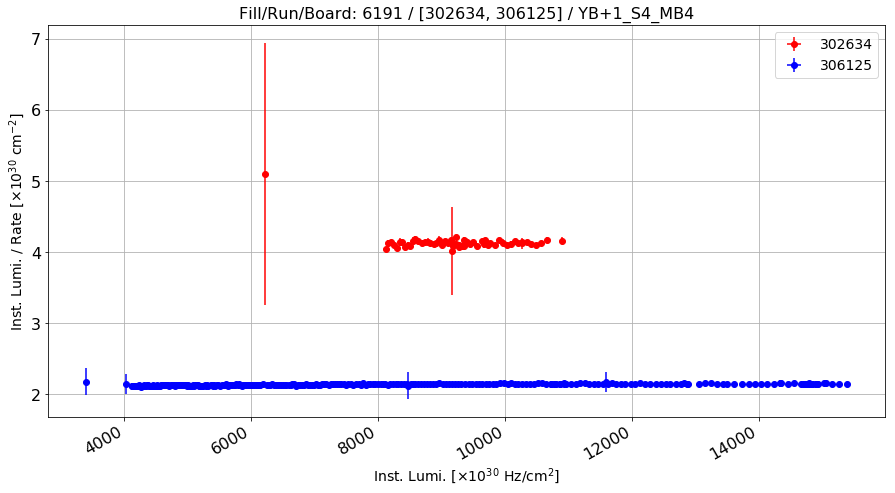

Anomalous Lumi/Rate: 4.1419256734 Normal Lumi/Rate: 2.13902634438 Ratio: 0.936360290409


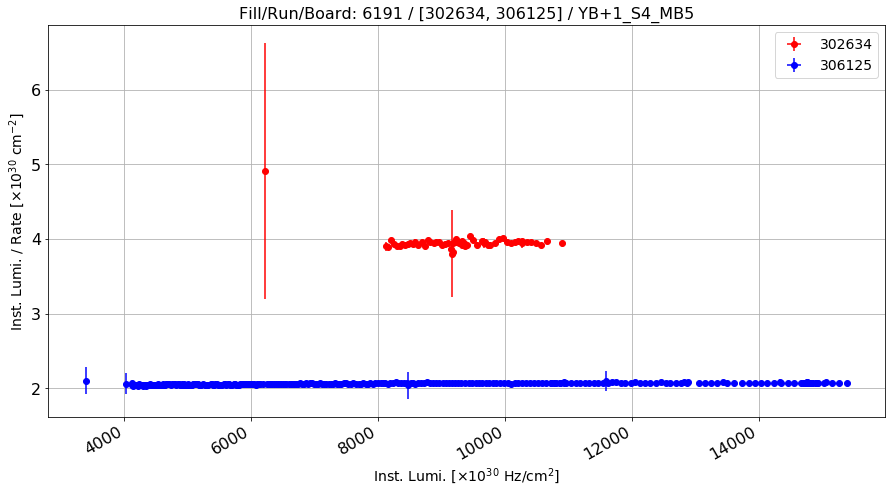

Anomalous Lumi/Rate: 3.95822750867 Normal Lumi/Rate: 2.06183958321 Ratio: 0.919755319904


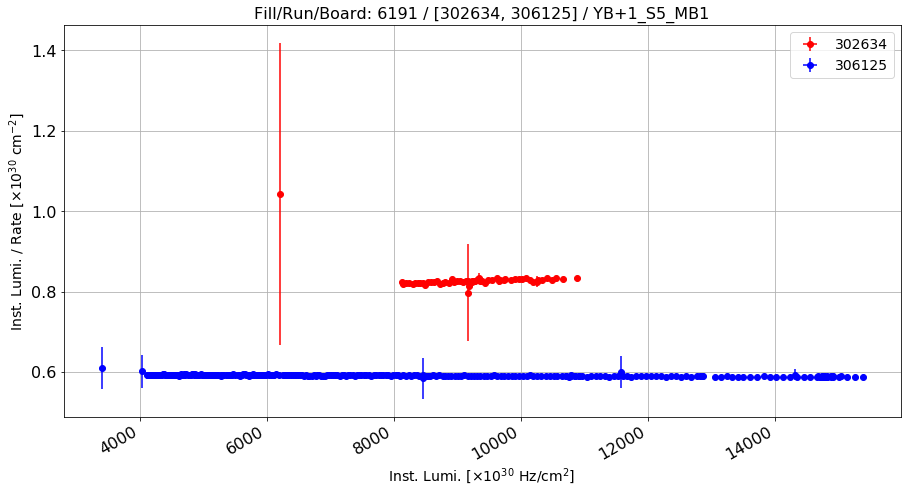

Anomalous Lumi/Rate: 0.829364927391 Normal Lumi/Rate: 0.591394556585 Ratio: 0.402388503844


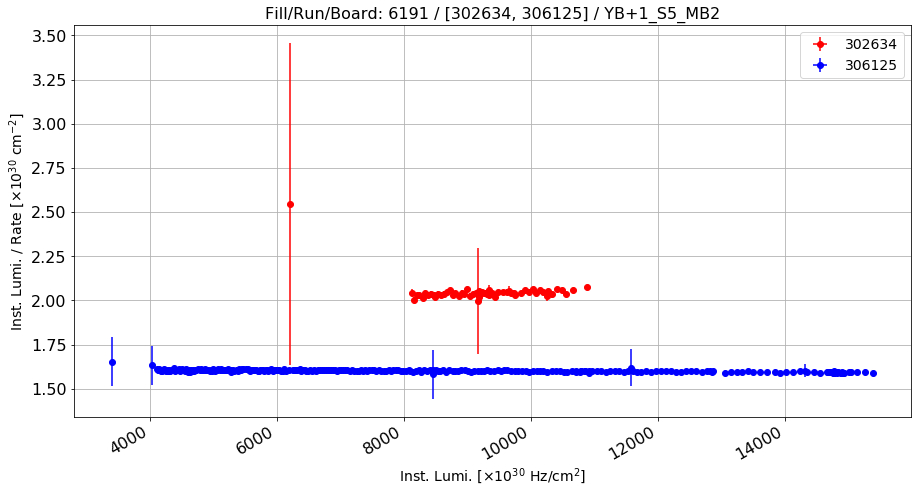

Anomalous Lumi/Rate: 2.04940231209 Normal Lumi/Rate: 1.60265827412 Ratio: 0.278751899381


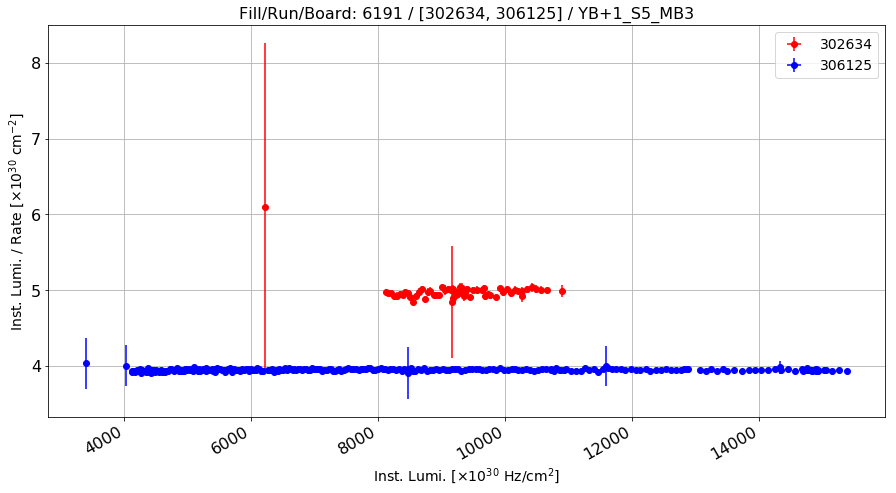

Anomalous Lumi/Rate: 4.98797647635 Normal Lumi/Rate: 3.950643347 Ratio: 0.262573216116


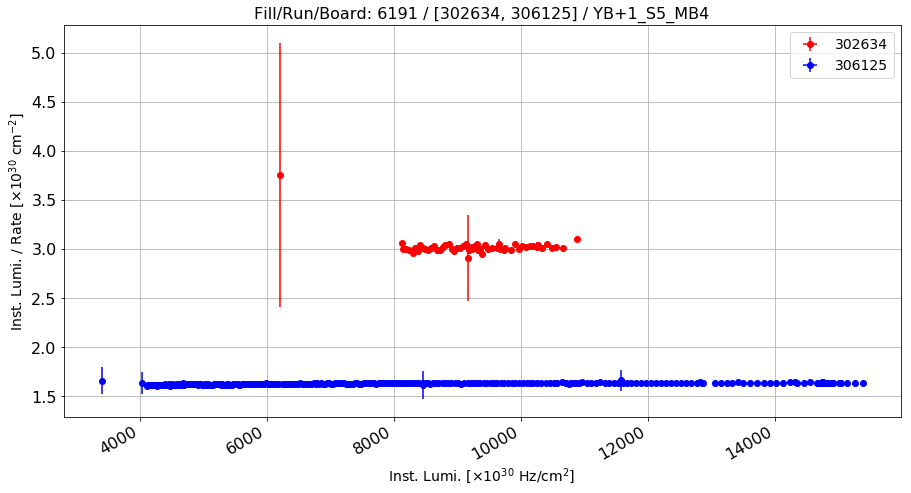

Anomalous Lumi/Rate: 3.02605327941 Normal Lumi/Rate: 1.63058322672 Ratio: 0.855810381107


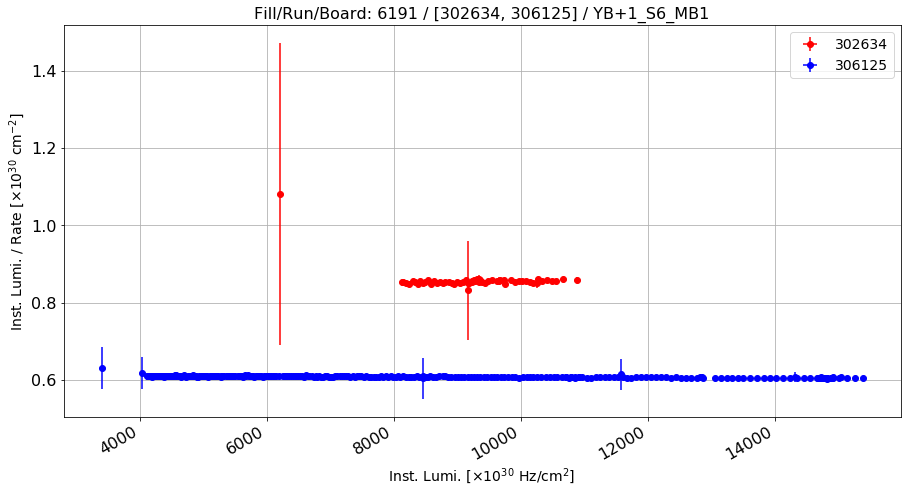

Anomalous Lumi/Rate: 0.857694820057 Normal Lumi/Rate: 0.608439048298 Ratio: 0.409664324562


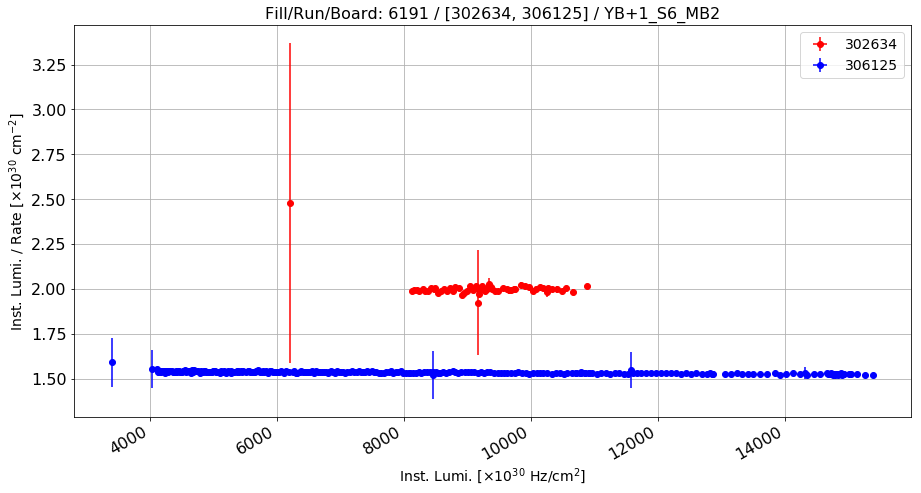

Anomalous Lumi/Rate: 2.00529071939 Normal Lumi/Rate: 1.53570352373 Ratio: 0.305779851646


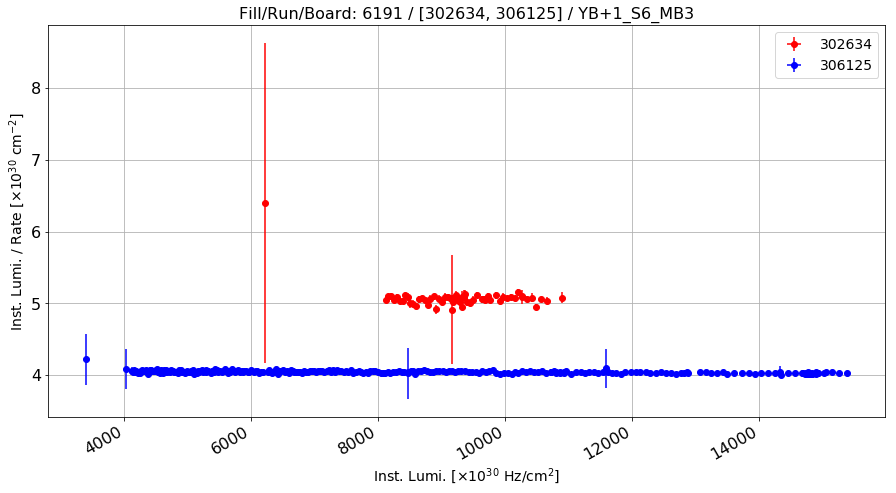

Anomalous Lumi/Rate: 5.07898484348 Normal Lumi/Rate: 4.04578742769 Ratio: 0.255376100268


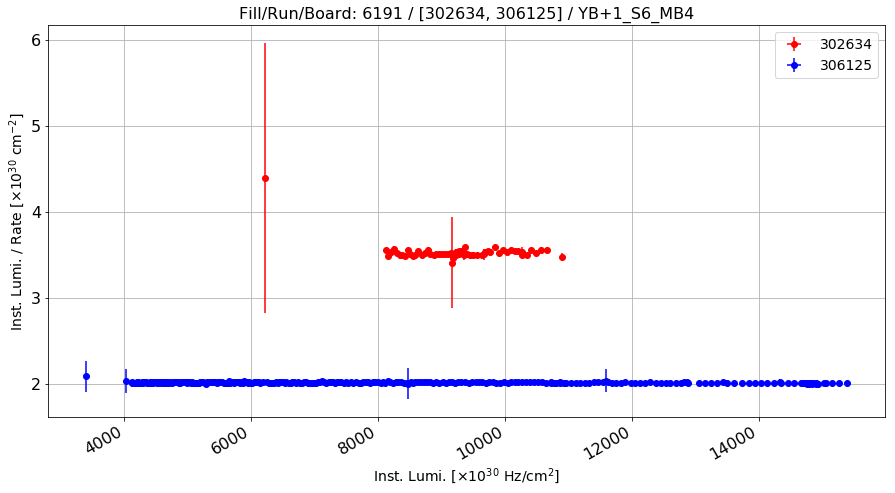

Anomalous Lumi/Rate: 3.53272074315 Normal Lumi/Rate: 2.01482073483 Ratio: 0.75336727585


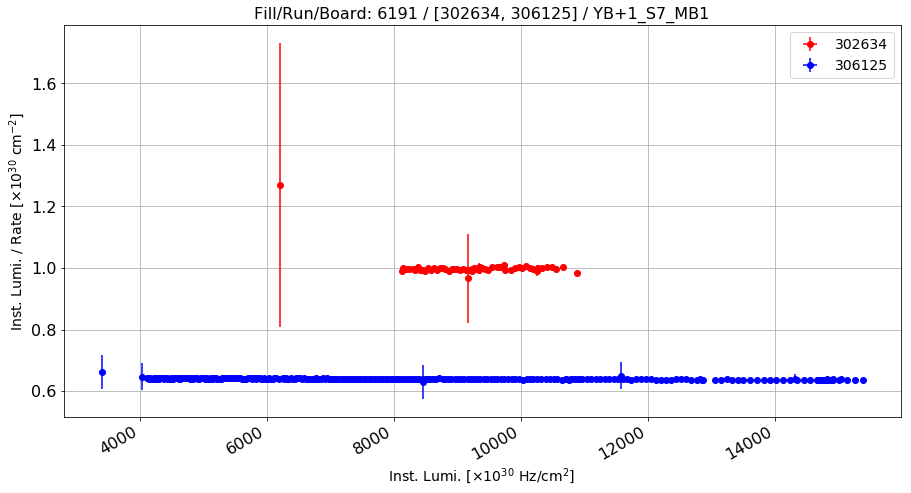

Anomalous Lumi/Rate: 1.0014032763 Normal Lumi/Rate: 0.639658117875 Ratio: 0.565528910391


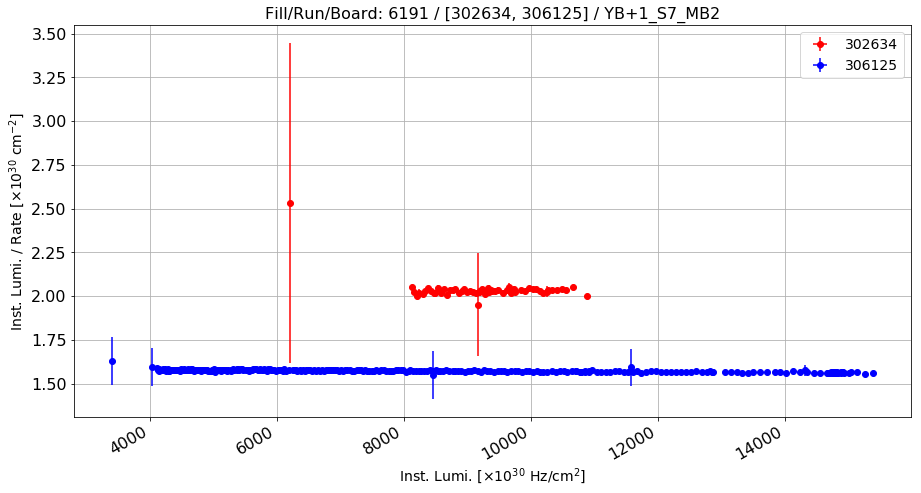

Anomalous Lumi/Rate: 2.03685376256 Normal Lumi/Rate: 1.57293330784 Ratio: 0.294939685243


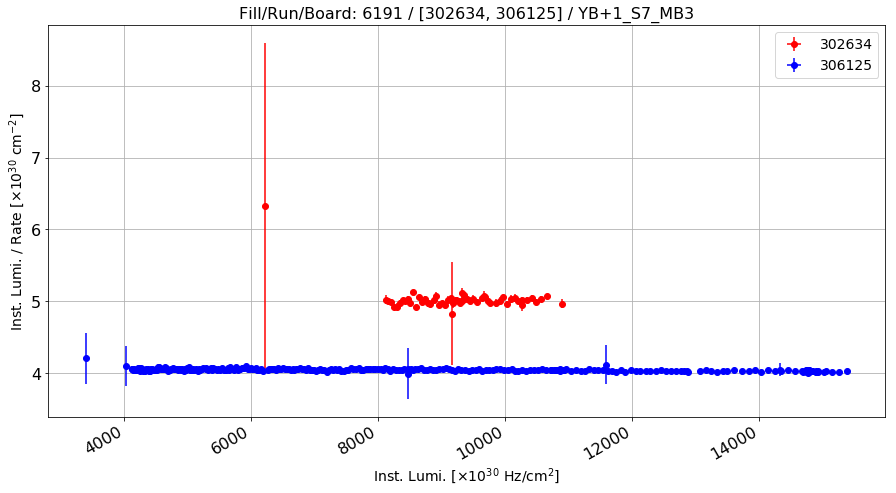

Anomalous Lumi/Rate: 5.03011025377 Normal Lumi/Rate: 4.04919626294 Ratio: 0.242249060587


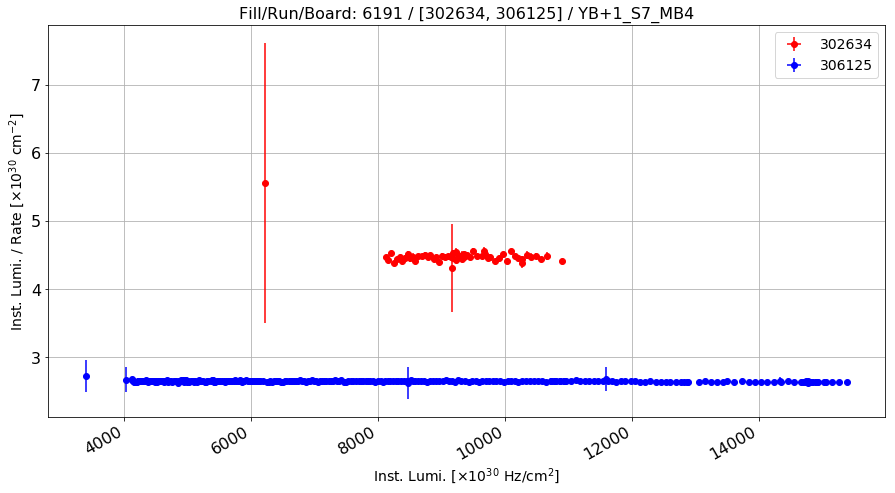

Anomalous Lumi/Rate: 4.48845270473 Normal Lumi/Rate: 2.65236440944 Ratio: 0.692245865149


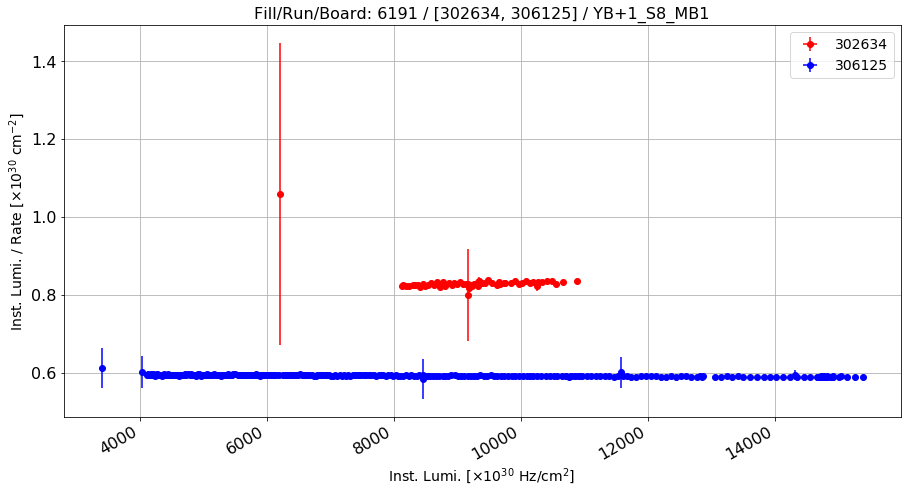

Anomalous Lumi/Rate: 0.83184617647 Normal Lumi/Rate: 0.592514456177 Ratio: 0.403925537677


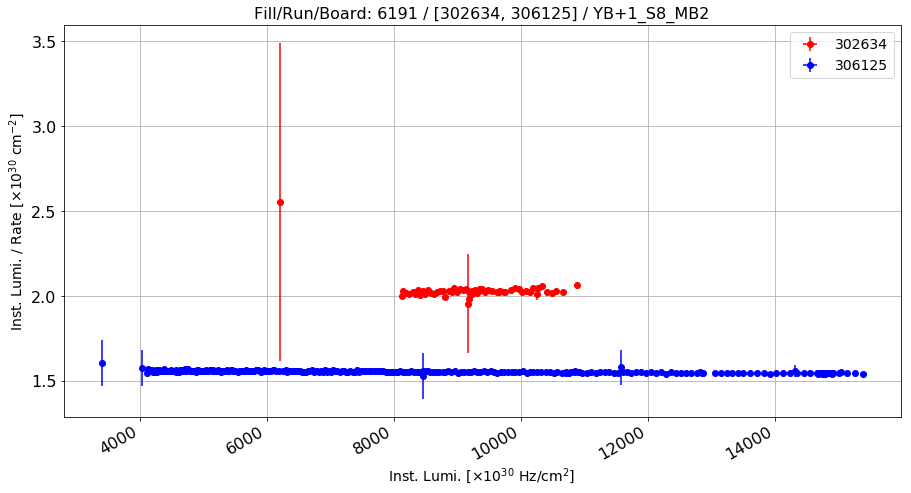

Anomalous Lumi/Rate: 2.03574287646 Normal Lumi/Rate: 1.55620369777 Ratio: 0.308146792978


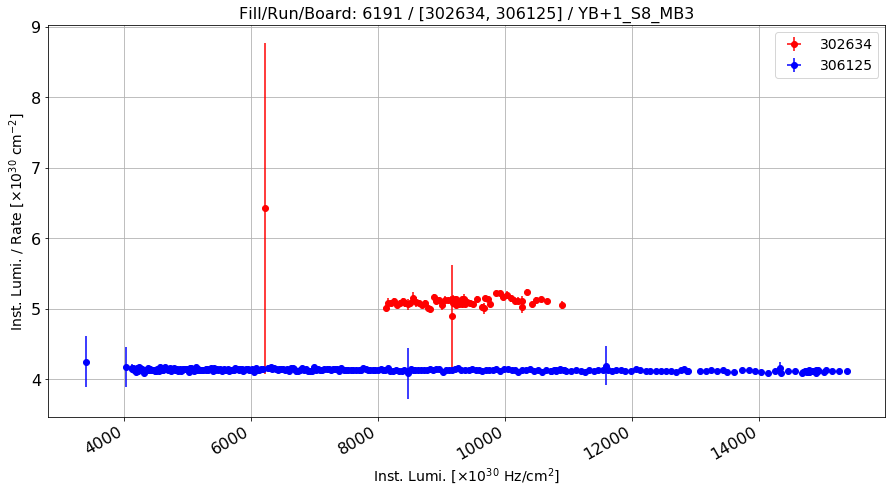

Anomalous Lumi/Rate: 5.12137171393 Normal Lumi/Rate: 4.13571512733 Ratio: 0.238327968985


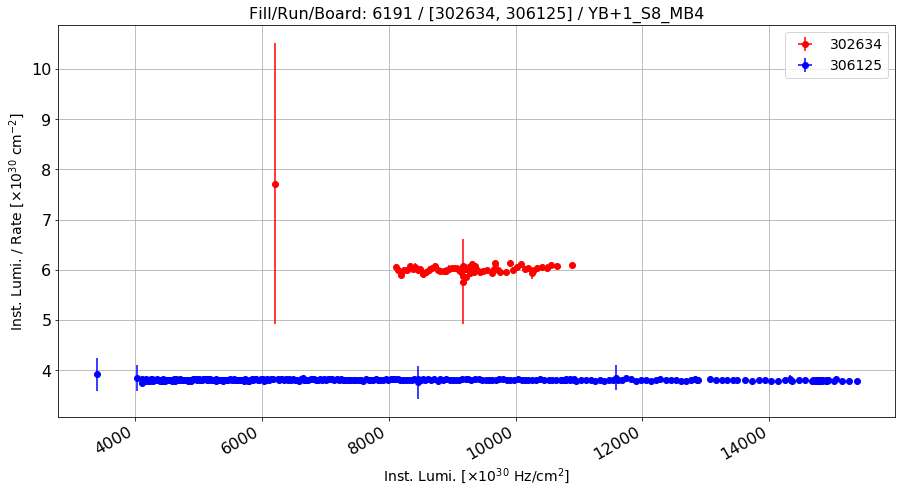

Anomalous Lumi/Rate: 6.03538073107 Normal Lumi/Rate: 3.80974757333 Ratio: 0.584194389498


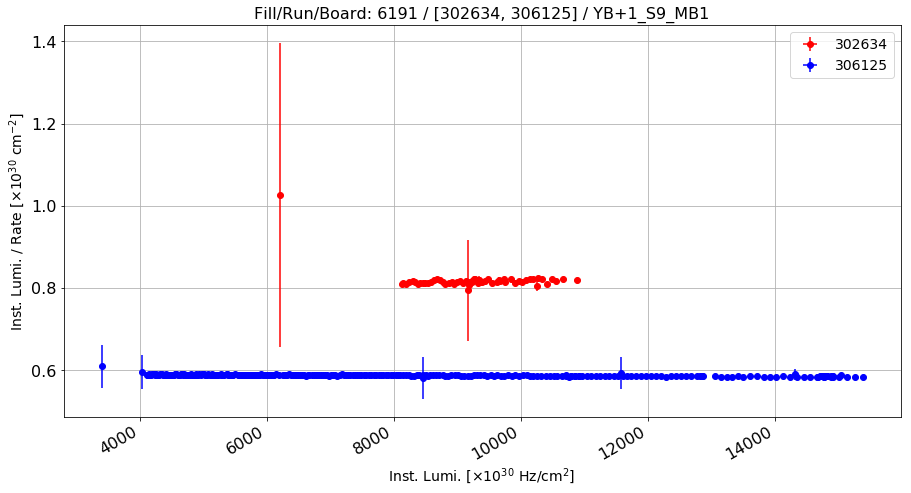

Anomalous Lumi/Rate: 0.819095860219 Normal Lumi/Rate: 0.587862609938 Ratio: 0.393345734825


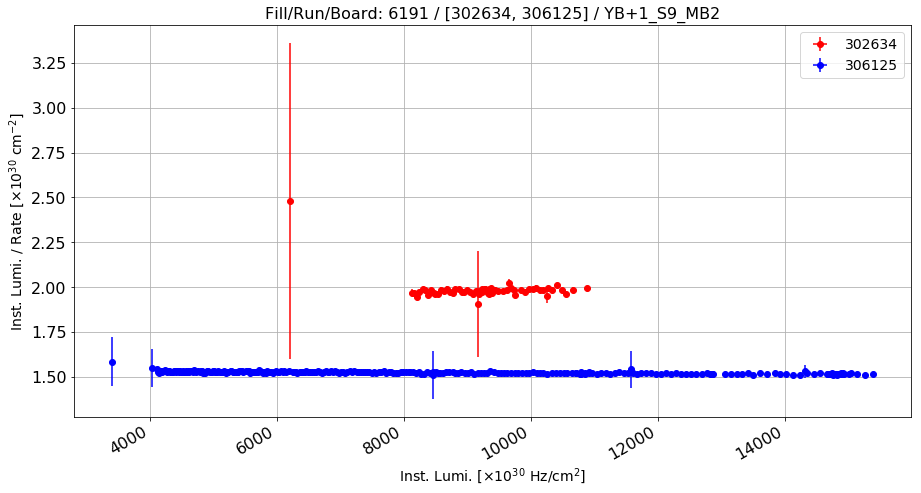

Anomalous Lumi/Rate: 1.98617649647 Normal Lumi/Rate: 1.525181532 Ratio: 0.302255800244


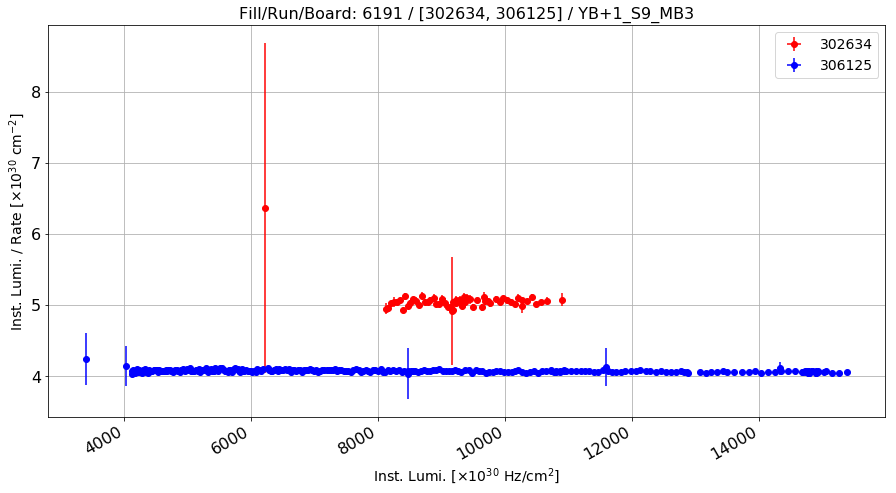

Anomalous Lumi/Rate: 5.06390257349 Normal Lumi/Rate: 4.07679006196 Ratio: 0.242129836595


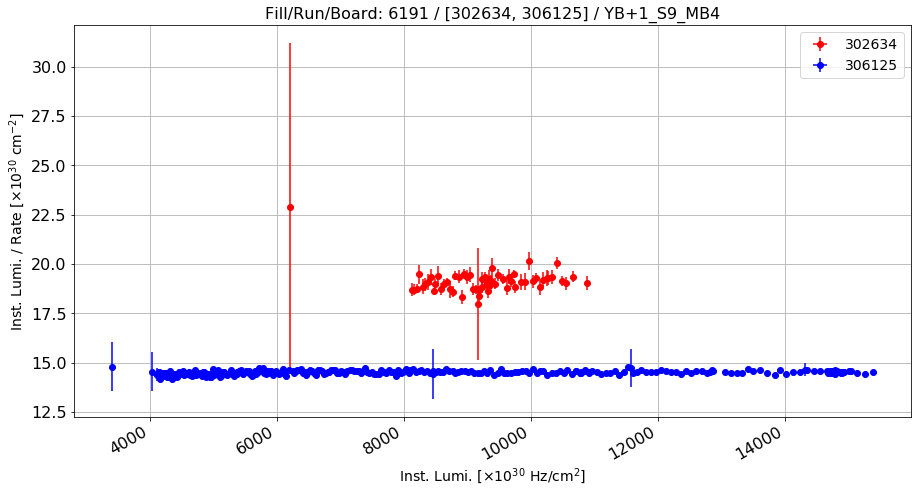

Anomalous Lumi/Rate: 19.1475376246 Normal Lumi/Rate: 14.5149816381 Ratio: 0.319156861647


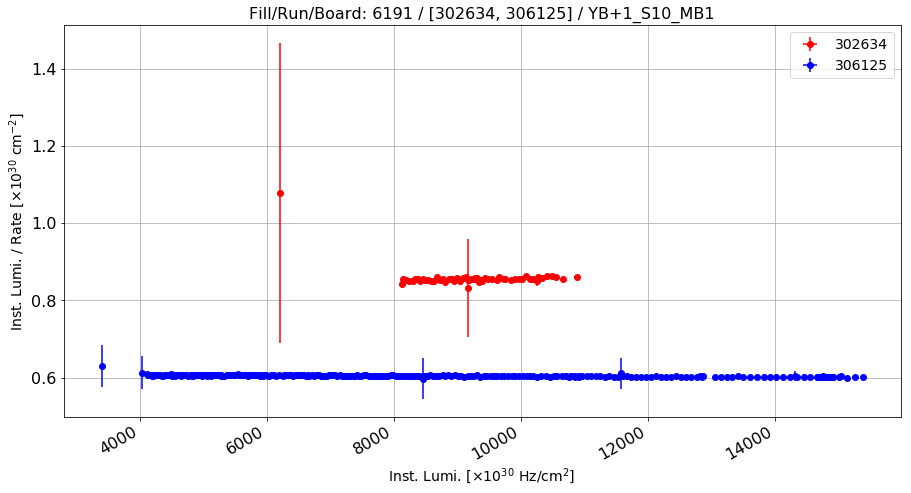

Anomalous Lumi/Rate: 0.857862639816 Normal Lumi/Rate: 0.604617107242 Ratio: 0.418852740919


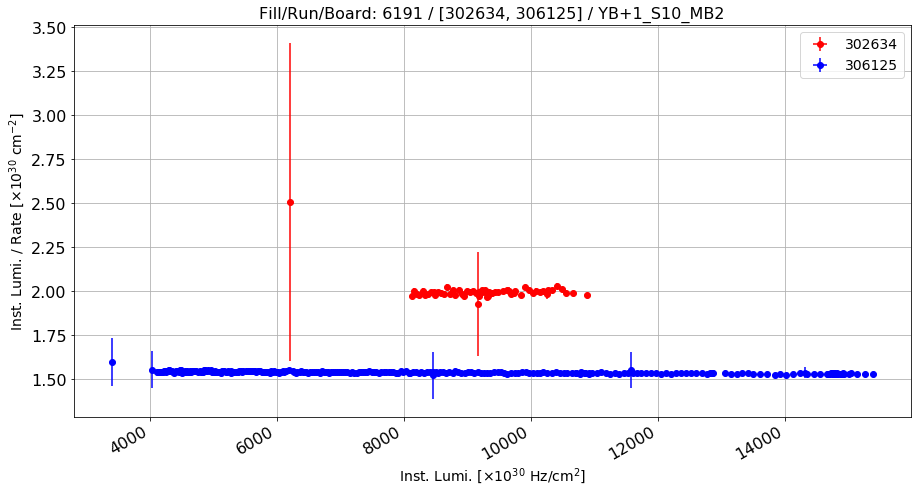

Anomalous Lumi/Rate: 2.00157713717 Normal Lumi/Rate: 1.53969939715 Ratio: 0.299979165328


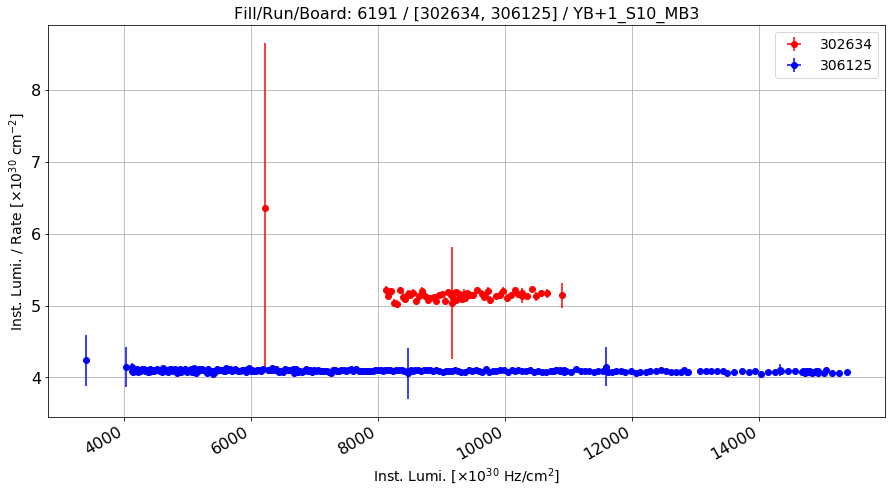

Anomalous Lumi/Rate: 5.15819783025 Normal Lumi/Rate: 4.09335723657 Ratio: 0.260138691087


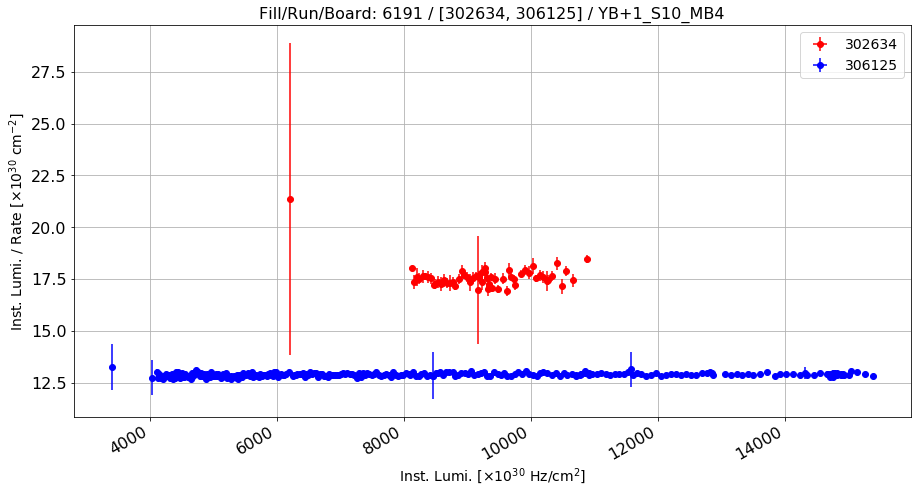

Anomalous Lumi/Rate: 17.6018727055 Normal Lumi/Rate: 12.88996536 Ratio: 0.365548487826


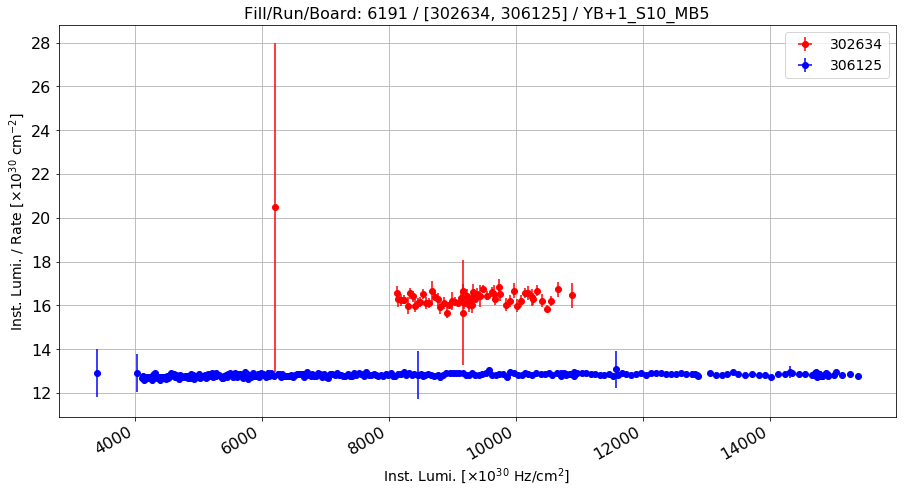

Anomalous Lumi/Rate: 16.3773129083 Normal Lumi/Rate: 12.8233591824 Ratio: 0.277146859514


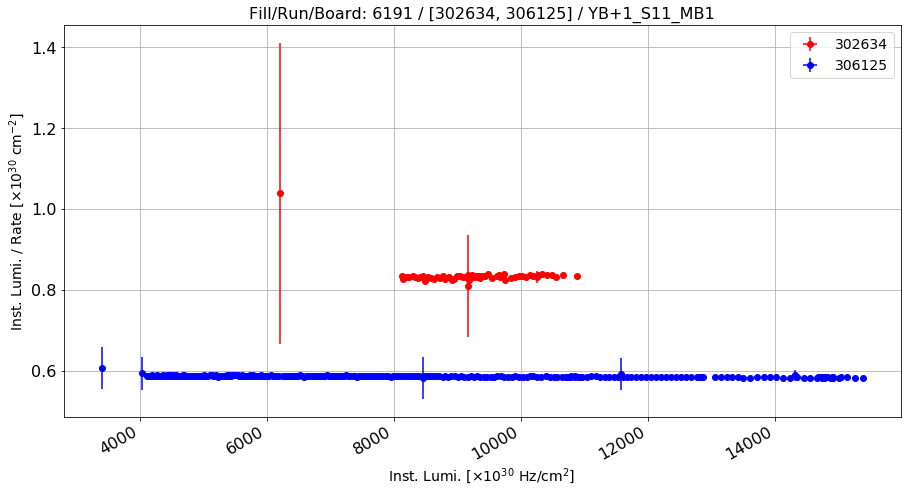

Anomalous Lumi/Rate: 0.835647683289 Normal Lumi/Rate: 0.58671996399 Ratio: 0.424270068477


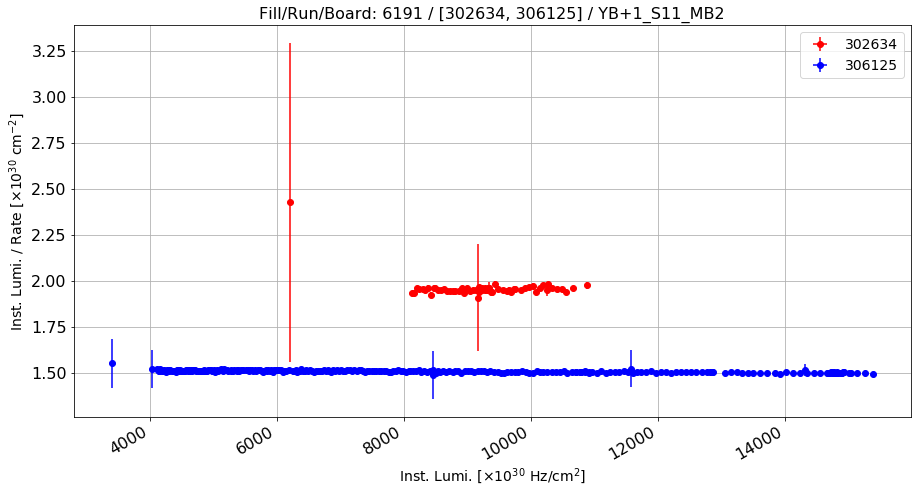

Anomalous Lumi/Rate: 1.96037040031 Normal Lumi/Rate: 1.50859706954 Ratio: 0.299465867919


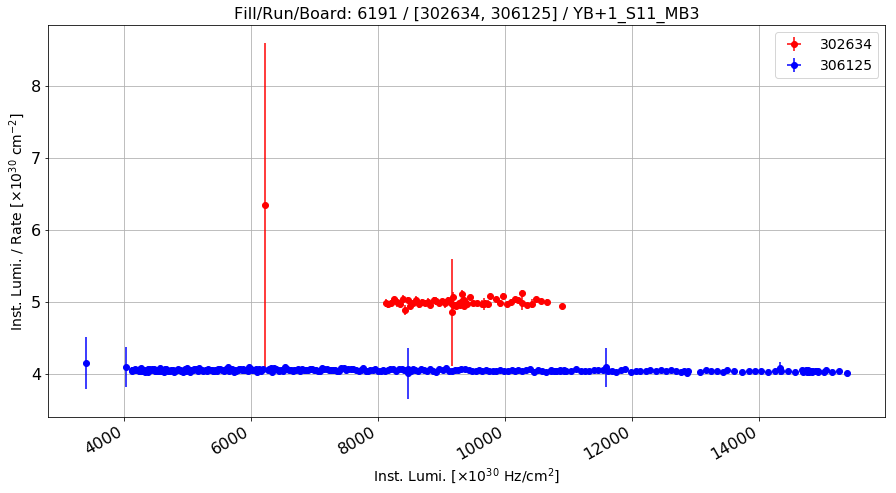

Anomalous Lumi/Rate: 5.01951675746 Normal Lumi/Rate: 4.05241895184 Ratio: 0.238647044421


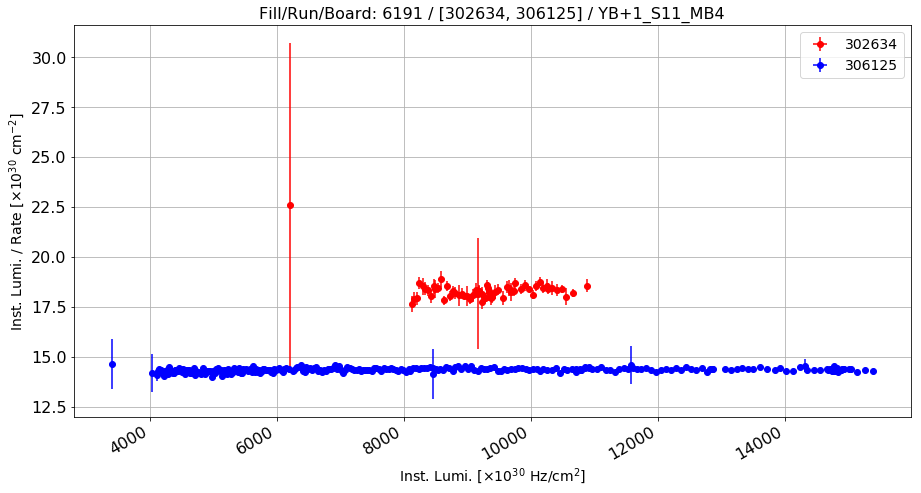

Anomalous Lumi/Rate: 18.3499434297 Normal Lumi/Rate: 14.3603158088 Ratio: 0.277823111555


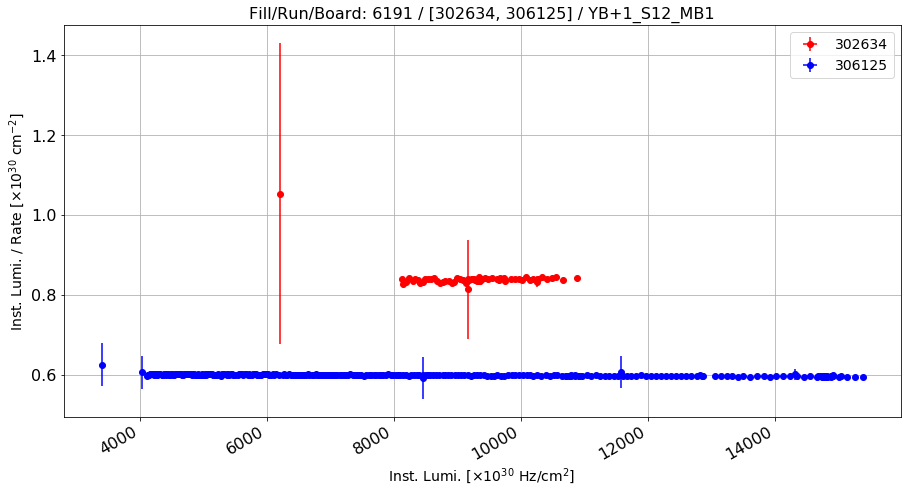

Anomalous Lumi/Rate: 0.841626564135 Normal Lumi/Rate: 0.59979228041 Ratio: 0.403196725973


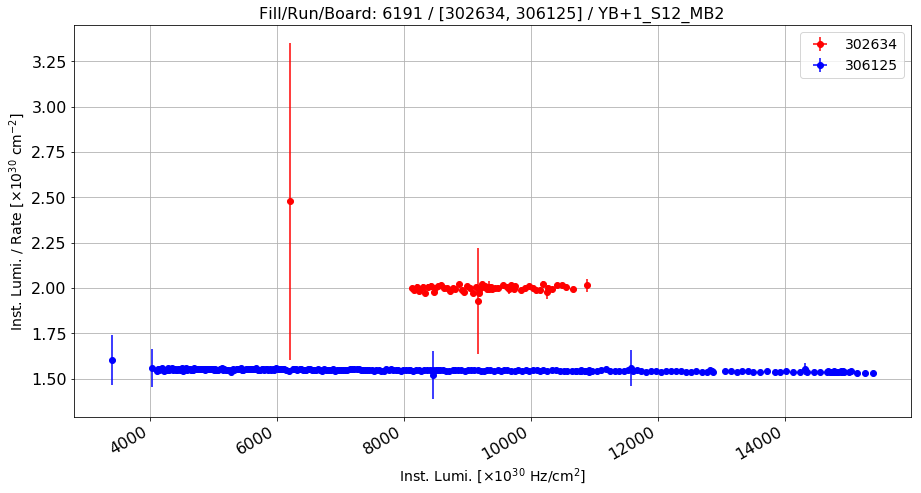

Anomalous Lumi/Rate: 2.00758682245 Normal Lumi/Rate: 1.54775476962 Ratio: 0.297096194983


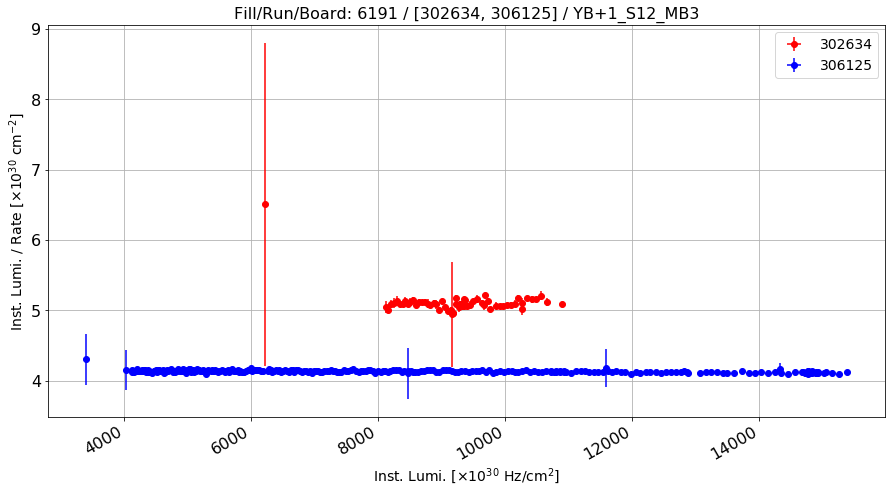

Anomalous Lumi/Rate: 5.11235134424 Normal Lumi/Rate: 4.13225776228 Ratio: 0.237181133981


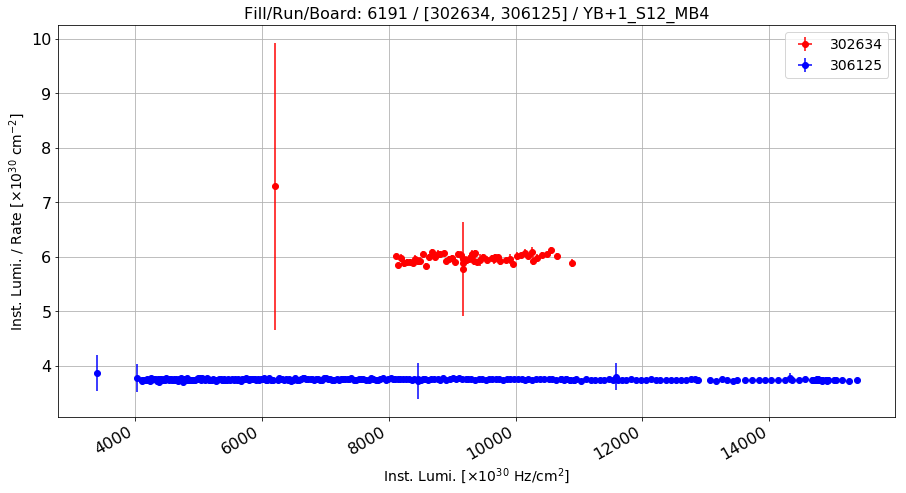

Anomalous Lumi/Rate: 5.99586343942 Normal Lumi/Rate: 3.74922638455 Ratio: 0.599226833599


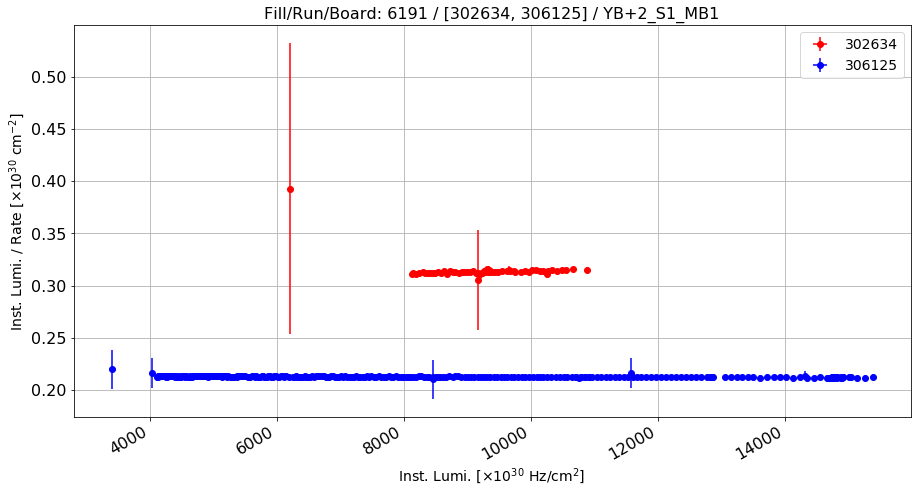

Anomalous Lumi/Rate: 0.314302657284 Normal Lumi/Rate: 0.212709596399 Ratio: 0.477613904612


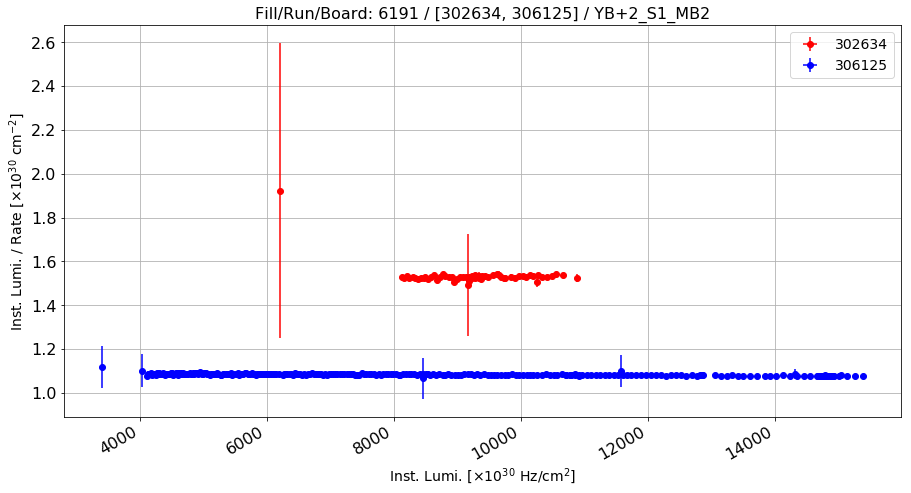

Anomalous Lumi/Rate: 1.53416872391 Normal Lumi/Rate: 1.08418825354 Ratio: 0.415039057015


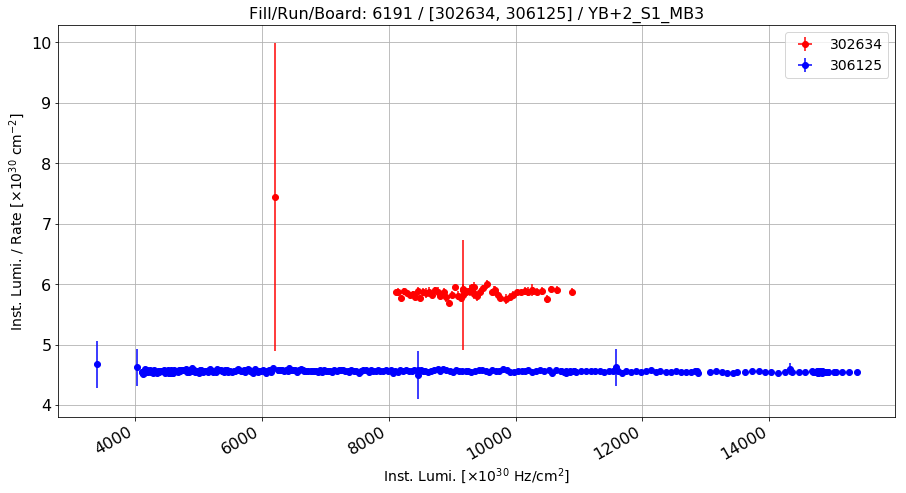

Anomalous Lumi/Rate: 5.88498521554 Normal Lumi/Rate: 4.56329746148 Ratio: 0.289634363136


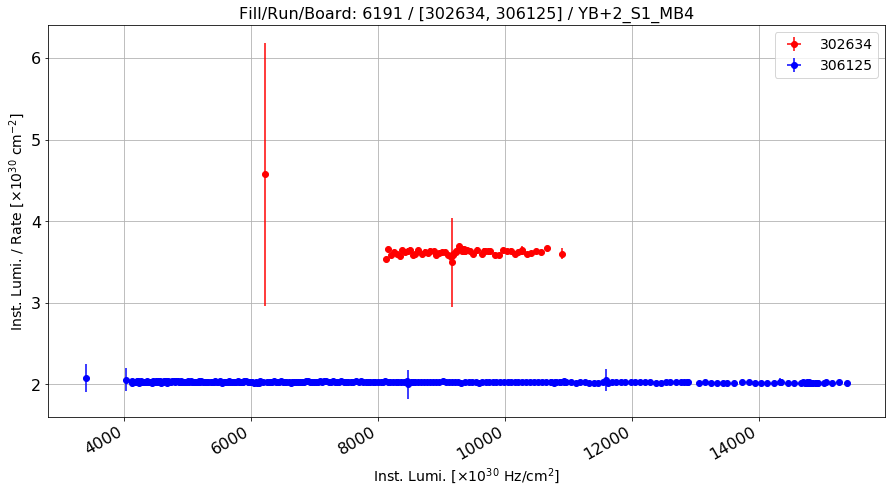

Anomalous Lumi/Rate: 3.63501304701 Normal Lumi/Rate: 2.02897198656 Ratio: 0.791554083097


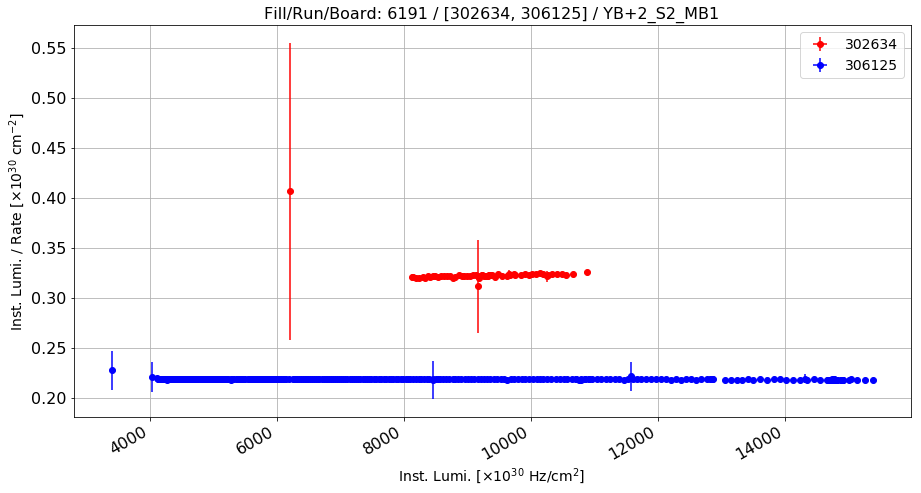

Anomalous Lumi/Rate: 0.323436071727 Normal Lumi/Rate: 0.218552072464 Ratio: 0.479903933561


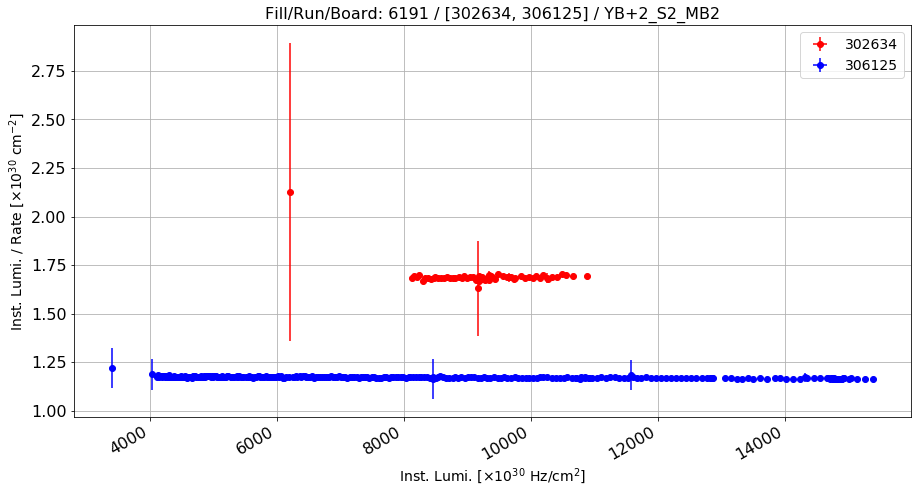

Anomalous Lumi/Rate: 1.69221178336 Normal Lumi/Rate: 1.17141172988 Ratio: 0.444591803372


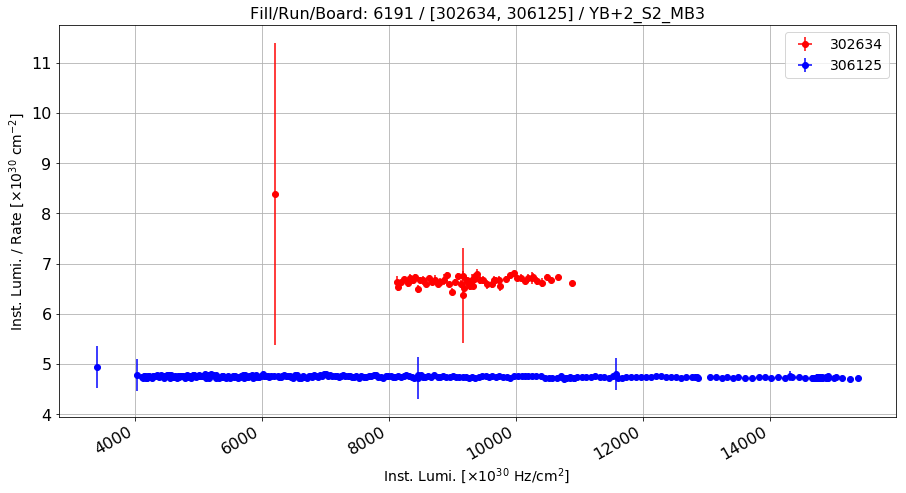

Anomalous Lumi/Rate: 6.68375251847 Normal Lumi/Rate: 4.74932637465 Ratio: 0.407305371587


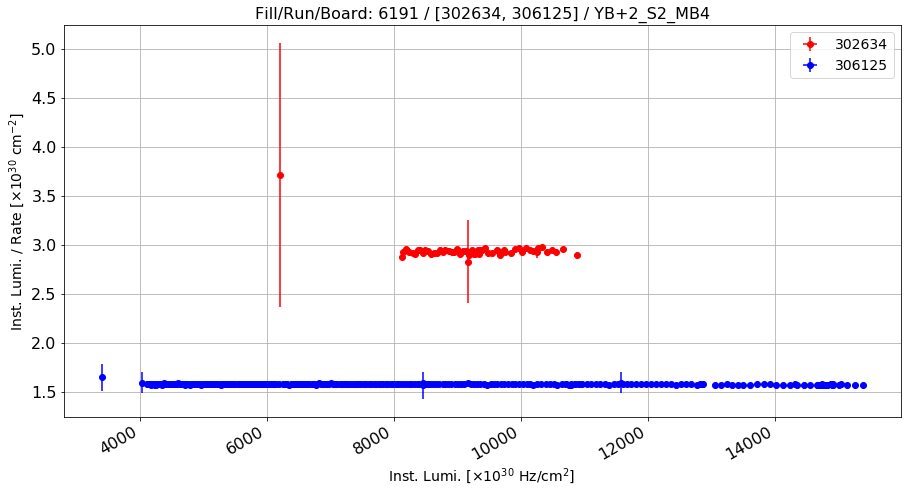

Anomalous Lumi/Rate: 2.94555888914 Normal Lumi/Rate: 1.58040731415 Ratio: 0.863797302615


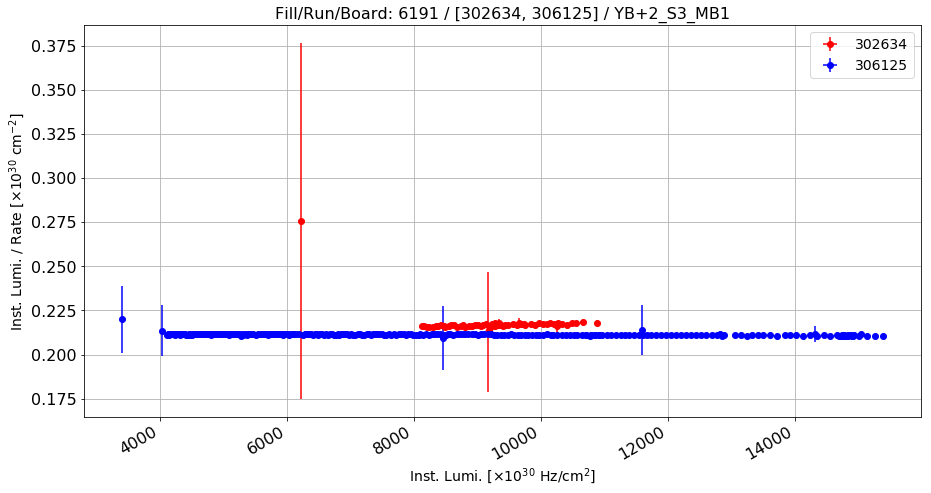

Anomalous Lumi/Rate: 0.217609258284 Normal Lumi/Rate: 0.211336231355 Ratio: 0.0296826856802


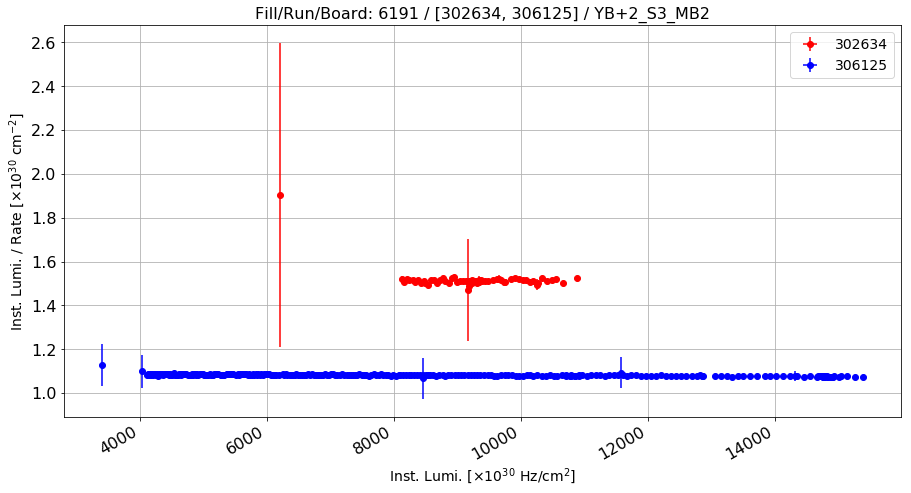

Anomalous Lumi/Rate: 1.51798902949 Normal Lumi/Rate: 1.08227115103 Ratio: 0.402595854138


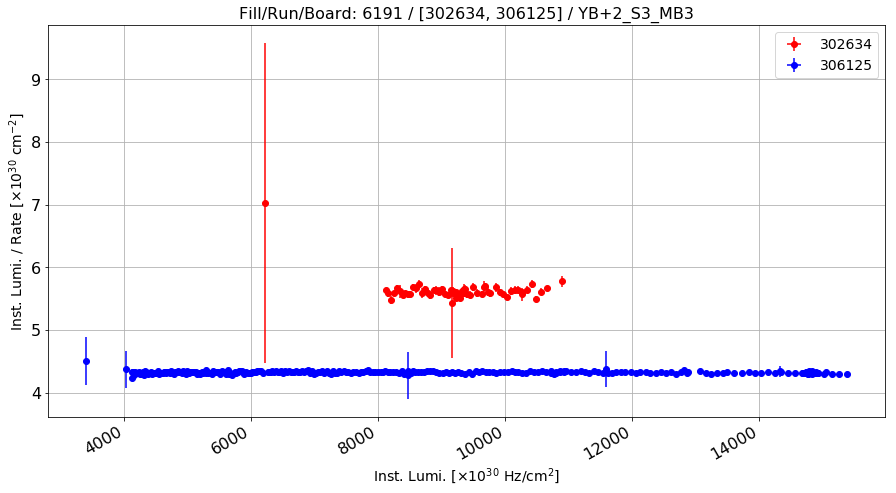

Anomalous Lumi/Rate: 5.63088959463 Normal Lumi/Rate: 4.32427222386 Ratio: 0.30215890747


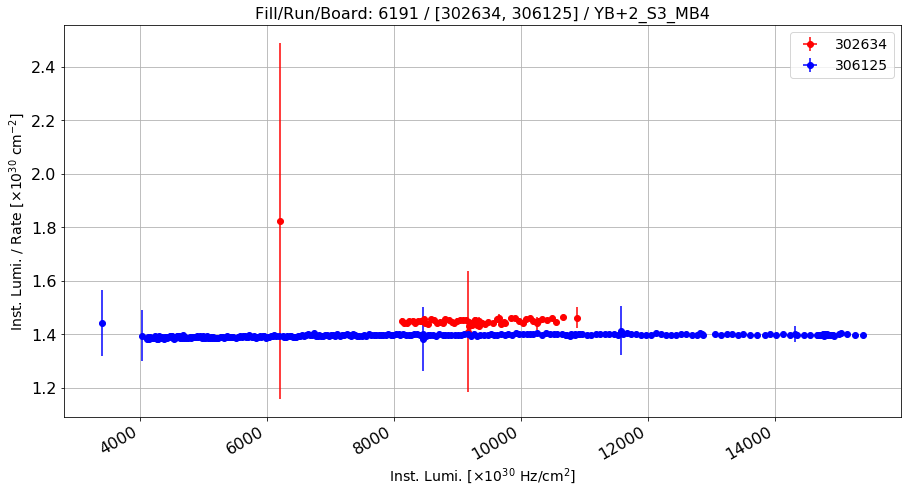

Anomalous Lumi/Rate: 1.45371454308 Normal Lumi/Rate: 1.39513310451 Ratio: 0.0419898562908


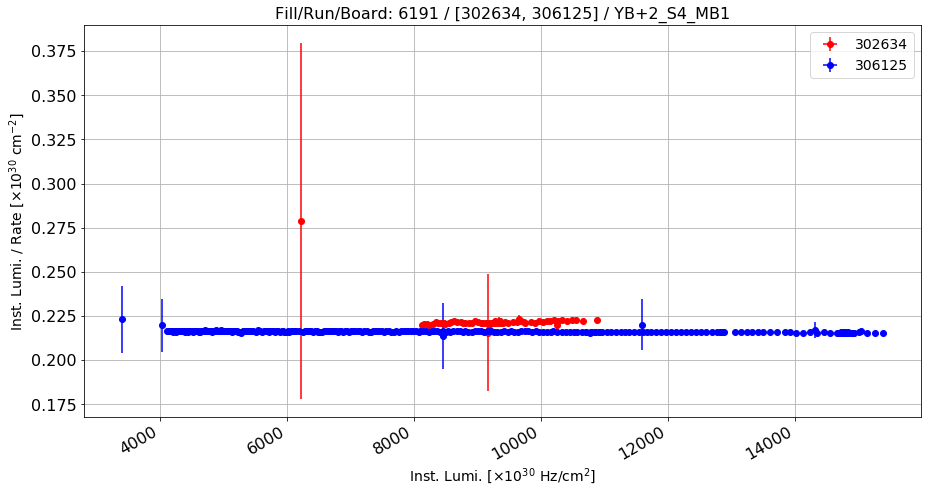

Anomalous Lumi/Rate: 0.222239216967 Normal Lumi/Rate: 0.216216265076 Ratio: 0.0278561462021


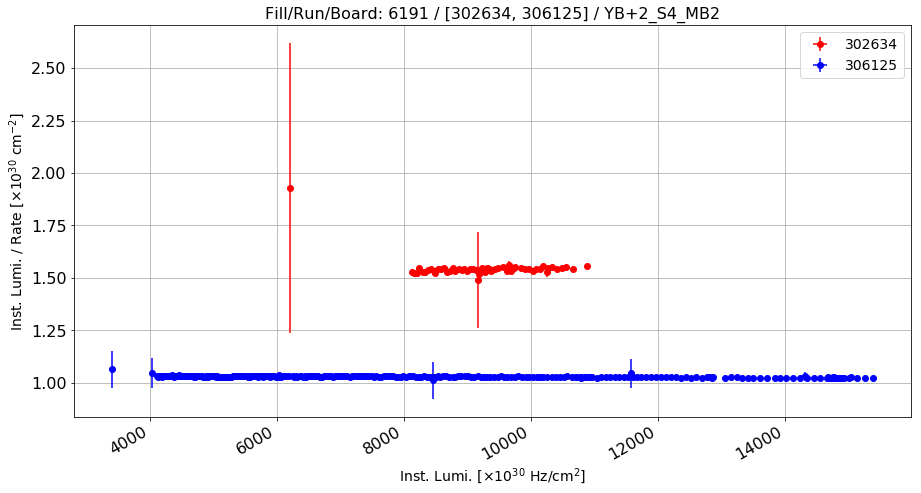

Anomalous Lumi/Rate: 1.54561098413 Normal Lumi/Rate: 1.03001805926 Ratio: 0.500566878643


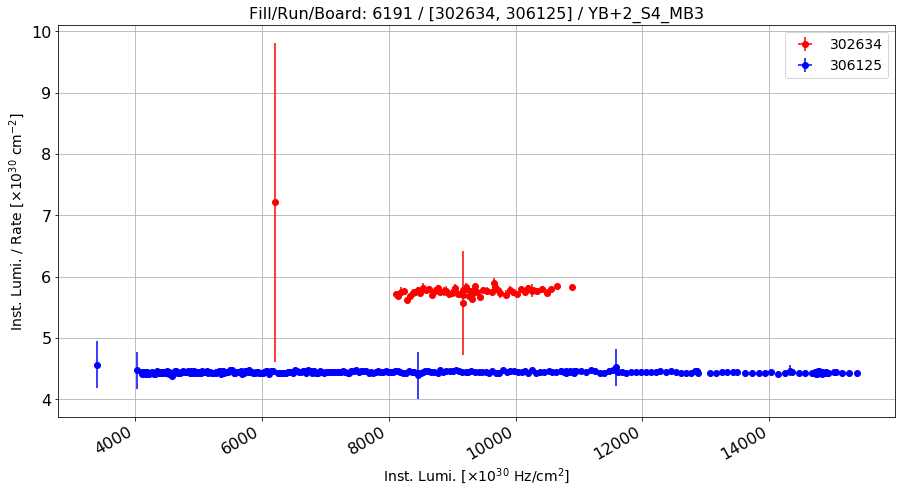

Anomalous Lumi/Rate: 5.78035043382 Normal Lumi/Rate: 4.4428821897 Ratio: 0.301036171345


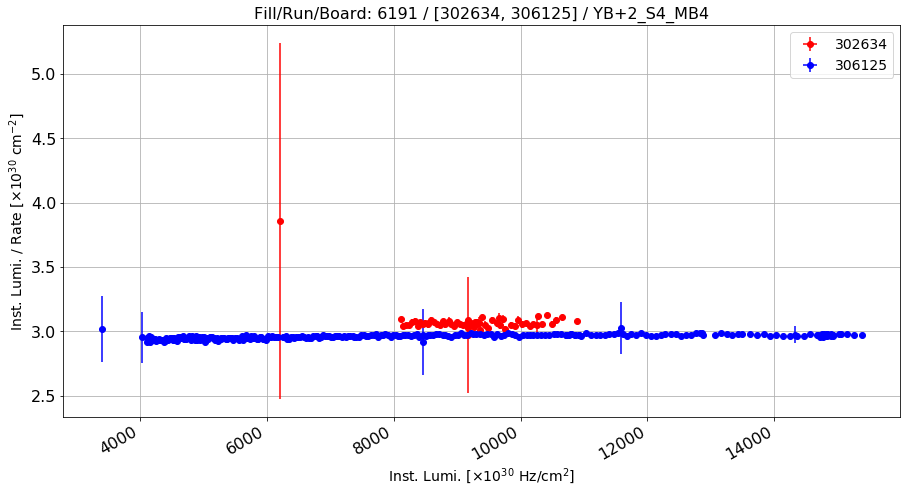

Anomalous Lumi/Rate: 3.07657992654 Normal Lumi/Rate: 2.96105084909 Ratio: 0.0390162423174


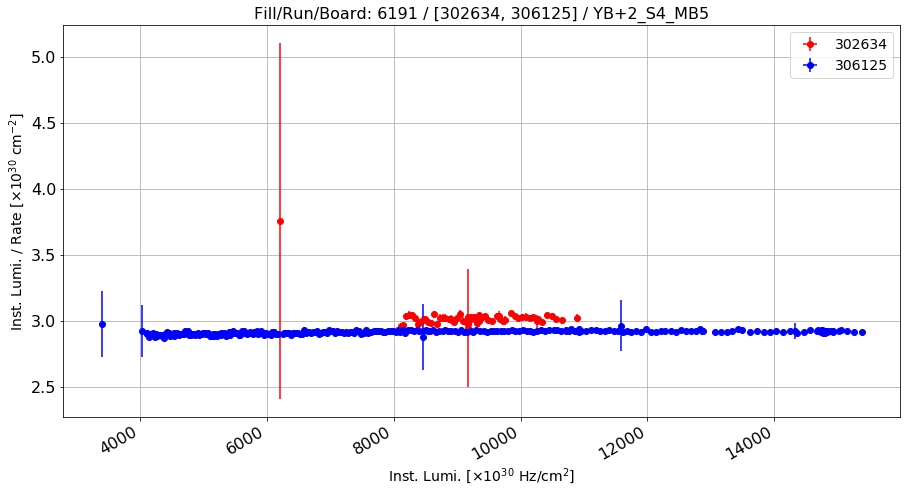

Anomalous Lumi/Rate: 3.02663903593 Normal Lumi/Rate: 2.91436762303 Ratio: 0.0385234216891


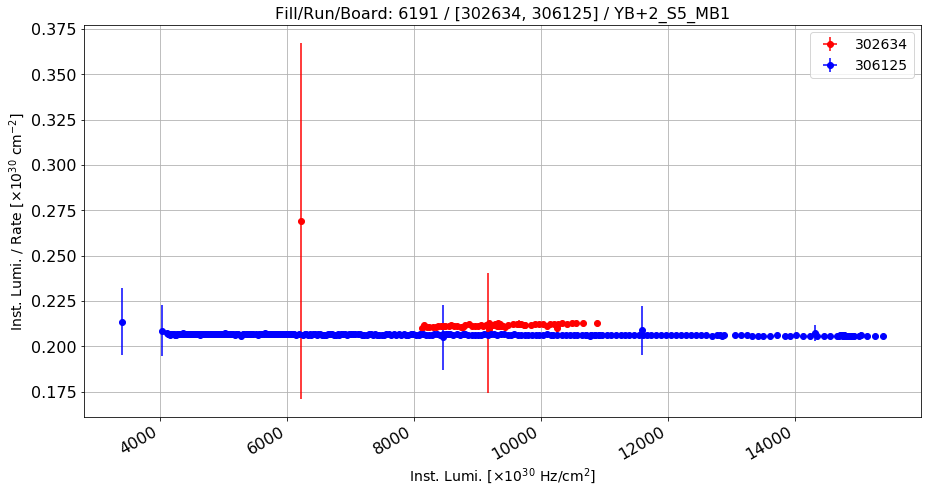

Anomalous Lumi/Rate: 0.212470492876 Normal Lumi/Rate: 0.206457414263 Ratio: 0.0291250311089


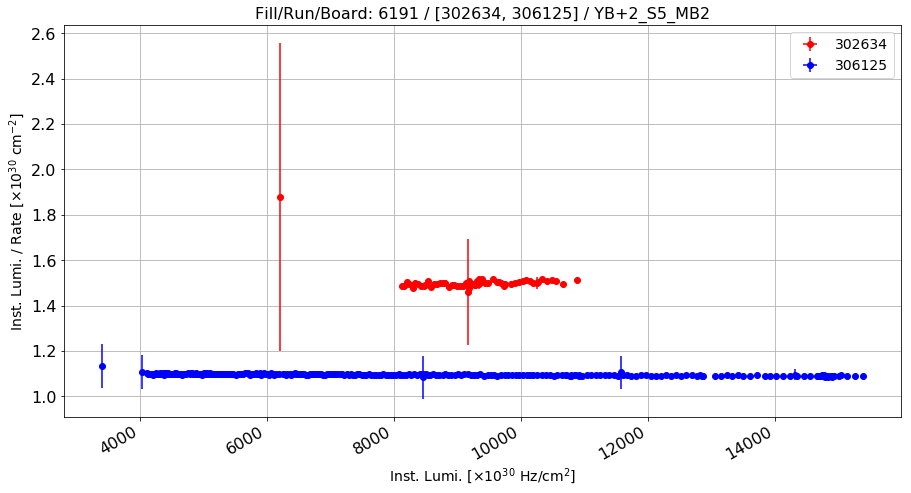

Anomalous Lumi/Rate: 1.5040522654 Normal Lumi/Rate: 1.0953118338 Ratio: 0.373172660957


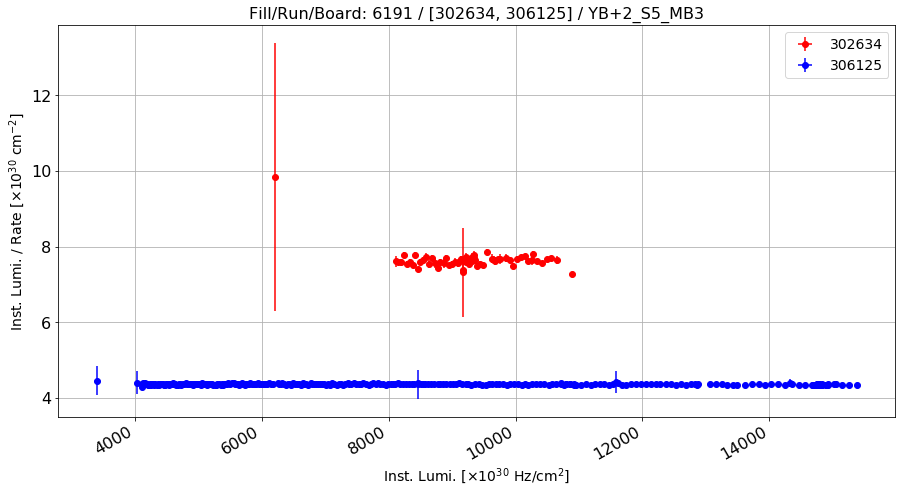

Anomalous Lumi/Rate: 7.65272035184 Normal Lumi/Rate: 4.369481254 Ratio: 0.75140249082


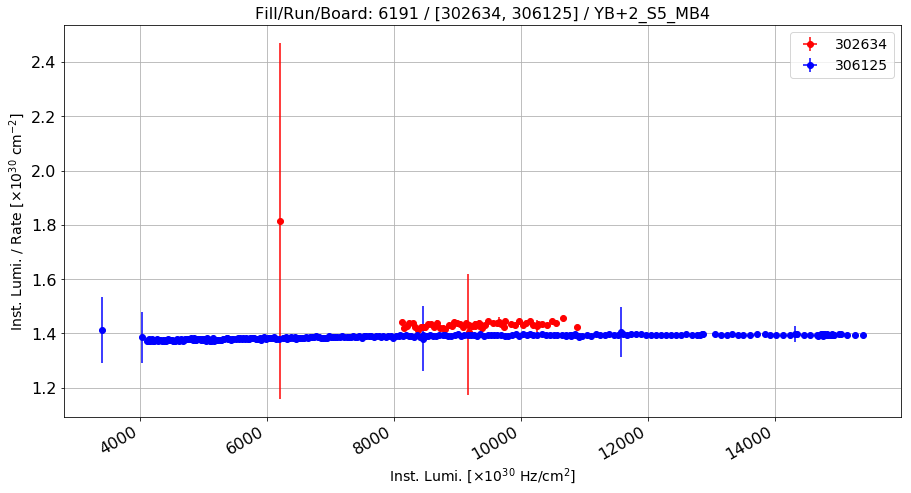

Anomalous Lumi/Rate: 1.43788284259 Normal Lumi/Rate: 1.38722307013 Ratio: 0.0365188364776


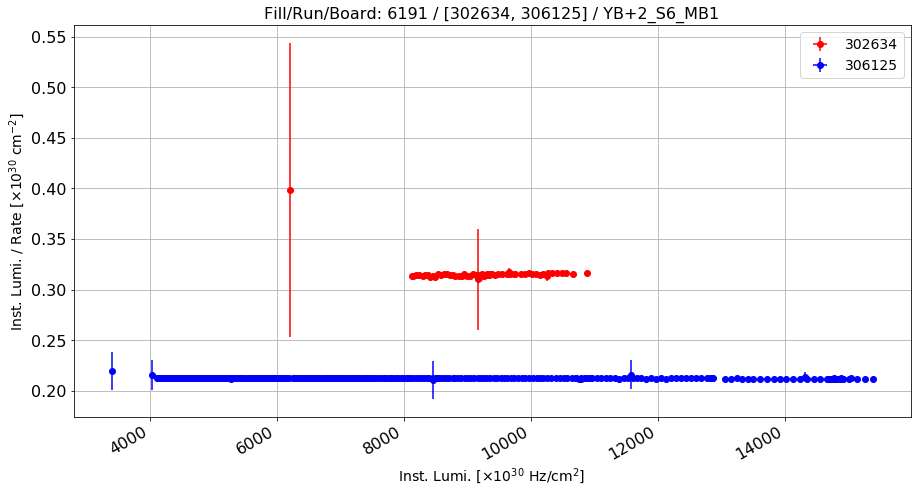

Anomalous Lumi/Rate: 0.316164343295 Normal Lumi/Rate: 0.212643973048 Ratio: 0.486824849837


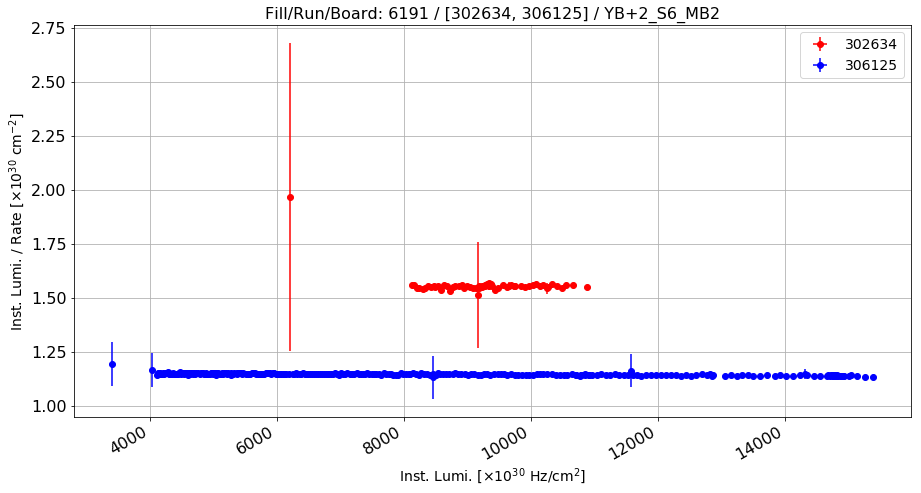

Anomalous Lumi/Rate: 1.55922465289 Normal Lumi/Rate: 1.14634732108 Ratio: 0.360167746912


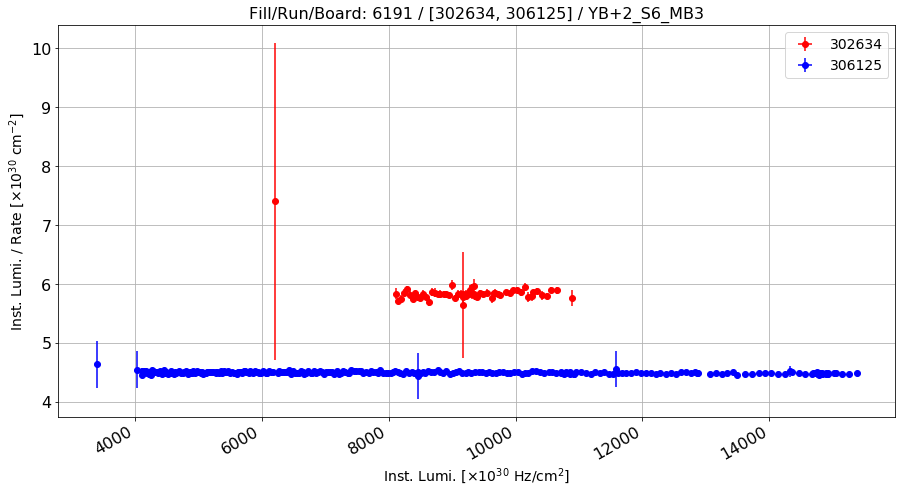

Anomalous Lumi/Rate: 5.85948562165 Normal Lumi/Rate: 4.50188787929 Ratio: 0.301561873322


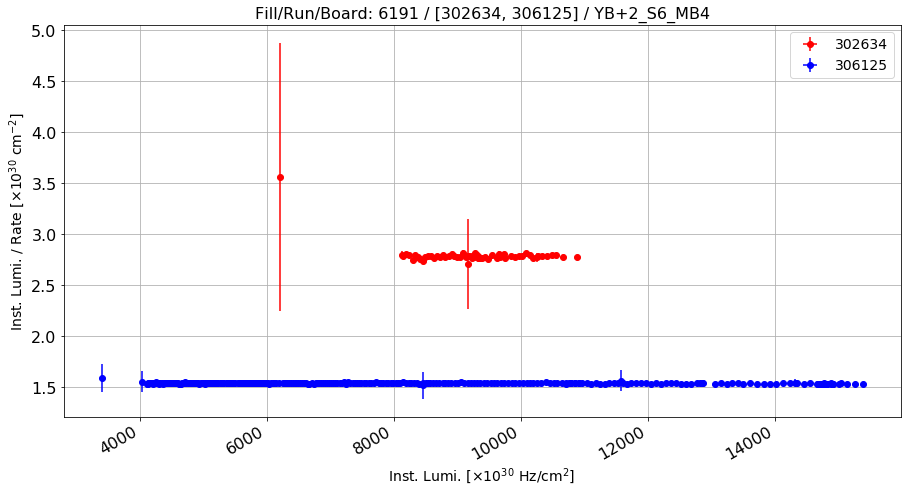

Anomalous Lumi/Rate: 2.79582837087 Normal Lumi/Rate: 1.53951073046 Ratio: 0.816049940772


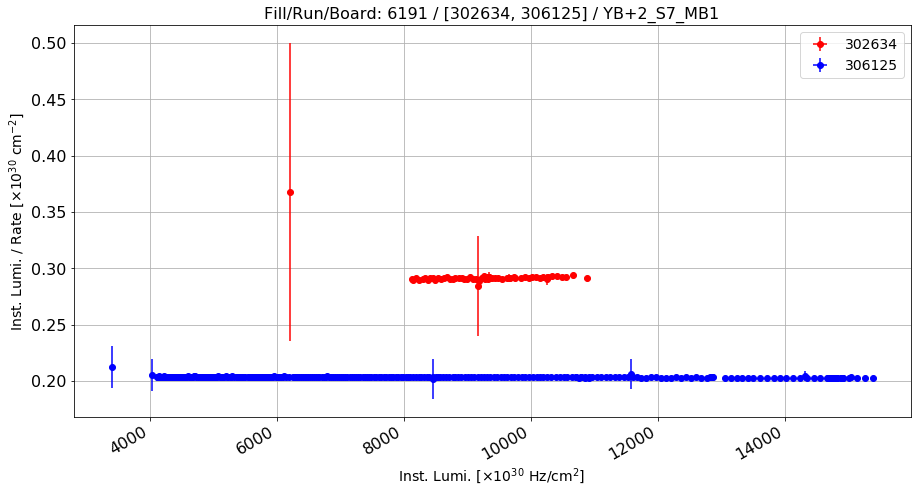

Anomalous Lumi/Rate: 0.292566678228 Normal Lumi/Rate: 0.203638888728 Ratio: 0.436693551289


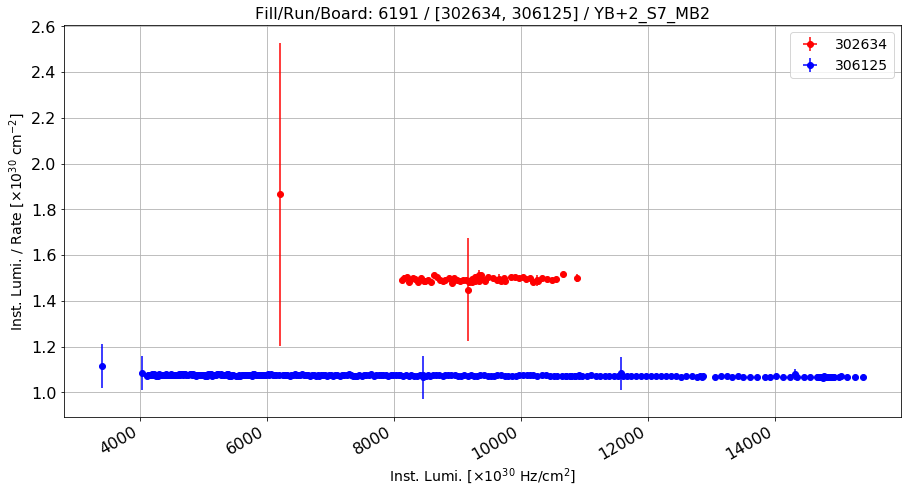

Anomalous Lumi/Rate: 1.49967406295 Normal Lumi/Rate: 1.07407664241 Ratio: 0.396244926784


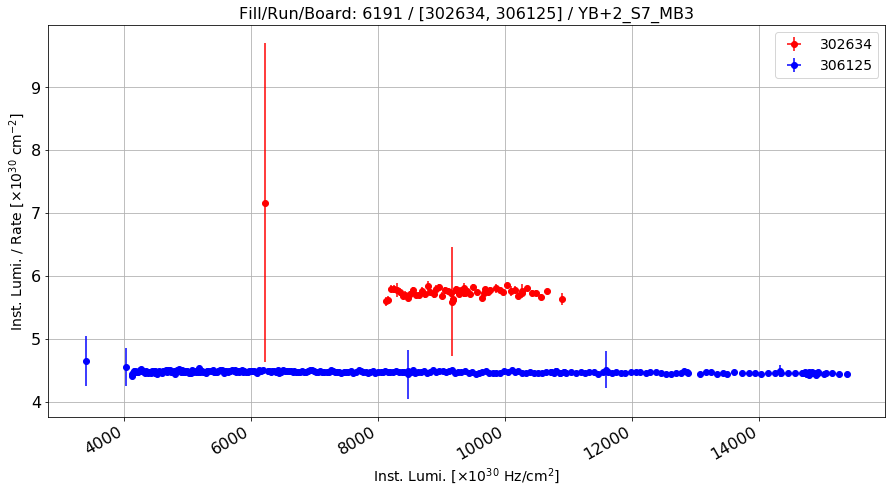

Anomalous Lumi/Rate: 5.75864914233 Normal Lumi/Rate: 4.47313293931 Ratio: 0.287386093921


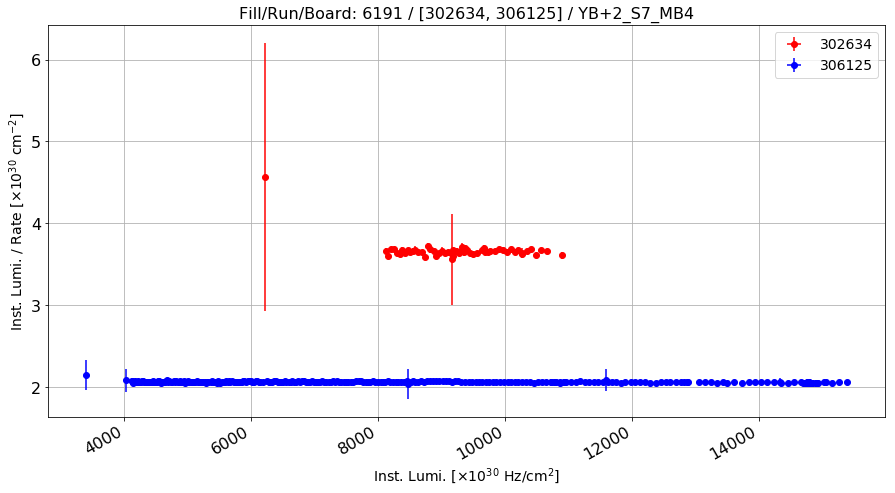

Anomalous Lumi/Rate: 3.6712220624 Normal Lumi/Rate: 2.06714104932 Ratio: 0.775990111368


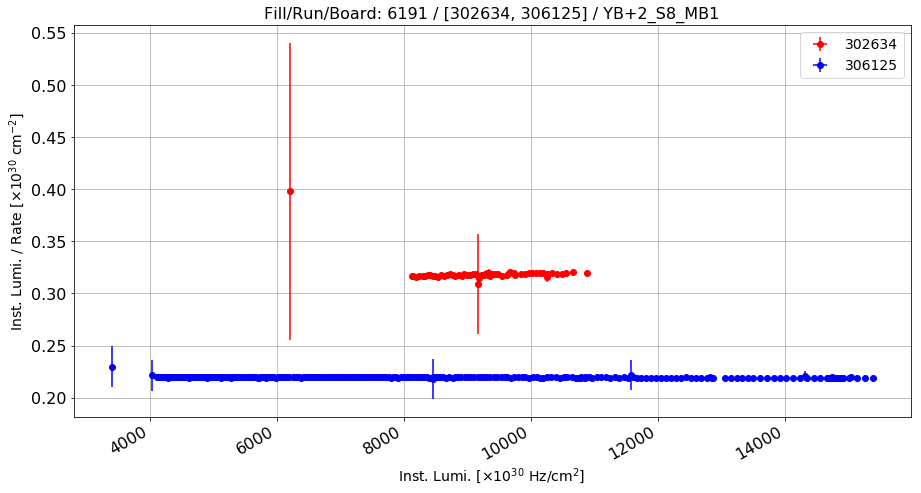

Anomalous Lumi/Rate: 0.319262843319 Normal Lumi/Rate: 0.219443502169 Ratio: 0.454874900204


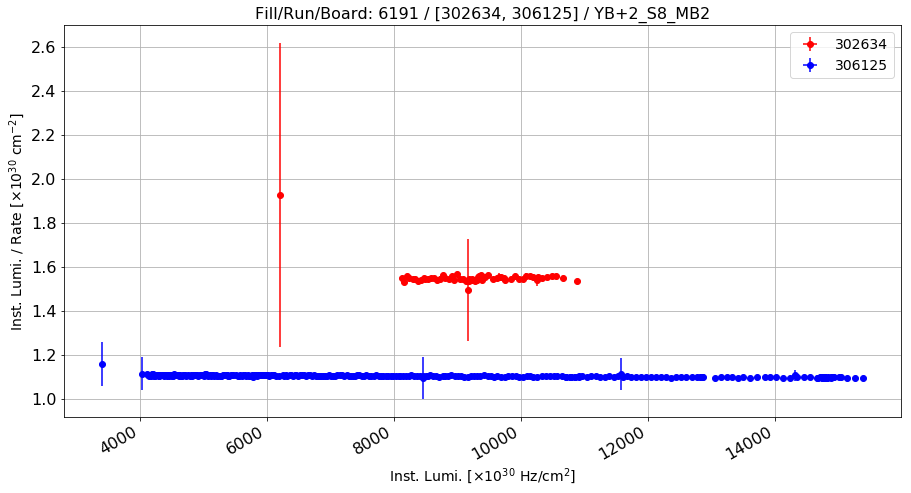

Anomalous Lumi/Rate: 1.55347650079 Normal Lumi/Rate: 1.10372090309 Ratio: 0.40749033242


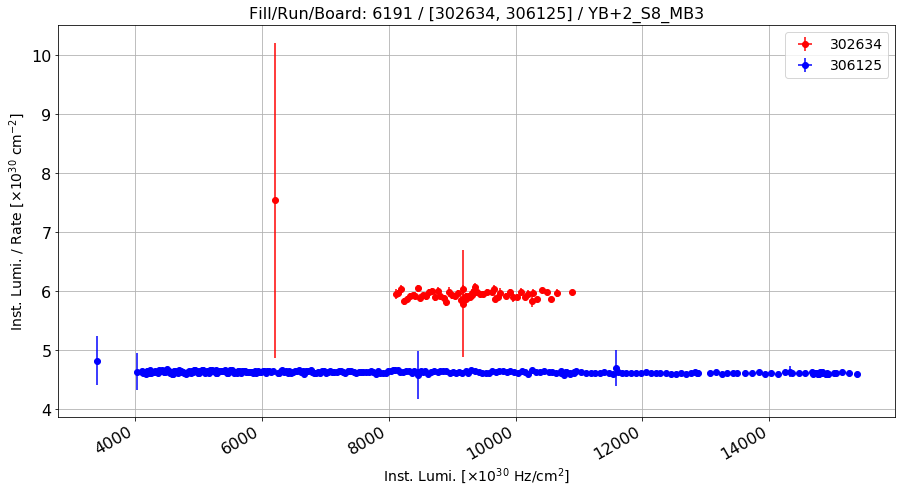

Anomalous Lumi/Rate: 5.96777010969 Normal Lumi/Rate: 4.63113281367 Ratio: 0.288619944579


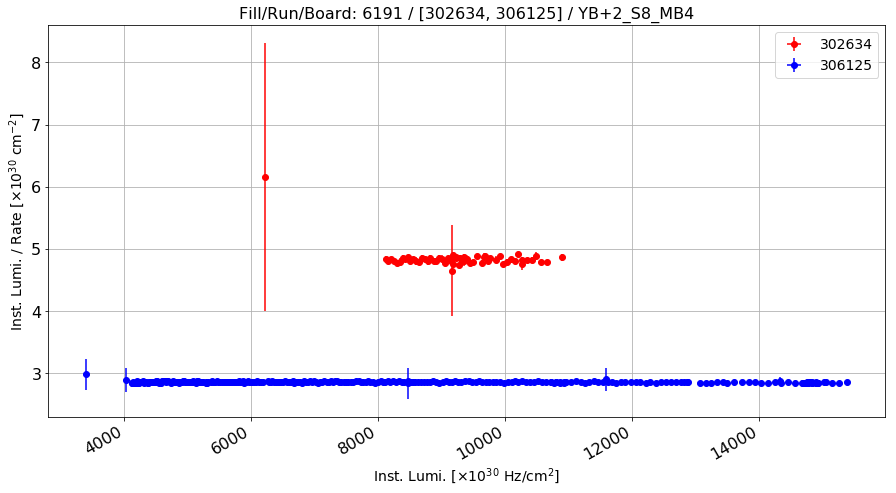

Anomalous Lumi/Rate: 4.84674320895 Normal Lumi/Rate: 2.8627953902 Ratio: 0.693010693517


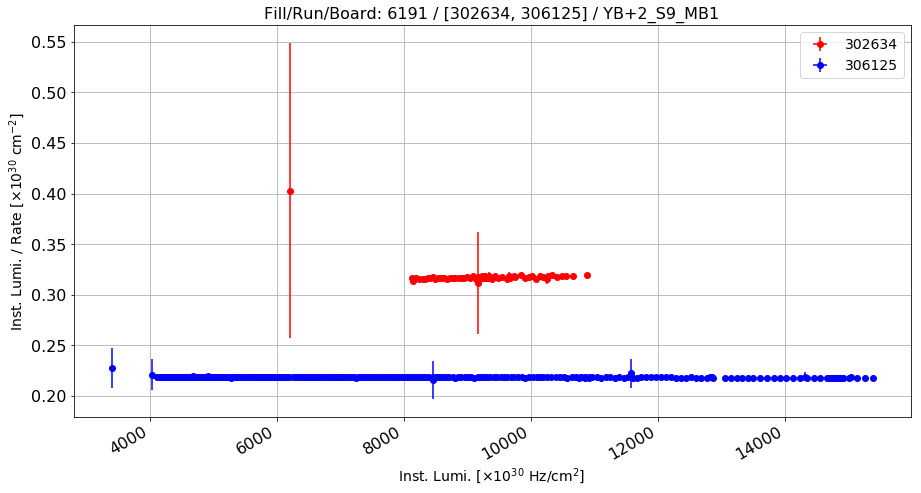

Anomalous Lumi/Rate: 0.318382268696 Normal Lumi/Rate: 0.218536129246 Ratio: 0.456886189917


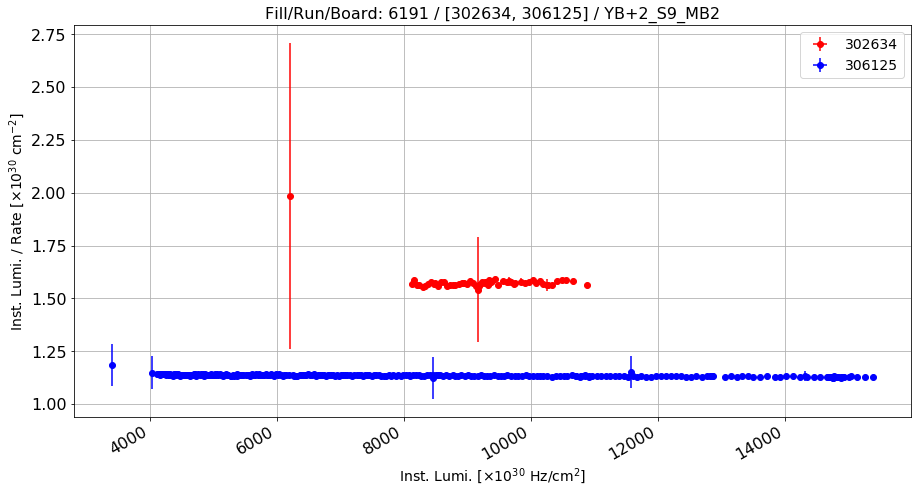

Anomalous Lumi/Rate: 1.57893549943 Normal Lumi/Rate: 1.13549959217 Ratio: 0.390520534151


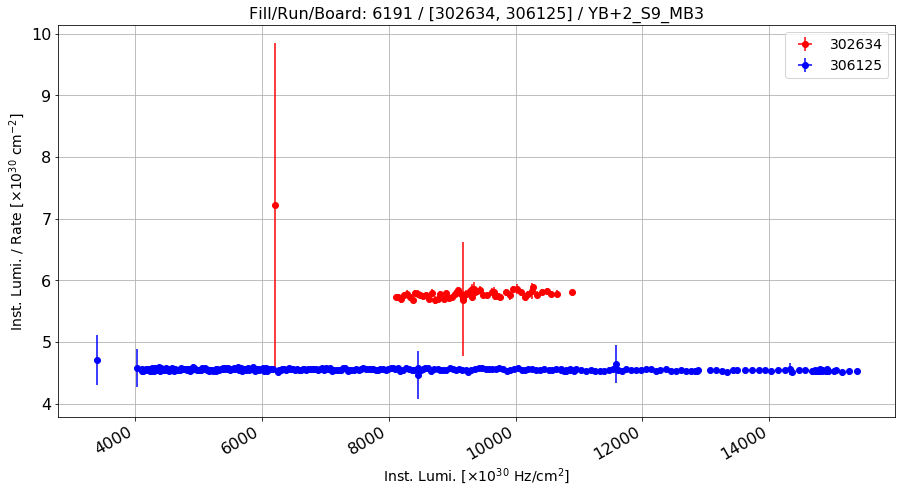

Anomalous Lumi/Rate: 5.7980223972 Normal Lumi/Rate: 4.55297758524 Ratio: 0.273457268052


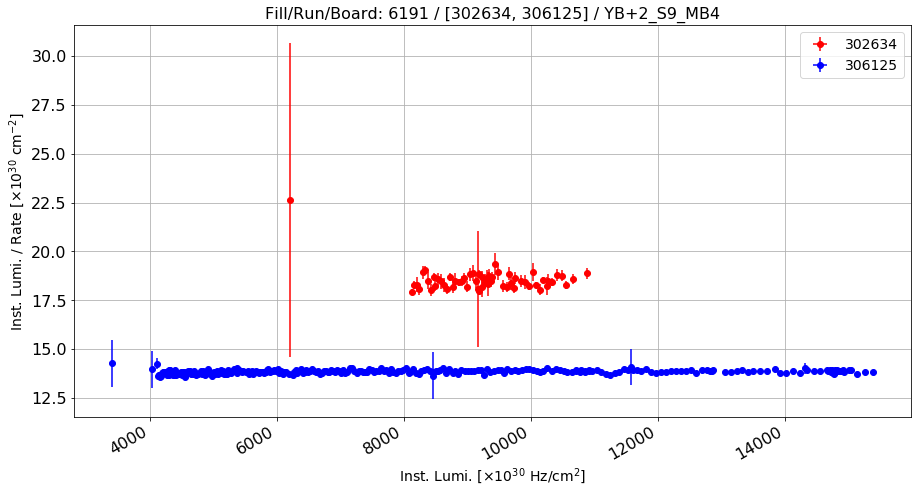

Anomalous Lumi/Rate: 18.5488845538 Normal Lumi/Rate: 13.8514645781 Ratio: 0.339128035833


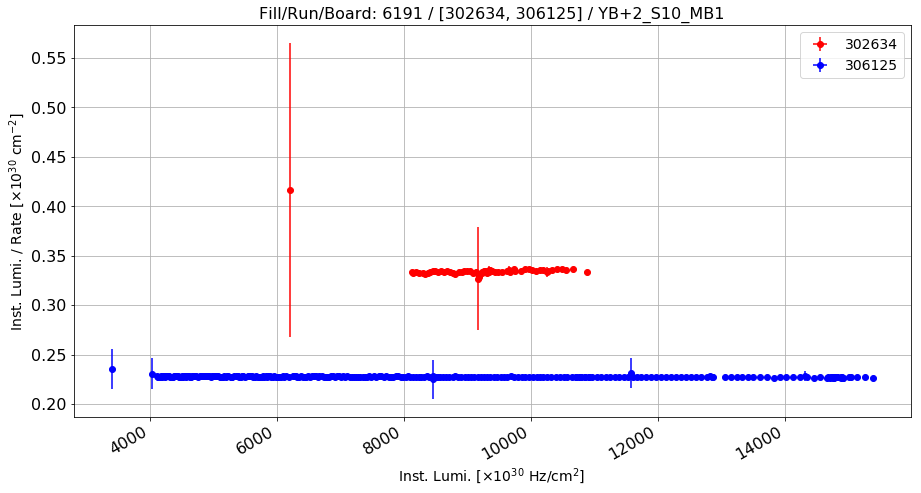

Anomalous Lumi/Rate: 0.335268228614 Normal Lumi/Rate: 0.227592397096 Ratio: 0.473108209644


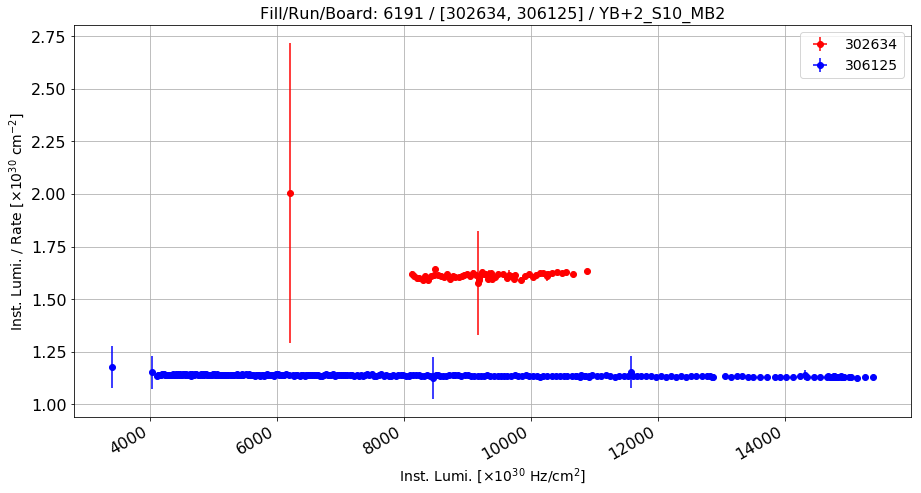

Anomalous Lumi/Rate: 1.61914310645 Normal Lumi/Rate: 1.13789913053 Ratio: 0.422923230195


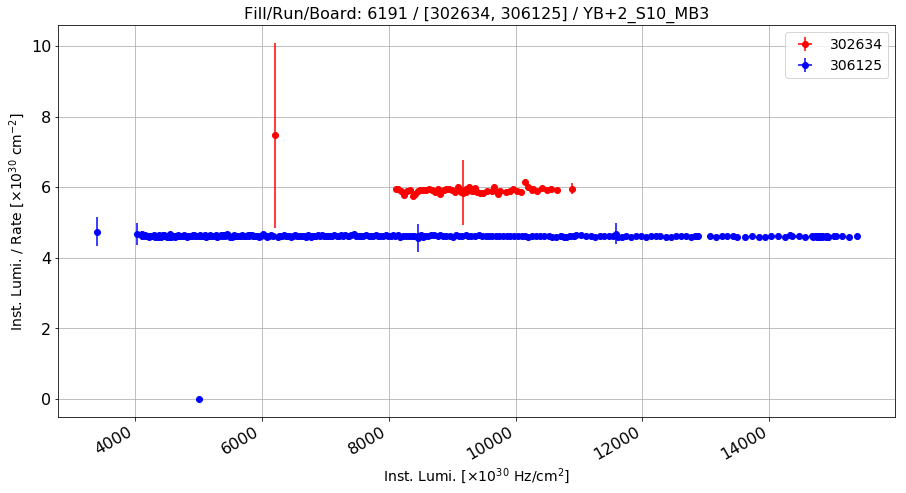

Anomalous Lumi/Rate: 5.93399314154 Normal Lumi/Rate: 4.60121224823 Ratio: 0.28965864242


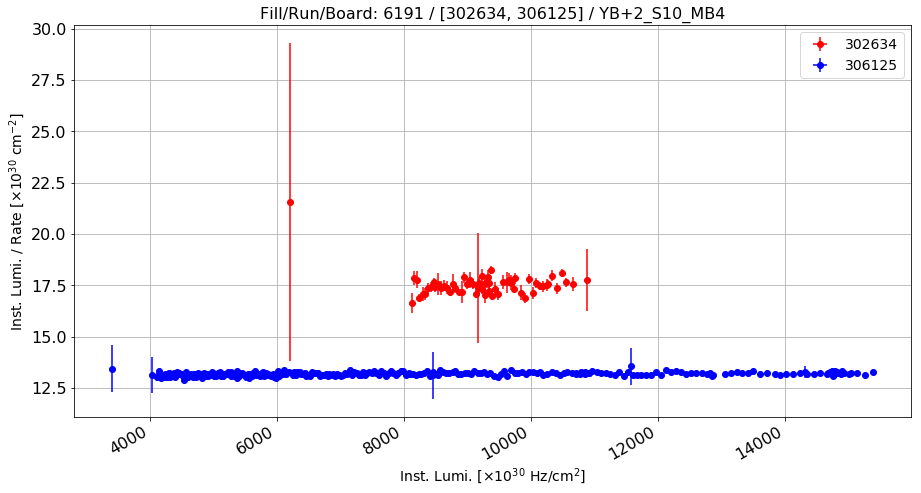

Anomalous Lumi/Rate: 17.5384052831 Normal Lumi/Rate: 13.182609604 Ratio: 0.330419834154


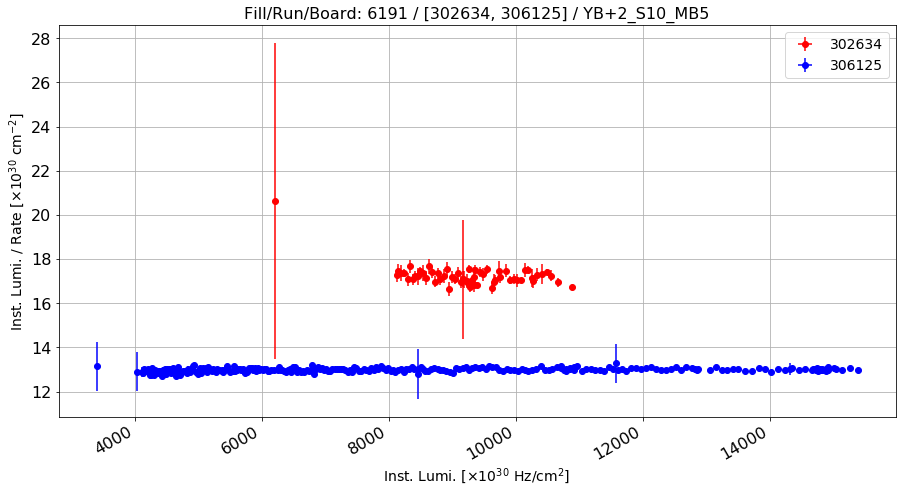

Anomalous Lumi/Rate: 17.2495461521 Normal Lumi/Rate: 12.9905363217 Ratio: 0.327854810991


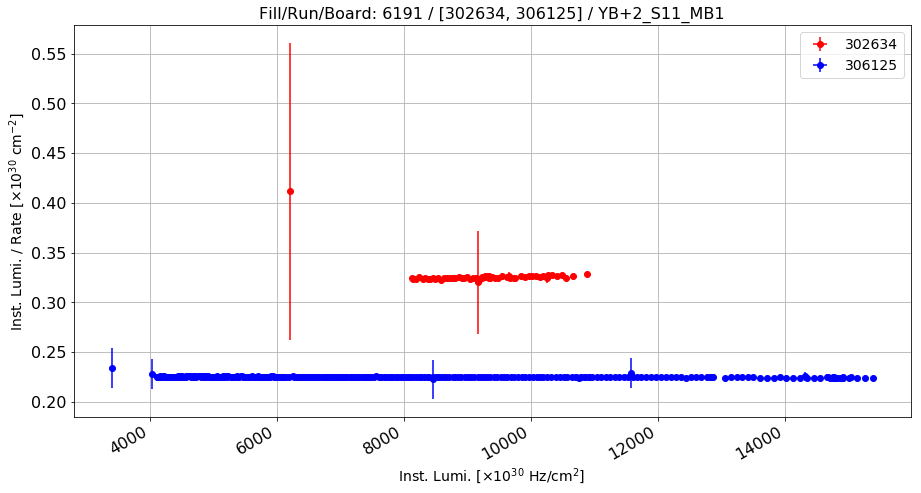

Anomalous Lumi/Rate: 0.3264185548 Normal Lumi/Rate: 0.225066674227 Ratio: 0.450319359458


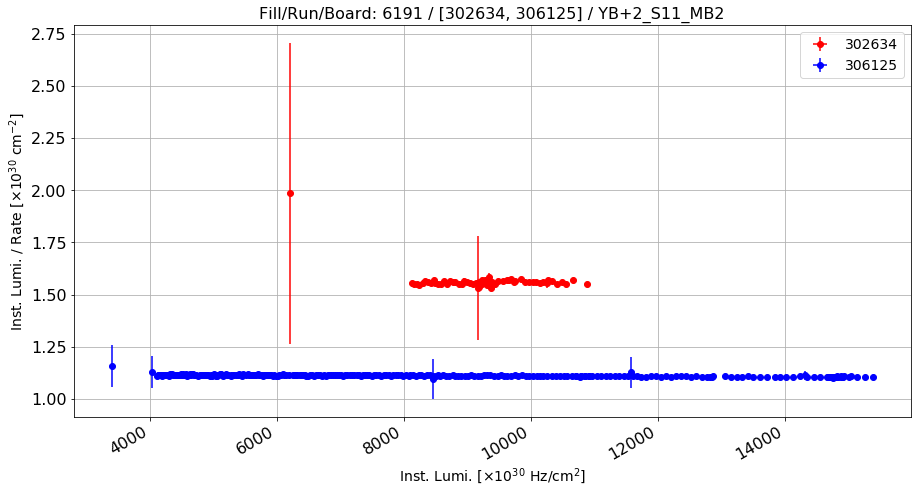

Anomalous Lumi/Rate: 1.56535044261 Normal Lumi/Rate: 1.1121240749 Ratio: 0.407532197116


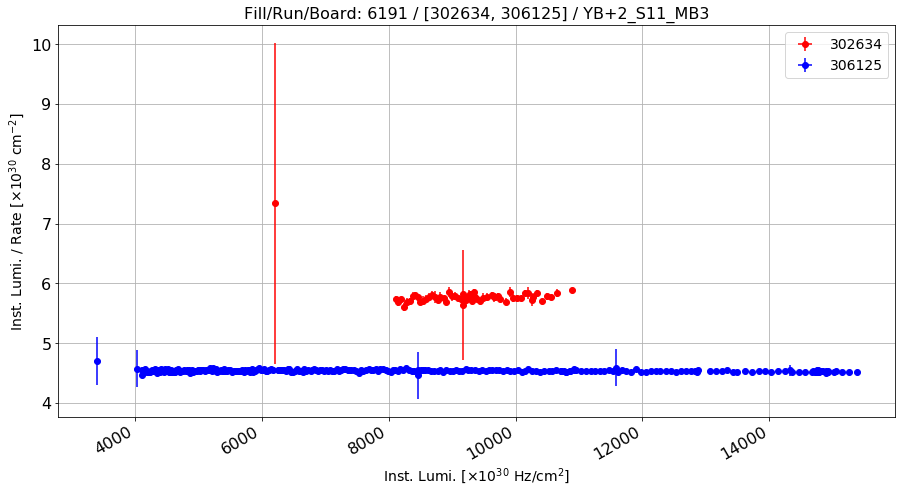

Anomalous Lumi/Rate: 5.78937305959 Normal Lumi/Rate: 4.54257256757 Ratio: 0.274470131953


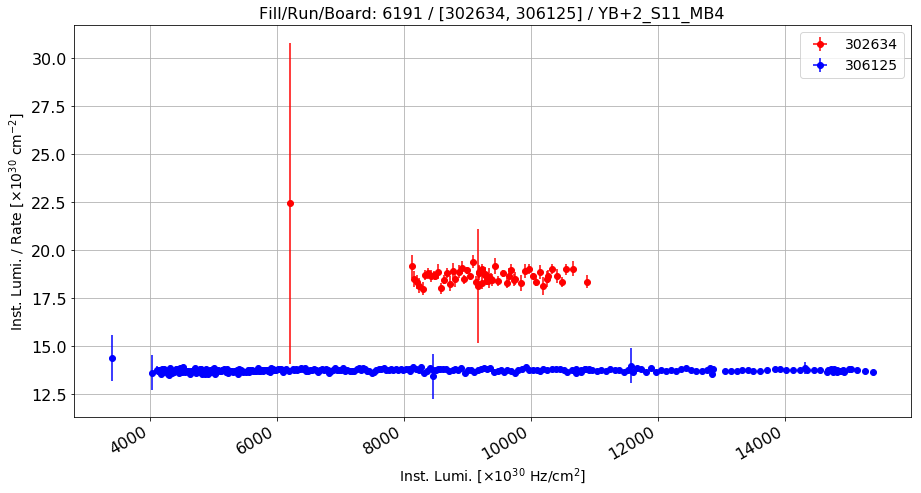

Anomalous Lumi/Rate: 18.7026994324 Normal Lumi/Rate: 13.7588083032 Ratio: 0.359325533158


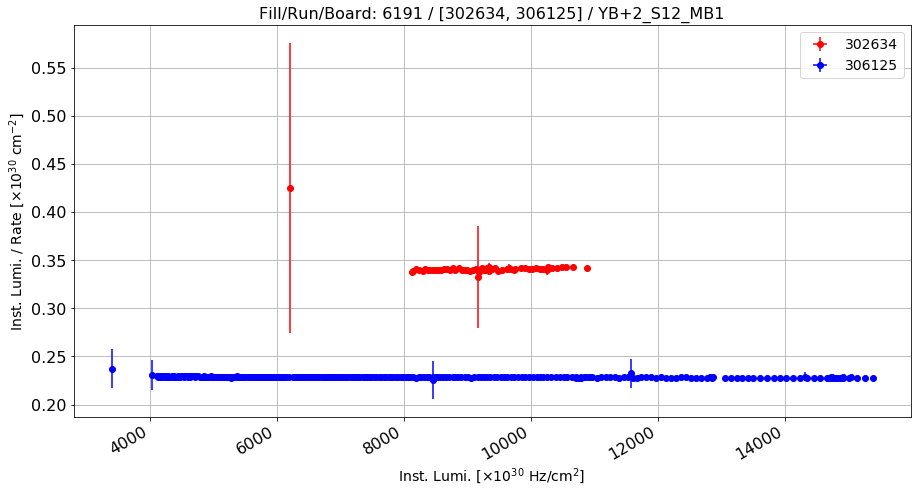

Anomalous Lumi/Rate: 0.341895418024 Normal Lumi/Rate: 0.228570719837 Ratio: 0.495797091891


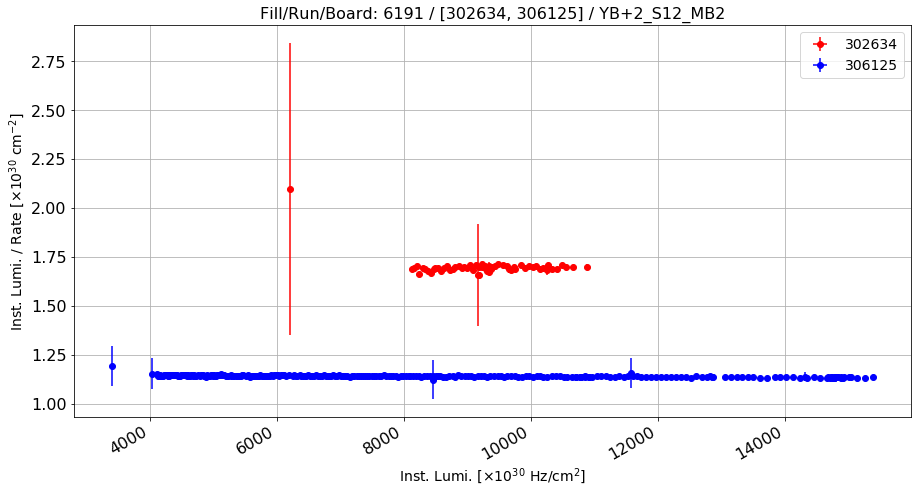

Anomalous Lumi/Rate: 1.70052367363 Normal Lumi/Rate: 1.1415874951 Ratio: 0.48961308785


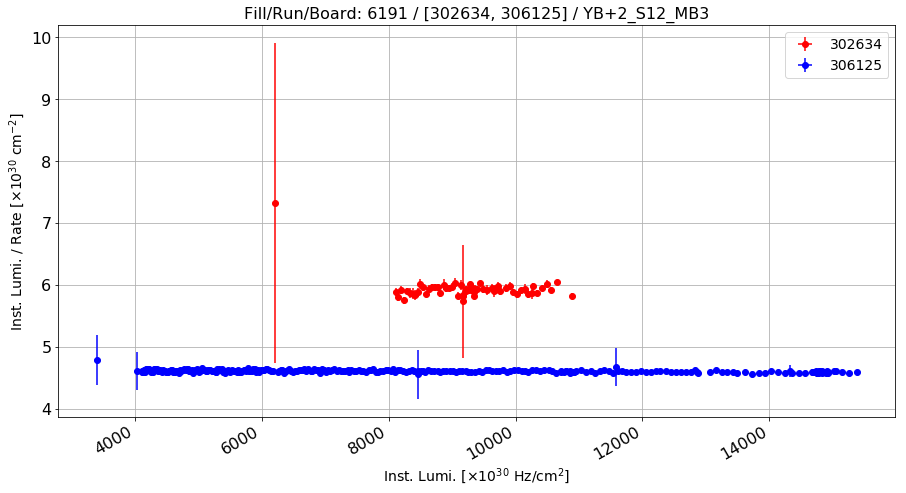

Anomalous Lumi/Rate: 5.94041721533 Normal Lumi/Rate: 4.61159686582 Ratio: 0.288147552393


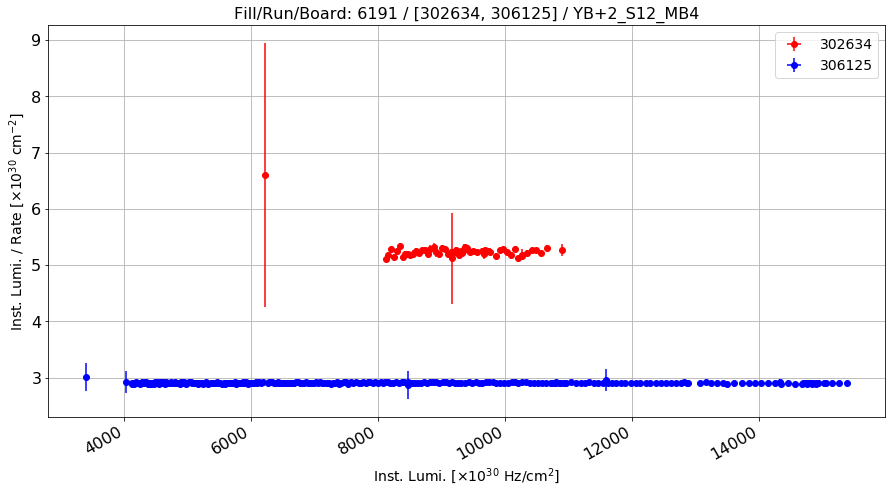

Anomalous Lumi/Rate: 5.25450202747 Normal Lumi/Rate: 2.90562889154 Ratio: 0.808387176621


In [48]:
ratio = pd.DataFrame(columns=["wheel", "sector", "station", "ratio", "ref", "anomal",\
                              "cs_norm", "ca_anomal"])
for i in [-2, -1, 0, +1, +2]:
    for j in range(1, 13):
        if ((j == 4) | (j == 10)):
            range_ = range(1, 6)
        else:
            range_ = range(1, 5)
        for k in range_:

            if (i > 0):
                board = "YB+" + str(i) + "_S" + str(j)
            else:
                board = "YB" + str(i) + "_S" + str(j)
            station = "DT" + str(k)
            
            error = "err"+station
            
            title = "Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / "+str("[302634, 306125]")+" / " + board + "_MB" + str(k)
                
            (a, b, c) = plot_ratio_vs_ls(df_rates, [302634, 306125], "lumi", station, board, 0,\
                            error, r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                            r"Inst. Lumi. / Rate [$\times10^{30}$ cm$^{-2}$]", title, ["ro", "bo"], False)

            ratio = ratio.append({"wheel": i, "sector": j, "station": k, "ratio": c, "ref": b,\
                                  "anomal": a, "cs_norm": 1/b, "cs_anomal": 1/a}, ignore_index = True)
            
            print "Anomalous Lumi/Rate:", a, "Normal Lumi/Rate:", b, "Ratio:", c
            

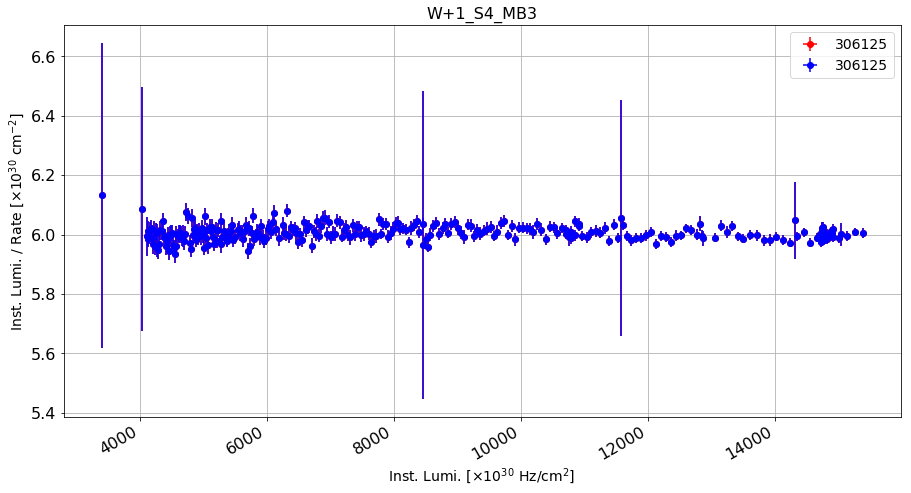

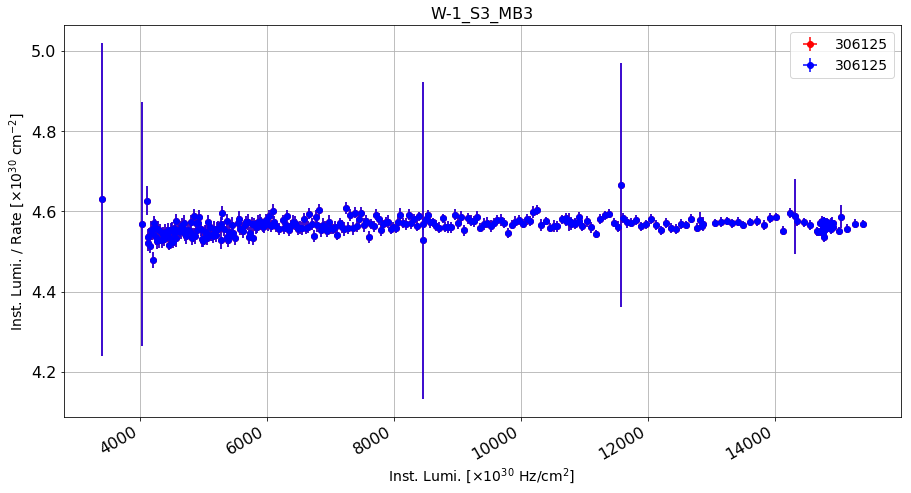

Fit W+1_S4_MB3:  6.00634596659 , Fit W-1_S3_MB3: 4.56428523583 , Ratio: 0.240089521779


In [49]:
(a1, b1, c1) = plot_ratio_vs_ls(df_rates, [306125, 306125], "lumi", "DT3", "YB+1_S4", 0,\
                            "errDT3", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                            r"Inst. Lumi. / Rate [$\times10^{30}$ cm$^{-2}$]", "W+1_S4_MB3",\
                                ["ro", "bo"], False)
(a2, b2, c2) = plot_ratio_vs_ls(df_rates, [306125, 306125], "lumi", "DT3", "YB-1_S3", 0,\
                            "errDT3", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                            r"Inst. Lumi. / Rate [$\times10^{30}$ cm$^{-2}$]", "W-1_S3_MB3",\
                                ["ro", "bo"], False)
print "Fit W+1_S4_MB3: ", a1, ", Fit W-1_S3_MB3:", a2, ", Ratio:", abs(a1-a2)/a1
value = abs(a1-a2)/a1

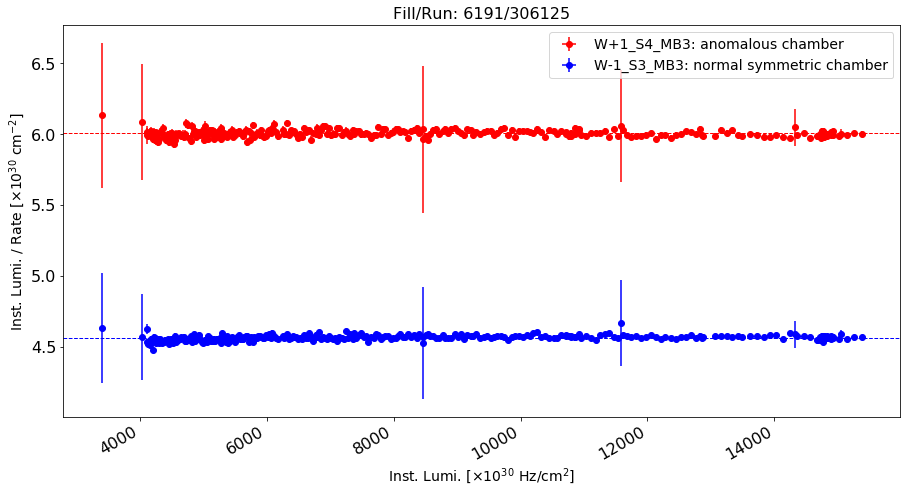

In [50]:
def plot_ratio_vs_ls_2(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y,\
                       title, opt, log, labels):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    fig.autofmt_xdate()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    #plt.ylim(0, 5.)
    #plt.xlim(0, 4000)
    #ax.grid()
    if log:
        ax.set_yscale('log')
    df_temp["ratio"] = df_temp[x_val]/df_temp[y_val]
    df_temp["errRatio"] = (1/df_temp[y_val])*\
    np.sqrt(df_temp["errLumi"]**2 + df_temp[y_err]**2*df_temp["ratio"]**2)
    for i in range(0, len(z_val)):
        rule = ((df_temp["board"] == z_val[i]) & (df_temp["run"] == run))
        #plt.plot(df_temp[rule][x_val], df_temp[rule]["ratio"], opt[i], label=labels[i])
        newstr = opt[i].replace("o", "")
        plt.errorbar(df_temp[rule][x_val], df_temp[rule]["ratio"], xerr=x_err,\
        yerr=df_temp[rule]["errRatio"],\
        fmt=opt[i], ecolor=newstr, label=labels[i])
    plt.legend(loc="best")
    plt.title(title)
    plt.axhline(6.00634596659, color='r', linestyle='dashed', linewidth=1)
    plt.axhline(4.56428523583, color='b', linestyle='dashed', linewidth=1)
    plt.show()

title = "Fill/Run: "+str(int_lumi2["fill"].iloc[0])+"/"+str("306125")
plot_ratio_vs_ls_2(df_rates, 306125, "lumi", "DT3", ["YB+1_S4", "YB-1_S3"], 0,\
                            "errDT3", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                            r"Inst. Lumi. / Rate [$\times10^{30}$ cm$^{-2}$]",\
                   title, ["ro", "bo"], False,\
                   ["W+1_S4_MB3: anomalous chamber", "W-1_S3_MB3: normal symmetric chamber"])

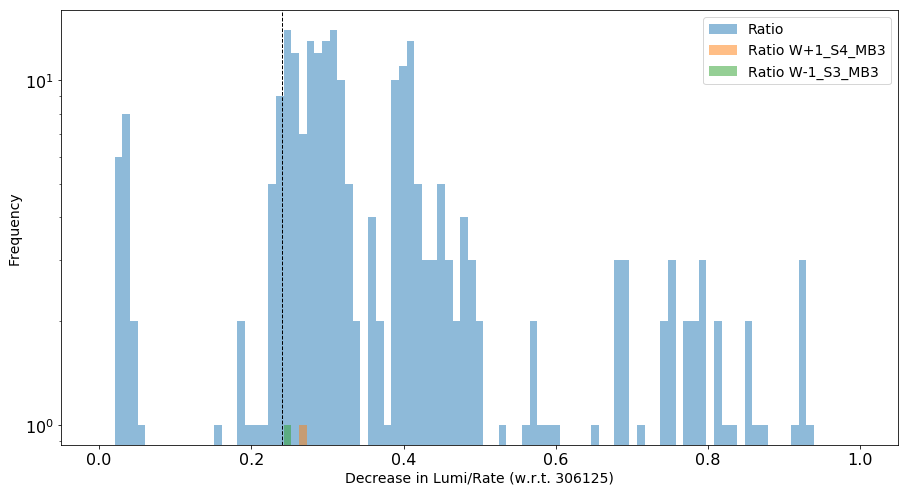

In [51]:
fig, ax = plt.subplots()
ax.set_yscale('log')
bins = np.linspace(0, 1, 100)
rule1 = (ratio.wheel == 1) & (ratio.sector == 4) & (ratio.station == 3)
rule2 = (ratio.wheel == -1) & (ratio.sector == 3) & (ratio.station == 3)
plt.hist(ratio["ratio"], bins=bins, alpha=0.5, label="Ratio")
plt.hist(ratio[rule1]["ratio"], bins=bins, alpha=0.5, label="Ratio W+1_S4_MB3")
plt.hist(ratio[rule2]["ratio"], bins=bins, alpha=0.5, label="Ratio W-1_S3_MB3")
plt.title("")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Decrease in Lumi/Rate (w.r.t. 306125)')
plt.axvline(value, color='k', linestyle='dashed', linewidth=1)
plt.show()

In [52]:
print "Total number of chambers:" ,len(ratio["ratio"].values)
count = np.where(ratio["ratio"].values > value)
print "Chambers over threshold: ", len(count[0])
print "Fraction of chambers over threshold:", float(len(count[0])) / len(ratio["ratio"].values)

Total number of chambers: 250
Chambers over threshold:  216
Fraction of chambers over threshold: 0.864


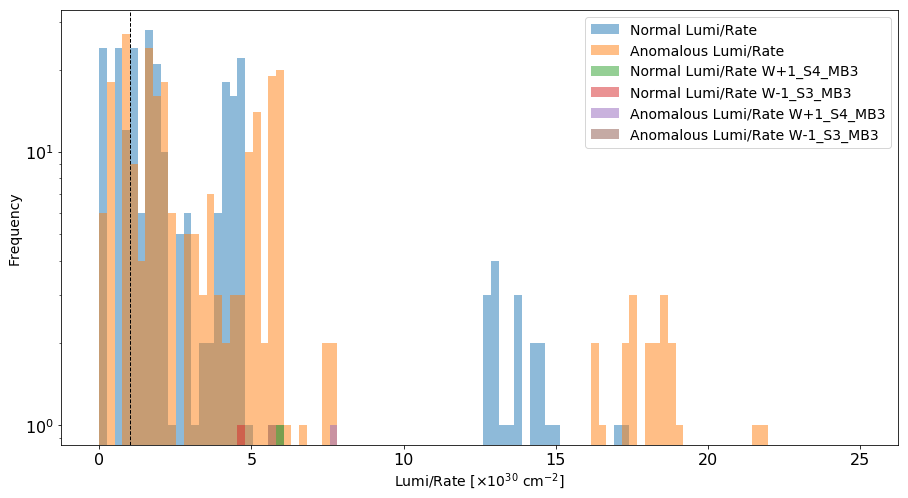

In [53]:
fig, ax = plt.subplots()
ax.set_yscale('log')
bins = np.linspace(0, 25, 100)
rule1 = (ratio.wheel == 1) & (ratio.sector == 4) & (ratio.station == 3)
rule2 = (ratio.wheel == -1) & (ratio.sector == 3) & (ratio.station == 3)
plt.hist(ratio["ref"], bins=bins, alpha=0.5, label="Normal Lumi/Rate")
plt.hist(ratio["anomal"], bins=bins, alpha=0.5, label="Anomalous Lumi/Rate")
plt.hist(ratio[rule1]["ref"], bins=bins, alpha=0.5, label="Normal Lumi/Rate W+1_S4_MB3")
plt.hist(ratio[rule2]["ref"], bins=bins, alpha=0.5, label="Normal Lumi/Rate W-1_S3_MB3")
plt.hist(ratio[rule1]["anomal"], bins=bins, alpha=0.5, label="Anomalous Lumi/Rate W+1_S4_MB3")
plt.hist(ratio[rule2]["anomal"], bins=bins, alpha=0.5, label="Anomalous Lumi/Rate W-1_S3_MB3")
plt.title("")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel(r'Lumi/Rate [$\times 10^{30}$ cm$^{-2}$]')
plt.axvline(1.0, color='k', linestyle='dashed', linewidth=1)
plt.show()

Create a new dataframe with the input features already organized in a numpy array:

In [54]:
print len(df_rates)
algos = ['RPC1', 'RPC2', 'RPC3', 'RPC4', 'DT1', 'DT2', 'DT3', 'DT4', 'DT5']
df_rates_new = pd.DataFrame(columns=['run', 'group', 'board', 'wheel', 'sector', 'ls',\
                                     'lumi', 'errLumi', 'rate', 'err', 'system', 'station'])

for i in algos:
    list_a = ['run', 'group', 'board', 'wheel', 'sector', 'ls', 'lumi', 'errLumi', i, 'err'+i,]
    temp = df_rates.copy()
    temp = temp[list_a]
    temp["system"] = -1
    temp["station"] = -1
    j = i
    if (i.find("RPC") != -1):
        temp["system"] = 1
        num = i.replace("RPC", "")
        temp["station"] = int(num)
    else:
        temp["system"] = 2
        num = i.replace("DT", "")
        temp["station"] = int(num)
    temp = temp.rename(columns={j: 'rate', 'err'+j: 'err'})
    #print temp.columns
    df_rates_new = pd.concat([df_rates_new, temp], ignore_index=True)

print len(df_rates_new)

29520
265680


In [55]:
def plot_rate_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    fig.autofmt_xdate()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        plt.errorbar(df_temp[rule][x_val], df_temp[rule][y_val], xerr=x_err,\
                     yerr=df_temp[rule][y_err], fmt=opt, ecolor='r')
    plt.legend(loc="best")
    plt.title(title)
    plt.show()

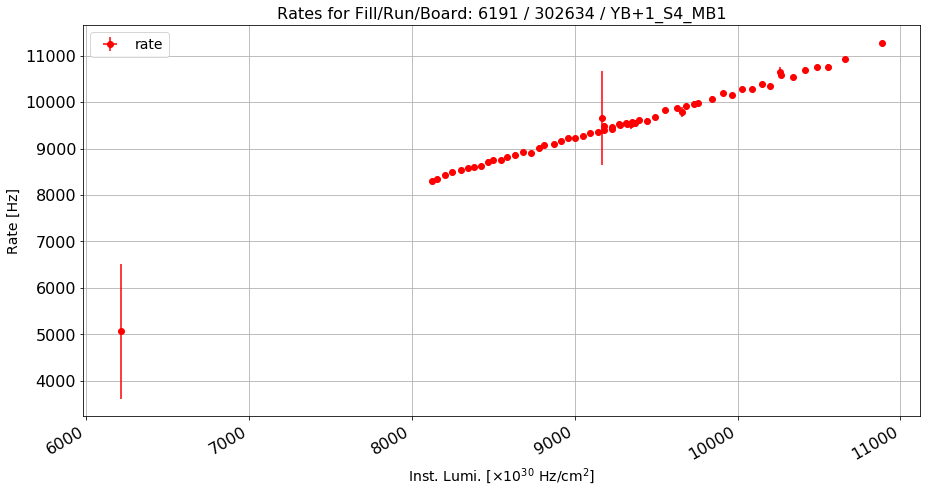

In [56]:
title = "Rates for Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / 302634 / YB+1_S4_MB1"
plot_rate_vs_ls(df_rates_new[(df_rates_new["system"] == 2) & (df_rates_new["station"] == 1)], [302634],\
                "lumi", "rate", "YB+1_S4", 0, "err", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, "ro", False)

In [57]:
def plot_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    fig.autofmt_xdate()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        plt.errorbar(df_temp[rule][x_val], df_temp[rule][y_val], xerr=x_err, yerr=df_temp[rule][y_err],\
                     fmt=opt, ecolor='r')
        plt.errorbar(df_temp[rule][x_val], df_temp[rule]["lumi"], xerr=x_err, yerr=df_temp[rule]["errLumi"],\
                     fmt='bo', ecolor='b')
    plt.legend(loc="best")
    plt.title(title)
    plt.show()

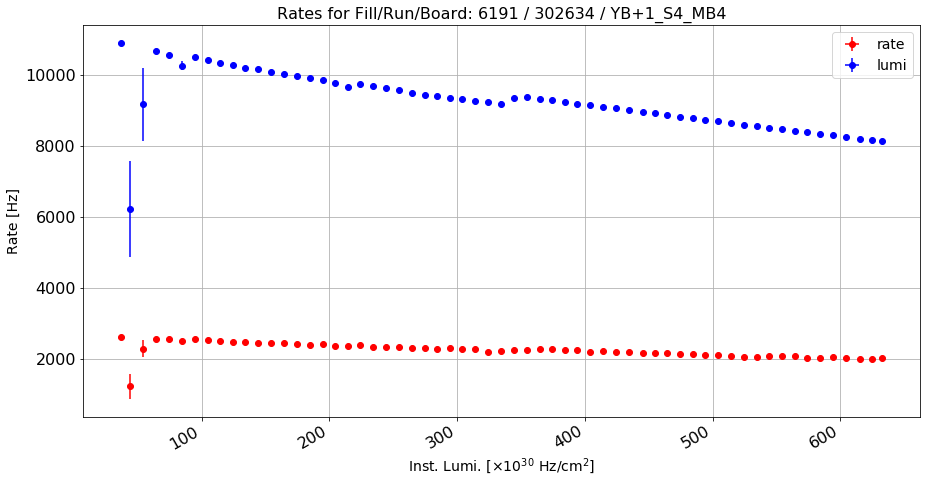

In [58]:
title = "Rates for Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / 302634 / YB+1_S4_MB4"
plot_vs_ls(df_rates_new[(df_rates_new["system"] == 2) & (df_rates_new["station"] == 4)], [302634],\
                "ls", "rate", "YB+1_S4", 0, "err", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, "ro", False)

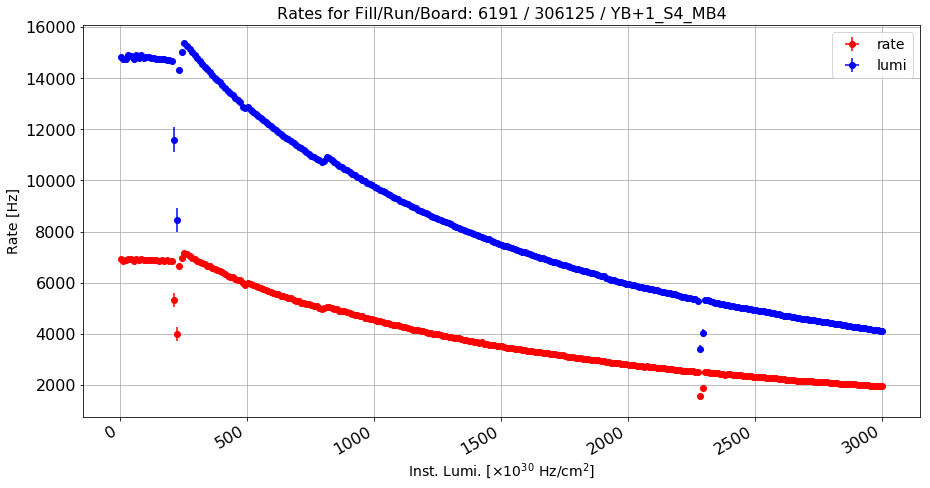

In [59]:
title = "Rates for Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / 306125 / YB+1_S4_MB4"
plot_vs_ls(df_rates_new[(df_rates_new["system"] == 2) & (df_rates_new["station"] == 4)], [306125],\
                "ls", "rate", "YB+1_S4", 0, "err", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, "ro", False)

In [60]:
df_rates_new["CS"] = -1
df_rates_new["errCS"] = -1

df_rates_new["CS"] = df_rates_new["lumi"]/df_rates_new["rate"]
print "Number of NaN's in CS before:"
print len(df_rates_new["CS"][df_rates_new["CS"].isnull() == True])
print "Number of Inf's in CS before:"
print len(df_rates_new["CS"][np.isinf(df_rates_new["CS"])])

df_rates_new["CS"] = df_rates_new["CS"].replace([np.inf, -np.inf], np.nan)
df_rates_new["CS"] = df_rates_new["CS"].fillna(-1)

print "Number of NaN's in CS after:"
print len(df_rates_new["CS"][df_rates_new["CS"].isnull() == True])
print "Number of Inf's in CS after:"
print len(df_rates_new["CS"][np.isinf(df_rates_new["CS"])])

df_rates_new["errCS"] = (1/df_rates_new["rate"])*np.sqrt(df_rates_new["errLumi"]*df_rates_new["errLumi"] +\
                        df_rates_new["CS"]*df_rates_new["CS"]*df_rates_new["err"]*df_rates_new["err"])

print "Number of NaN's in errCS before:"
print len(df_rates_new["errCS"][df_rates_new["errCS"].isnull() == True])
print "Number of Inf's in errCS before:"
print len(df_rates_new["errCS"][np.isinf(df_rates_new["errCS"])])

df_rates_new["errCS"] = df_rates_new["errCS"].replace([np.inf, -np.inf], np.nan)
df_rates_new["errCS"] = df_rates_new["errCS"].fillna(-1)

print "Number of NaN's in errCS after:"
print len(df_rates_new["errCS"][df_rates_new["errCS"].isnull() == True])
print "Number of Inf's in errCS after:"
print len(df_rates_new["errCS"][np.isinf(df_rates_new["errCS"])])

Number of NaN's in CS before:
0
Number of Inf's in CS before:
4314
Number of NaN's in CS after:
0
Number of Inf's in CS after:
0
Number of NaN's in errCS before:
0
Number of Inf's in errCS before:
4314
Number of NaN's in errCS after:
0
Number of Inf's in errCS after:
0


In [61]:
array = df_rates_new.as_matrix(columns=['system', 'wheel', 'sector', 'station',\
                                        'lumi', 'errLumi', 'rate', 'err',\
                                        'CS', 'errCS'])

/Users/cesarecalabria/Library/Python/2.7/lib/python/site-packages/ipykernel_launcher.py:1: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """Entry point for launching an IPython kernel.


In [62]:
print len(array)
print len(df_rates_new)

265680
265680


In [63]:
df_rates_new["content"] = np.empty((len(df_rates_new), 0)).tolist()

In [64]:
for index, rows in df_rates_new.iterrows():
    #print index, array[index]
    df_rates_new.at[index, "content"] = array[index]
df_rates_new["score"] = -1

In [65]:
#print df_rates_new[(df_rates_new["station"] == 5) & ((df_rates_new["sector"] != 4) &\
 #                                                    (df_rates_new["sector"] != 10))]["content"]

rule = ((df_rates_new["station"] == 5) & ((df_rates_new["sector"] != 4) & (df_rates_new["sector"] != 10)))
df_rates_new = df_rates_new[rule == False]

In [66]:
df_rates_new["ratio"] = 0
for i in [-2, -1, 0, +1, +2]:
    for j in range(1, 13):
        range_ = range(1, 5)
        if ((j == 4) | (j == 10)):
            range_ = range(1, 6)
        for k in range_:
            rule = (df_rates_new.wheel == i) & (df_rates_new.sector == j) & (df_rates_new.station == k)
            rule_r = (ratio.wheel == i) & (ratio.sector == j) & (ratio.station == k)
            idx = df_rates_new[rule].index
            value = ratio[rule_r]["ratio"].item()
            #print idx, value
            for w in idx:
                df_rates_new.loc[w, "ratio"] = value

# Model inference section <a class="anchor" id="fourth-bullet"></a>

Creating train and test samples:

In [235]:
df_rates_new = df_rates_new[df_rates_new["system"] == 2]

In [236]:
normalies = df_rates_new.copy()
anomalies = df_rates_new.copy()
print len(normalies), len(anomalies)

123000 123000


In [237]:
def deduceLS(data):
    if (bunch == 10):
        return data*10+5
anomalies["averageLS"] = anomalies["group"].apply(deduceLS)
#print anomalies.columns

In [238]:
rule = (normalies["wheel"] == -1) & (normalies["sector"] == 3) & (normalies["station"] == 3) 
print "Normal chimney:"
print normalies[rule]["content"].iloc[100]

rule = (normalies["wheel"] == 1) & (normalies["sector"] == 4) & (normalies["station"] == 3)
print "Anomalous chimney:"
print normalies[rule]["content"].iloc[100]

Normal chimney:
[2 -1 3 3 7121.628625 3.2604384123343406 1258.0 18.4951731154761
 5.661072038950715 0.08326968214722012]
Anomalous chimney:
[2 1 4 3 7121.628625 3.2604384123343406 958.75 10.279574060103016
 7.428035071707954 0.07971485282851005]


In [239]:
def assignScore(df, score):
    temp = df.copy()
    rule = (temp["wheel"] == 1) & (temp["sector"] == 4) & (temp["station"] == 3)
    indexes = temp[rule].index
    #print indexes
    for i in indexes:
        temp.loc[i, "score"] = score
    return temp

temp = assignScore(anomalies, 1)
anomalies = temp

During runs 302634 (all LS') and 302635 (LS <= 404) one layer per station did not reach the correct HV, except for: MB1, MB4 in sectors 3, 4, 5 in wheels 2, -2, 0: 

In [262]:
def assignScore2(df, score, run, ls_in, ls_end, ls_string):
    temp = df.copy()
    rule = (temp["run"] == run)
    if ((ls_in != -1) & (ls_end != -1)):
        rule = rule & (temp[ls_string] >= ls_in) & (temp[ls_string] <= ls_end)
    elif (ls_in != -1):
        rule = rule & (temp[ls_string] >= ls_in)
    elif (ls_end != -1):
        rule = rule & (temp[ls_string] <= ls_end)
    indexes = temp[rule].index
    for w in indexes:
        temp.loc[w, "score"] = score

    #Correct score for the chambers with normal HV
    for i in [-2, 0, 2]: #wheels that are ok
        for j in [3, 4, 5]: #sectors that are ok
            if (i == 0):
                range_ = [1]
            elif (abs(i) == 2):
                range_ = [1, 4, 5]
            else:
                range_ = [1, 4]
            for k in range_: #stations that are ok
                rule = (temp["run"] == run) & (temp["wheel"] == i) \
                        & (temp["sector"] == j) & (temp["station"] == k)
                indexes = temp[rule].index
                for w in indexes:
                    temp.loc[w, "score"] = -1
    return temp

In [263]:
rule = ((anomalies["wheel"] == 2) & (anomalies["sector"] == 3) & (anomalies["station"] == 1))
print anomalies[rule]["score"].iloc[1]
temp = assignScore2(anomalies, 1, 302634, -1, -1, "group")
anomalies = temp
#temp = assignScore2(temp, 1, 302635, 1, 404, "group")
anomalies = temp
print anomalies[rule]["score"].iloc[1]

-1
-1


In [266]:
rule = ((anomalies["wheel"] == 1) & (anomalies["sector"] == 3) & (anomalies["station"] == 1))
print anomalies[rule]["score"].iloc[1]
print anomalies[rule]["score"].iloc[1]

1
1


In [269]:
rule = ((anomalies["wheel"] == 2) & (anomalies["sector"] == 4) & (anomalies["station"] == 5))
print anomalies[rule]["score"].iloc[1]
print anomalies[rule]["score"].iloc[1]
rule = ((anomalies["wheel"] == -2) & (anomalies["sector"] == 4) & (anomalies["station"] == 5))
print anomalies[rule]["score"].iloc[1]
print anomalies[rule]["score"].iloc[1]

-1
-1
-1
-1


def change(data, red = 1):
    #print data
    temp = data.copy()
    temp[6] = temp[6]/red #Reduce rate by "red"
    temp[7] = temp[7]/red
    temp[8] = temp[8]*red #Increase CS by "red"
    temp[9] = temp[9]*red
    #print temp
    return temp

print anomalies["content"].iloc[0], anomalies.score.iloc[0]
anomalies["content_2"] = anomalies["content"].copy()
#print anomalies["content_2"]

for i in anomalies[anomalies.score == 1].index:
    a = anomalies["content"].loc[i]
    #print a, type(a), a.shape
    temp = change(anomalies["content"].loc[i], 0.05)
    #print i, temp, type(temp), temp.shape
    anomalies.at[i, "content_2"] = temp
print anomalies["content_2"].iloc[0]

In [290]:
def change(data, red = 1):
    #print data
    temp = data.copy()
    temp[4] = temp[4]*red #Increase lumi by "red"
    temp[5] = temp[5]*red
    temp[8] = temp[8]*red #Increase CS by "red"
    temp[9] = temp[9]*red
    #print temp
    return temp

print anomalies["content"].iloc[0]
anomalies["content_2"] = anomalies["content"].copy()
anomalies["content_2"] = anomalies["content"].apply(change)
print anomalies["content_2"].iloc[0]

[2 1 1 1 10886.7395 12.832500000000437 12394.0 135.0 0.8783878893012748
 0.00962358274025303]
[2 1 1 1 10886.7395 12.832500000000437 12394.0 135.0 0.8783878893012748
 0.00962358274025303]


In [291]:
#Scale the data
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import minmax_scale
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing.data import QuantileTransformer
def scale_data(data, scaler_type = 2):
    types = ["RobustScaler", "MaxAbsScaler", "QuantileTransformerUniform",\
             "QuantileTransformerNormal", "Normalizer", "MinMaxScaler"]
    #print "Scaling data using:", types[scaler_type-1]
    # Need to reshape since scaler works per column
    
    data = data.reshape(-1, 1)
    if (scaler_type == 1):
        scaler = RobustScaler(quantile_range=(25, 75)).fit(data)
    if (scaler_type == 2):
        scaler = MaxAbsScaler().fit(data)
    if (scaler_type == 3):
        scaler = QuantileTransformer(output_distribution='uniform').fit(data)
    if (scaler_type == 4):
        scaler = QuantileTransformer(output_distribution='normal').fit(data)
    if (scaler_type == 5):
        scaler = Normalizer().fit(data)
    if (scaler_type == 6):
        scaler = MinMaxScaler().fit(data)
    return scaler.transform(data).reshape(1, -1)

In [292]:
anomalies["content"] = anomalies["content"].apply(np.array)
anomalies["content_2"] = anomalies["content_2"].apply(np.array)
anomalies["content_scaled"] = anomalies["content"].apply(scale_data)
#anomalies["content_scaled"] = anomalies["content_2"].apply(scale_data)

Preparing samples and envirement for making some inference:

In [77]:
sess = tf.Session()
sess.run(tf.global_variables_initializer())
K.set_session(sess)

Testing on the high rate issue:

In [293]:
#layers_test = anomalies.copy()
layers_test = (anomalies[(anomalies.run == 302634) | (anomalies.run == 306125)]).copy()
print "Tot:", len(layers_test)
print "Normalies:", len(layers_test[layers_test.score == -1])
print "Anomalies", len(layers_test[layers_test.score == 1])

Tot: 90500
Normalies: 75986
Anomalies 14514


In [294]:
def score_to_array(score):
    if score == -1:
        return np.asarray([1, 0]) #Normaly
    return np.asarray([0, 1]) #Anomaly

def nn_generate_input():  
    return np.array(np.concatenate(layers_test.content_scaled.values)).reshape(-1, 10)

test_x = nn_generate_input()

Making an inference using the model and the test sample:

In [80]:
ann_model_1 = load_model("./model_keras/ann_1.h5")
ann_model_2 = load_model("./model_keras/ann_2.h5")
ann_model_3 = load_model("./model_keras/ann_3.h5")
ann_model_4 = load_model("./model_keras/ann_4.h5")

In [81]:
layers_test["ann_score_1"] = ann_model_1.predict(np.array(test_x))[:, 1]
layers_test["ann_score_2"] = ann_model_2.predict(np.array(test_x))[:, 1]
layers_test["ann_score_3"] = ann_model_3.predict(np.array(test_x))[:, 1]
layers_test["ann_score_4"] = ann_model_4.predict(np.array(test_x))[:, 1]

In [101]:
cae_model = load_model("./model_keras/cae_2D.h5")
layers_test["cae_score"] = np.sum(abs(test_x - cae_model.predict(np.array(test_x))), axis=1)

In [102]:
def benchmark(y_true, y_score, treshold):
    y_pred = 2*(y_score > treshold)-1
    y_true = 2*(y_true > treshold)-1
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    sensitivity = round(float(tp)/(tp+fn), 4)
    specificity = round(float(tn)/(tn+fp), 4)

    print("Model accuracy: %s" % round(accuracy_score(y_true, y_pred), 4))
    print("Model sensitivity: %s" % sensitivity)
    print("Model specificity: %s" % specificity)

    return specificity, sensitivity
    
print "DNN:"
specificity_ann, sensitivity_ann = benchmark(layers_test["score"], layers_test["ann_score_4"], 0.5)
print "AE:"
specificity_cae, sensitivity_cae = benchmark(layers_test["score"], layers_test["cae_score"], 0.055)

DNN:
Model accuracy: 0.8729
Model sensitivity: 0.2143
Model specificity: 1.0
AE:
Model accuracy: 0.844
Model sensitivity: 0.3376
Model specificity: 0.9417


In [103]:
def get_roc_curve(test_df, models, working_point=None):
    """Generates ROC Curves for a given array"""
    fig, ax = plt.subplots()
    ax.grid()

    for legend_label, model_score in models:
        false_positive_rate, true_positive_rate, _ = roc_curve(test_df["score"],
                                                               test_df[model_score])
        #plt.xlim(0, 0.2)
        plt.plot(false_positive_rate, true_positive_rate, linewidth=2,
                 label=('%s, AUC: %s' % (legend_label,
                                         round(auc(false_positive_rate, true_positive_rate), 4))))
    if working_point:
        plt.plot(1-working_point[0],
                 working_point[1],
                 'o',
                 label="DNN working point")
    plt.title("ROC")
    plt.legend(loc='best')
    plt.ylabel('True positive rate')
    plt.xlabel('False positive rate')
    plt.show();

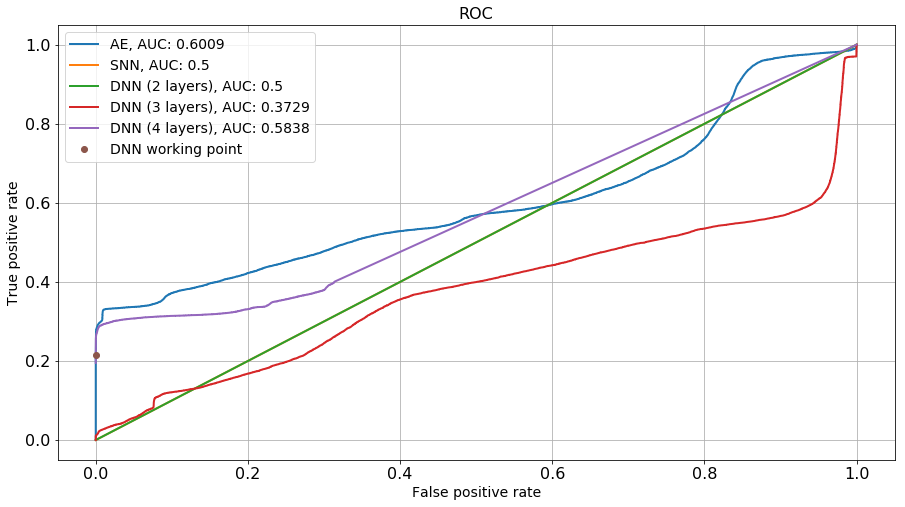

In [104]:
get_roc_curve(layers_test, 
              [
               ("AE", "cae_score"),
               ("SNN", "ann_score_1"),
               ("DNN (2 layers)", "ann_score_2"),
               ("DNN (3 layers)", "ann_score_3"),
               ("DNN (4 layers)", "ann_score_4"),
               ], (specificity_ann, sensitivity_ann))

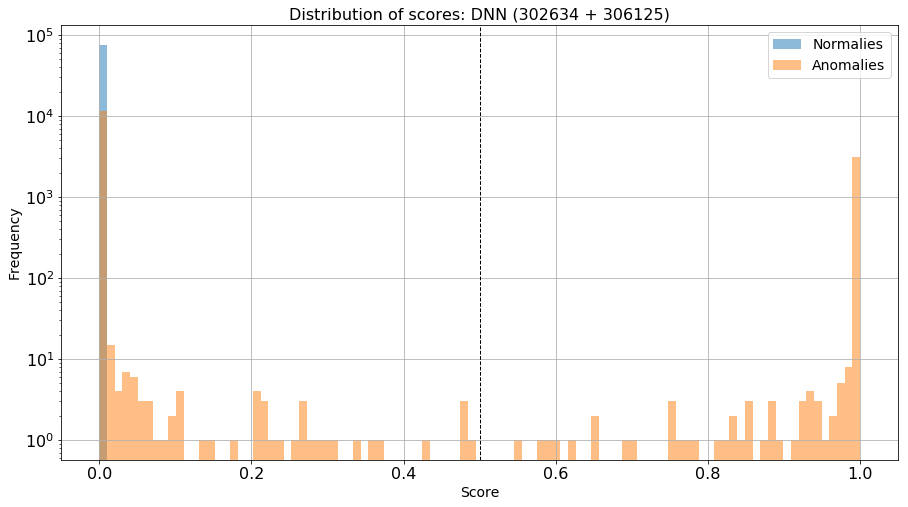

In [105]:
# Distribution of scores:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, 1, 100)
plt.hist(layers_test[layers_test["score"] < 0]["ann_score_4"], bins=bins, alpha=0.5, label="Normalies")
plt.hist(layers_test[layers_test["score"] > 0]["ann_score_4"], bins=bins, alpha=0.5, label="Anomalies")
plt.title("Distribution of scores: DNN (302634 + 306125)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.5, color='k', linestyle='dashed', linewidth=1)
plt.show()

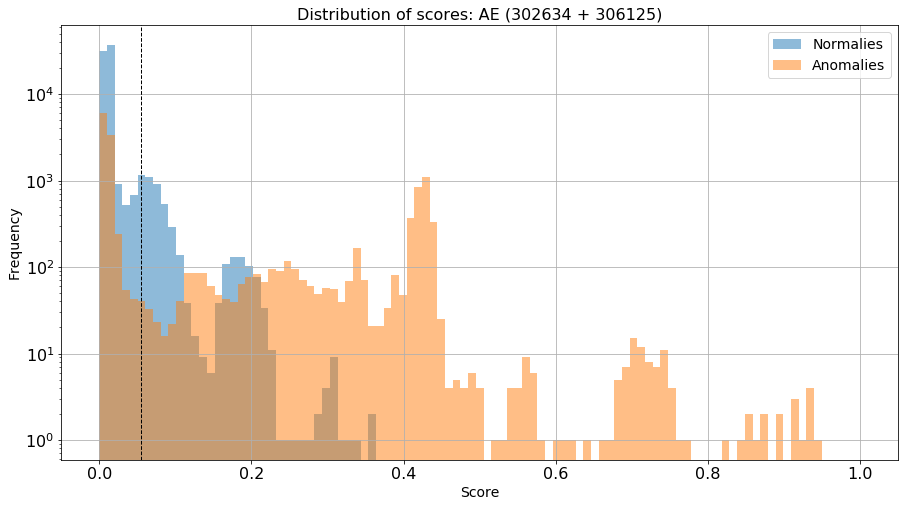

In [106]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
#ax.set_xscale('log')
bins = np.linspace(0, 1, 100)
plt.hist(layers_test[layers_test["score"] < 0]["cae_score"], bins=bins, alpha=0.5, label="Normalies")
plt.hist(layers_test[layers_test["score"] > 0]["cae_score"], bins=bins, alpha=0.5, label="Anomalies")
#for i in [-1, +1]:
#    plt.hist(layers_test[(layers_test["score"] < 0) & (layers_test["wheel"] == int(i))]\
#             ["cae_score"], bins=bins, alpha=0.5, label="Normalies_Wheel_"+str(i))
plt.title("Distribution of scores: AE (302634 + 306125)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.055, color='k', linestyle='dashed', linewidth=1)
plt.show()

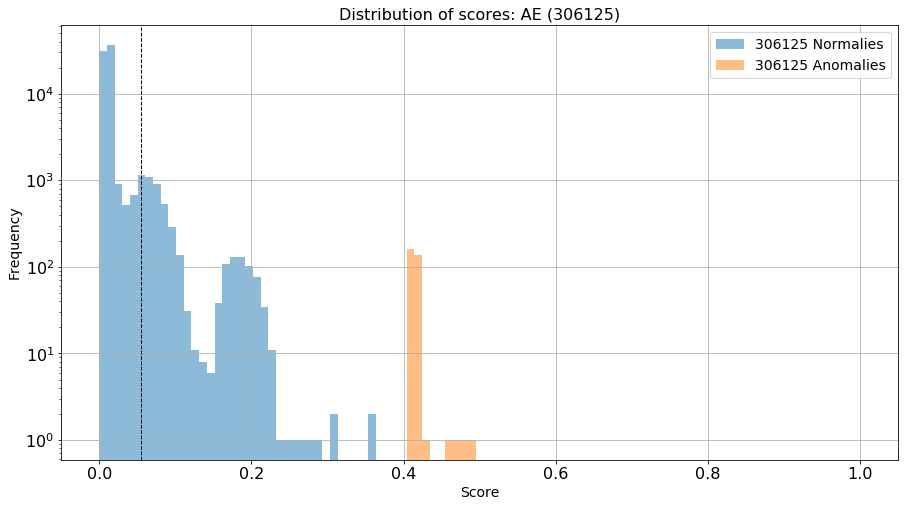

In [108]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
#ax.set_xscale('log')
bins = np.linspace(0, 1.0, 100)
plt.hist(layers_test[(layers_test["run"] == 306125) & (layers_test["score"] < 0)]["cae_score"],\
         bins=bins, alpha=0.5, label="306125 Normalies")
plt.hist(layers_test[(layers_test["run"] == 306125) & (layers_test["score"] > 0)]["cae_score"],\
         bins=bins, alpha=0.5, label="306125 Anomalies")
plt.title("Distribution of scores: AE (306125)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.055, color='k', linestyle='dashed', linewidth=1)
plt.show()

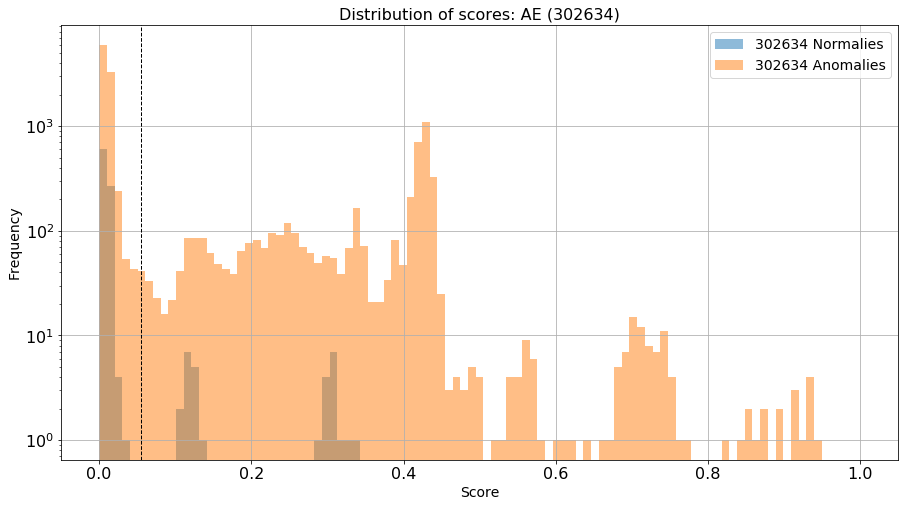

In [109]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
#ax.set_xscale('log')
bins = np.linspace(0, 1.0, 100)
plt.hist(layers_test[(layers_test["run"] == 302634) & (layers_test["score"] < 0)]["cae_score"],\
         bins=bins, alpha=0.5, label="302634 Normalies")
plt.hist(layers_test[(layers_test["run"] == 302634) & (layers_test["score"] > 0)]["cae_score"],\
         bins=bins, alpha=0.5, label="302634 Anomalies")
#for i in [-1, +1]:
#    plt.hist(layers_test[(layers_test["score"] < 0) & (layers_test["wheel"] == int(i))]\
#             ["cae_score"], bins=bins, alpha=0.5, label="Normalies_Wheel_"+str(i))
plt.title("Distribution of scores: AE (302634)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.055, color='k', linestyle='dashed', linewidth=1)
plt.show()

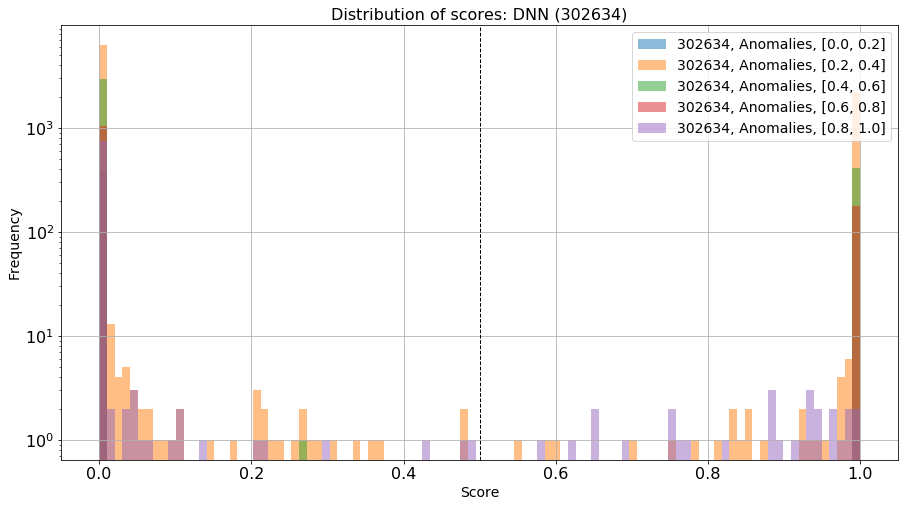

In [90]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
#ax.set_xscale('log')
bins = np.linspace(0, 1.0, 100)
rule = (layers_test["run"] == 302634) & (layers_test["score"] > 0)
range_r = (np.array(range(0, 10, 2))/10.0)
for h in range_r:
    #print h
    rule_r = (layers_test.ratio > h) & (layers_test.ratio < (h+0.2))
    plt.hist(layers_test[rule & rule_r ]["ann_score_4"],\
         bins=bins, alpha=0.5, label="302634, Anomalies, ["+str(h)+", "+str(h+0.2)+"]")
plt.title("Distribution of scores: DNN (302634)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.5, color='k', linestyle='dashed', linewidth=1)
plt.show()

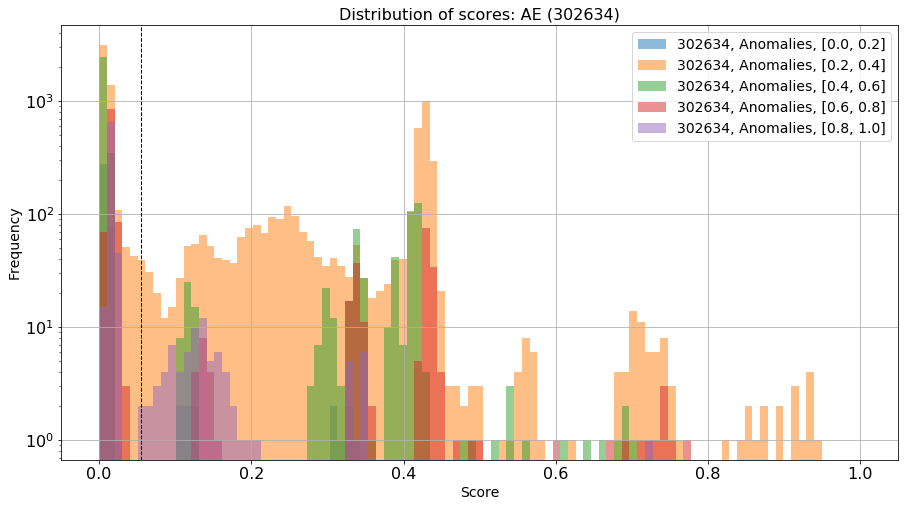

In [111]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
#ax.set_xscale('log')
bins = np.linspace(0, 1.0, 100)
rule = (layers_test["run"] == 302634) & (layers_test["score"] > 0)
range_r = (np.array(range(0, 10, 2))/10.0)
for h in range_r:
    #print h
    rule_r = (layers_test.ratio > h) & (layers_test.ratio < (h+0.2))
    plt.hist(layers_test[rule & rule_r]["cae_score"],\
         bins=bins, alpha=0.5, label="302634, Anomalies, ["+str(h)+", "+str(h+0.2)+"]")
plt.title("Distribution of scores: AE (302634)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.055, color='k', linestyle='dashed', linewidth=1)
plt.show()

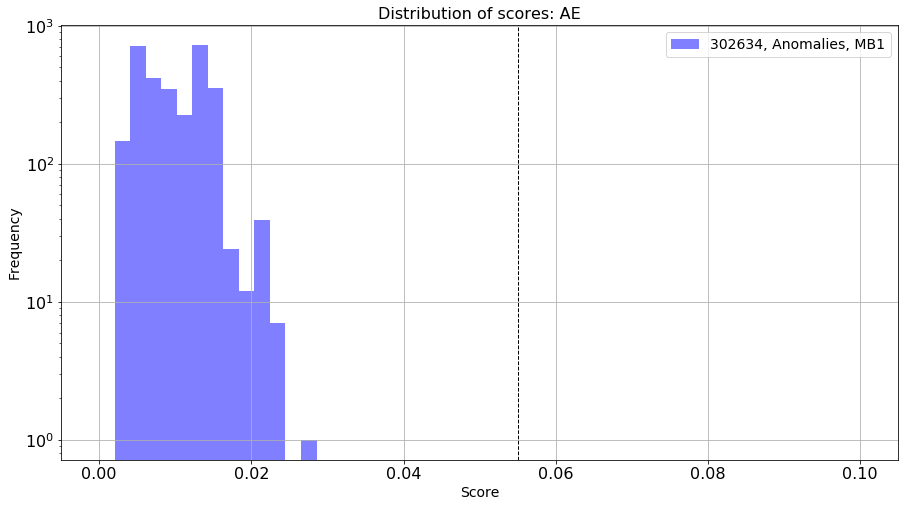

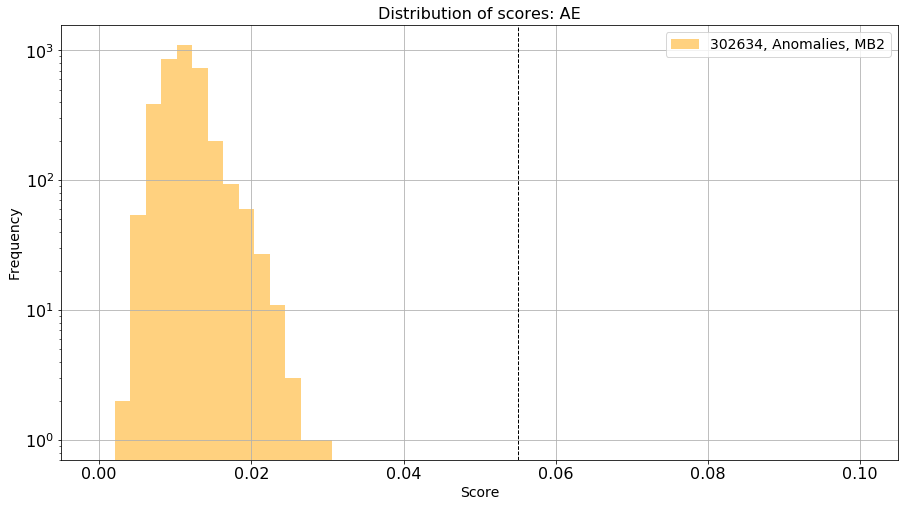

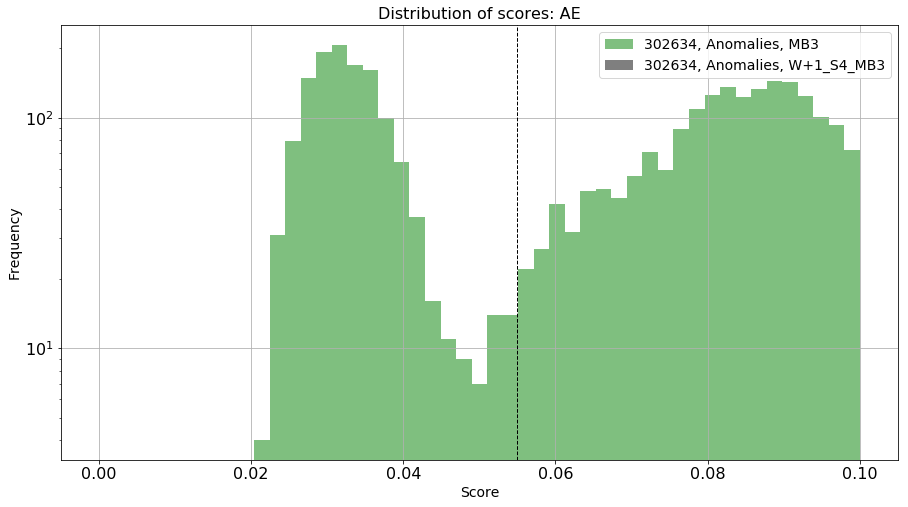

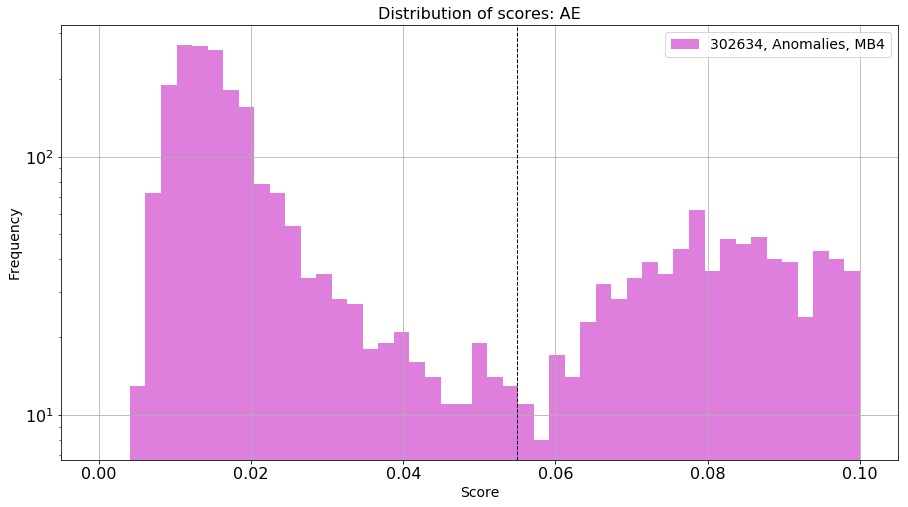

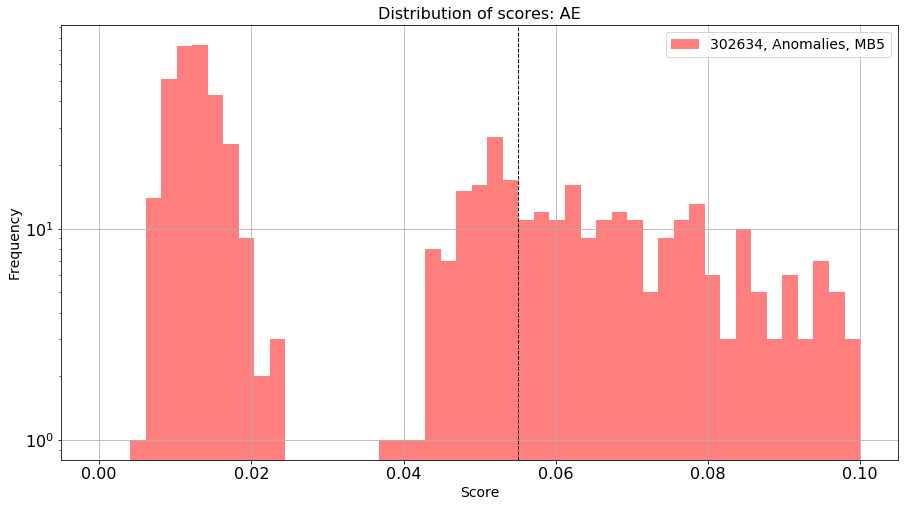

In [92]:
bins = np.linspace(0, 0.1, 50)
rule = (layers_test["run"] == 302634) & (layers_test["score"] > 0)
colors = ["b", "orange", "g", "m", "r"]
for h in range(1, 6):
    fig, ax = plt.subplots()
    ax.set_yscale('log')
    ax.grid()
    #ax.set_xscale('log')
    #print h
    rule_r = (layers_test.station == h)
    plt.hist(layers_test[rule & rule_r]["cae_score"],\
         bins=bins, alpha=0.5, label="302634, Anomalies, MB"+str(h),\
             color=colors[h-1],\
             histtype = "bar")
    if (h ==3):
        rule_k = (layers_test.sector == 4) & (layers_test.wheel == +1)
        plt.hist(layers_test[rule & rule_r & rule_k]["cae_score"],\
             bins=bins, alpha=0.5, label="302634, Anomalies, W+1_S4_MB"+str(h),\
                 color="k",\
                 histtype = "bar")
    plt.title("Distribution of scores: AE")
    plt.legend(loc='best')
    plt.ylabel('Frequency')
    plt.xlabel('Score')
    plt.axvline(0.055, color='k', linestyle='dashed', linewidth=1)
    plt.show()

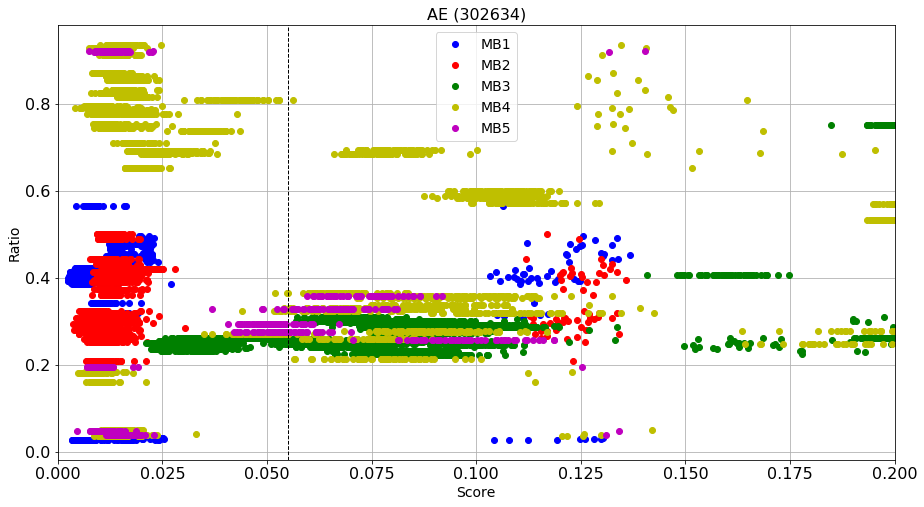

In [93]:
fig, ax = plt.subplots()
#ax.set_yscale('log')
plt.xlabel("Score")
plt.ylabel("Ratio")
plt.xlim(0, 0.2)
ax.grid()
rule = (layers_test.run == 302634) #& (layers_test.board == "YB+1_S3")
style = ["bo", "ro", "go", "yo", "mo"]
names = ["MB1", "MB2", "MB3", "MB4", "MB5"]
for i in range(1, 6):
    rule_st = (layers_test.station == i)
    plt.plot(layers_test[rule & rule_st]["cae_score"], layers_test[rule & rule_st]["ratio"],\
             style[i-1], label=names[i-1])
plt.title("AE (302634)")
plt.legend(loc='best')
plt.axvline(0.055, color='k', linestyle='dashed', linewidth=1)
plt.show()

In [99]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Normalized confusion matrix
[[  9.99920911e-01   7.90888959e-05]
 [  1.00000000e+00   0.00000000e+00]]


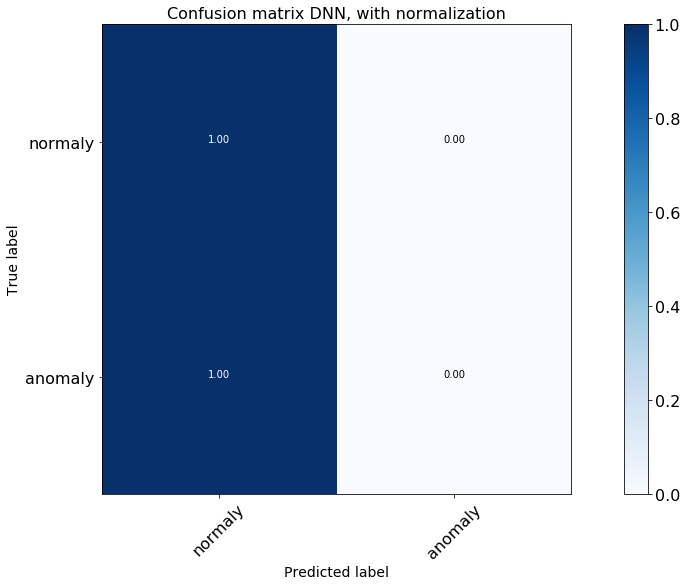

In [166]:
th_DNN = 0.1
y_pred = 2*(layers_test["ann_score_4"] > th_DNN)-1
layers_test["score"] = 2*(layers_test["score"] > th_DNN)-1

cnf_matrix = confusion_matrix(layers_test["score"], y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix DNN, with normalization')

Normalized confusion matrix
[[ 0.99595328  0.00404672]
 [ 0.0802815   0.9197185 ]]


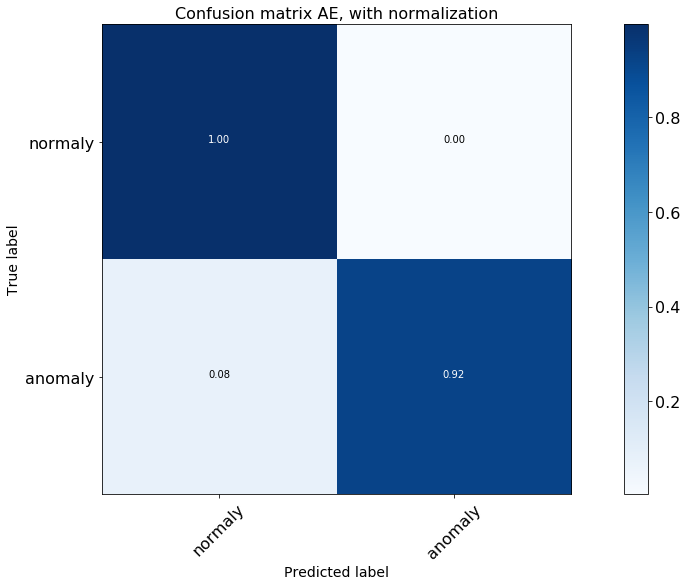

In [167]:
th_AE = 0.055
y_pred = 2*(layers_test["cae_score"] > th_AE)-1
cnf_matrix = confusion_matrix(layers_test["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix AE, with normalization')

In [ ]:
print "Number of FPs for the DNN:", len(layers_test[(layers_test["score"] == -1) &\
                                                    (layers_test["ann_score_4"] > th_DNN)])

In [ ]:
print "Number of FPs for the AE:", len(layers_test[(layers_test["score"] == -1) &\
                                                   (layers_test["cae_score"] > th_AE)])

In [ ]:
layers_test["name"] = ("W" + layers_test["wheel"].astype(str) + "_S" + layers_test["sector"].astype(str) +\
       "_St" + layers_test["station"].astype(str))

Where are the FPs located?

In [ ]:
def count_fp(df, dis_nn, th, filt):
    df_temp = df[(layers_test["score"] == -1) & (layers_test[dis_nn] > th)].copy()
    df_temp = df_temp.groupby(['run', 'wheel', 'sector', 'station', 'name']).size().reset_index(name='counts')
    if filt:
        df_temp = df_temp[df_temp["counts"] > 1]
    #print df_temp
    return len(df_temp), df_temp

num_fp_ann, fp_ann = count_fp(layers_test, "ann_score_4", th_DNN, False)
num_fp_cae, fp_cae = count_fp(layers_test, "cae_score", th_AE, True)

print "Number of chambers with false positives DNN:", num_fp_ann
print "Number of chambers with false positives AE:", num_fp_cae
fp_cae.set_index("name",drop=True,inplace=True)
fp_ann.set_index("name",drop=True,inplace=True)

In [ ]:
fp_ann["counts"].plot(kind='bar', title ="False positives DNN", legend=True, fontsize=12)

In [ ]:
fp_cae["counts"].plot(kind='bar', title ="False positives AE", legend=True, fontsize=12)

In [187]:
def get_matrix(df):
    x = np.zeros((5,12),dtype=int)
    for i in range(len(df)):
        a = int(5-df["station"].iloc[i])
        b = int(df["sector"].iloc[i]-1)
        x[a,b] = x[a,b] + 1
    return x

In [184]:
def plot_scatter(df, run, wheel, ls_min, ls_max):
    run_s = "All"
    wheel_s = "All"
    ls_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    if run != -1:
        temp = temp[(temp["run"] == run)]
        run_s = str(run)
    if ((ls_min != -1) & (ls_max == -1)):
        temp = temp[(temp["averageLS"] >= ls_min)]
        ls_s = "> "+str(ls_min)
    elif ((ls_min == -1) & (ls_max != -1)):
        temp = temp[(temp["averageLS"] <= ls_max)]
        ls_s = "< "+str(ls_max)
    elif ((ls_min != -1) & (ls_max != -1)):
        temp = temp[(temp["averageLS"] >= ls_min) & (temp["averageLS"] <= ls_max)]
        ls_s = " ["+str(ls_min)+", "+str(ls_max)+"]"
    mat = get_matrix(temp)
    #print mat
    #print mat.sum()

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4", "5"])
    ax.set_yticks([4, 3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    
    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    for i in range(0,5):
        for j in range(0,12):
            text = ax.text(j, i, mat[i, j],\
            ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    title = "Run: "+run_s+", Wheel: "+wheel_s+", LS: "+ls_s
    plt.title(title, loc="right")   
    plt.show()

In [185]:
def plot_scatter_2(df, arg, wheel):
    wheel_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    else:
        return 1
    
    mat = []
    for i in [5, 4, 3, 2, 1]:
        rule = (temp.station == i)
        vec = list(temp[rule][arg].values)
        if (i == 5):
            tmp = list(temp[rule][arg].values)
            vec = [0, 0, 0, tmp[0], 0, 0, 0, 0, 0, tmp[1], 0, 0]
        mat.append(vec)
        #print i, temp[rule]["ratio"].values
    #print mat

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4", "5"])
    ax.set_yticks([4, 3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    
    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    for i in range(0,5):
        for j in range(0,12):
            text = ax.text(j, i, round(mat[i][j], 2),\
            ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    title = "Wheel: "+wheel_s
    plt.title(title, loc="right")   
    plt.show()

Decrease in rate per station and sector in each wheel:

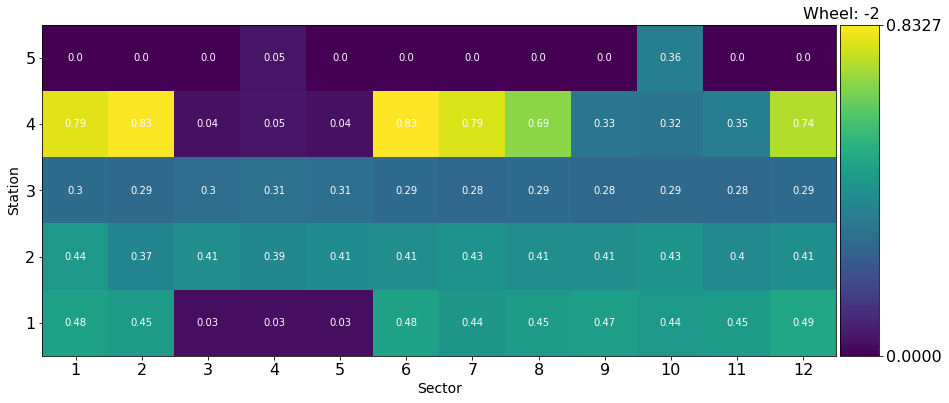

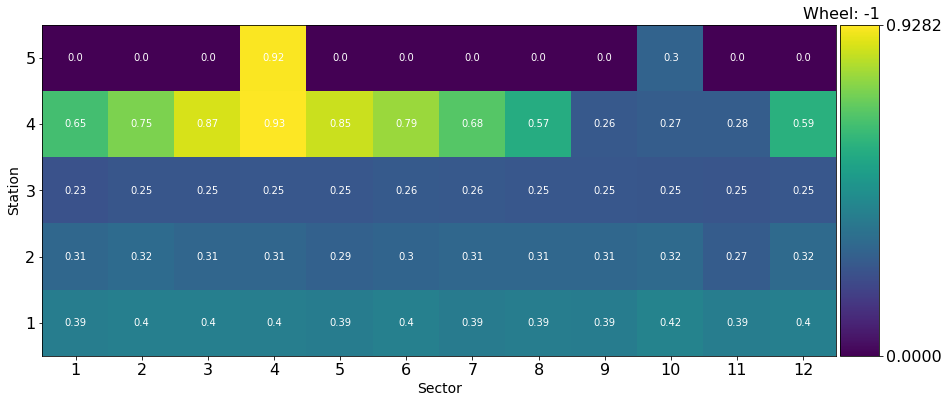

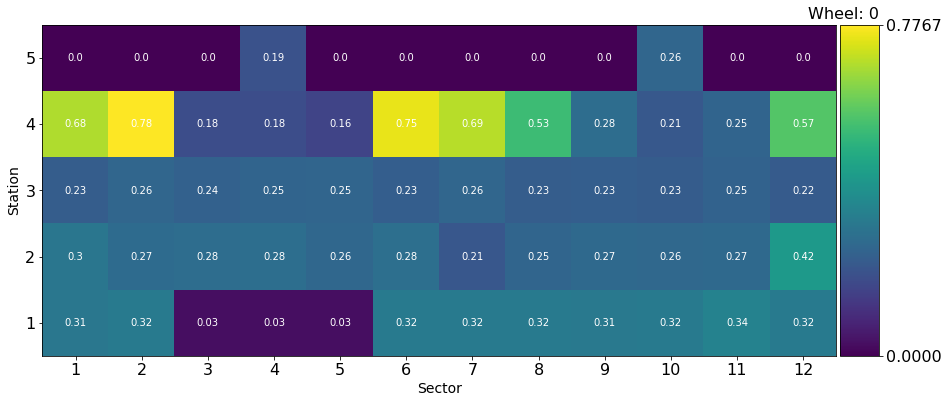

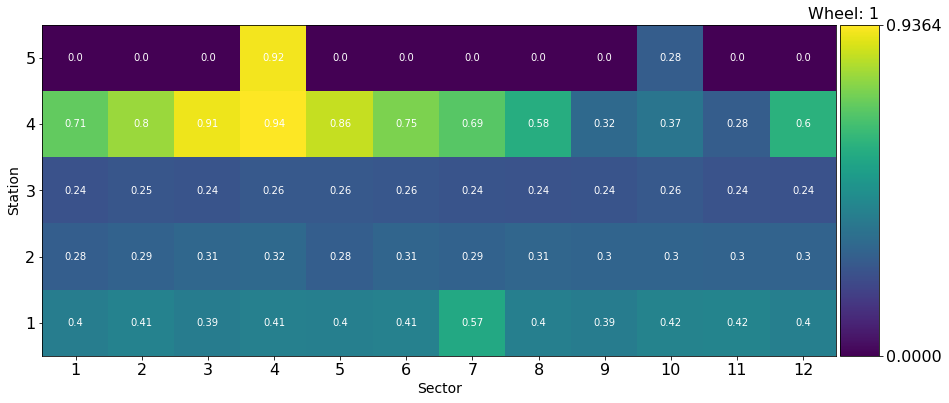

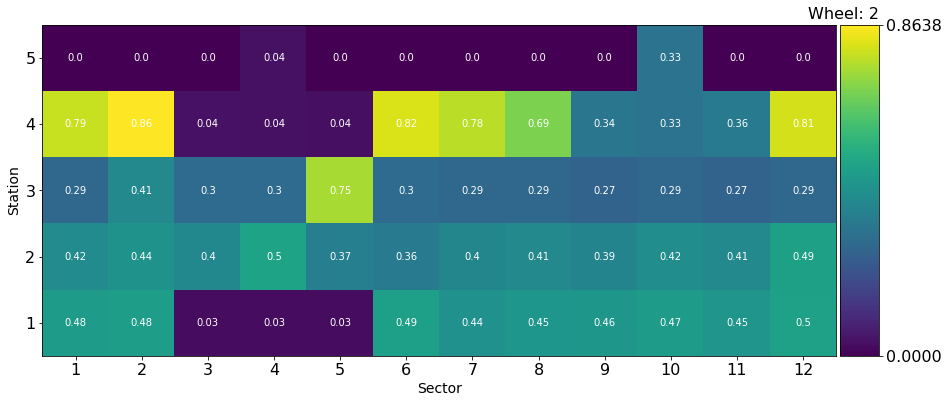

In [219]:
plot_scatter_2(ratio, "ratio", -2)
plot_scatter_2(ratio, "ratio", -1)
plot_scatter_2(ratio, "ratio", 0)
plot_scatter_2(ratio, "ratio", +1)
plot_scatter_2(ratio, "ratio", +2)

Cross-section per station and sector in each wheel for the reference run:

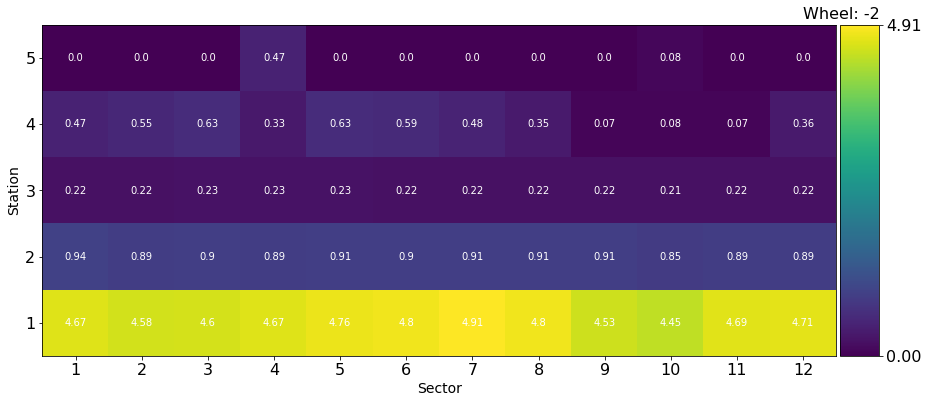

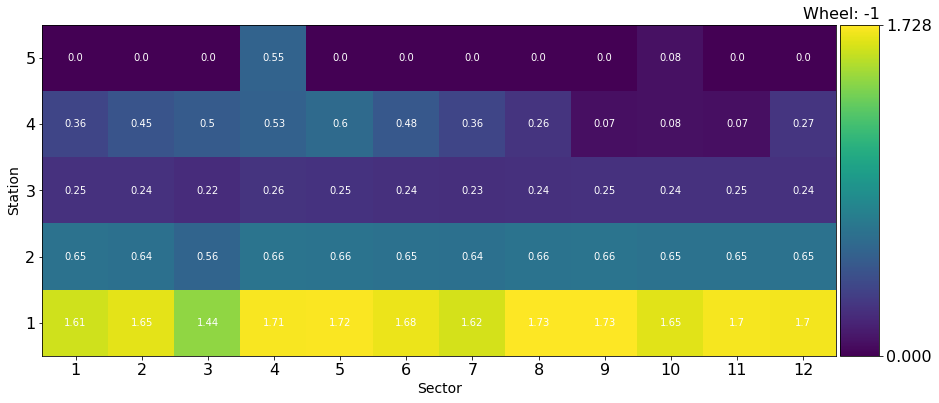

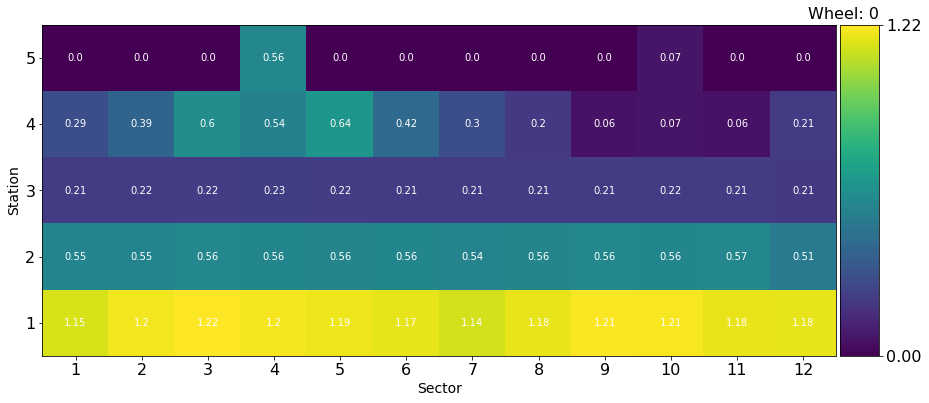

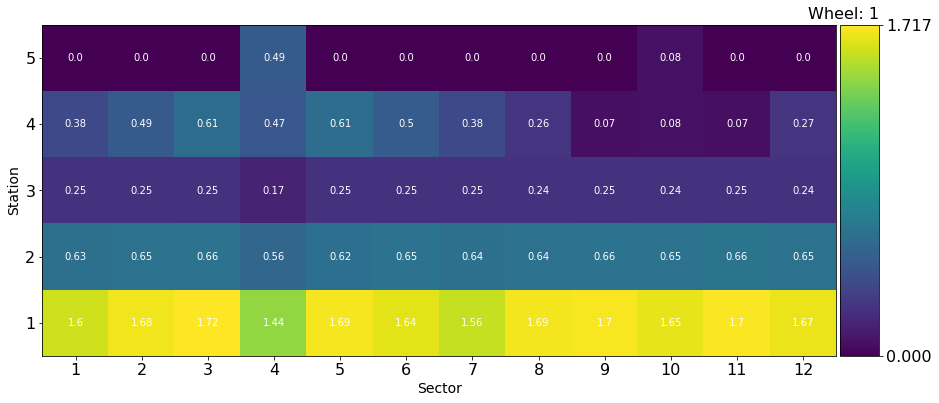

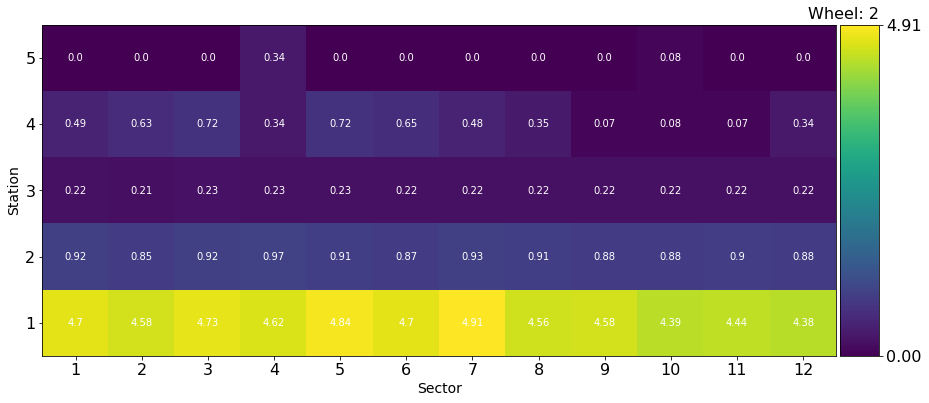

In [225]:
plot_scatter_2(ratio, "cs_norm", -2)
plot_scatter_2(ratio, "cs_norm", -1)
plot_scatter_2(ratio, "cs_norm", 0)
plot_scatter_2(ratio, "cs_norm", +1)
plot_scatter_2(ratio, "cs_norm", +2)

Cross-section per station and sector in each wheel for the anomalous run:

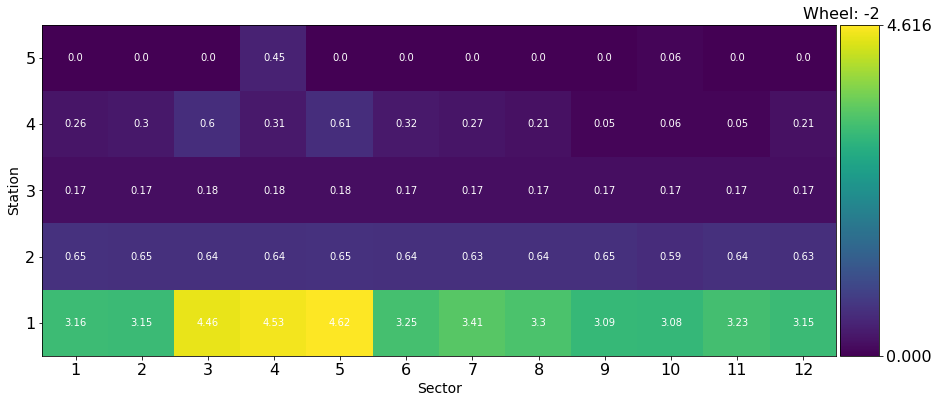

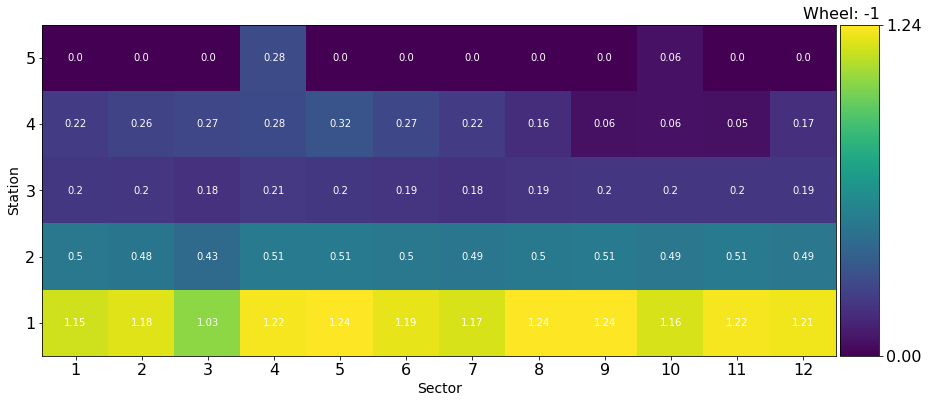

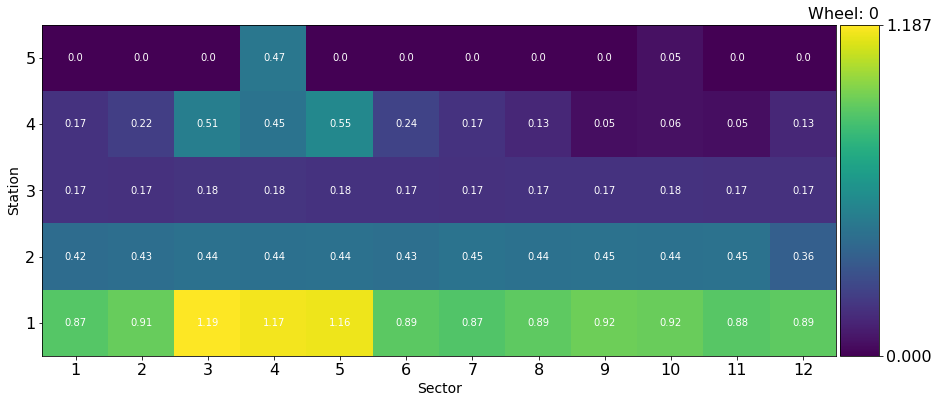

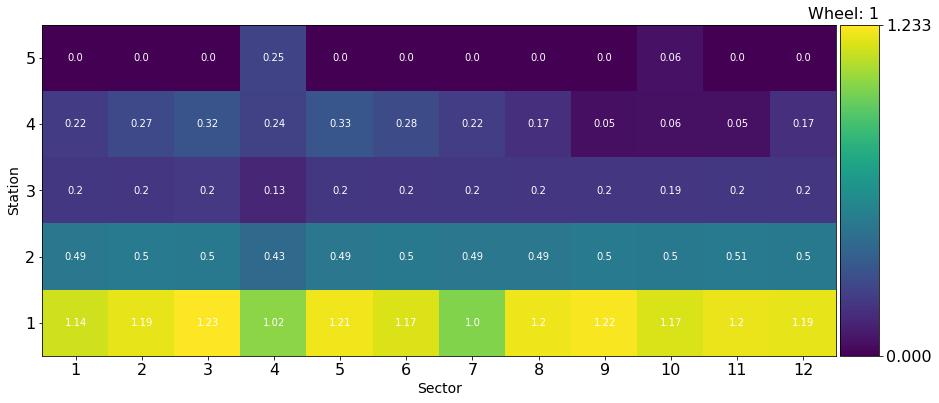

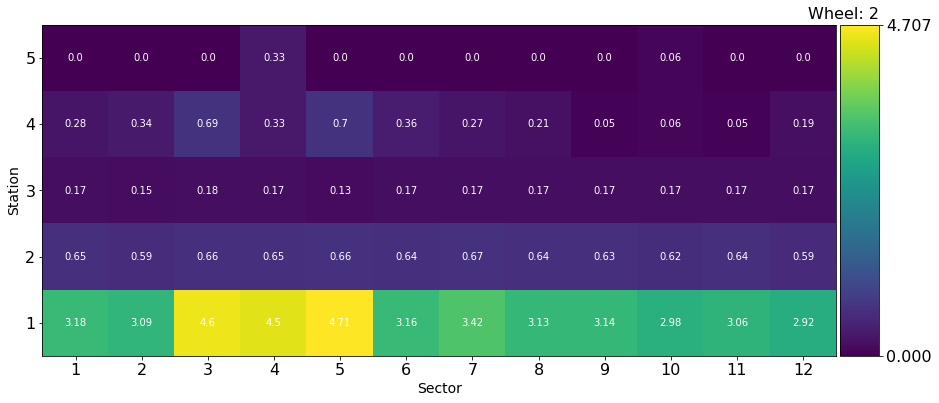

In [228]:
plot_scatter_2(ratio, "cs_anomal", -2)
plot_scatter_2(ratio, "cs_anomal", -1)
plot_scatter_2(ratio, "cs_anomal", 0)
plot_scatter_2(ratio, "cs_anomal", +1)
plot_scatter_2(ratio, "cs_anomal", +2)

Lumi/rate per station and sector in each wheel for the reference run:

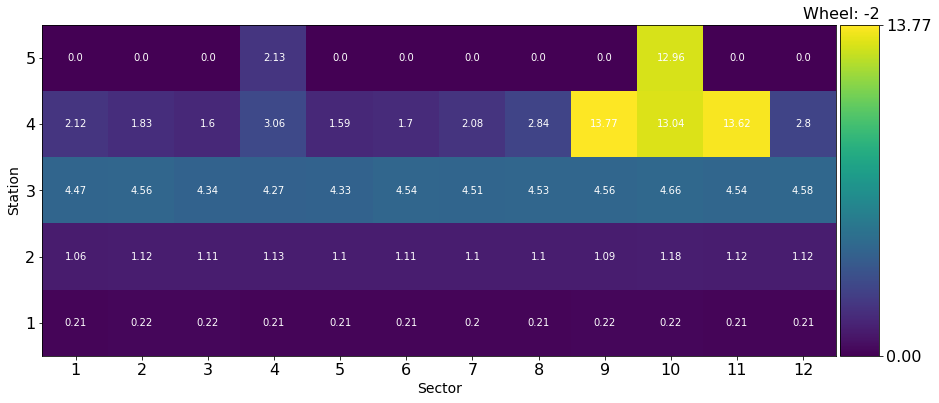

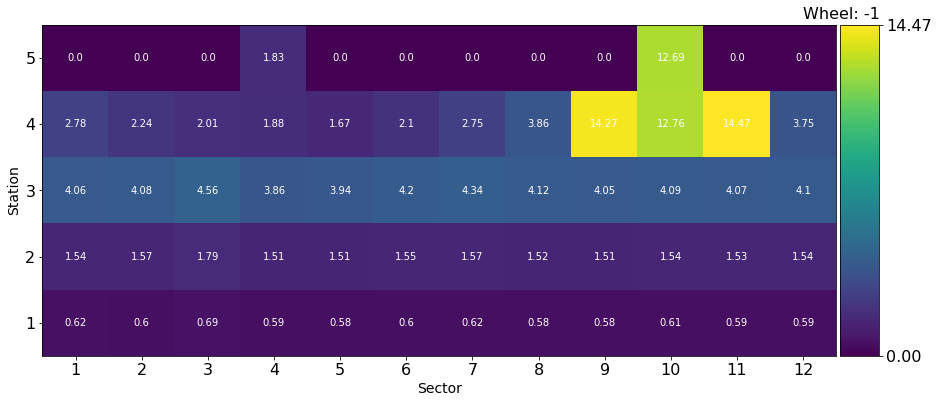

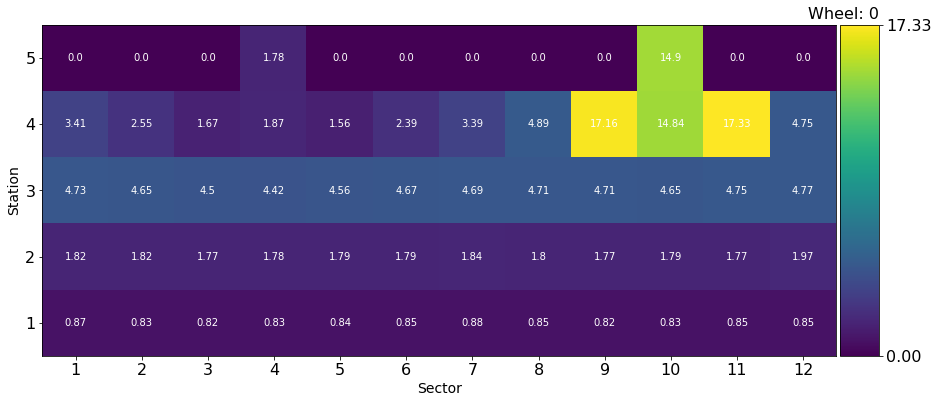

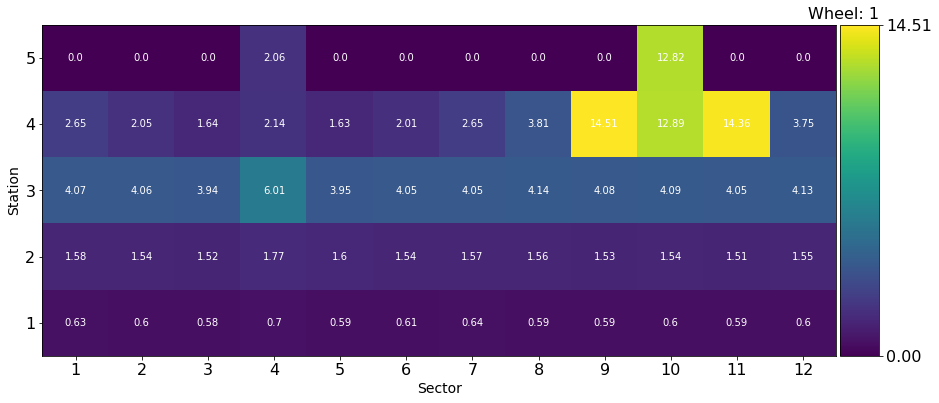

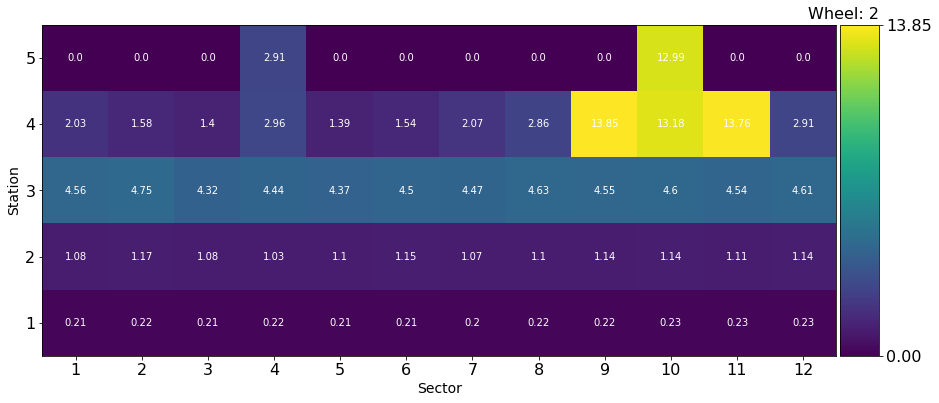

In [227]:
plot_scatter_2(ratio, "ref", -2)
plot_scatter_2(ratio, "ref", -1)
plot_scatter_2(ratio, "ref", 0)
plot_scatter_2(ratio, "ref", +1)
plot_scatter_2(ratio, "ref", +2)

Lumi/rate per station and sector in each wheel for the anomalous run:

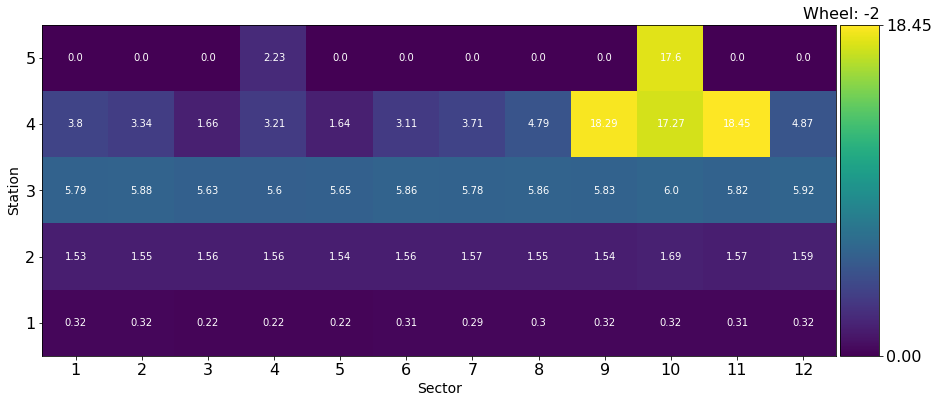

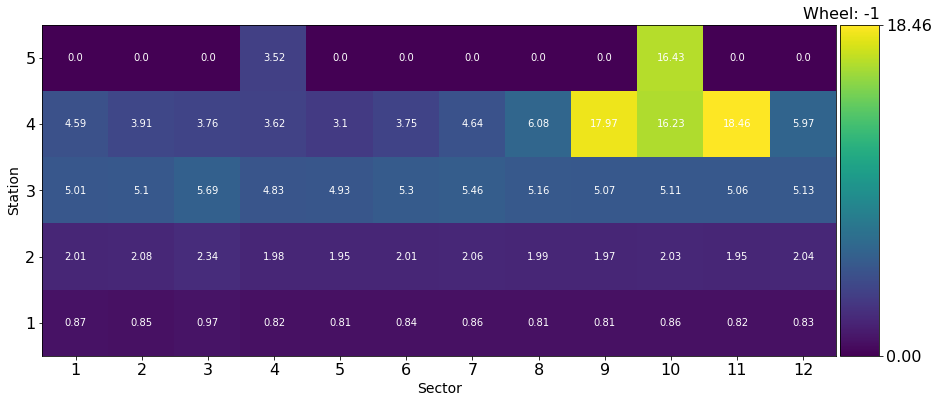

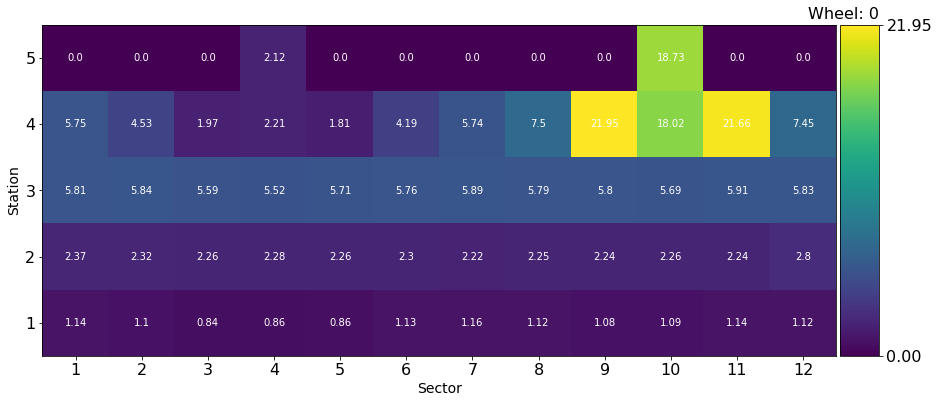

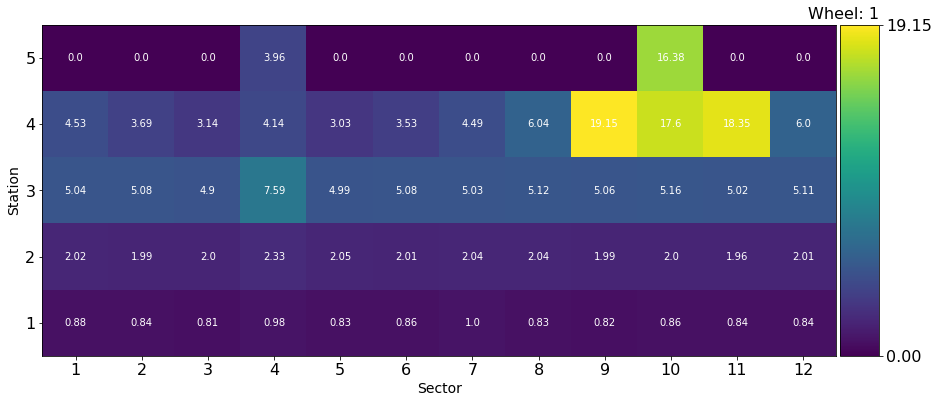

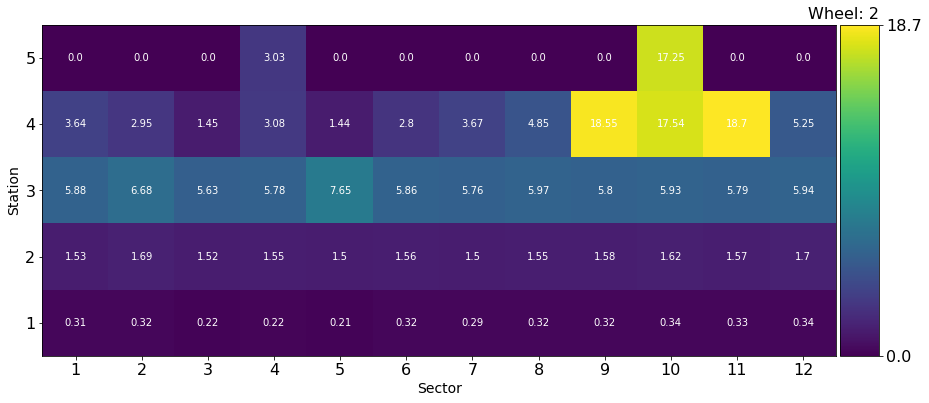

In [229]:
plot_scatter_2(ratio, "anomal", -2)
plot_scatter_2(ratio, "anomal", -1)
plot_scatter_2(ratio, "anomal", 0)
plot_scatter_2(ratio, "anomal", +1)
plot_scatter_2(ratio, "anomal", +2)

In [ ]:
dis_nn = "cae_score"
rule = (layers_test["score"] == -1) & (layers_test[dis_nn] > th_AE)
plot_scatter(layers_test[rule], 302634, -3, 100, -1)

In [ ]:
plot_scatter(layers_test[rule], 302634, -2, 100, -1)
plot_scatter(layers_test[rule], 302634, -1, 100, -1)
plot_scatter(layers_test[rule], 302634, 0, 100, -1)
plot_scatter(layers_test[rule], 302634, +1, 100, -1)
plot_scatter(layers_test[rule], 302634, +2, 100, -1)

Looking at how the recognized and unrecognized anomalies are distributed:

In [ ]:
print "ANOMALIES: NOT SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] < th_AE)
plot_scatter(layers_test[rule], 302634, -2, 100, -1)
print "ANOMALIES: SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] > th_AE)
plot_scatter(layers_test[rule], 302634, -2, 100, -1)

In [ ]:
print "ANOMALIES: NOT SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] < th_AE)
plot_scatter(layers_test[rule], 302634, -1, 100, -1)
print "ANOMALIES: SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] > th_AE)
plot_scatter(layers_test[rule], 302634, -1, 100, -1)

In [ ]:
print "ANOMALIES: NOT SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] < th_AE)
plot_scatter(layers_test[rule], 302634, 0, 100, -1)
print "ANOMALIES: SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] > th_AE)
plot_scatter(layers_test[rule], 302634, 0, 100, -1)

In [ ]:
print "ANOMALIES: NOT SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] < th_AE)
plot_scatter(layers_test[rule], 302634, +1, 100, -1)
print "ANOMALIES: SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] > th_AE)
plot_scatter(layers_test[rule], 302634, +1, 100, -1)

In [ ]:
print "ANOMALIES: NOT SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] < th_AE)
plot_scatter(layers_test[rule], 302634, +2, 100, -1)
print "ANOMALIES: SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] > th_AE)
plot_scatter(layers_test[rule], 302634, +2, 100, -1)

Where are the FPs located in time?

In [176]:
def plotFpVsLs(run, wheel, sector, station, title, df, algo, threshold, log, bound):
    fig, ax = plt.subplots()
    if log:
        ax.set_yscale('log')
    bins = np.linspace(0, bound, int(bound/10)+10)
    (n, bins, patches) = plt.hist(df[(df["score"] == -1) & (df[algo] > threshold)
                         #& (df["wheel"] == 2) &\
                         #& (df["sector"] == 4) &\
                         #& (df["station"] == 2) &\
                         & (df["run"] == run)\
                        ]["averageLS"],
             bins=bins, alpha=0.5, label="False positives")
    plt.hist(df[(df["score"] == 1) & (df[algo] > threshold)
                         #& (df["wheel"] == 2) &\
                         #& (df["sector"] == 4) &\
                         #& (df["station"] == 2) &\
                         & (df["run"] == run)\
                        ]["averageLS"],
             bins=bins, alpha=0.5, label="True positives")
    plt.plot(df[(df["run"] == run)]["averageLS"],\
             df[(df["run"] == run)]["lumi"], "ro",\
             alpha=0.5, label="Inst. Lumi. $(x 10^{30} Hz/cm^2)$")
    plt.title(title+str(run))
    plt.legend(loc='best')
    plt.ylabel('Frequency')
    plt.xlabel('Average LS')
    plt.grid(True)
    #plt.plot([bound, bound], [0, 100], color='r', linestyle='--', linewidth=2)
    plt.show()
    return n

def deduceLS(data):
    return data*10+5
anomalies["averageLS"] = anomalies["group"].apply(deduceLS)

In [ ]:
threshold = th_AE
plotFpVsLs(302634, 0, 0, 0, "Distribution of false positives: AE, ", layers_test, "cae_score",\
           threshold, True, boundaries[boundaries["run"] == 302634]["ls_end"])
#plotFpVsLs(302635, 0, 0, 0, "Distribution of false positives: AE, ", layers_test, "cae_score",\
           #threshold, True, boundaries[boundaries["run"] == 302635]["ls_end"])

Trying unsupervised algorithms:

In [327]:
from sklearn.neighbors import LocalOutlierFactor
threshold = 0.0
result_lof = []
for i in range(5, 500, 10):
    lofclf = LocalOutlierFactor(n_neighbors=i, contamination=0.2)#It has to be a odd number
    layers_test["lof_score"] = -lofclf.fit_predict(np.vstack(layers_test["content_red_scaled"].values))
    y_pred = 2*(layers_test["lof_score"] > threshold)-1
    tn, fp, fn, tp = confusion_matrix(layers_test["score"].astype(int), y_pred).ravel()
    result_lof.append([i, tn, fp, fn, tp])

In [333]:
for i in range(505, 1000, 100):
    lofclf = LocalOutlierFactor(n_neighbors=i, contamination=0.2)#It has to be a odd number
    layers_test["lof_score"] = -lofclf.fit_predict(np.vstack(layers_test["content_red_scaled"].values))
    y_pred = 2*(layers_test["lof_score"] > threshold)-1
    tn, fp, fn, tp = confusion_matrix(layers_test["score"].astype(int), y_pred).ravel()
    result_lof.append([i, tn, fp, fn, tp])

In [336]:
for i in range(1005, 2000, 200):
    lofclf = LocalOutlierFactor(n_neighbors=i, contamination=0.2)#It has to be a odd number
    layers_test["lof_score"] = -lofclf.fit_predict(np.vstack(layers_test["content_red_scaled"].values))
    y_pred = 2*(layers_test["lof_score"] > threshold)-1
    tn, fp, fn, tp = confusion_matrix(layers_test["score"].astype(int), y_pred).ravel()
    result_lof.append([i, tn, fp, fn, tp])

In [ ]:
for i in range(2005, 5000, 500):
    lofclf = LocalOutlierFactor(n_neighbors=i, contamination=0.2)#It has to be a odd number
    layers_test["lof_score"] = -lofclf.fit_predict(np.vstack(layers_test["content_scaled"].values))
    y_pred = 2*(layers_test["lof_score"] > threshold)-1
    tn, fp, fn, tp = confusion_matrix(layers_test["score"].astype(int), y_pred).ravel()
    result_lof.append([i, tn, fp, fn, tp])

In [337]:
fp_rate = []
tp_rate = []
for i in range(len(result_lof)):
    fp_rate.append([result_lof[i][0], result_lof[i][2]*1.0/(result_lof[i][1]+result_lof[i][2])])
    tp_rate.append([result_lof[i][0], result_lof[i][4]*1.0/(result_lof[i][3]+result_lof[i][4])])

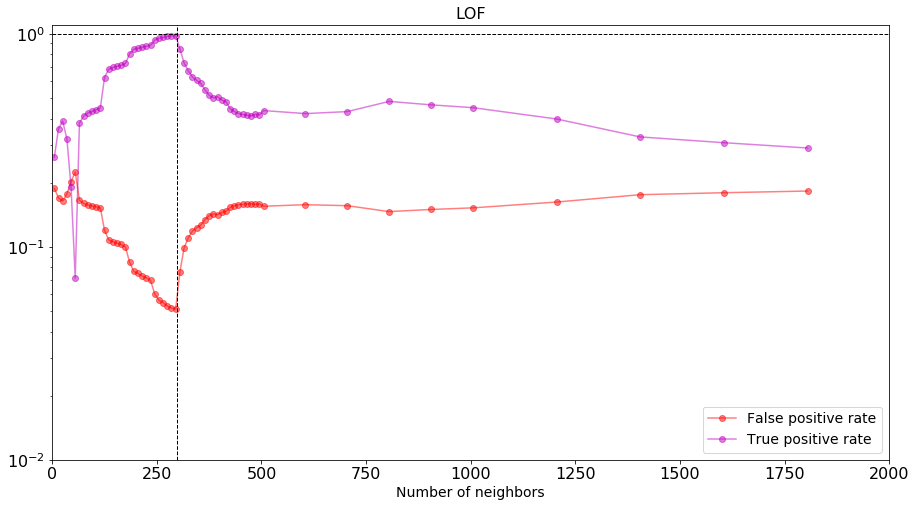

In [364]:
def plot_perf(der, rel, xaxis, yaxis, x1, x2, y1, y2, logx, logy):
    fig, ax = plt.subplots()
    if logy:
        ax.set_yscale('log')
    if logx:
        ax.set_xscale('log')
    a, b = zip(*der)
    c, d = zip(*rel)
    plt.ylim(y1, y2)
    plt.xlim(x1, x2)
    plt.plot(a, b, "ro-", alpha=0.5, label = "False positive rate")
    plt.plot(c, d, "mo-", alpha=0.5, label = "True positive rate")
    plt.axhline(1.00, color='k', linestyle='dashed', linewidth=1)
    #plt.axhline(0.01, color='g', linestyle='dashed', linewidth=1)
    if (xaxis == 'Number of neighbors'):
        plt.axvline(299, color='k', linestyle='dashed', linewidth=1)
    elif (xaxis == 'Contamination'):
        plt.axvline(0.18, color='k', linestyle='dashed', linewidth=1)
        plt.axhline(0.02, color='k', linestyle='dashed', linewidth=1)
    plt.title("LOF")
    plt.legend(loc='best')
    #plt.ylabel('Inertia')
    plt.xlabel(xaxis)
    plt.show()
    
plot_perf(fp_rate, tp_rate, 'Number of neighbors', '', 0, 2000, 0.01, 1.1, False, True)

In [359]:
threshold = 0.0
result_lof = []
for i in np.array(range(1, 500, 5))/1000.0:
    lofclf = LocalOutlierFactor(n_neighbors=299, contamination=i)#It has to be a odd number
    layers_test["lof_score"] = -lofclf.fit_predict(np.vstack(layers_test["content_red_scaled"].values))
    y_pred = 2*(layers_test["lof_score"] > threshold)-1
    tn, fp, fn, tp = confusion_matrix(layers_test["score"].astype(int), y_pred).ravel()
    result_lof.append([i, tn, fp, fn, tp])

In [360]:
fp_rate_c = []
tp_rate_c = []
for i in range(len(result_lof)):
    fp_rate_c.append([result_lof[i][0], result_lof[i][2]*1.0/(result_lof[i][1]+result_lof[i][2])])
    tp_rate_c.append([result_lof[i][0], result_lof[i][4]*1.0/(result_lof[i][3]+result_lof[i][4])])

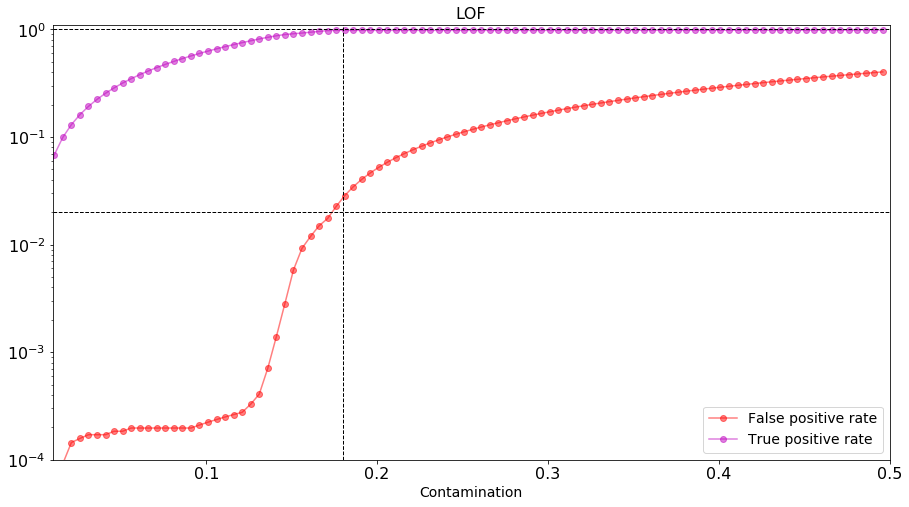

In [365]:
plot_perf(fp_rate_c, tp_rate_c, 'Contamination', '', 0.01, 0.5, 0.0001, 1.1, False, True)

In [392]:
# fit the model
from sklearn.neighbors import LocalOutlierFactor
lofclf = LocalOutlierFactor(n_neighbors=299,
                            contamination=0.15
                           )#It has to be a odd number
layers_test["lof_score"] = -lofclf.fit_predict(np.vstack(layers_test["content_red_scaled"].values))

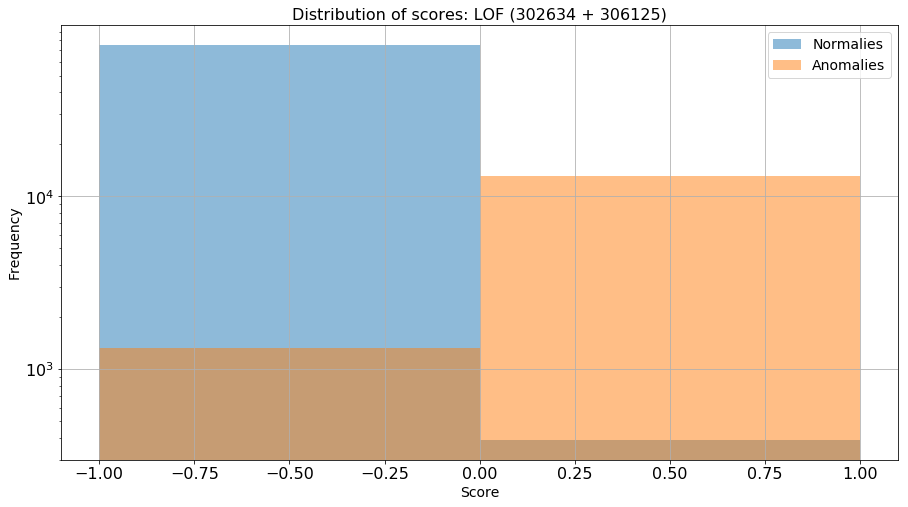

In [393]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(-1, +1, 3)
plt.hist(layers_test[layers_test["score"] < 0]["lof_score"], bins=bins, alpha=0.5, label="Normalies")
plt.hist(layers_test[layers_test["score"] > 0]["lof_score"], bins=bins, alpha=0.5, label="Anomalies")
plt.title("Distribution of scores: LOF (302634 + 306125)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.show()

Normalized confusion matrix
[[ 0.99488064  0.00511936]
 [ 0.09149786  0.90850214]]


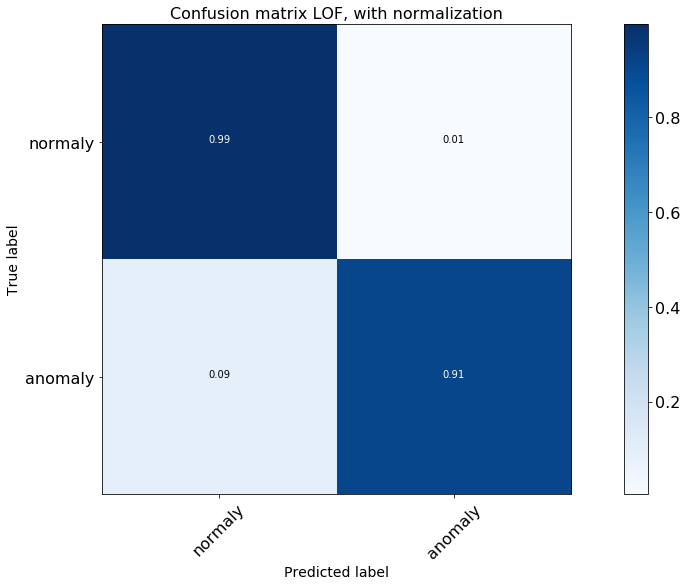

In [394]:
threshold = 0.0
y_pred = 2*(layers_test["lof_score"] > threshold)-1
cnf_matrix = confusion_matrix(layers_test["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix LOF, with normalization')

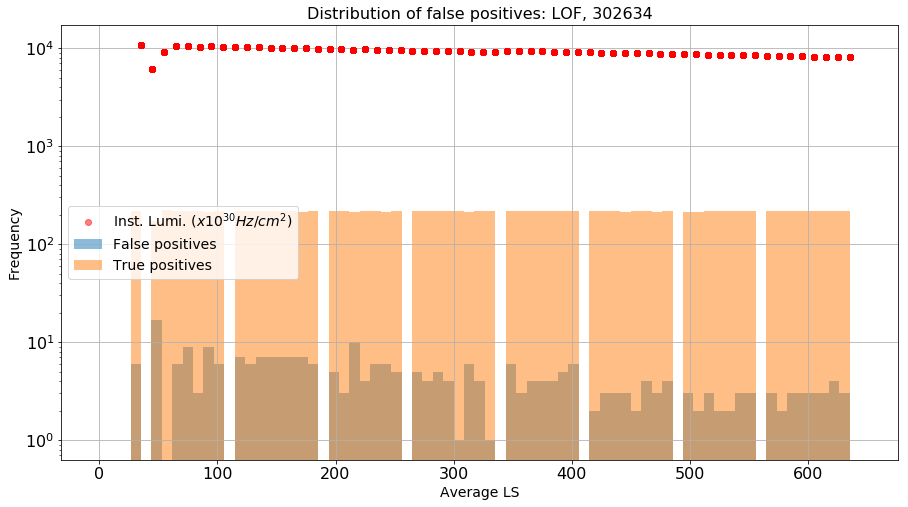

array([  0.,   0.,   0.,   6.,   0.,  17.,   0.,   6.,   9.,   3.,   9.,
         6.,   0.,   7.,   6.,   7.,   7.,   7.,   7.,   7.,   6.,   0.,
         5.,   3.,  10.,   4.,   6.,   6.,   5.,   0.,   5.,   4.,   5.,
         4.,   1.,   6.,   4.,   1.,   0.,   6.,   3.,   4.,   4.,   4.,
         5.,   6.,   0.,   2.,   3.,   3.,   3.,   2.,   4.,   3.,   4.,
         0.,   3.,   2.,   3.,   2.,   2.,   3.,   3.,   0.,   3.,   2.,
         3.,   3.,   3.,   3.,   4.,   3.,   0.])

In [395]:
layers_test["averageLS"] = layers_test["group"].apply(deduceLS)
threshold = 0.0
plotFpVsLs(302634, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
           threshold, True, boundaries[boundaries["run"] == 302634]["ls_end"])
#plotFpVsLs(302635, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
            #threshold, True, boundaries[boundaries["run"] == 302635]["ls_end"])

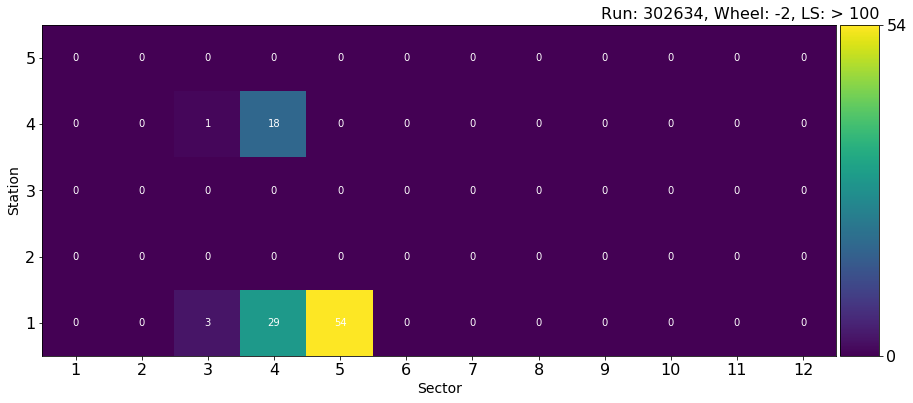

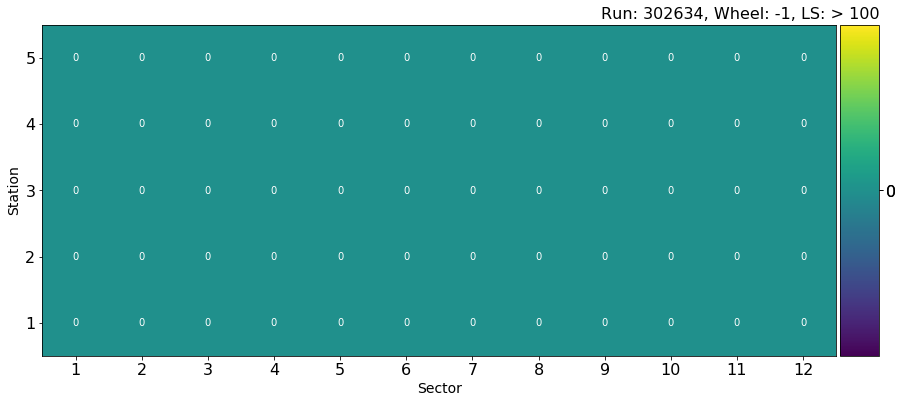

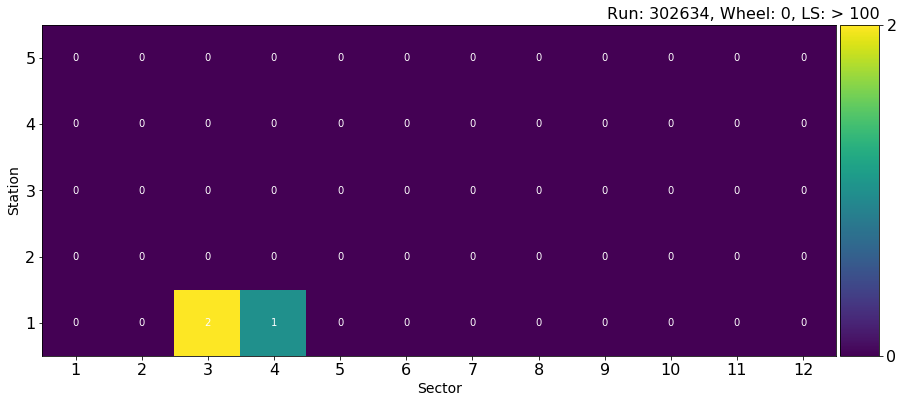

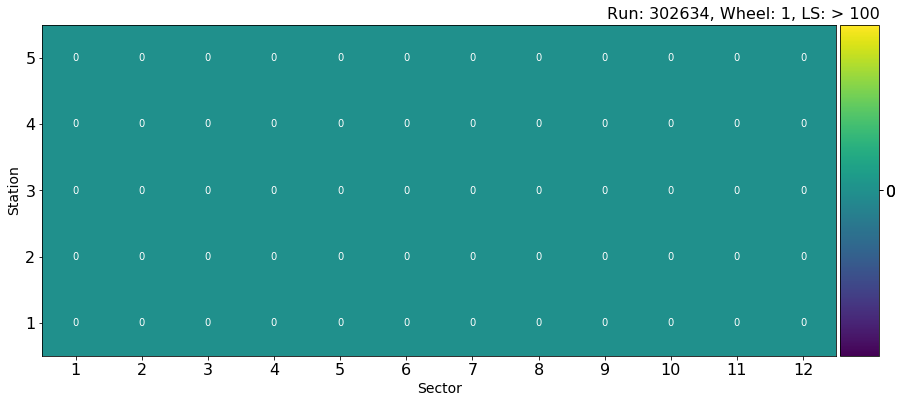

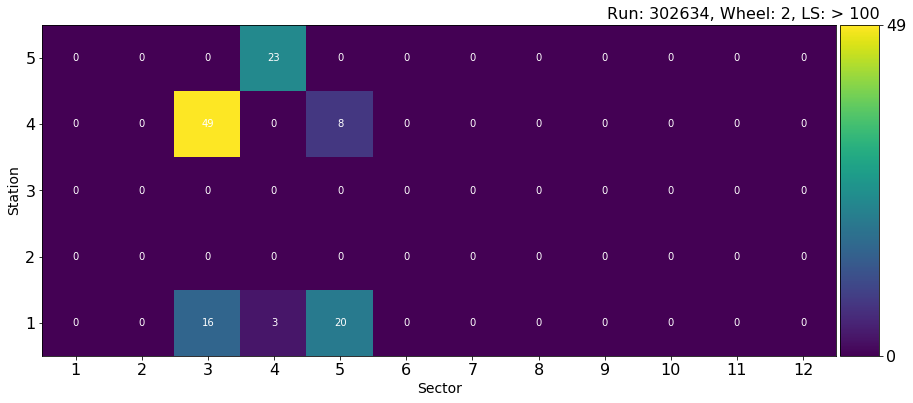

In [396]:
dis_nn = "lof_score"
rule = (layers_test["score"] == -1) & (layers_test[dis_nn] > 0)

plot_scatter(layers_test[rule], 302634, -2, 100, -1)
plot_scatter(layers_test[rule], 302634, -1, 100, -1)
plot_scatter(layers_test[rule], 302634, 0, 100, -1)
plot_scatter(layers_test[rule], 302634, +1, 100, -1)
plot_scatter(layers_test[rule], 302634, +2, 100, -1)

Trying KMeans:

In [295]:
def removeItem(data):
    index = [0, 4, 5, 6, 7, 9]
    temp = data.copy()
    temp = np.delete(temp, index)
    return temp

scaler_type = 2
layers_test["content_red"] = layers_test["content"].apply(removeItem)
layers_test["content_red"] = layers_test["content_red"].apply(np.array)
layers_test["content_red_scaled"] = layers_test["content_red"].apply(scale_data, args=[scaler_type])

In [296]:
print layers_test["content_red"].iloc[100]
print layers_test["content_red_scaled"].iloc[100]

[-2 2 1 0.3935031801033194]
[[-1.          1.          0.5         0.19675159]]


In [297]:
#n_cls = 150
#from sklearn import cluster, datasets
#k_means = cluster.KMeans(n_clusters=n_cls)
#distances = k_means.fit_transform(np.vstack(layers_test["content_red"].values))
#layers_test["kmeans_score"] = k_means.labels_

In [318]:
# load the model from disk
from sklearn.externals import joblib
filename = './model_sktlearn/kmeans_scale_prova.sav'
k_means = joblib.load(filename)

In [319]:
rule = (layers_test.run == 302634) #& (layers_test.score == 1)
reduced_anom = layers_test[rule].copy()

In [320]:
distances_test = k_means.transform(np.vstack(reduced_anom["content_red_scaled"].values))
minim = []
for i in range(0, len(distances_test)):
    #print  min(distances_test[i])
    minim.append(min(distances_test[i]))
reduced_anom["dist"] = minim

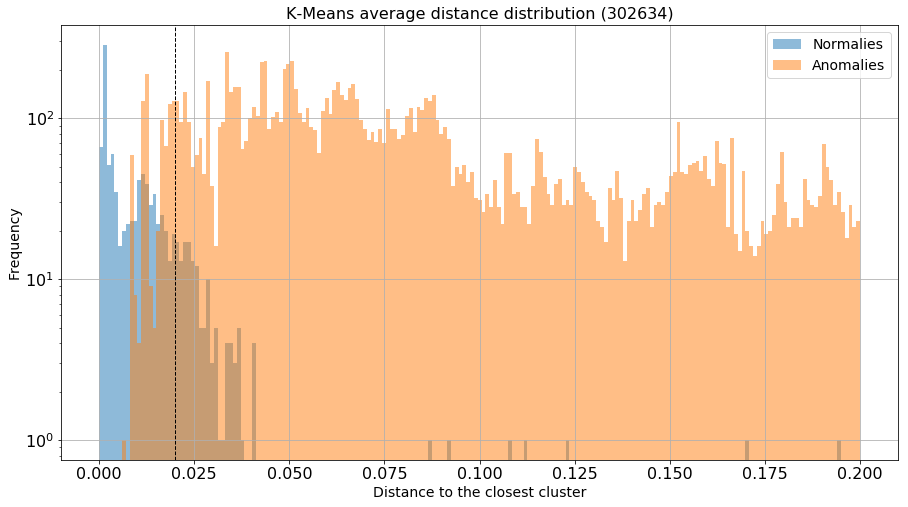

In [321]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, 0.2, 200)
plt.hist(reduced_anom[reduced_anom["score"] < 0]["dist"], bins=bins, alpha=0.5, label="Normalies")
plt.hist(reduced_anom[reduced_anom["score"] > 0]["dist"], bins=bins, alpha=0.5, label="Anomalies")
plt.axvline(0.02, color='k', linestyle='dashed', linewidth=1)
plt.title("K-Means average distance distribution (302634)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Distance to the closest cluster')
plt.show()

Normalized confusion matrix
[[ 0.85535198  0.14464802]
 [ 0.05797509  0.94202491]]


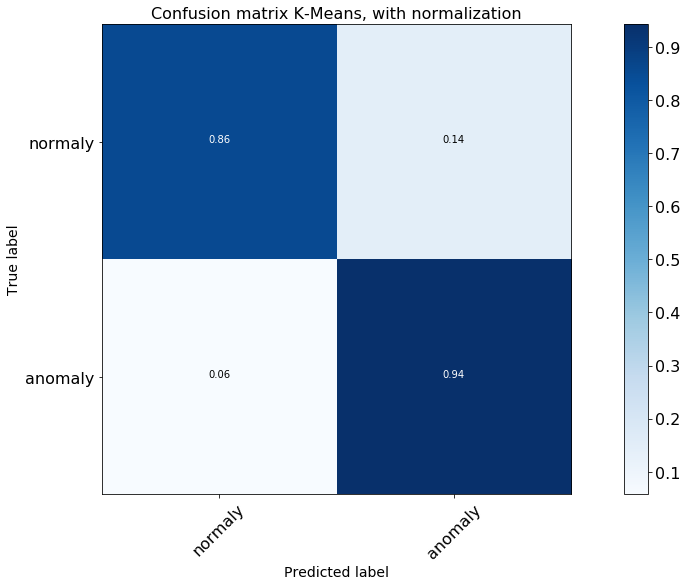

In [323]:
th_km = 0.02
y_pred = 2*(reduced_anom["dist"] > th_km)-1
cnf_matrix = confusion_matrix(reduced_anom["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix K-Means, with normalization')

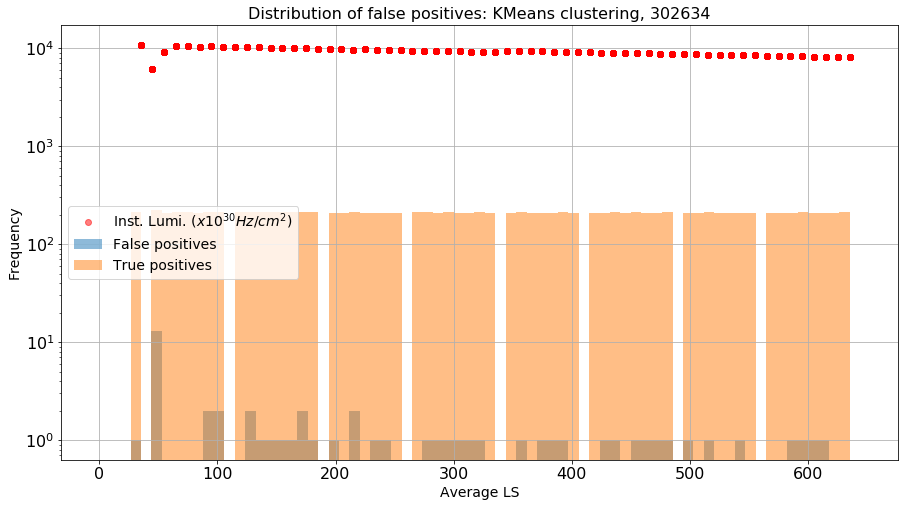

array([  0.,   0.,   0.,   1.,   0.,  13.,   0.,   0.,   0.,   0.,   2.,
         2.,   0.,   0.,   2.,   1.,   1.,   1.,   1.,   2.,   1.,   0.,
         1.,   0.,   2.,   0.,   1.,   1.,   0.,   0.,   0.,   1.,   1.,
         1.,   1.,   1.,   1.,   0.,   0.,   0.,   1.,   0.,   1.,   1.,
         1.,   0.,   0.,   0.,   1.,   1.,   0.,   1.,   1.,   1.,   1.,
         0.,   1.,   0.,   1.,   0.,   0.,   1.,   0.,   0.,   0.,   0.,
         1.,   1.,   1.,   1.,   0.,   0.,   0.])

In [306]:
threshold = th_km
plotFpVsLs(302634, 0, 0, 0, "Distribution of false positives: KMeans clustering, ", reduced_anom, "dist",\
           threshold, True, boundaries[boundaries["run"] == 302634]["ls_end"])
#plotFpVsLs(302635, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
            #threshold, True, boundaries[boundaries["run"] == 302635]["ls_end"])

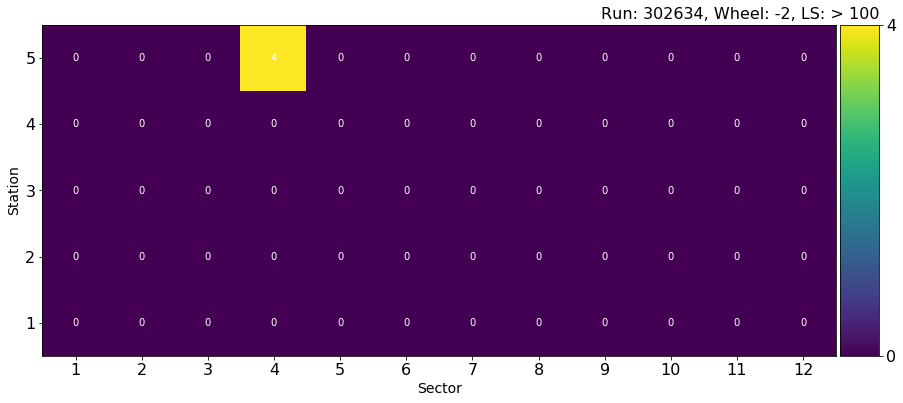

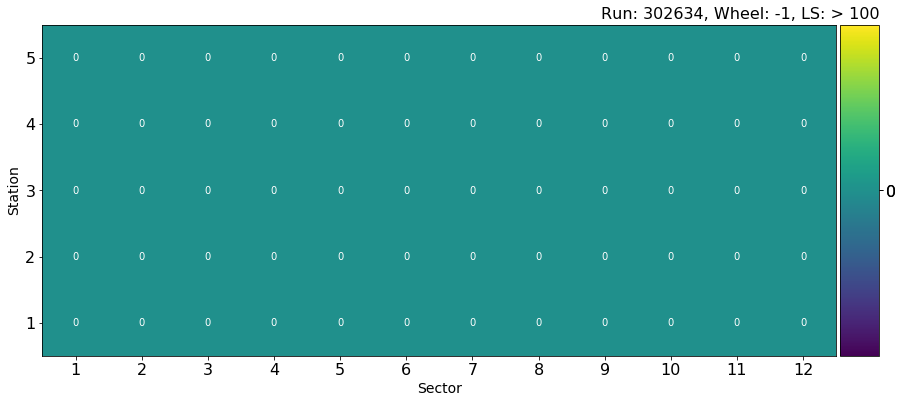

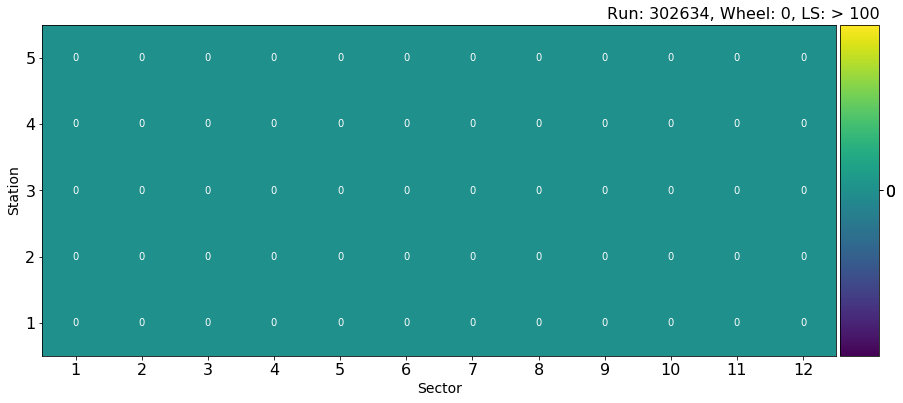

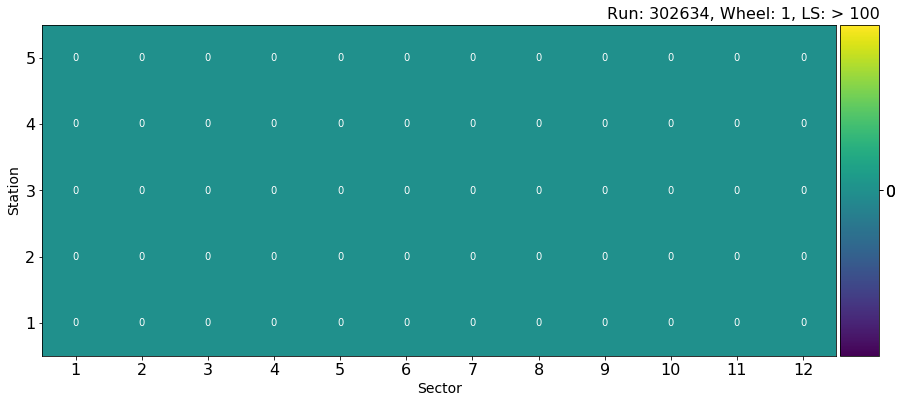

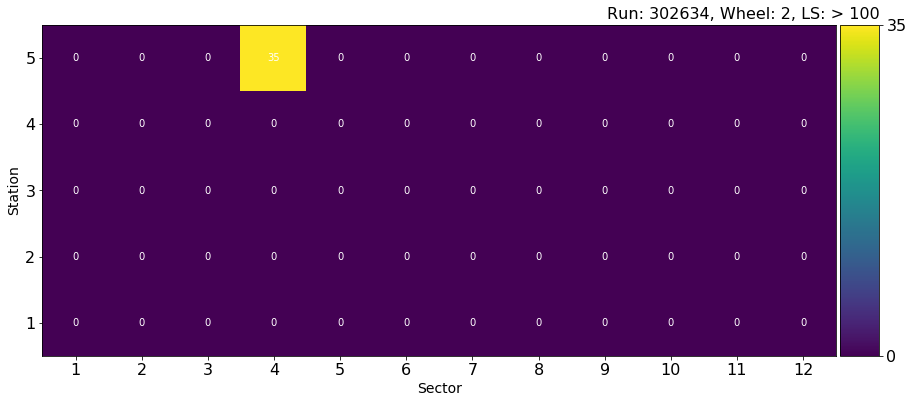

In [307]:
dis_nn = "dist"
rule = (reduced_anom["score"] == -1) & (reduced_anom[dis_nn] > th_km)

plot_scatter(reduced_anom[rule], 302634, -2, 100, -1)
plot_scatter(reduced_anom[rule], 302634, -1, 100, -1)
plot_scatter(reduced_anom[rule], 302634, 0, 100, -1)
plot_scatter(reduced_anom[rule], 302634, +1, 100, -1)
plot_scatter(reduced_anom[rule], 302634, +2, 100, -1)

ANOMALIES: NOT SELECTED WITH KMeans


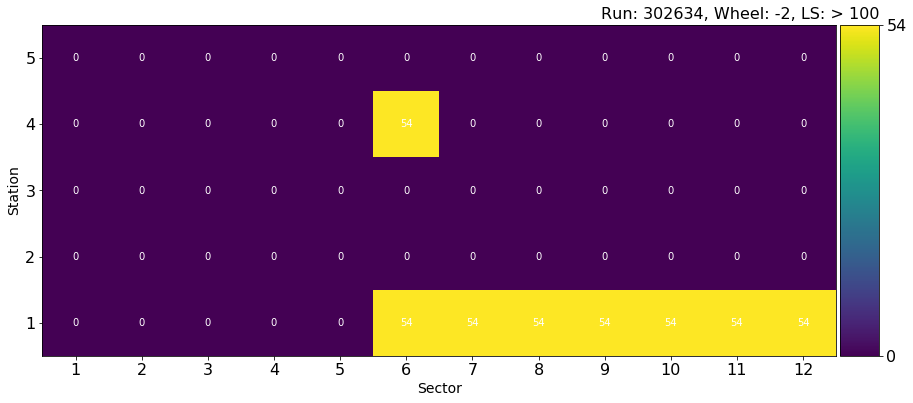

ANOMALIES: SELECTED WITH KMeans


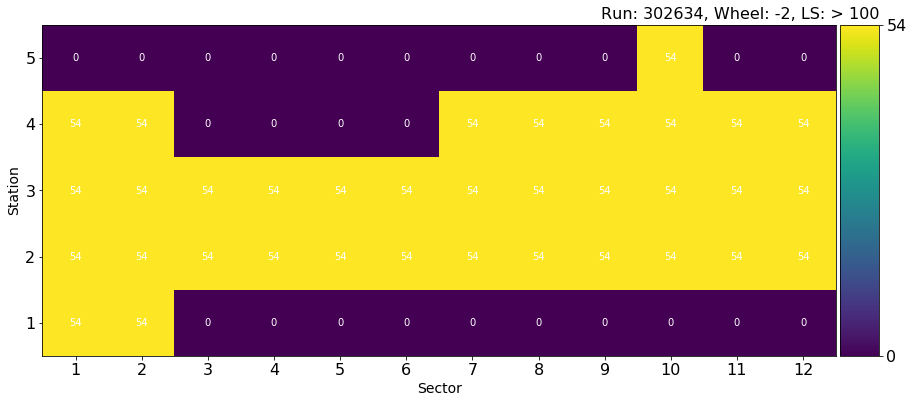

In [308]:
print "ANOMALIES: NOT SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] < th_km)
plot_scatter(reduced_anom[rule], 302634, -2, 100, -1)
print "ANOMALIES: SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] > th_km)
plot_scatter(reduced_anom[rule], 302634, -2, 100, -1)

ANOMALIES: NOT SELECTED WITH KMeans


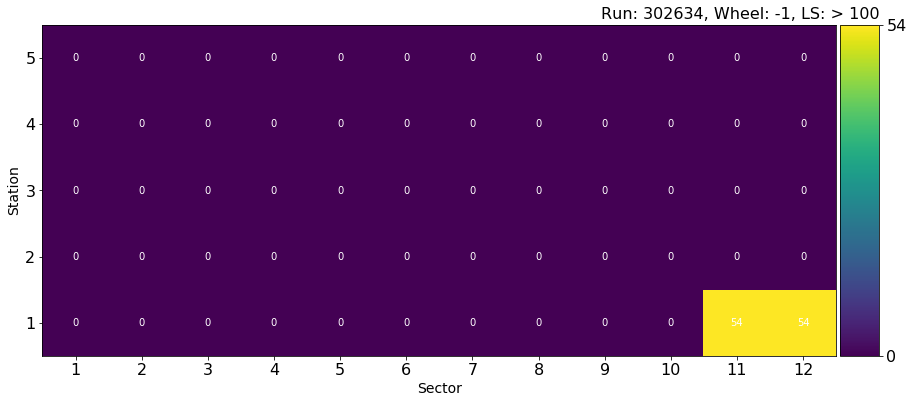

ANOMALIES: SELECTED WITH KMeans


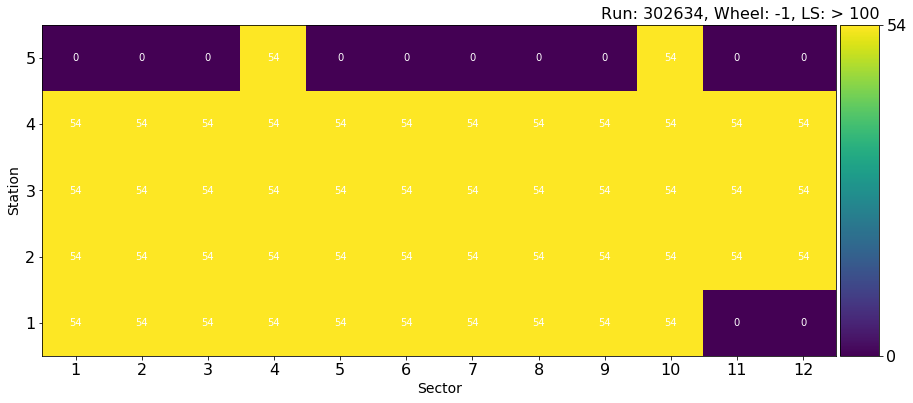

In [309]:
print "ANOMALIES: NOT SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] < th_km)
plot_scatter(reduced_anom[rule], 302634, -1, 100, -1)
print "ANOMALIES: SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] > th_km)
plot_scatter(reduced_anom[rule], 302634, -1, 100, -1)

ANOMALIES: NOT SELECTED WITH KMeans


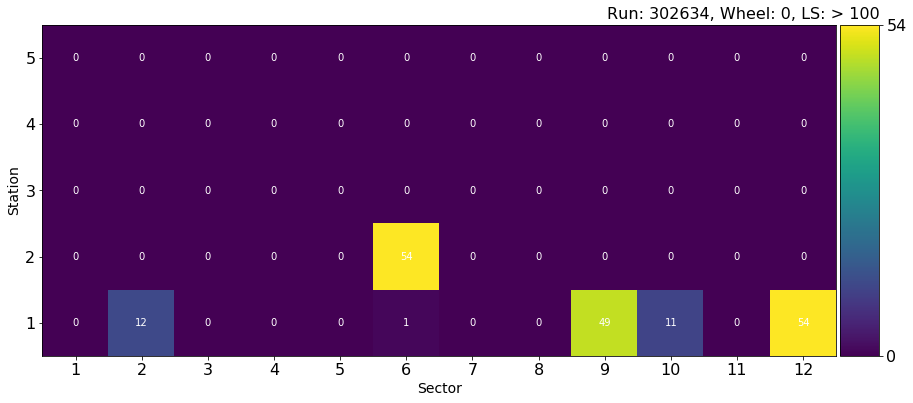

ANOMALIES: SELECTED WITH KMeans


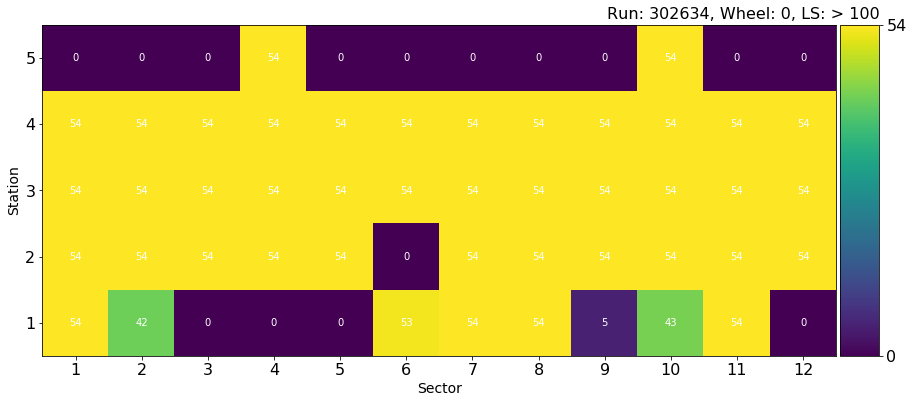

In [310]:
print "ANOMALIES: NOT SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] < th_km)
plot_scatter(reduced_anom[rule], 302634, 0, 100, -1)
print "ANOMALIES: SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] > th_km)
plot_scatter(reduced_anom[rule], 302634, 0, 100, -1)

ANOMALIES: NOT SELECTED WITH KMeans


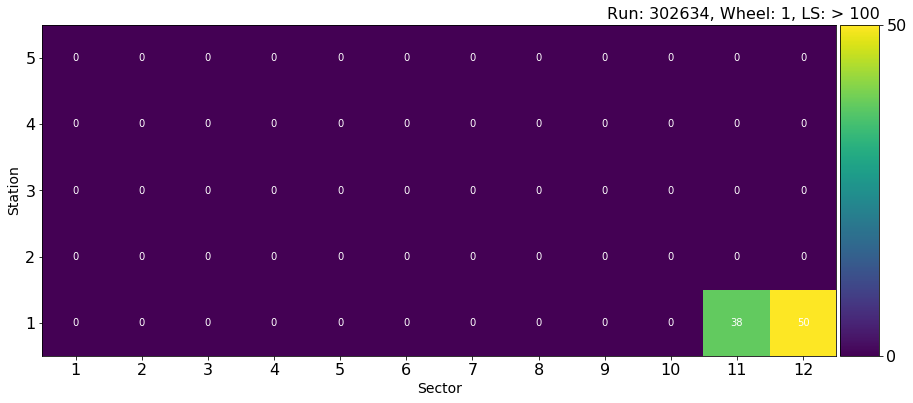

ANOMALIES: SELECTED WITH KMeans


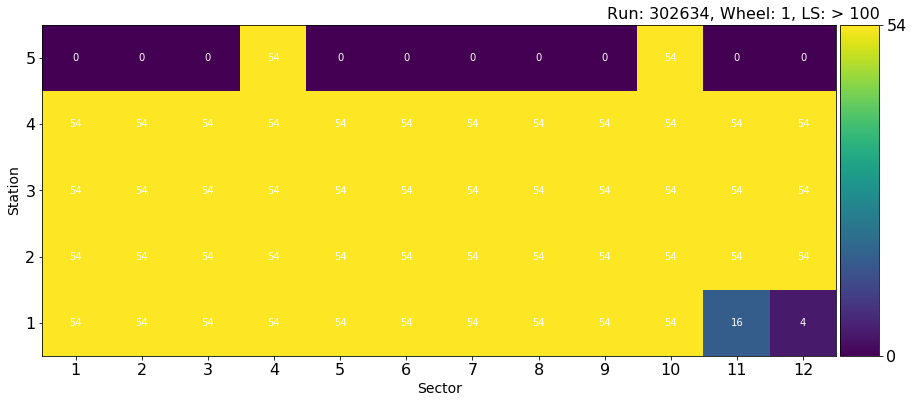

In [313]:
print "ANOMALIES: NOT SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] < th_km)
plot_scatter(reduced_anom[rule], 302634, +1, 100, -1)
print "ANOMALIES: SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] > th_km)
plot_scatter(reduced_anom[rule], 302634, +1, 100, -1)

ANOMALIES: NOT SELECTED WITH KMeans


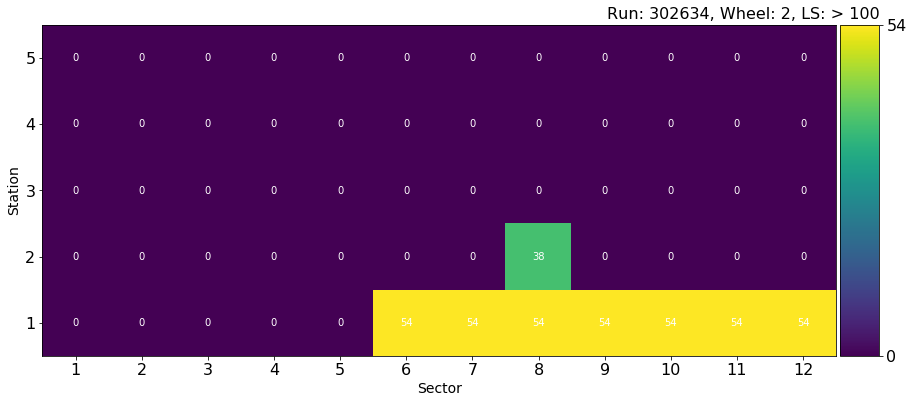

ANOMALIES: SELECTED WITH KMeans


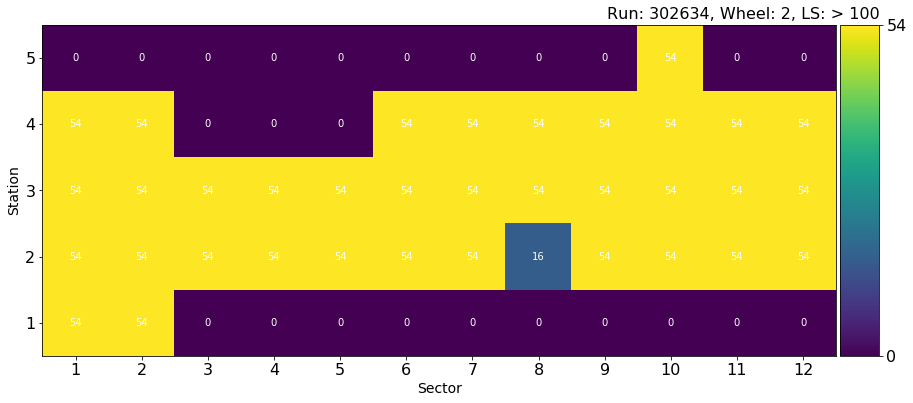

In [312]:
print "ANOMALIES: NOT SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] < th_km)
plot_scatter(reduced_anom[rule], 302634, +2, 100, -1)
print "ANOMALIES: SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] > th_km)
plot_scatter(reduced_anom[rule], 302634, +2, 100, -1)